In [1]:
import warnings
warnings.filterwarnings('ignore')
import sys
sys.path.append("C:/Users/zhipe/OneDrive/Desktop/Master thesis/demostration")

from causal_ensemble_model import *
from utilities_ensemble import *
from utilities_plotting import *
import numpy as np
import pandas as pd
import seaborn as sns 
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import accuracy_score
from scipy import stats
import matplotlib.pyplot as plt
import time

$${B(t+1)} = 0.99{A(t-2)}{B(t-1)} - 1.24{A(t-1)}{A(t-3)}^{2} + {\epsilon}_{1}$$
$${C(t+1)} = -1.06{I(t-1)}{C(t-1)} + 0.54{I(t)}^2 + 0.72{I(t-4)}^{2}{C(t-2)} + {\epsilon}_{2}$$
$${E(t+1)} = -0.86{A(t-5)} + 0.67{D(t)}- 0.88{A(t)}{D(t-3)} + {\epsilon}_{3}$$
$${F(t+1)} = 0.69{H(t-1)}^{2}{F(t)} - 0.59{\sin}({H(t)}) + {\epsilon}_{4}$$
$${G(t+1)} = 0.91{I(t-2)}^{2}{G(t-1)} + 0.66{I(t-3)}{G(t-3)} - 0.33{\exp}({I(t-1)}) + {\epsilon}_{5}$$
$${H(t+1)} = 1.18{C(t)} - 0.71{\cos}({C(t-2)}){H(t-2)} + {\epsilon}_{6}$$
$${J(t+1)} = 0.78{E(t-1)}{J(t-2)} + 1.02{E(t-5)} + {\epsilon}_{7}$$
$${K(t+1)} = 1.31{A(t-1)}^{2}{L(t)} - 1.14{L(t-1)}^{2}{A(t)} + {\epsilon}_{8}$$
$${L(t+1)} = 0.68{J(t-4)}{L(t-3)} + 0.26{L(t-1)}{I(t-1)}{J(t-1)}^{2} - 0.45{I(t-2)}{J(t-3)} + {\epsilon}_{9}$$

A->B I->C A,D->E C->H I->G        
H->F E->J I,J->L A,L->K

In [2]:
result = np.array([
    [0.,1.,0.,0.,1.,0.,0.,0.,0.,0.,1.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,1.,0.,0.,0.,0.],
    [0.,0.,0.,0.,1.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,1.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,1.,0.,0.,0.,0.,0.,0.],
    [0.,0.,1.,0.,0.,0.,1.,0.,0.,0.,0.,1.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,1.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,1.,0.]
 ])

In [3]:
np.random.seed(15)
A = np.random.rand(45006) 
np.random.seed(65)
B = np.random.rand(45006) 
np.random.seed(132)
C = np.random.rand(45006) 
np.random.seed(44)
D = np.random.rand(45006) 
np.random.seed(18)
E = np.random.rand(45006) 
np.random.seed(92)
F = np.random.rand(45006) 
np.random.seed(16)
G = np.random.rand(45006) 
np.random.seed(146)
H = np.random.rand(45006) 
np.random.seed(98)
I = np.random.rand(45006) 
np.random.seed(5)
J = np.random.rand(45006) 
np.random.seed(24)
K = np.random.rand(45006) 
np.random.seed(265)
L = np.random.rand(45006) 

np.random.seed(36)
e_1 = np.random.normal(size=(45006,)) / 100
np.random.seed(2)
e_2 = np.random.normal(size=(45006,)) / 100
np.random.seed(23)
e_3 = np.random.normal(size=(45006,)) / 100
np.random.seed(54)
e_4 = np.random.normal(size=(45006,)) / 100
np.random.seed(10)
e_5 = np.random.normal(size=(45006,)) / 100
np.random.seed(69)
e_6 = np.random.normal(size=(45006,)) / 100
np.random.seed(329)
e_7 = np.random.normal(size=(45006,)) / 100
np.random.seed(7)
e_8 = np.random.normal(size=(45006,)) / 100
np.random.seed(16)
e_9 = np.random.normal(size=(45006,)) / 100


list_0 = np.linspace(5,45004,45000).astype(int)
for i in list_0:
    B[i+1] = 0.99 * A[i-2] * B[i-1] - 1.24 * A[i-1] * A[i-3] ** 2 + e_1[i]
    C[i+1] = -1.06 * I[i-1] * C[i-1] + 0.54 * I[i] ** 2 + 0.72 * I[i-4] ** 2 * C[i-2] + e_2[i]
    E[i+1] = -0.86 * A[i-5] + 0.67 * D[i] - 0.88 * A[i] * D[i-3] + e_3[i]
    G[i+1] = 0.91 * I[i-2] ** 2 * G[i-1] + 0.66 * I[i-3] * G[i-3] - 0.33 * np.exp(I[i-1]) + e_5[i]
    H[i+1] = 1.41 * C[i] - 0.59 * np.cos(C[i-2]) * H[i-2] + e_6[i]
    
for i in list_0:
    F[i+1] = 0.69 * H[i-1] ** 2 * F[i-2] - 0.71 * np.sin(H[i]) + e_4[i]
    J[i+1] = 0.78 * E[i-1] * J[i-2] + 1.02 * E[i-5] + e_7[i]

for i in list_0:
    L[i+1] = 0.68 * J[i-4] * L[i-3] + 0.26 * L[i-1] * I[i-1] * J[i-1] ** 2 - 0.45 * I[i-2] * J[i-3] + e_9[i]
    
for i in list_0:
    K[i+1] = 1.31 * A[i-1] ** 2 * L[i] - 1.14 * L[i-1] ** 2 * A[i] + e_8[i]

A_0 = A[6:] * 100
B_0 = B[6:] * 100
C_0 = C[6:] * 100
D_0 = D[6:] * 100
E_0 = E[6:] * 100
F_0 = F[6:] * 100
G_0 = G[6:] * 100
H_0 = H[6:] * 100
I_0 = I[6:] * 100
J_0 = J[6:] * 100
K_0 = K[6:] * 100
L_0 = L[6:] * 100

df = pd.DataFrame({'$X^1$': A_0, '$X^2$': B_0, '$X^3$': C_0, '$X^4$': D_0, '$X^5$': E_0, '$X^6$': F_0, '$X^7$': G_0, '$X^8$': H_0,
                   '$X^9$': I_0, '$X^{10}$': J_0, '$X^{11}$': K_0, '$X^{12}$': L_0})

In [4]:
df

,$X^1$,$X^2$,$X^3$,$X^4$,$X^5$,$X^6$,$X^7$,$X^8$,$X^9$,$X^{10}$,$X^{11}$,$X^{12}$
0,30.591892,9.988850,-24.276394,39.377955,-67.960479,-51.304031,-24.062584,39.804202,38.855952,127.254394,-31.481996,1.727781
1,30.447436,-4.482490,9.393977,40.907261,0.925638,-28.971693,-29.519984,-46.724591,39.464279,79.073855,-10.393731,-20.537955
2,11.174128,2.457026,32.821011,50.990241,11.967886,39.667010,-37.017832,-35.582536,33.752558,56.385544,-4.283002,47.097484
3,24.989901,-13.340457,-3.168458,71.014799,-4.241775,17.588446,-51.267900,24.334319,8.255076,20.459663,6.200001,5.875681
4,91.762990,-0.328188,-12.187989,96.052623,17.008043,-20.315843,-57.840514,23.667827,36.519776,94.450149,-5.622633,-20.447483
...,...,...,...,...,...,...,...,...,...,...,...,...
44995,25.871218,-40.910892,-9.358256,30.595760,32.895966,-2.214773,-97.898840,21.471404,29.601962,-39.841771,0.659738,5.879439
44996,91.458314,-24.083978,0.724154,70.542446,-48.252004,-13.987287,-126.973715,-10.284263,2.147692,-4.731443,-0.114114,7.862953
44997,94.101541,-6.004550,5.479599,49.720360,-56.794304,6.694143,-99.258229,-2.664298,2.986795,33.083581,-0.188160,10.503206
44998,84.313293,-6.843311,-1.398487,66.642222,-82.510841,2.965016,-67.025388,-5.934387,43.971090,-102.069823,9.446057,-2.854837


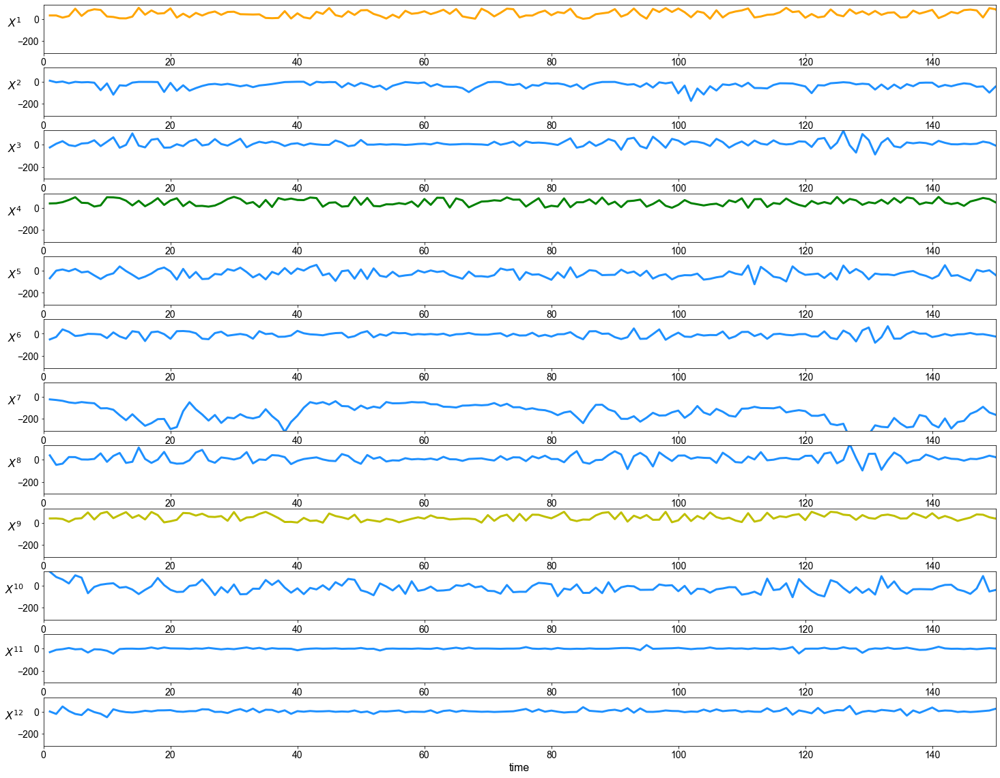

In [15]:
X = np.linspace(1,45000,45000).astype(int)
f_0, axes_0 = plt.subplots(12, 1, figsize=(25,20))

for i in range(9):
    k=i+1
    plt.subplot(12, 1, k)
    if k==1:
        plt.plot(X, df[f'$X^{k}$'], linewidth=3,color='orange')
    elif k==4:
        plt.plot(X, df[f'$X^{k}$'], linewidth=3,color='green')
    elif k==9:
        plt.plot(X, df[f'$X^{k}$'], linewidth=3,color='y')
    else:
        plt.plot(X, df[f'$X^{k}$'], linewidth=3,color='dodgerblue')
    plt.ylabel(f'$X^{k}$', fontproperties = 'Arial', size=16, rotation=0)
    plt.yticks(fontproperties = 'Arial', size = 14)
    plt.xticks(fontproperties = 'Arial', size = 14)
    plt.xlim((0,150))
    plt.ylim((-310,130))
    
plt.subplot(12, 1, 10)
plt.plot(X, df['$X^{10}$'], linewidth=3, color='dodgerblue')
plt.ylabel('$X^{10}$', fontproperties = 'Arial', size=16, rotation=0)
plt.yticks(fontproperties = 'Arial', size = 14)
plt.xticks(fontproperties = 'Arial', size = 14)
plt.xlim((0,150))
plt.ylim((-310,130))

plt.subplot(12, 1, 11)
plt.plot(X, df['$X^{11}$'], linewidth=3, color='dodgerblue')
plt.ylabel('$X^{11}$', fontproperties = 'Arial', size=16, rotation=0)
plt.yticks(fontproperties = 'Arial', size = 14)
plt.xticks(fontproperties = 'Arial', size = 14)
plt.xlim((0,150))
plt.ylim((-310,130))

plt.subplot(12, 1, 12)
plt.plot(X, df['$X^{12}$'], linewidth=3, color='dodgerblue')
plt.xlabel('time', fontproperties = 'Arial', size=16)
plt.ylabel('$X^{12}$', fontproperties = 'Arial', size=16, rotation=0)
plt.yticks(fontproperties = 'Arial', size = 14)
plt.xticks(fontproperties = 'Arial', size = 14)
plt.xlim((0,150))
plt.ylim((-310,130))

plt.subplots_adjust(wspace=0.3, hspace=0.3)

plt.savefig('C:/Users/zhipe/OneDrive/Desktop/Master thesis/codes/examples/results/4_03.jpg', 
            bbox_inches = 'tight',
            pad_inches=0.2,
            dpi=300)

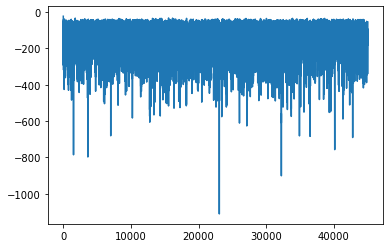

In [6]:
X = np.linspace(0,44999,45000)
y = G_0
plt.plot(X,y)

In [7]:
data_use = df
feature_names = data_use.columns.tolist()

In [8]:
df_process = df.copy()

for i in feature_names:
    q3, q1 = np.percentile(df_process[i], [90 ,10])
    iqr = q3 - q1
    upper = q3 + 2 * iqr
    lower = q1 - 2 * iqr
    df_process[i][df_process[i]>upper] = (upper + 0.01)
    df_process[i][df_process[i]<lower] = (lower - 0.01)

    n = len(df_process)
    j = 1
    while j < (n-1):
        if df_process[i][j] > upper or df_process[i][j] < lower:
            n_start = j-1
            n_end = j+1
            for k in range(n):
                if df_process[i][n_end] > upper or df_process[i][n_end] < lower:
                    n_end += 1
                    if n_end == n-1:
                        break
                else: 
                    break
            num = n_end - n_start - 1
            for l in range(num):
                df_process[i][j+l] = ((df_process[i][n_end] 
                                       - df_process[i][n_start]) 
                                      / (num+1) 
                                      * (l+1) 
                                      + df_process[i][n_start])
            j += num
        j += 1
                              
df_process    


,$X^1$,$X^2$,$X^3$,$X^4$,$X^5$,$X^6$,$X^7$,$X^8$,$X^9$,$X^{10}$,$X^{11}$,$X^{12}$
0,30.591892,9.988850,-24.276394,39.377955,-67.960479,-51.304031,-24.062584,39.804202,38.855952,127.254394,-31.481996,1.727781
1,30.447436,-4.482490,9.393977,40.907261,0.925638,-28.971693,-29.519984,-46.724591,39.464279,79.073855,-10.393731,-20.537955
2,11.174128,2.457026,32.821011,50.990241,11.967886,39.667010,-37.017832,-35.582536,33.752558,56.385544,-4.283002,47.097484
3,24.989901,-13.340457,-3.168458,71.014799,-4.241775,17.588446,-51.267900,24.334319,8.255076,20.459663,6.200001,5.875681
4,91.762990,-0.328188,-12.187989,96.052623,17.008043,-20.315843,-57.840514,23.667827,36.519776,94.450149,-5.622633,-20.447483
...,...,...,...,...,...,...,...,...,...,...,...,...
44995,25.871218,-40.910892,-9.358256,30.595760,32.895966,-2.214773,-97.898840,21.471404,29.601962,-39.841771,0.659738,5.879439
44996,91.458314,-24.083978,0.724154,70.542446,-48.252004,-13.987287,-126.973715,-10.284263,2.147692,-4.731443,-0.114114,7.862953
44997,94.101541,-6.004550,5.479599,49.720360,-56.794304,6.694143,-99.258229,-2.664298,2.986795,33.083581,-0.188160,10.503206
44998,84.313293,-6.843311,-1.398487,66.642222,-82.510841,2.965016,-67.025388,-5.934387,43.971090,-102.069823,9.446057,-2.854837


In [9]:
ce = causal_ensemble(df_process, feature_names, num_parts=15, threshold=0.3)

# 1. CCM 

In [10]:
start = time.time()

causal_ccm_parts = ce.ccm(lag=1, 
                          embed=6, 
                          split_percent=0.75, 
                          num_iter=25, 
                          convergence_threshold=0.03)

end = time.time()
print(end-start)

492.4612190723419


In [11]:
causal_ccm_parts

array([[[0.    , 0.4267, 0.    , ..., 0.    , 0.3515, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.433 ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.5707],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ]],

       [[0.    , 0.4074, 0.    , ..., 0.    , 0.3386, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.4279],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.5375, 0.    ]],

       [[0.    , 0.3831, 0.    , ..., 0.    , 0.3091, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0. 

# 2. TE

In [12]:
start = time.time()

causal_nte_parts = ce.nte(k=6, max_lag=6)

end = time.time()
print(end-start)

6366.834264278412


In [13]:
causal_nte_parts

array([[[0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.393 , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.3813, 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.3911, 0.393 ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.6572, 0.    ]],

       [[0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.3284, 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.3175],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.6433, 0.    ]],

       [[0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0. 

# 3. PCMCI

In [14]:
start = time.time()

pc_alpha = 0.05
causal_pcmciplus_parts = ce.pcmciplus(max_lag=6, 
                                      pc_alpha=pc_alpha, 
                                      cond_ind_test='parCorr')

end = time.time()
print(end-start)


##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.05]
max_conds_dim = None
max_combinations = 1



## Variable $X^1$

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:

    Link ($X^1$ -1) --> $X^1$ (1/72):

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.05]
max_conds_dim = None
max_combinations = 1



## Variable $X^1$

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):
##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:

Testing condition sets of dimension 0:

    Link ($X^1$ -1) --> $X^1$ (1/72):

independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.05]
max_conds_dim = None
max_combinations = 1



## Variable $X^1$

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1

    Subset 0: () gives pval = 0.50812 / val = -0.010
    Non-significance detected.

    Link ($X^1$ -3) --> $X^1$ (3/72):
    Subset 0: () gives pval = 0.98290 / val =  0.000
    Non-significance detected.

    Link ($X^1$ -4) --> $X^1$ (4/72):
    Subset 0: () gives pval = 0.86773 / val = -0.002
    Non-significance detected.
    Subset 0: () gives pval = 0.99820 / val =  0.000
    Link ($X^1$ -4) --> $X^1$ (4/72):    Subset 0: () gives pval = 0.28221 / val = -0.016

    Non-significance detected.

    Link ($X^1$ -3) --> $X^1$ (3/72):
    Non-significance detected.

    Link ($X^1$ -3) --> $X^1$ (3/72):

    Subset 0: () gives pval = 0.70183 / val = -0.006
    Non-significance detected.

    Link ($X^1$ -4) --> $X^1$ (4/72):
    Subset 0: () gives pval = 0.90848 / val = -0.002
    Non-significance detected.

    Link ($X^1$ -4) --> $X^1$ (4/72):
    Subset 0: () gives pval = 0.17347 / val =  0.020
    Non-significance detected.

    Link ($X^1$ -4) --> $X^1$ (4/72):
    Subset 0: ()

    Subset 0: () gives pval = 0.04106 / val =  0.030    Subset 0: () gives pval = 0.23575 / val = -0.018    Subset 0: () gives pval = 0.30395 / val =  0.015    Subset 0: () gives pval = 0.52286 / val =  0.010    Subset 0: () gives pval = 0.56224 / val =  0.009

    Non-significance detected.

    Link ($X^2$ -2) --> $X^1$ (8/72):

    Non-significance detected.

    Link ($X^2$ -3) --> $X^1$ (9/72):
    Subset 0: () gives pval = 0.78260 / val = -0.004    Non-significance detected.

    Non-significance detected.

    Link ($X^2$ -3) --> $X^1$ (9/72):


    Link ($X^2$ -3) --> $X^1$ (9/72):
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.73446 / val =  0.005    Subset 0: () gives pval = 0.83182 / val =  0.003
    Non-significance detected.
    Non-significance detected.

    Link ($X^2$ -3) --> $X^1$ (9/72):

    Non-significance detected.

    Link ($X^2$ -3) --> $X^1$ (9/72):


    Link ($X^2$ -1) --> $X^1$ (7/72):
    Link ($X^2$ -2) --> $X^1$ (8/72):

    Subs

    Subset 0: () gives pval = 0.72278 / val = -0.005
    Non-significance detected.

    Link ($X^3$ -1) --> $X^1$ (13/72):
    Non-significance detected.    Subset 0: () gives pval = 0.99876 / val = -0.000
    Subset 0: () gives pval = 0.47199 / val =  0.011
    Non-significance detected.

    Link ($X^3$ -1) --> $X^1$ (13/72):

    Link ($X^3$ -1) --> $X^1$ (13/72):    Subset 0: () gives pval = 0.67866 / val =  0.006

    Non-significance detected.

    Link ($X^2$ -6) --> $X^1$ (12/72):
    Subset 0: () gives pval = 0.60497 / val =  0.008
    Non-significance detected.


    Link ($X^3$ -2) --> $X^1$ (14/72):
    Non-significance detected.

    Link ($X^2$ -6) --> $X^1$ (12/72):
    Subset 0: () gives pval = 0.09458 / val = -0.025
    Non-significance detected.

    Link ($X^2$ -5) --> $X^1$ (11/72):
    Subset 0: () gives pval = 0.81076 / val =  0.004
    Non-significance detected.

    Link ($X^3$ -2) --> $X^1$ (14/72):
    Subset 0: () gives pval = 0.59824 / val =  0.008
    Non-

    Subset 0: () gives pval = 0.34475 / val = -0.014
    Non-significance detected.

    Link ($X^3$ -6) --> $X^1$ (18/72):
    Subset 0: () gives pval = 0.81696 / val =  0.003    Subset 0: () gives pval = 0.26659 / val = -0.017    Subset 0: () gives pval = 0.47631 / val = -0.011
    Non-significance detected.

    Link ($X^4$ -1) --> $X^1$ (19/72):

    Non-significance detected.

    Link ($X^4$ -1) --> $X^1$ (19/72):

    Non-significance detected.

    Link ($X^3$ -5) --> $X^1$ (17/72):
    Subset 0: () gives pval = 0.35936 / val = -0.014
    Non-significance detected.

    Link ($X^3$ -6) --> $X^1$ (18/72):
    Subset 0: () gives pval = 0.27817 / val =  0.016    Subset 0: () gives pval = 0.86758 / val =  0.002    Subset 0: () gives pval = 0.23023 / val =  0.018

    Non-significance detected.

    Link ($X^3$ -6) --> $X^1$ (18/72):

    Subset 0: () gives pval = 0.82094 / val =  0.003    Non-significance detected.    Non-significance detected.
    Non-significance detected.

    L

    Subset 0: () gives pval = 0.30830 / val =  0.015    Subset 0: () gives pval = 0.03878 / val = -0.031
    Non-significance detected.

    Link ($X^5$ -1) --> $X^1$ (25/72):
    Subset 0: () gives pval = 0.22489 / val =  0.018
    No conditions of dimension 0 left.

    Link ($X^5$ -3) --> $X^1$ (27/72):

    Non-significance detected.

    Link ($X^5$ -1) --> $X^1$ (25/72):
    Subset 0: () gives pval = 0.38154 / val =  0.013
    Non-significance detected.

    Link ($X^4$ -6) --> $X^1$ (24/72):
    Subset 0: () gives pval = 0.49797 / val = -0.010
    Non-significance detected.

    Link ($X^5$ -3) --> $X^1$ (27/72):    Subset 0: () gives pval = 0.66453 / val =  0.006

    Subset 0: () gives pval = 0.40444 / val = -0.012
    Non-significance detected.

    Link ($X^5$ -4) --> $X^1$ (28/72):
    Non-significance detected.    Subset 0: () gives pval = 0.04737 / val =  0.030

    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^1$ (26/72):

    Link ($X^5$ -3) --> $X^1$ (

    Subset 0: () gives pval = 0.40869 / val =  0.012    Subset 0: () gives pval = 0.54176 / val = -0.009
    Non-significance detected.

    Link ($X^5$ -5) --> $X^1$ (29/72):

    Non-significance detected.

    Link ($X^5$ -5) --> $X^1$ (29/72):
    Subset 0: () gives pval = 0.21763 / val =  0.018
    Non-significance detected.

    Link ($X^6$ -1) --> $X^1$ (31/72):
    Subset 0: () gives pval = 0.02291 / val = -0.034    Subset 0: () gives pval = 0.72564 / val =  0.005

    Non-significance detected.

    Link ($X^6$ -2) --> $X^1$ (32/72):
    Subset 0: () gives pval = 0.46405 / val =  0.011    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^1$ (32/72):
    Subset 0: () gives pval = 0.27393 / val =  0.016
    Non-significance detected.

    Link ($X^6$ -1) --> $X^1$ (31/72):

    Non-significance detected.

    Link ($X^5$ -6) --> $X^1$ (30/72):
    Subset 0: () gives pval = 0.61078 / val =  0.008
    Non-significance detected.

    Link ($X^5$ -5) --> $X^1$ (29/72):


    Subset 0: () gives pval = 0.48212 / val =  0.010    Subset 0: () gives pval = 0.01892 / val =  0.035
    No conditions of dimension 0 left.

    Link ($X^6$ -3) --> $X^1$ (33/72):

    Subset 0: () gives pval = 0.17729 / val =  0.020    Non-significance detected.
    Non-significance detected.

    Link ($X^6$ -4) --> $X^1$ (34/72):


    Link ($X^7$ -1) --> $X^1$ (37/72):
    Subset 0: () gives pval = 0.38568 / val = -0.013
    Non-significance detected.

    Link ($X^6$ -4) --> $X^1$ (34/72):    Subset 0: () gives pval = 0.45289 / val =  0.011

    Non-significance detected.

    Link ($X^7$ -1) --> $X^1$ (37/72):
    Subset 0: () gives pval = 0.25911 / val =  0.017
    Subset 0: () gives pval = 0.47743 / val =  0.011    Subset 0: () gives pval = 0.91501 / val = -0.002    Non-significance detected.

    Link ($X^6$ -4) --> $X^1$ (34/72):


    Non-significance detected.

    Link ($X^6$ -6) --> $X^1$ (36/72):
    Subset 0: () gives pval = 0.87235 / val = -0.002
    Non-significan

    Subset 0: () gives pval = 0.48567 / val =  0.010
    Non-significance detected.

    Link ($X^7$ -6) --> $X^1$ (42/72):
    Subset 0: () gives pval = 0.81500 / val =  0.003
    Non-significance detected.

    Link ($X^7$ -5) --> $X^1$ (41/72):
    Subset 0: () gives pval = 0.97403 / val = -0.000
    Non-significance detected.

    Link ($X^7$ -6) --> $X^1$ (42/72):
    Subset 0: () gives pval = 0.01492 / val =  0.036
    No conditions of dimension 0 left.

    Link ($X^8$ -3) --> $X^1$ (45/72):
    Subset 0: () gives pval = 0.47588 / val =  0.011    Subset 0: () gives pval = 0.12558 / val = -0.023
    Non-significance detected.

    Link ($X^7$ -4) --> $X^1$ (40/72):

    Non-significance detected.

    Link ($X^8$ -1) --> $X^1$ (43/72):
    Subset 0: () gives pval = 0.47748 / val = -0.011    Subset 0: () gives pval = 0.54004 / val =  0.009
    Non-significance detected.

    Link ($X^7$ -5) --> $X^1$ (41/72):
    Subset 0: () gives pval = 0.92242 / val =  0.001

    Non-significan

    Subset 0: () gives pval = 0.45487 / val =  0.011    Subset 0: () gives pval = 0.47745 / val = -0.011
    Non-significance detected.
    Subset 0: () gives pval = 0.22130 / val =  0.018


    Link ($X^8$ -5) --> $X^1$ (47/72):    Non-significance detected.    Non-significance detected.

    Link ($X^8$ -3) --> $X^1$ (45/72):
    Subset 0: () gives pval = 0.00852 / val = -0.039

    No conditions of dimension 0 left.

    Link ($X^9$ -2) --> $X^1$ (50/72):


    Link ($X^8$ -6) --> $X^1$ (48/72):
    Subset 0: () gives pval = 0.40572 / val =  0.012
    Subset 0: () gives pval = 0.14654 / val = -0.022    Non-significance detected.

    Link ($X^9$ -2) --> $X^1$ (50/72):

    Non-significance detected.

    Link ($X^8$ -3) --> $X^1$ (45/72):
    Subset 0: () gives pval = 0.44567 / val =  0.011    Subset 0: () gives pval = 0.91622 / val = -0.002
    Non-significance detected.

    Link ($X^8$ -2) --> $X^1$ (44/72):

    Non-significance detected.

    Link ($X^8$ -3) --> $X^1$ (45/72):


    Subset 0: () gives pval = 0.56588 / val = -0.009
    Non-significance detected.

    Link ($X^9$ -5) --> $X^1$ (53/72):
    Subset 0: () gives pval = 0.56437 / val =  0.009
    Subset 0: () gives pval = 0.78424 / val =  0.004
    Non-significance detected.

    Link ($X^9$ -4) --> $X^1$ (52/72):
    Subset 0: () gives pval = 0.16005 / val = -0.021    Non-significance detected.

    Link ($X^9$ -5) --> $X^1$ (53/72):

    Non-significance detected.

    Link ($X^9$ -3) --> $X^1$ (51/72):
    Subset 0: () gives pval = 0.64869 / val =  0.007
    Non-significance detected.

    Link ($X^9$ -1) --> $X^1$ (49/72):
    Subset 0: () gives pval = 0.09578 / val = -0.025    Subset 0: () gives pval = 0.60793 / val = -0.008
    Non-significance detected.

    Link ($X^9$ -4) --> $X^1$ (52/72):

    Non-significance detected.

    Link ($X^9$ -3) --> $X^1$ (51/72):
    Subset 0: () gives pval = 0.42100 / val = -0.012
    Non-significance detected.

    Link ($X^9$ -2) --> $X^1$ (50/72):
    Subs


    Non-significance detected.

    Link ($X^9$ -6) --> $X^1$ (54/72):
    Subset 0: () gives pval = 0.34453 / val =  0.014
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^1$ (60/72):
    Subset 0: () gives pval = 0.95582 / val =  0.001
    Non-significance detected.

    Link ($X^{10}$ -2) --> $X^1$ (56/72):
    Subset 0: () gives pval = 0.68632 / val = -0.006
    Non-significance detected.

    Link ($X^9$ -6) --> $X^1$ (54/72):
    Subset 0: () gives pval = 0.15815 / val = -0.021
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^1$ (55/72):
    Subset 0: () gives pval = 0.60601 / val = -0.008    Subset 0: () gives pval = 0.97942 / val =  0.000    Subset 0: () gives pval = 0.25063 / val =  0.017
    Subset 0: () gives pval = 0.83495 / val =  0.003    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^1$ (57/72):

    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^1$ (55/72):


    Non-significance detected.

    Link ($X^9$ -6) --> $X^1$ (

    Subset 0: () gives pval = 0.47456 / val = -0.011    Subset 0: () gives pval = 0.77368 / val =  0.004
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^1$ (61/72):

    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^1$ (61/72):
    Subset 0: () gives pval = 0.76433 / val =  0.004
    Non-significance detected.

    Link ($X^{11}$ -3) --> $X^1$ (63/72):
    Subset 0: () gives pval = 0.81774 / val = -0.003    Subset 0: () gives pval = 0.49250 / val = -0.010
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^1$ (68/72):

    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^1$ (65/72):
    Subset 0: () gives pval = 0.55334 / val = -0.009
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^1$ (68/72):
    Subset 0: () gives pval = 0.50436 / val = -0.010
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^1$ (64/72):
    Subset 0: () gives pval = 0.56984 / val = -0.008
    Non-significance detected.

    Link ($X^{11}$ -4) -->

    Subset 0: () gives pval = 0.88556 / val =  0.002    Subset 0: () gives pval = 0.76165 / val = -0.005
    Subset 0: () gives pval = 0.01884 / val = -0.035
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^1$ (68/72):
    Non-significance detected.


    Link ($X^{12}$ -2) --> $X^1$ (68/72):
    No conditions of dimension 0 left.

    Link ($X^{12}$ -2) --> $X^1$ (68/72):
    Subset 0: () gives pval = 0.75514 / val = -0.005
    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^1$ (66/72):
    Subset 0: () gives pval = 0.57398 / val = -0.008
    Non-significance detected.

    Link ($X^{12}$ -1) --> $X^1$ (67/72):
    Subset 0: () gives pval = 0.10454 / val =  0.024    Subset 0: () gives pval = 0.88921 / val = -0.002
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^1$ (65/72):
    Subset 0: () gives 

    Subset 0: () gives pval = 0.87908 / val = -0.002
    Non-significance detected.

    Link ($X^{12}$ -5) --> $X^1$ (71/72):
    Subset 0: () gives pval = 0.95320 / val =  0.001
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^1$ (69/72):
    Subset 0: ($X^8$ -2)  gives pval = 0.93067 / val =  0.001
    Non-significance detected.

    Link ($X^9$ -3) --> $X^1$ (4/5):
    Subset 0: () gives pval = 0.61823 / val =  0.007
    Non-significance detected.

    Link ($X^{12}$ -6) --> $X^1$ (72/72):
    Subset 0: () gives pval = 0.98021 / val =  0.000    Subset 0: () gives pval = 0.49892 / val =  0.010
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^1$ (68/72):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^1$ has 3 link(s):
        ($X^2$ -3): max_pval = 0.02002, min_val =  0.035
        ($X^2$ -1): max_pval = 0.04106, min_val =  0.030
     

    Subset 0: ($X^2$ -3)  gives pval = 0.43168 / val =  0.012
    Non-significance detected.

    Link ($X^5$ -1) --> $X^1$ (3/3):
    Subset 0: () gives pval = 0.13085 / val = -0.023    Subset 0: ($X^{12}$ -6)  gives pval = 0.11870 / val =  0.023

    Non-significance detected.

    Link ($X^{12}$ -6) --> $X^1$ (2/4):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^1$ has 2 link(s):
        ($X^3$ -4): max_pval = 0.02153, min_val =  0.034
        ($X^8$ -3): max_pval = 0.04487, min_val =  0.030

Testing condition sets of dimension 1:

    Link ($X^3$ -4) --> $X^1$ (1/2):
    Subset 0: () gives pval = 0.22192 / val = -0.018
    Non-significance detected.

    Link ($X^1$ -2) --> $X^2$ (2/72):
    Subset 0: () gives pval = 0.00000 / val = -0.307
    No conditions of dimension 0 left.

    Link ($X^1$ -3) --> $X^2$ (3/72):
    Subset 0: ($X^9$ -1) ($X^6$ -2)  gives p

    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.00000 / val = -0.304    Subset 0: () gives pval = 0.09981 / val =  0.025
    No conditions of dimension 0 left.

    Link ($X^1$ -3) --> $X^2$ (3/72):


    Non-significance detected.

    Link ($X^1$ -2) --> $X^2$ (2/72):

    Link ($X^1$ -6) --> $X^2$ (6/72):
    Subset 0: () gives pval = 0.00000 / val = -0.317
    No conditions of dimension 0 left.

    Link ($X^1$ -3) --> $X^2$ (3/72):
    Subset 0: ($X^{11}$ -2)  gives pval = 0.03264 / val =  0.032
    No conditions of dimension 1 left.

    Link ($X^{11}$ -2) --> $X^1$ (2/3):
    Subset 0: () gives pval = 0.00000 / val = -0.312
    No conditions of dimension 0 left.

    Link ($X^2$ -1) --> $X^2$ (7/72):
    Subset 0: () gives pval = 0.15884 / val =  0.021
    Non-significance detected.

    Link ($X^1$ -2) --> $X^2$ (2/72):
    Subset 0: () gives pval = 0.00000 / val = -0.161
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.01748 / val = 

    Subset 0: () gives pval = 0.00000 / val =  0.310
    No conditions of dimension 0 left.

    Link ($X^2$ -5) --> $X^2$ (11/72):
    Subset 0: () gives pval = 0.00000 / val = -0.328    Subset 0: () gives pval = 0.98549 / val =  0.000

    No conditions of dimension 0 left.

    Link ($X^1$ -3) --> $X^2$ (3/72):
    Non-significance detected.

    Link ($X^1$ -2) --> $X^2$ (2/72):
    Subset 0: () gives pval = 0.00000 / val = -0.120
    No conditions of dimension 0 left.

    Link ($X^1$ -6) --> $X^2$ (6/72):
    Subset 0: () gives pval = 0.00000 / val =  0.518
    No conditions of dimension 0 left.

    Link ($X^2$ -2) --> $X^2$ (8/72):
    Subset 0: () gives pval = 0.06605 / val =  0.027
    Non-significance detected.

    Link ($X^1$ -2) --> $X^2$ (2/72):
    Subset 0: () gives pval = 0.00000 / val = -0.143
    No conditions of dimension 0 left.

    Link ($X^1$ -6) --> $X^2$ (6/72):
    Subset 0: () gives pval = 0.00000 / val =  0.352
    No conditions of dimension 0 left.

    L



    Link ($X^2$ -5) --> $X^2$ (11/72):    No conditions of dimension 0 left.

    Link ($X^2$ -1) --> $X^2$ (7/72):

    Link ($X^2$ -6) --> $X^2$ (12/72):

    Subset 0: () gives pval = 0.00000 / val =  0.236    Subset 0: () gives pval = 0.00000 / val = -0.104
    No conditions of dimension 0 left.

    Link ($X^2$ -4) --> $X^2$ (10/72):
    Subset 0: ($X^{12}$ -1) ($X^{11}$ -6) ($X^4$ -4)  gives pval = 0.02257 / val =  0.034

    No conditions of dimension 0 left.    Still subsets of dimension 3 left, but q_max = 1 reached.


    Link ($X^1$ -6) --> $X^2$ (6/72):
    Link ($X^4$ -4) --> $X^1$ (4/4):

    Subset 0: () gives pval = 0.65911 / val = -0.007
    Subset 0: () gives pval = 0.31054 / val = -0.015    Non-significance detected.

    Link ($X^3$ -2) --> $X^2$ (14/72):

    Non-significance detected.

    Link ($X^3$ -4) --> $X^2$ (16/72):
    Subset 0: () gives pval = 0.00000 / val =  0.129
    No conditions of dimension 0 left.

    Link ($X^2$ -6) --> $X^2$ (12/72):
    Subs

    Non-significance detected.

    Link ($X^3$ -6) --> $X^2$ (18/72):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.45455 / val = -0.011

    Link ($X^3$ -1) --> $X^2$ (13/72):
    Subset 0: () gives pval = 0.75481 / val = -0.005    Subset 0: () gives pval = 0.47507 / val =  0.011
    Non-significance detected.

    Link ($X^3$ -6) --> $X^2$ (18/72):


    Non-significance detected.

    Link ($X^4$ -1) --> $X^2$ (19/72):
    Non-significance detected.    Subset 0: () gives pval = 0.15177 / val = -0.021

    Link ($X^4$ -3) --> $X^2$ (21/72):

    Non-significance detected.

    Link ($X^4$ -2) --> $X^2$ (20/72):
    Subset 0: () gives pval = 0.80496 / val = -0.004    Subset 0: () gives pval = 0.00000 / val =  0.307    Subset 0: () gives pval = 0.90993 / val =  0.002
    Non-significance detected.

    Link ($X^4$ -6) --> $X^2$ (24/72):

    Non-significance detected.

    Link ($X^3$ -3) --> $X^2$ (15/72):

    No conditions of dimension 0 left.

    Link ($X^

    Subset 0: () gives pval = 0.55295 / val =  0.009
    Non-significance detected.

    Link ($X^4$ -5) --> $X^2$ (23/72):
    Subset 0: () gives pval = 0.00000 / val =  0.162    Subset 0: () gives pval = 0.66923 / val = -0.006
    Non-significance detected.

    Link ($X^4$ -4) --> $X^2$ (22/72):
    Subset 0: () gives pval = 0.13267 / val =  0.022
    Non-significance detected.

    Link ($X^5$ -1) --> $X^2$ (25/72):

    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^2$ (26/72):
    Subset 0: () gives pval = 0.49259 / val = -0.010
    Non-significance detected.    Subset 0: () gives pval = 0.22697 / val = -0.018

    Link ($X^3$ -2) --> $X^2$ (14/72):

    Non-significance detected.

    Link ($X^4$ -4) --> $X^2$ (22/72):
    Subset 0: () gives pval = 0.00000 / val =  0.103
    No conditions of dimension 0 left.

    Link ($X^5$ -5) --> $X^2$ (29/72):
    Subset 0: () gives pval = 0.78159 / val = -0.004
    Non-significance detected.

    Link ($X^3$ -6) --> $X^2$ (

    Subset 0: () gives pval = 0.73169 / val = -0.005
    Non-significance detected.

    Link ($X^4$ -4) --> $X^2$ (22/72):
    Subset 0: () gives pval = 0.60700 / val =  0.008    Subset 0: () gives pval = 0.00000 / val =  0.150
    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^2$ (26/72):

    Subset 0: () gives pval = 0.38459 / val = -0.013    Subset 0: () gives pval = 0.31726 / val = -0.015
    Non-significance detected.    Non-significance detected.


    Link ($X^3$ -4) --> $X^2$ (16/72):
    Subset 0: () gives pval = 0.00000 / val =  0.199
    Subset 0: () gives pval = 0.00000 / val =  0.251
    Link ($X^4$ -5) --> $X^2$ (23/72):    Non-significance detected.


    No conditions of dimension 0 left.

    Link ($X^5$ -3) --> $X^2$ (27/72):
    No conditions of dimension 0 left.

    Subset 0: () gives pval = 0.00000 / val =  0.129
    Link ($X^5$ -4) --> $X^2$ (28/72):

    No conditions of dimension 0 left.

    Link ($X^5$ -6) --> $X^2$ (30/72):
    Subset 0: ()

    Link ($X^6$ -5) --> $X^2$ (35/72):

    Non-significance detected.

    Link ($X^6$ -2) --> $X^2$ (32/72):
    Subset 0: () gives pval = 0.90043 / val = -0.002    Subset 0: () gives pval = 0.18387 / val = -0.020
    Non-significance detected.

    Link ($X^6$ -6) --> $X^2$ (36/72):

    Non-significance detected.

    Link ($X^6$ -2) --> $X^2$ (32/72):
    Subset 0: () gives pval = 0.15922 / val =  0.021
    Non-significance detected.

    Link ($X^6$ -5) --> $X^2$ (35/72):
    Subset 0: () gives pval = 0.00000 / val =  0.195
    No conditions of dimension 0 left.

    Link ($X^5$ -3) --> $X^2$ (27/72):
    Subset 0: () gives pval = 0.51595 / val = -0.010
    Non-significance detected.

    Link ($X^7$ -2) --> $X^2$ (38/72):
    Subset 0: () gives pval = 0.00108 / val =  0.049    Subset 0: () gives pval = 0.24948 / val = -0.017

    No conditions of dimension 0 left.    Non-significance detected.    Subset 0: () gives pval = 0.47572 / val = -0.011


    Link ($X^6$ -1) --> $X^2$ (3

    Subset 0: () gives pval = 0.69504 / val = -0.006
    Non-significance detected.

    Link ($X^5$ -1) --> $X^2$ (25/72):
    Subset 0: () gives pval = 0.75118 / val =  0.005    Subset 0: () gives pval = 0.00068 / val = -0.051

    No conditions of dimension 0 left.

    Link ($X^8$ -1) --> $X^2$ (43/72):
    Subset 0: () gives pval = 0.74538 / val = -0.005    Non-significance detected.
    Non-significance detected.

    Link ($X^6$ -6) --> $X^2$ (36/72):


    Link ($X^7$ -3) --> $X^2$ (39/72):
    Subset 0: () gives pval = 0.63297 / val =  0.007
    Non-significance detected.

    Link ($X^7$ -1) --> $X^2$ (37/72):
    Subset 0: () gives pval = 0.00000 / val =  0.227    Subset 0: () gives pval = 0.54266 / val =  0.009
    Subset 0: () gives pval = 0.01530 / val = -0.036
    No conditions of dimension 0 left.
    No conditions of dimension 0 left.

    Link ($X^7$ -5) --> $X^2$ (41/72):

    Non-significance detected.
    Link ($X^5$ -3) --> $X^2$ (27/72):

    Link ($X^6$ -5) --> 

    Subset 0: () gives pval = 0.00000 / val =  0.096    Subset 0: () gives pval = 0.97939 / val =  0.000
    Non-significance detected.

    Link ($X^8$ -1) --> $X^2$ (43/72):

    No conditions of dimension 0 left.

    Link ($X^5$ -5) --> $X^2$ (29/72):
    Subset 0: () gives pval = 0.24145 / val = -0.017
    Non-significance detected.

    Link ($X^6$ -6) --> $X^2$ (36/72):
    Subset 0: () gives pval = 0.17216 / val =  0.020
    Non-significance detected.

    Link ($X^6$ -6) --> $X^2$ (36/72):
    Subset 0: () gives pval = 0.57901 / val =  0.008    Subset 0: () gives pval = 0.50446 / val =  0.010

    Non-significance detected.

    Link ($X^7$ -5) --> $X^2$ (41/72):
    Non-significance detected.

    Link ($X^8$ -4) --> $X^2$ (46/72):
    Subset 0: () gives pval = 0.83985 / val = -0.003
    Non-significance detected.

    Link ($X^8$ -6) --> $X^2$ (48/72):
    Subset 0: () gives pval = 0.76838 / val = -0.004
    Non-significance detected.

    Link ($X^8$ -4) --> $X^2$ (46/72):



    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^2$ (39/72):
    Subset 0: () gives pval = 0.48645 / val = -0.010
    Non-significance detected.

    Link ($X^9$ -5) --> $X^2$ (53/72):
    Subset 0: () gives pval = 0.21715 / val = -0.018    Subset 0: () gives pval = 0.80204 / val =  0.004
    Non-significance detected.

    Link ($X^9$ -3) --> $X^2$ (51/72):

    Non-significance detected.

    Link ($X^7$ -3) --> $X^2$ (39/72):
    Subset 0: () gives pval = 0.99938 / val = -0.000
    Non-significance detected.

    Link ($X^9$ -1) --> $X^2$ (49/72):
    Subset 0: () gives pval = 0.47179 / val = -0.011
    Non-significance detected.

    Link ($X^{10}$ -2) --> $X^2$ (56/72):
    Subset 0: () gives pval = 0.36973 / val = -0.013
    Non-significance detected.

    Link ($X^8$ -6) --> $X^2$ (48/72):
    Subset 0: () gives pval = 0.28937 / val = -0.016    Subset 0: () gives pval = 0.21378 / val =  0.019
    Non-significance detected.

    Link ($X^9$ -3) --> $X^2$ (51/72

    Subset 0: () gives pval = 0.82944 / val = -0.003
    Subset 0: () gives pval = 0.44833 / val = -0.011    Non-significance detected.
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^2$ (55/72):
    Subset 0: () gives pval = 0.73945 / val =  0.005

    Non-significance detected.

    Link ($X^{10}$ -2) --> $X^2$ (56/72):

    Link ($X^9$ -2) --> $X^2$ (50/72):    Subset 0: () gives pval = 0.89486 / val =  0.002

    Non-significance detected.

    Link ($X^9$ -5) --> $X^2$ (53/72):
    Subset 0: () gives pval = 0.40910 / val =  0.012
    Non-significance detected.

    Link ($X^8$ -2) --> $X^2$ (44/72):
    Subset 0: () gives pval = 0.07687 / val =  0.026
    Subset 0: () gives pval = 0.85861 / val =  0.003    Subset 0: () gives pval = 0.61773 / val =  0.007    Subset 0: () gives pval = 0.31109 / val = -0.015
    Non-significance detected.

    Link ($X^9$ -2) --> $X^2$ (50/72):
    Subset 0: () gives pval = 0.79381 / val =  0.004


    Non-significance detected.

    Li

    Subset 0: () gives pval = 0.79415 / val = -0.004    Subset 0: () gives pval = 0.28873 / val = -0.016
    Non-significance detected.

    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^2$ (58/72):


    Link ($X^9$ -3) --> $X^2$ (51/72):
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^2$ (60/72):
    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val = -0.112

    Link ($X^{12}$ -2) --> $X^2$ (68/72):

    No conditions of dimension 0 left.

    Link ($X^{11}$ -3) --> $X^2$ (63/72):
    Subset 0: () gives pval = 0.87077 / val =  0.002    Subset 0: () gives pval = 0.00000 / val = -0.069
    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^2$ (58/72):

    No conditions of dimension 0 left.

    Link ($X^{11}$ -5) --> $X^2$ (65/72):
    Subset 0: () gives pval = 0.00000 / val = -0.083    Subset 0: () gives pval = 0.00000 / val = -0.138

    No conditions of dimension 0 left.

    Link ($X^{11}$ -3) --> $X^2$ (63/72):
    No conditio

    Subset 0: () gives pval = 0.01525 / val =  0.036
    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^2$ (62/72):
    Subset 0: () gives pval = 0.83400 / val =  0.003
    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^2$ (55/72):

    Non-significance detected.

    Link ($X^{12}$ -6) --> $X^2$ (72/72):
    Subset 0: () gives pval = 0.00002 / val = -0.064
    No conditions of dimension 0 left.

    Link ($X^{11}$ -5) --> $X^2$ (65/72):
    Subset 0: () gives pval = 0.15258 / val = -0.021
    Non-significance detected.

    Link ($X^{12}$ -1) --> $X^2$ (67/72):
    Subset 0: () gives pval = 0.73762 / val = -0.005
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^2$ (68/72):
    Subset 0: () gives pval = 0.13072 / val = -0.023    Subset 0: () gives pval = 0.91135 / val = -0.002
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^2$ (69/72):
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^2$ (69/72):

    Subset 0

    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^2$ (66/72):
    Non-significance detected.    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val =  0.281

    Link ($X^{12}$ -4) --> $X^2$ (70/72):

    No conditions of dimension 1 left.

    Link ($X^1$ -6) --> $X^2$ (4/24):
    Subset 0: () gives pval = 0.76965 / val = -0.004
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^2$ (61/72):
    Subset 0: () gives pval = 0.73186 / val = -0.005
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^2$ (69/72):
    Subset 0: () gives pval = 0.60210 / val =  0.008
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^2$ (60/72):
    Subset 0: () gives pval = 0.93276 / val =  0.001
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^2$ (69/72):
    Subset 0: () gives pval = 0.63519 / val =  0.007
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parent

    Non-significance detected.    Subset 0: () gives pval = 0.15565 / val =  0.021    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val =  0.297
    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val = -0.592    Non-significance detected.

    No conditions of dimension 1 left.

    Link ($X^2$ -2) --> $X^2$ (2/23):

    Link ($X^{12}$ -4) --> $X^2$ (70/72):
    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val = -0.602
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 


    No conditions of dimension 1 left.

    Link ($X^2$ -2) --> $X^2$ (2/22):

    No conditions of dimension 1 left.
Updating parents:

    Variable $X^2$ has 20 link(s):

Testing condition sets of dimension 1:

    Link ($X^1$ -4) --> $X^2$ (1/20):


    Link ($X^2$ -4) --> $X^2$ (4/22):
    Subset 0: () gives pval = 0.28373 / val =  0.016    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val = -0.401
    No conditions of dimension 1 left.

    Link ($X^2$ -3) --> $X^2$ 

    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val =  0.076
    No conditions of dimension 1 left.

    Link ($X^{11}$ -2) --> $X^2$ (11/24):
    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val = -0.423    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.390

    No conditions of dimension 1 left.

    Link ($X^1$ -3) --> $X^2$ (6/23):
    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val = -0.603
    No conditions of dimension 1 left.

    Link ($X^2$ -2) --> $X^2$ (2/31):
    No conditions of dimension 1 left.

    Link ($X^2$ -3) --> $X^2$ (8/22):
    Subset 0: () gives pval = 0.59216 / val =  0.008
    Non-significance detected.

    Link ($X^{12}$ -4) --> $X^2$ (70/72):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.583
    No conditions of dimension 1 left.

    Link ($X^2$ -1) --> $X^2$ (3/20):
    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val = -0.175
    No conditions of dimension 1 left.

    Link ($X^1$ -3) --> $X^2$ (5/27):
    Subset 0: ($X^2$ -2)  giv

    Subset 0: ($X^2$ -2)  gives pval = 0.00015 / val = -0.057    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.255    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val =  0.135
    No conditions of dimension 1 left.

    Link ($X^5$ -1) --> $X^2$ (11/22):


    No conditions of dimension 1 left.

    Link ($X^1$ -5) --> $X^2$ (13/22):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.198    No conditions of dimension 1 left.
    No conditions of dimension 1 left.

    Link ($X^2$ -6) --> $X^2$ (12/23):


    Link ($X^5$ -4) --> $X^2$ (17/24):
    Subset 0: ($X^1$ -4)  gives pval = 0.00049 / val =  0.052
    No conditions of dimension 1 left.

    Link ($X^5$ -5) --> $X^2$ (14/22):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val = -0.382
    No conditions of dimension 1 left.

    Link ($X^5$ -3) --> $X^2$ (8/31):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.257
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val = -0.379
    No conditions of dimension 

    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val = -0.093
    Link ($X^7$ -6) --> $X^2$ (21/22):

    Subset 0: ($X^2$ -2)  gives pval = 0.00000 / val = -0.074    No conditions of dimension 1 left.
    No conditions of dimension 1 left.


    Link ($X^2$ -5) --> $X^2$ (17/22):

    Link ($X^5$ -4) --> $X^2$ (17/27):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.318
    No conditions of dimension 1 left.

    Link ($X^5$ -2) --> $X^2$ (10/29):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.126    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.119
    No conditions of dimension 1 left.

    Link ($X^1$ -5) --> $X^2$ (15/31):

    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.157
    No conditions of dimension 1 left.

    Link ($X^1$ -5) --> $X^2$ (15/20):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val = -0.079    No conditions of dimension 1 left.
    No conditions of dimension 1 left.

    Link ($X^5$ -6) --> $X^2$ (19/23):

    Subset 0:

    Link ($X^{11}$ -6) --> $X^2$ (21/22):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val = -0.196
    No conditions of dimension 1 left.

    Link ($X^2$ -6) --> $X^2$ (13/29):
    Subset 0: ($X^1$ -4)  gives pval = 0.06463 / val = -0.028    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.126
    No conditions of dimension 1 left.

    Link ($X^{11}$ -4) --> $X^2$ (18/20):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val = -0.081
    Non-significance detected.

    Link ($X^7$ -1) --> $X^2$ (22/23):

    No conditions of dimension 1 left.

    Link ($X^5$ -6) --> $X^2$ (20/20):
    Subset 0: ($X^1$ -4) ($X^1$ -2)  gives pval = 0.00000 / val =  0.671
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -4) --> $X^2$ (2/17):
    Subset 0: ($X^2$ -2)  gives pval = 0.07245 / val =  0.027
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Vari

    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.00000 / val = -0.522
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -3) --> $X^2$ (5/20):
    Subset 0: ($X^2$ -2) ($X^1$ -3)  gives pval = 0.00000 / val = -0.648
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -3) --> $X^2$ (3/19):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val =  0.105    Subset 0: ($X^2$ -2)  gives pval = 0.20682 / val =  0.019
    Non-significance detected.

    No conditions of dimension 1 left.
    Link ($X^7$ -6) --> $X^2$ (23/27):

    Link ($X^7$ -4) --> $X^2$ (21/31):

    Subset 0: ($X^2$ -2)  gives pval = 0.08942 / val = -0.025    Subset 0: ($X^1$ -4)  gives pval = 0.00526 / val =  0.042    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.00000 / val =  0.223
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

    Still subsets of dimension 2 left, 

    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.80078 / val = -0.004
    Non-significance detected.

    Link ($X^2$ -3) --> $X^2$ (8/20):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.37286 / val =  0.013
    Non-significance detected.

    Link ($X^1$ -6) --> $X^2$ (7/17):
    Subset 0: ($X^1$ -4) ($X^2$ -1)  gives pval = 0.00000 / val =  0.478
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -1) --> $X^2$ (3/19):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.00000 / val =  0.235
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^5$ -3) --> $X^2$ (6/19):
    Subset 0: ($X^1$ -4)  gives pval = 0.00000 / val = -0.072
    No conditions of dimension 1 left.

    Link ($X^7$ -1) --> $X^2$ (19/29):
    Subset 0: ($X^2$ -2)  gives pval = 0.06524 / val = -0.028
    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^2$ (20/20):
    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.00000 / val =  0.201    Subset 0: ($X

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -5) --> $X^2$ (11/20):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.74524 / val = -0.005    Subset 0: ($X^2$ -2) ($X^1$ -2)  gives pval = 0.00000 / val = -0.644

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^2$ (3/16):
    Non-significance detected.

    Link ($X^2$ -3) --> $X^2$ (9/19):
    Subset 0: ($X^1$ -4)  gives pval = 0.05608 / val =  0.029
    Non-significance detected.

    Link ($X^9$ -6) --> $X^2$ (27/31):
    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.90600 / val =  0.002    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.00000 / val =  0.171    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.65969 / val = -0.007
    Non-significance detected.

    Link ($X^2$ -3) --> $X^2$ (8/18):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -2) --> $X^2$ (10/20):

    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.00

    Non-significance detected.

    Link ($X^2$ -5) --> $X^2$ (13/21):

    Non-significance detected.

    Link ($X^2$ -5) --> $X^2$ (13/18):
    Subset 0: ($X^2$ -2) ($X^2$ -1)  gives pval = 0.00000 / val = -0.592
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -2) --> $X^2$ (2/26):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.00000 / val = -0.098
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -6) --> $X^2$ (15/17):
    Subset 0: ($X^1$ -4)  gives pval = 0.09208 / val =  0.025
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^2$ (27/29):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.00000 / val = -0.101
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^2$ (17/21):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.83314 / val =  0.003
    Non-significance detected.

    Link ($X^2$ -6) --> $X^2$ (15/19):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.3

    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.64213 / val =  0.007
    Non-significance detected.

    Link ($X^5$ -3) --> $X^2$ (17/22):
    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.00000 / val = -0.095
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: ($X^2$ -2) ($X^1$ -2) ($X^1$ -3)  gives pval = 0.00000 / val = -0.737
    Link ($X^{11}$ -6) --> $X^2$ (18/21):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.57205 / val = -0.008    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.34972 / val = -0.014

    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.96892 / val =  0.001    Still subsets of dimension 3 left, but q_max = 1 reached.    Non-significance detected.


    Link ($X^1$ -2) --> $X^2$ (3/9):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:



    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |va

    Still subsets of dimension 3 left, but q_max = 1 reached.    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^9$ -4) --> $X^2$ (20/21):
    Link ($X^1$ -2) --> $X^2$ (3/9):

    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.00000 / val = -0.514
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -6) --> $X^2$ (5/26):
    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.84280 / val =  0.003
    Non-significance detected.

    Link ($X^5$ -4) --> $X^2$ (16/21):
    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.16397 / val = -0.021
    Non-significance detected.    Subset 0: ($X^2$ -2) ($X^1$ -2) ($X^1$ -3)  gives pval = 0.00000 / val = -0.741

    Link ($X^{11}$ -3) --> $X^2$ (19/19):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^2$ (3/10):

    Subset 0: ($X^1$ -4) ($X^1$ -2) ($X^1$ -3)  gives pval = 0.00000 / val =  0.730    Subset 0: ($X^2$ -2) ($X^1$ -4)  gives pval = 0.16818 / val =

        ($X^5$ -1): max_pval = 0.00000, min_val =  0.129    Subset 0: ($X^2$ -2) ($X^1$ -4) ($X^1$ -3)  gives pval = 0.00000 / val = -0.591    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.54361 / val =  0.009
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^2$ -1) --> $X^2$ (5/8):
    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^2$ (21/21):


        ($X^5$ -2): max_pval = 0.00000, min_val =  0.099
        ($X^1$ -5): max_pval = 0.04106, min_val =  0.031

Testing condition sets of dimension 3:

    Link ($X^2$ -2) --> $X^2$ (1/8):
    Subset 0: ($X^2$ -2) ($X^1$ -4) ($X^1$ -3)  gives pval = 0.00000 / val = -0.613    Subset 0: ($X^2$ -2) ($X^1$ -4) ($X^1$ -2)  gives pval = 0.00000 / val = -0.607    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.00000 / val = -0.606


    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^2$ -1) --> $X^2$ (5/8):
    Still subsets of dimension 3 left, but q_max = 1 reached.    Sti

    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.00000 / val =  0.178
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -5) --> $X^2$ (11/26):
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.00000 / val = -0.592    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -3)  gives pval = 0.00000 / val = -0.615    Subset 0: ($X^1$ -4) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1)  gives pval = 0.00000 / val =  0.677


    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^1$ -4) --> $X^2$ (2/7):
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^1$ -4) ($X^1$ -2) ($X^1$ -3)  gives pval = 0.00000 / val =  0.720    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^2$ -2) ($X^1$ -4) ($X^1$ -3)  gives pval = 0.33716 / val = -0.014
    Still subsets of dimension 3 left, but q_max = 1 reached.
    Subset 0: ($X^2$ -2) ($X^1$ -4) ($X^1$ -3)  gives pval = 0.00000 / val = -0.593

    Link ($X^1$ -2) --> $X

    Subset 0: ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^2$ -1)  gives pval = 0.00000 / val = -0.600    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -3)  gives pval = 0.28244 / val = -0.016
    Non-significance detected.

    Link ($X^5$ -1) --> $X^2$ (7/8):

    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.00000 / val = -0.604    Subset 0: ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^5$ -1)  gives pval = 0.00000 / val =  0.743    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: ($X^1$ -4) ($X^1$ -3) ($X^1$ -2)  gives pval = 0.00000 / val =  0.763


    Still subsets of dimension 3 left, but q_max = 1 reached.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^1$ -3) --> $X^2$ (3/10):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^1$ -4) --> $X^2$ (2/6):

    Link ($X^1$ -3) --> $X^2$ (4/7):


    Link ($X^2$ -1) --> $X^2$ (5/12):
    Subset 0: ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^5$ -1)  gives pval = 0.00000 / val =

    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^2$ -1)  gives pval = 0.00000 / val = -0.528    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.93231 / val = -0.001
    Non-significance detected.

    Link ($X^7$ -1) --> $X^2$ (8/10):
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.11398 / val =  0.024

    Non-significance detected.
    Still subsets of dimension 4 left, but q_max = 1 reached.
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^2$ has 8 link(s):
        ($X^1$ -4): max_pval = 0.00000, min_val =  0.586
        ($X^2$ -2): max_pval = 0.00000, min_val =  0.475

        ($X^1$ -2): max_pval = 0.00000, min_val =  0.317

    Link ($X^2$ -1) --> $X^2$ (5/9):        ($X^1$ -3): max_pval = 0.00000, min_val =  0.303
    Subset 0: ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^2$ -1)  gives pval = 0.00000 / val = -0.611

    Still subsets of dimension 4 left, but q_max = 1 re

    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.00000 / val = -0.154
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^2$ has 9 link(s):
        ($X^1$ -4): max_pval = 0.00000, min_val =  0.576
        ($X^2$ -2): max_pval = 0.00000, min_val =  0.476
        ($X^1$ -2): max_pval = 0.00000, min_val =  0.304
        ($X^1$ -3): max_pval = 0.00000, min_val =  0.292
        ($X^2$ -1): max_pval = 0.00000, min_val =  0.241
        ($X^5$ -2): max_pval = 0.00000, min_val =  0.159
        ($X^7$ -1): max_pval = 0.02959, min_val =  0.032
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3)  gives pval = 0.49791 / val =  0.010
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^2$ has 5 link(s):
        ($X^1

    Subset 0: () gives pval = 0.92106 / val = -0.001
    Non-significance detected.

    Link ($X^1$ -4) --> $X^3$ (4/72):
    Subset 0: ($X^1$ -4) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1)  gives pval = 0.00000 / val =  0.662
    Subset 0: ($X^2$ -2) ($X^1$ -4) ($X^1$ -2) ($X^1$ -3)  gives pval = 0.18041 / val = -0.020    Still subsets of dimension 4 left, but q_max = 1 reached.


    Link ($X^1$ -2) --> $X^2$ (3/9):    Non-significance detected.
    Subset 0: () gives pval = 0.75143 / val =  0.005

    Non-significance detected.    Subset 0: () gives pval = 0.10257 / val = -0.024
    Link ($X^1$ -5) --> $X^2$ (7/7):


    Link ($X^2$ -1) --> $X^3$ (7/72):

    Non-significance detected.

    Link ($X^1$ -6) --> $X^3$ (6/72):
    Subset 0: () gives pval = 0.25750 / val =  0.017
    Non-significance detected.

    Link ($X^1$ -3) --> $X^3$ (3/72):
    Subset 0: ($X^1$ -4) ($X^2$ -2)  gives pval = 0.38702 / val = -0.013
    Non-significance detected.

    Link ($X^7$ -6) --> $X^2$ (23/26):
    S

    Subset 0: () gives pval = 0.12270 / val = -0.023    Subset 0: () gives pval = 0.85411 / val = -0.003    Subset 0: () gives pval = 0.97552 / val = -0.000
    Non-significance detected.

    Link ($X^1$ -3) --> $X^3$ (3/72):

    Non-significance detected.

    Non-significance detected.
    Link ($X^2$ -3) --> $X^3$ (9/72):

    Link ($X^2$ -1) --> $X^3$ (7/72):

    Subset 0: () gives pval = 0.75864 / val = -0.005
    Non-significance detected.

    Link ($X^2$ -4) --> $X^3$ (10/72):
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^5$ -1)  gives pval = 0.00000 / val = -0.613
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^2$ (4/8):
    Subset 0: () gives pval = 0.00776 / val = -0.040
    No conditions of dimension 0 left.

    Link ($X^1$ -3) --> $X^3$ (3/72):
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -3) ($X^2$ -1)  gives pval = 0.00000 / val = -0.612
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^1$ -3) -->

    Subset 0: () gives pval = 0.42483 / val =  0.012
    Non-significance detected.

    Link ($X^1$ -4) --> $X^3$ (4/72):
    Subset 0: () gives pval = 0.73619 / val =  0.005    Subset 0: () gives pval = 0.48801 / val = -0.010
    Non-significance detected.

    Link ($X^2$ -3) --> $X^3$ (9/72):

    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -3) ($X^1$ -2)  gives pval = 0.57883 / val =  0.008
    Non-significance detected.

    Link ($X^7$ -2) --> $X^2$ (8/8):
    Non-significance detected.

    Link ($X^2$ -5) --> $X^3$ (11/72):
    Subset 0: () gives pval = 0.80530 / val =  0.004
    Subset 0: () gives pval = 0.00000 / val = -0.620    Non-significance detected.


    Link ($X^3$ -1) --> $X^3$ (13/72):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.94269 / val = -0.001    Subset 0: () gives pval = 0.88949 / val =  0.002
    Non-significance detected.



    Link ($X^2$ -2) --> $X^3$ (8/72):

    Link ($X^3$ -3) --> $X^3$ (15/72):    Subset 0: ($X^1$ -4) ($X^2$ -2)


    Non-significance detected.

    Link ($X^2$ -5) --> $X^3$ (11/72):
    Non-significance detected.    No conditions of dimension 0 left.

    Link ($X^1$ -2) --> $X^3$ (2/72):

    Link ($X^3$ -4) --> $X^3$ (16/72):

    Subset 0: () gives pval = 0.00000 / val = -0.114
    Subset 0: () gives pval = 0.00000 / val =  0.349
    No conditions of dimension 0 left.    No conditions of dimension 0 left.

    Link ($X^4$ -1) --> $X^3$ (19/72):
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.00000 / val = -0.598
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^2$ -1) --> $X^2$ (5/12):

    Subset 0: () gives pval = 0.72903 / val = -0.005
    Non-significance detected.

    Link ($X^3$ -1) --> $X^3$ (13/72):
    Subset 0: ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ($X^5$ -2)  gives pval = 0.00000 / val = -0.729
    Link ($X^3$ -4) --> $X^3$ (16/72):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^2$ -2) --> $X^2$ (2/6):


    Subset 0: () gives pval = 0.66687 / val =  0.006
    Non-significance detected.

    Link ($X^4$ -5) --> $X^3$ (23/72):
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -3) ($X^2$ -1) ($X^7$ -2)  gives pval = 0.00000 / val = -0.608
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^2$ -1) --> $X^2$ (5/6):
    Subset 0: () gives pval = 0.42829 / val =  0.012    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.02410 / val = -0.034
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^2$ (11/15):

    Non-significance detected.

    Link ($X^4$ -4) --> $X^3$ (22/72):
    Subset 0: () gives pval = 0.15770 / val =  0.021
    Non-significance detected.

    Link ($X^2$ -6) --> $X^3$ (12/72):
    Subset 0: () gives pval = 0.10779 / val = -0.024
    Non-significance detected.

    Link ($X^2$ -1) --> $X^3$ (7/72):
    Subset 0: () gives pval = 0.93168 / val =  0.001
    Non-significance detected.

    Link ($X^2$ -2) --> $X^3

    Subset 0: () gives pval = 0.70852 / val = -0.006    Non-significance detected.    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2)  gives pval = 0.00000 / val = -0.141


    Link ($X^5$ -3) --> $X^3$ (27/72):
    Non-significance detected.

    Link ($X^5$ -1) --> $X^3$ (25/72):

    Subset 0: () gives pval = 0.82090 / val =  0.003    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^2$ has 11 link(s):
        ($X^1$ -4): max_pval = 0.00000, min_val =  0.581
        ($X^2$ -2): max_pval = 0.00000, min_val =  0.484
        ($X^1$ -2): max_pval = 0.00000, min_val =  0.322
        ($X^1$ -3): max_pval = 0.00000, min_val =  0.301
        ($X^2$ -1): max_pval = 0.00000, min_val =  0.229
        ($X^5$ -2): max_pval = 0.00000, min_val =  0.174
        ($X^{11}$ -2): max_pval = 0.00062, min_val =  0.051
        ($X^7$ -1): max_pval = 0.00178, min_va

    Subset 0: () gives pval = 0.61742 / val = -0.007
    Non-significance detected.

    Link ($X^5$ -4) --> $X^3$ (28/72):
    Subset 0: () gives pval = 0.50265 / val = -0.010    Subset 0: () gives pval = 0.00000 / val =  0.382    Subset 0: () gives pval = 0.04448 / val =  0.030
    No conditions of dimension 0 left.

    Link ($X^6$ -4) --> $X^3$ (34/72):
    Subset 0: () gives pval = 0.11475 / val = -0.024


    No conditions of dimension 0 left.

    Link ($X^6$ -1) --> $X^3$ (31/72):
    Subset 0: () gives pval = 0.00000 / val = -0.451    Non-significance detected.

    Link ($X^4$ -4) --> $X^3$ (22/72):

    No conditions of dimension 0 left.

    Link ($X^3$ -6) --> $X^3$ (18/72):
    Non-significance detected.

    Link ($X^5$ -2) --> $X^3$ (26/72):
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -3) ($X^2$ -1)  gives pval = 0.00000 / val = -0.605
    Subset 0: () gives pval = 0.63877 / val =  0.007
    Non-significance detected.

    Link ($X^2$ -2) --> $X^3$ (8/72):
    Still subs

    Non-significance detected.    Subset 0: () gives pval = 0.00001 / val =  0.067

    Link ($X^5$ -2) --> $X^2$ (6/10):
    No conditions of dimension 0 left.

    Link ($X^6$ -5) --> $X^3$ (35/72):
    No conditions of dimension 0 left.

    Link ($X^6$ -6) --> $X^3$ (36/72):



    Link ($X^5$ -6) --> $X^3$ (30/72):
    Subset 0: () gives pval = 0.00000 / val = -0.298
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.78945 / val = -0.004    Subset 0: () gives pval = 0.34210 / val = -0.014
    Link ($X^6$ -3) --> $X^3$ (33/72):

    Subset 0: () gives pval = 0.51146 / val = -0.010    Non-significance detected.
    Non-significance detected.
    Non-significance detected.

    Link ($X^2$ -6) --> $X^3$ (12/72):


    Link ($X^4$ -4) --> $X^3$ (22/72):
    Subset 0: () gives pval = 0.00000 / val = -0.148


    Link ($X^5$ -2) --> $X^3$ (26/72):    Subset 0: () gives pval = 0.00000 / val =  0.070
    No conditions of dimension 0 left.
    No conditions of dimension

    Subset 0: () gives pval = 0.00000 / val =  0.069    Subset 0: () gives pval = 0.00000 / val =  0.091
    No conditions of dimension 0 left.

    Link ($X^7$ -1) --> $X^3$ (37/72):
    No conditions of dimension 0 left.

    Link ($X^7$ -6) --> $X^3$ (42/72):
    Subset 0: () gives pval = 0.00007 / val = -0.060
    Subset 0: () gives pval = 0.00000 / val = -0.476
    No conditions of dimension 0 left.    No conditions of dimension 0 left.

    Link ($X^4$ -1) --> $X^3$ (19/72):


    No conditions of dimension 0 left.
    Link ($X^7$ -4) --> $X^3$ (40/72):

    Link ($X^8$ -2) --> $X^3$ (44/72):

    Subset 0: () gives pval = 0.66684 / val =  0.006
    Non-significance detected.

    Link ($X^5$ -5) --> $X^3$ (29/72):
    Subset 0: ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3)  gives pval = 0.85117 / val =  0.003
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^2$ 

    Subset 0: () gives pval = 0.00000 / val =  0.250    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.32752 / val =  0.015
    No conditions of dimension 0 left.

    Link ($X^8$ -4) --> $X^3$ (46/72):
    Subset 0: () gives pval = 0.00000 / val = -0.316    Subset 0: () gives pval = 0.00000 / val = -0.495
    Subset 0: () gives pval = 0.92988 / val = -0.001    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^3$ (32/72):


    Link ($X^6$ -6) --> $X^3$ (36/72):


    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^3$ (44/72):
    Non-significance detected.    Subset 0: () gives pval = 0.18007 / val = -0.020
    Non-significance detected.

    Link ($X^8$ -6) --> $X^3$ (48/72):
    Non-significance detected.


    Link ($X^4$ -4) --> $X^3$ (22/72):    Subset 0: () gives pval = 0.00000 / val = -0.468    Subset 0: () gives pval = 0.00000 / val = -0.308
    Link ($X^1$ -4) --> $X^3$ (4/72):
    No conditions of dimension 0 left.

    Link ($

    Subset 0: () gives pval = 0.00000 / val =  0.291    Subset 0: () gives pval = 0.00000 / val =  0.435
    No conditions of dimension 0 left.

    Link ($X^9$ -1) --> $X^3$ (49/72):

    Subset 0: () gives pval = 0.00000 / val = -0.295    Subset 0: () gives pval = 0.00000 / val =  0.128    Subset 0: () gives pval = 0.25686 / val =  0.017

    No conditions of dimension 0 left.

    Link ($X^7$ -1) --> $X^3$ (37/72):

    No conditions of dimension 0 left.    No conditions of dimension 0 left.    Non-significance detected.

    Link ($X^8$ -6) --> $X^3$ (48/72):



    Link ($X^8$ -3) --> $X^3$ (45/72):
    Link ($X^9$ -4) --> $X^3$ (52/72):
    Subset 0: () gives pval = 0.35954 / val =  0.014

    Non-significance detected.

    Link ($X^5$ -3) --> $X^3$ (27/72):
    Subset 0: () gives pval = 0.89705 / val = -0.002
    Subset 0: () gives pval = 0.73779 / val =  0.005    Subset 0: () gives pval = 0.00000 / val = -0.135    Non-significance detected.
    Non-significance detected.

    

    Subset 0: () gives pval = 0.48840 / val = -0.010
    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^3$ (58/72):
    Subset 0: () gives pval = 0.00000 / val = -0.643
    Subset 0: () gives pval = 0.84990 / val =  0.003    No conditions of dimension 0 left.

    Link ($X^3$ -3) --> $X^3$ (15/72):

    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^3$ (57/72):
    Subset 0: () gives pval = 0.00000 / val = -0.232    Subset 0: () gives pval = 0.00000 / val =  0.408    Subset 0: () gives pval = 0.89588 / val =  0.002

    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^3$ (55/72):

    No conditions of dimension 0 left.    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^3$ (58/72):

    Subset 0: () gives pval = 0.00000 / val = -0.477    Subset 0: () gives pval = 0.00000 / val =  0.443
    Link ($X^6$ -4) --> $X^3$ (34/72):
    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^3$ (44/72):


    No conditions of dimension 0 le

    Subset 0: () gives pval = 0.11647 / val = -0.023    Subset 0: () gives pval = 0.00000 / val = -0.298
    Non-significance detected.

    Link ($X^{11}$ -3) --> $X^3$ (63/72):

    No conditions of dimension 0 left.

    Link ($X^9$ -4) --> $X^3$ (52/72):
    Subset 0: () gives pval = 0.00000 / val = -0.072
    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^3$ (39/72):
    Subset 0: () gives pval = 0.22371 / val = -0.018
    Non-significance detected.

    Link ($X^4$ -2) --> $X^3$ (20/72):
    Subset 0: () gives pval = 0.00000 / val =  0.303    Subset 0: () gives pval = 0.35584 / val =  0.014

    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^3$ (65/72):
    No conditions of dimension 0 left.

    Link ($X^9$ -1) --> $X^3$ (49/72):
    Subset 0: () gives pval = 0.00001 / val =  0.067
    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^3$ (62/72):
    Subset 0: () gives pval = 0.07379 / val = -0.027
    Non-significance detected.

    Li

    Subset 0: () gives pval = 0.02750 / val = -0.033
    No conditions of dimension 0 left.

    Link ($X^{12}$ -5) --> $X^3$ (71/72):
    Subset 0: () gives pval = 0.00097 / val =  0.049
    No conditions of dimension 0 left.

    Link ($X^{12}$ -2) --> $X^3$ (68/72):
    Subset 0: () gives pval = 0.33482 / val =  0.014
    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^3$ (66/72):
    Subset 0: () gives pval = 0.10147 / val =  0.024    Subset 0: () gives pval = 0.93449 / val = -0.001

    Non-significance detected.    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^3$ (68/72):
    Subset 0: () gives pval = 0.55630 / val = -0.009
    Non-significance detected.

    Link ($X^5$ -2) --> $X^3$ (26/72):
    Subset 0: () gives pval = 0.05709 / val = -0.028    Subset 0: () gives pval = 0.00000 / val =  0.227
    No conditions of dimension 0 left.

    Link ($X^8$ -4) --> $X^3$ (46/72):


    Non-significance detected.

    Link ($X^{12}$ -4) --> $X^3$ (70/72):

    Link

    Subset 0: () gives pval = 0.00000 / val =  0.538    Subset 0: () gives pval = 0.86397 / val = -0.003
    No conditions of dimension 0 left.
    Non-significance detected.

    Link ($X^5$ -6) --> $X^3$ (30/72):

    Subset 0: () gives pval = 0.77238 / val =  0.004
    Link ($X^9$ -2) --> $X^3$ (50/72):

    Non-significance detected.    Subset 0: () gives pval = 0.05326 / val =  0.029

    Non-significance detected.

    Link ($X^{12}$ -6) --> $X^3$ (72/72):

    Link ($X^{10}$ -4) --> $X^3$ (58/72):
    Subset 0: () gives pval = 0.39355 / val = -0.013
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^3$ (60/72):
    Subset 0: () gives pval = 0.93612 / val =  0.001
    Non-significance detected.

    Link ($X^6$ -1) --> $X^3$ (31/72):
    Subset 0: ($X^9$ -1)  gives pval = 0.00000 / val = -0.773
    No conditions of dimension 1 left.

    Link ($X^9$ -1) --> $X^3$ (2/38):
    Subset 0: () gives pval = 0.00000 / val =  0.329    Subset 0: () gives pval = 0.00000 / val = -

    Subset 0: () gives pval = 0.00000 / val = -0.343
    No conditions of dimension 0 left.    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.251    Subset 0: () gives pval = 0.00000 / val =  0.081


    No conditions of dimension 0 left.

    Link ($X^6$ -5) --> $X^3$ (35/72):
    No conditions of dimension 1 left.

    Link ($X^8$ -4) --> $X^3$ (6/35):

    Link ($X^6$ -6) --> $X^3$ (36/72):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.153
    No conditions of dimension 1 left.

    Link ($X^8$ -2) --> $X^3$ (4/35):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.319    Subset 0: () gives pval = 0.88382 / val = -0.002

    Non-significance detected.

    Link ($X^2$ -4) --> $X^3$ (10/72):
    No conditions of dimension 1 left.

    Link ($X^3$ -5) --> $X^3$ (5/32):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.217
    No conditions of dimension 1 left.

    Link ($X^3$ -4) --> $X^3$ (6/38):
    Subset 0: ($X^9$ -1)  gives pval = 0.00000 / val


Updating parents:

    Variable $X^3$ has 39 link(s):

Testing condition sets of dimension 1:

    Link ($X^3$ -2) --> $X^3$ (1/39):
    Subset 0: () gives pval = 0.48927 / val = -0.010
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^3$ (61/72):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.190    Subset 0: () gives pval = 0.00043 / val =  0.053

    No conditions of dimension 0 left.

    Link ($X^{12}$ -3) --> $X^3$ (69/72):
    Subset 0: () gives pval = 0.00118 / val =  0.048    No conditions of dimension 1 left.
    No conditions of dimension 0 left.

    Link ($X^8$ -1) --> $X^3$ (43/72):


    Link ($X^6$ -1) --> $X^3$ (9/35):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.310    Subset 0: () gives pval = 0.00000 / val =  0.332
    No conditions of dimension 1 left.

    Link ($X^6$ -5) --> $X^3$ (11/35):

    No conditions of dimension 0 left.

    Link ($X^3$ -5) --> $X^3$ (17/72):
    Subset 0: () gives pval = 0.44198 / val =  0.011
    No

    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.105    Subset 0: () gives pval = 0.98376 / val = -0.000
    Non-significance detected.

    Link ($X^8$ -6) --> $X^3$ (48/72):

    No conditions of dimension 1 left.

    Link ($X^8$ -3) --> $X^3$ (15/35):
    Subset 0: ($X^3$ -2)  gives pval = 0.00009 / val = -0.059    Subset 0: () gives pval = 0.01868 / val = -0.035

    No conditions of dimension 1 left.

    Link ($X^6$ -5) --> $X^3$ (11/35):
    No conditions of dimension 0 left.

    Link ($X^{11}$ -3) --> $X^3$ (63/72):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.092    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.097

    No conditions of dimension 1 left.

    Link ($X^8$ -6) --> $X^3$ (14/32):
    No conditions of dimension 1 left.

    Link ($X^9$ -3) --> $X^3$ (13/35):
    Subset 0: ($X^9$ -1)  gives pval = 0.00000 / val = -0.766
    No conditions of dimension 1 left.

    Link ($X^9$ -1) --> $X^3$ (2/39):
    Subset 0: () gives pval = 0.00076

    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.216
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^3$ has 38 link(s):

Testing condition sets of dimension 1:

    Link ($X^3$ -2) --> $X^3$ (1/38):    Subset 0: () gives pval = 0.00000 / val = -0.222
    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^3$ (55/72):


    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.391    No conditions of dimension 1 left.
    No conditions of dimension 1 left.

    Link ($X^7$ -1) --> $X^3$ (20/35):

    Subset 0: ($X^3$ -2)  gives pval = 0.02613 / val =  0.033
    Link ($X^6$ -1) --> $X^3$ (9/39):

    No conditions of dimension 1 left.

    Link ($X^3$ -1) --> $X^3$ (19/32):
    Subset 0: () gives pval = 0.00067 / val = -0.051
    No conditions of dimension 0 left.

    Link ($X^{12}$ -4) --> $X^3$ (70/72):
    Subset 0: () gives pval = 0.62691 / val =  0.007
    Non-significa

    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.124
    No conditions of dimension 1 left.

    Link ($X^3$ -1) --> $X^3$ (19/35):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.093
    No conditions of dimension 1 left.

    Link ($X^6$ -2) --> $X^3$ (12/35):
    Subset 0: () gives pval = 0.74899 / val = -0.005
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^3$ (60/72):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.191
    No conditions of dimension 1 left.

    Link ($X^7$ -1) --> $X^3$ (21/35):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.275
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.00000 / val = -0.295

    Link ($X^8$ -2) --> $X^3$ (5/38):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.187

    No conditions of dimension 0 left.

    Link ($X^6$ -3) --> $X^3$ (33/72):
    No conditions of dimension 1 left.    Subset 0: ($X^3$ -2)  gives pval = 0.91499 / val = -0.002

    Link ($X^7$

    Subset 0: ($X^3$ -2)  gives pval = 0.00793 / val =  0.040
    No conditions of dimension 1 left.

    Link ($X^9$ -4) --> $X^3$ (18/35):
    Subset 0: ($X^3$ -2)  gives pval = 0.00338 / val =  0.044    Subset 0: () gives pval = 0.02141 / val = -0.034
    No conditions of dimension 1 left.

    Link ($X^{12}$ -1) --> $X^3$ (25/35):
    Subset 0: ($X^3$ -2)  gives pval = 0.03479 / val =  0.032    Subset 0: () gives pval = 0.00000 / val =  0.097
    No conditions of dimension 1 left.

    No conditions of dimension 0 left.

    Link ($X^7$ -4) --> $X^3$ (40/72):

    No conditions of dimension 0 left.
    Link ($X^{11}$ -1) --> $X^3$ (27/35):

    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.113
    Link ($X^{12}$ -1) --> $X^3$ (67/72):

    No conditions of dimension 1 left.

    Link ($X^9$ -5) --> $X^3$ (16/39):
    Subset 0: ($X^3$ -2)  gives pval = 0.21554 / val =  0.018
    Non-significance detected.

    Link ($X^{11}$ -3) --> $X^3$ (29/32):
    Subset 0: ($X^3$ -2)  g

    Subset 0: ($X^3$ -2)  gives pval = 0.77091 / val = -0.004
    Non-significance detected.

    Link ($X^{12}$ -4) --> $X^3$ (37/38):
    Subset 0: ($X^3$ -2)  gives pval = 0.10834 / val = -0.024
    Non-significance detected.

    Link ($X^7$ -6) --> $X^3$ (33/35):
    Subset 0: ($X^3$ -2) ($X^3$ -3)  gives pval = 0.00000 / val =  0.791    Subset 0: ($X^3$ -2)  gives pval = 0.37995 / val =  0.013
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Non-significance detected.

    Link ($X^{11}$ -3) --> $X^3$ (30/37):
    Subset 0: () gives pval = 0.00782 / val =  0.040    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.135
    No conditions of dimension 0 left.

    No conditions of dimension 1 left.

    Link ($X^9$ -5) --> $X^3$ (17/38):

    Link ($X^8$ -6) --> $X^3$ (48/72):

    Link ($X^3$ -3) --> $X^3$ (3/26):
    Subset 0: ($X^3$ -2)  gives pval = 0.18659 / val =  0.020
    Non-significance detected.

    Link ($X^7$ -6) --> $X^3$ (35/38):
    Subset 0: (

    Subset 0: ($X^3$ -2)  gives pval = 0.12862 / val =  0.023    Subset 0: ($X^3$ -2)  gives pval = 0.43353 / val =  0.012
    Non-significance detected.

    Link ($X^{12}$ -5) --> $X^3$ (30/35):

    Non-significance detected.

    Link ($X^6$ -4) --> $X^3$ (30/39):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.452
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^3$ (5/28):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.274
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^3$ (8/26):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.161    Subset 0: ($X^3$ -2)  gives pval = 0.42430 / val = -0.012
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 
    No conditions of dimension 1 left.

    Link ($X^3$ -3) --> $X^3$ (7/34):


Updating parents:

    Variable $X^3$ has 28 

    Link ($X^8$ -1) --> $X^3$ (10/28):
    Subset 0: ($X^3$ -2)  gives pval = 0.31764 / val = -0.015
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^3$ (26/39):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.427    Subset 0: ($X^3$ -2)  gives pval = 0.73702 / val = -0.005

    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.075
    No conditions of dimension 1 left.

    Link ($X^6$ -2) --> $X^3$ (13/37):
    Non-significance detected.    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.533

    Link ($X^6$ -1) --> $X^3$ (5/28):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.282
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.554
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^3$ (10/29):


    Still subsets of dimension 2 left, but q_max = 1 reached.
    Sorting parents in decreasing 

    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.122
    No conditions of dimension 1 left.

    Link ($X^9$ -6) --> $X^3$ (18/34):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.139
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (18/26):
    Subset 0: ($X^3$ -2)  gives pval = 0.07544 / val =  0.027
    Non-significance detected.

    Link ($X^9$ -4) --> $X^3$ (18/37):
    Subset 0: () gives pval = 0.00002 / val =  0.064
    No conditions of dimension 0 left.

    Link ($X^{12}$ -2) --> $X^3$ (68/72):
    Subset 0: ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.796    Subset 0: ($X^3$ -2)  gives pval = 0.06378 / val =  0.028
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/31):

    Non-significance detected.

    Link ($X^6$ -4) --> $X^3$ (33/38):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.178    Subset 0: ($X^3$ -2) ($X^9$ -1)  

    Subset 0: ($X^9$ -1)  gives pval = 0.00000 / val = -0.759    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.234

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^3$ (11/29):
    No conditions of dimension 1 left.

    Link ($X^9$ -1) --> $X^3$ (2/36):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.271
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^3$ (18/27):
    Subset 0: ($X^3$ -2)  gives pval = 0.18426 / val =  0.020
    Non-significance detected.

    Link ($X^8$ -5) --> $X^3$ (38/38):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.268
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.123    Still subsets of dimension 2 left, but q_max = 1 reached.

    Still subsets of dimension 2 left, but q_max = 1 reached.
    Link ($X^6$ -6) --> $X^3$ (21/28):

    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -

    Subset 0: ($X^3$ -2) ($X^3$ -3)  gives pval = 0.00000 / val =  0.764    Subset 0: ($X^3$ -2)  gives pval = 0.00646 / val =  0.041
    No conditions of dimension 1 left.

    Link ($X^{12}$ -3) --> $X^3$ (29/37):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^3$ (3/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00001 / val =  0.066
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.227
    Still subsets of dimension 2 left, but q_max = 1 reached.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (24/30):


    Link ($X^7$ -2) --> $X^3$ (26/28):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.01444 / val =  0.037
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^3$ (26/29):
    Subset 0: ($X^3$ -2)  gives pval = 0.06044 / val = -0.028    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.142

    Still subsets o

    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.158
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^3$ (16/31):

Updating parents:

    Variable $X^3$ has 29 link(s):    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.254
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.10600 / val =  0.024
Testing condition sets of dimension 3:


    Still subsets of dimension 2 left, but q_max = 1 reached.    Non-significance detected.    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.238
    Link ($X^3$ -2) --> $X^3$ (1/29):

    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.01341 / val =  0.037
    Link ($X^6$ -3) --> $X^3$ (8/26):


    Link ($X^{11}$ -1) --> $X^3$ (29/30):
    Still subsets of dimension 2 left, but q_max = 1 reached.


    Still subsets of dimension 2 left, but q_max = 1 reached.
    Link ($X^7$ -1) --> $X^3$ (11/29):


    Link ($X^{12}$ -1) --> $X^3$ (25/28):
    Subset 0: ($X

    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00001 / val =  0.068    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.187
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^3$ (16/29):


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (26/29):

    Link ($X^9$ -1) --> $X^3$ (2/27):
    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^8$ -2)  gives pval = 0.00000 / val = -0.755    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.309    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.552

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^3$ (4/26):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/28):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (21/31):
    Subset 0: (


    Link ($X^9$ -5) --> $X^3$ (23/30):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.091    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.296
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^3$ (9/28):

    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.137
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.120
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^3$ (21/29):


    Link ($X^9$ -4) --> $X^3$ (12/28):    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^8$ -6) --> $X^3$ (18/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^8$ -2)  gives pval = 0.00000 / val =  0.317
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.355

    Link ($X^8$ -2) 

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00026 / val = -0.055
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^3$ (5/29):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val =  0.251
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^3$ (12/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.37995 / val = -0.013
    Non-significance detected.

    Link ($X^6$ -3) --> $X^3$ (7/27):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.114    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.04708 / val = -0.030    Subset 0: ($X^3$ -2)  gives pval = 0.55865 / val =  0.009
    Still subsets of dimension 2 left, but q_max = 1 reached.


    Non-significance detected.

    Link ($X^{12}$ -1) --> $X^3$ (27/36):
    Still subsets of dimension 3 left, but q_max = 1 reached.
    Link ($X^{11}$ -2) --> $X^3$ (29/31):
    Subset 0: ($X^3$ -2) ($

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.07300 / val =  0.027    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.08706 / val = -0.026
    Non-significance detected.

    Link ($X^8$ -3) --> $X^3$ (18/29):

    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val = -0.794    Subset 0: ($X^3$ -2)  gives pval = 0.10633 / val =  0.024

    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^3$ (31/36):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.199    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/31):
    Non-significance detected.

    Link ($X^9$ -5) --> $X^3$ (23/24):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^3$ (14/27):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.07880 / val = -0.026
    Non-significance detected.

    Link ($X^8$ -5) --> $X^3$ (29/29):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gi

    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val =  0.224
    No conditions of dimension 1 left.

    Link ($X^{11}$ -3) --> $X^3$ (34/36):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.07013 / val =  0.027
    Non-significance detected.

    Link ($X^8$ -6) --> $X^3$ (21/29):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val =  0.088
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^3$ (17/28):
    Subset 0: ($X^3$ -2) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val =  0.784
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^3$ (3/28):
    Subset 0: ($X^3$ -2) ($X^3$ -3) ($X^8$ -2)  gives pval = 0.00000 / val =  0.764
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^3$ (3/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.096
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 0.00000 / val = -0.122
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (20/27):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val =  0.129
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^3$ (17/27):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2)  gives pval = 0.00011 / val = -0.058
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^3$ (5/14):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.22408 / val =  0.018    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.98350 / val = -0.000
    Non-significance detected.

    Link ($X^8$ -4) --> $X^3$ (8/30):

    Non-significance detected.    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val =  0.204
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val = -0.083    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.01402 / val = -0.037
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (20/27):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (8/14):
    Subset 0: ($X^3$ -2) ($X^3$ -3) ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.814
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^3$ (3/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.342
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^3$ (11/30):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val =  0.092
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (20/29):
    Subset 0: ($X^3$ -2) ($X^9$ -1)  gives pval = 

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.09376 / val = -0.025    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.777

    Still subsets of dimension 2 left, but q_max = 1 reached.    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/20):


    Link ($X^3$ -1) --> $X^3$ (9/27):
    Non-significance detected.    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.29514 / val = -0.016

    Link ($X^8$ -3) --> $X^3$ (15/31):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.09958 / val = -0.025
    Non-significance detected.

    Link ($X^6$ -4) --> $X^3$ (27/28):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.15782 / val = -0.021
    Non-significance detected.

    Link ($X^3$ -6) --> $X^3$ (12/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.01805 / val = -0.035
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Lin

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.75625 / val = -0.005
    Non-significance detected.

    Link ($X^7$ -1) --> $X^3$ (15/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.31061 / val = -0.015
    Non-significance detected.

    Link ($X^6$ -3) --> $X^3$ (7/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val =  0.164
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^3$ (7/18):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.25343 / val =  0.017
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2)  gives pval = 0.00035 / val = -0.053    Non-significance detected.

    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.748
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 


Updating parents:

    Variable $X^3$ has 17 link(s):
        ($X^3$ -2): max_pval = 


    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val = -0.137
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (10/18):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2)  gives pval = 0.03881 / val = -0.031
    Variable $X^3$ has 12 link(s):
    Link ($X^3$ -3) --> $X^3$ (3/13):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00110 / val =  0.049
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^3$ (5/19):
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.640

        ($X^9$ -1): max_pval = 0.00000, min_val =  0.577
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.286
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.142
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.109
        ($X^8$ -3): max_pval = 0.00000, min_val =  0.108
        ($X^9$ -4): max_pval = 0.00000, min

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val =  0.203
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -4) --> $X^3$ (24/30):
    Subset 0: ($X^3$ -2) ($X^3$ -3) ($X^3$ -1) ($X^9$ -4)  gives pval = 0.00000 / val =  0.798
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^3$ (3/19):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00024 / val =  0.055    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.076    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00002 / val =  0.063
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (13/18):


    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -3) ($X^8$ -3)  gives pval = 0.00000 / val =  0.501    Still subsets of dimension 3 left, but q_max = 1 reached.    Still subsets of dimension 3 left, but q_max = 1 reached.

    Still subsets of 

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val =  0.077
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (13/20):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.31601 / val = -0.015
    Non-significance detected.

    Link ($X^8$ -5) --> $X^3$ (25/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.03588 / val =  0.031
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^3$ (11/19):    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -3)  gives pval = 0.00000 / val =  0.074
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^3$ (7/12):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3)  gives pval = 0.61084 / val =  0.008
    Non-significance detected.

    Link ($X^9$ -3) --> $X^3$ (8/13):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.30326

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.62352 / val = -0.007
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val =  0.109    Non-significance detected.
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^3$ (9/19):


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^3$ has 16 link(s):
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.640
        ($X^9$ -1): max_pval = 0.00000, min_val =  0.545
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.305
        ($X^3$ -1): max_pval = 0.00000, min_val =  0.177
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.139
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.105
        ($X^8$ -3): max_pval = 0.00000, min_val =  0.105
        ($X^7$ -1): max_pval = 0.00000, min_val =  0.090
        ($X^3$ -4): max_pval = 0.00000, min_val =  0.082
        ($X^9$ -3

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00119 / val =  0.048    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.763

    Still subsets of dimension 4 left, but q_max = 1 reached.    Still subsets of dimension 4 left, but q_max = 1 reached.


    Link ($X^3$ -6) --> $X^3$ (18/20):
    Link ($X^9$ -1) --> $X^3$ (2/19):    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val = -0.145


    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^3$ (11/19):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -3)  gives pval = 0.00000 / val = -0.070
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (12/12):
    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val = -0.781
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.05174 / val =  0.029    Still subsets of dim

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val = -0.077
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^3$ (7/17):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.44503 / val = -0.011    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val = -0.205
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^3$ (6/16):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.76573 / val =  0.004

    Non-significance detected.

    Link ($X^8$ -2) --> $X^3$ (5/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.72595 / val = -0.005    Non-significance detected.

    Link ($X^7$ -6) --> $X^3$ (25/26):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00813 / val = -0.040
    Non-significance detected.    Still subsets of dimension 4 left, but q_max = 1 reached.


    Link ($X^8$ -6) --> $X

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4)  gives pval = 0.00000 / val =  0.123    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -3)  gives pval = 0.00000 / val = -0.751
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^3$ (7/18):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.525    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^8$ -3) ($X^9$ -3)  gives pval = 0.00000 / val = -0.343    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/15):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^3$ (4/16):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val =  0.169
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^3$ (8/19):

    Still subsets of dimension 6 left, but q_max = 1 reached.

   

    Link ($X^9$ -2) --> $X^3$ (11/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1)  gives pval = 0.00000 / val =  0.113
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (8/9):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.00034 / val =  0.053    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.755
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^3$ (8/12):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3)  gives pval = 0.00270 / val =  0.045
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^3$ (7/15):
    Still subsets of dimension 4 left, but q_max = 1 reached.
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.08815 / val =  0.025
    Non-significance detected.

    Sorting parents in decreasing o

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.10684 / val =  0.024
    Non-significance detected.

    Link ($X^3$ -4) --> $X^3$ (10/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.19225 / val =  0.019    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4)  gives pval = 0.52945 / val = -0.009
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^3$ (14/16):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00277 / val = -0.045
    Non-significance detected.

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^3$ (14/19):

    Link ($X^{11}$ -1) --> $X^3$ (13/18):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3)  gives pval = 0.00077 / val = -0.050
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^3$ (14/26):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4)  gives pval

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^3$ (13/16):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.00000 / val =  0.191
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^3$ has 12 link(s):
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.643
        ($X^9$ -1): max_pval = 0.00000, min_val =  0.559
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.277
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.157
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.098
        ($X^8$ -3): max_pval = 0.00000, min_val =  0.087
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.077
        ($X^7$ -1): max_pval = 0.00000, min_val =  0.069
        ($X^3$ -1): max_pval = 0.00030, min_val =  0.054
        ($X^9$ -5): max_pval = 0.00850, min_val =  0.039
    Subset 0

    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4)  gives pval = 0.00000 / val = -0.732
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/15):
    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -3) ($X^8$ -3)  gives pval = 0.00000 / val = -0.615    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^3$ -1)  gives pval = 0.00000 / val = -0.145

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^3$ (6/15):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/14):    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^8$ -3) ($X^9$ -4)  gives pval = 0.00000 / val = -0.343

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3)  gives pval = 0.00000 / val = -0.098
    Still subsets of dimension 5 left, but q_max = 1 reached.    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -3) ($X^8$ -3)  gives pval = 0

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^3$ -1)  gives pval = 0.11365 / val = -0.024

    Variable $X^3$ has 9 link(s):        ($X^3$ -4): max_pval = 0.00009, min_val =  0.059


        ($X^9$ -5): max_pval = 0.00139, min_val =  0.048    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3)  gives pval = 0.00000 / val = -0.153
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^3$ (7/12):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -3) ($X^9$ -4)  gives pval = 0.00000 / val =  0.552        ($X^{11}$ -1): max_pval = 0.01341, min_val =  0.037        ($X^3$ -2): max_pval = 0.00000, min_val =  0.620


    Variable $X^3$ has 12 link(s):
    Still subsets of dimension 5 left, but q_max = 1 reached.        ($X^3$ -2): max_pval = 0.00000, min_val =  0.643
        ($X^9$ -1):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3)  gives pval = 0.31609 / val =  0.015    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.00000 / val =  0.538
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^3$ (4/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.00542 / val =  0.042
    Non-significance detected.
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^3$ (7/14):


    Link ($X^9$ -3) --> $X^3$ (8/15):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.09139 / val =  0.025
    Non-significance detected.

    Link ($X^9$ -5) --> $X^3$ (11/15):
    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.749
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/13):
    Subset 0: (

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -3)  gives pval = 0.00081 / val = -0.050
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (9/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4)  gives pval = 0.00000 / val = -0.125
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^3$ (9/16):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -3)  gives pval = 0.00000 / val =  0.111
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^3$ has 12 link(s):
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.593
        ($X^9$ -1): max_pval = 0.00000, min_val =  0.559
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.277
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.157
        ($X^8$ -3): max_pval = 

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -3) ($X^9$ -5) ($X^7$ -2)  gives pval = 0.00001 / val = -0.065    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -3)  gives pval = 0.00245 / val = -0.045
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (8/9):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.66288 / val =  0.007

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^3$ -1) ($X^9$ -3) ($X^7$ -1)  gives pval = 0.00000 / val =  0.307    Still subsets of dimension 5 left, but q_max = 1 reached.

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^3$ (4/10):

    Variable $X^3$ has 11 link(s):
        ($X^3$ -2): max_pval = 0.00000, min_val

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4)  gives pval = 0.00000 / val = -0.143    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -3)  gives pval = 0.00000 / val = -0.178    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5)  gives pval = 0.00013 / val =  0.057
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^3$ (6/8):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^3$ (13/13):

    Link ($X^8$ -3) --> $X^3$ (6/17):
    Subset 0: ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -3) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.00000 / val =  0.823
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^3$ (3/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4)  gives pval = 0.00000 / val = -0.093
    Still subsets o

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4)  gives pval = 0.18198 / val = -0.020
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^3$ has 11 link(s):
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.643
        ($X^9$ -1): max_pval = 0.00000, min_val =  0.558
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.284
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.155
    Subset 0: () gives pval = 0.24445 / val = -0.017
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.112    Non-significance detected.

    Link ($X^1$ -4) --> $X^4$ (4/72):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4)  gives pval = 0.79310 / val =  0.004        ($X^8$ -3): max_pval = 0.00000, min_val =  0.104
        ($X^3$ -4): max_pval = 0.00000, min_val =  0.089
        ($X^6$ -2): max_pval = 0.00000, min_val =  0.088

    Non-significanc

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^7$ -1)  gives pval = 0.00000 / val = -0.098    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -3) ($X^8$ -3)  gives pval = 0.00000 / val = -0.169
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^3$ (7/12):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^3$ (8/11):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5)  gives pval = 0.00000 / val =  0.344
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^3$ (4/12):
    Subset 0: ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -3)  gives pval = 0.00000 / val =  0.803    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^9$ -3) ($X^6$ -1)  gives pval = 0.00000 / val =  0.345

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ 

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^3$ -1)  gives pval = 0.00000 / val = -0.164
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^3$ (11/11):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^3$ -1) ($X^9$ -5)  gives pval = 0.00000 / val = -0.137
    Still subsets of dimension 7 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.42732 / val =  0.012
    Non-significance detected.

    Link ($X^3$ -2) --> $X^4$ (14/72):

    Link ($X^3$ -1) --> $X^3$ (7/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4)  gives pval = 0.00001 / val = -0.065
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^3$ (9/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.00000 / val =  0.169
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -6)

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4) ($X^3$ -1)  gives pval = 0.00000 / val =  0.200
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^3$ (9/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2)  gives pval = 0.00000 / val =  0.169    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5) ($X^7$ -1)  gives pval = 0.00021 / val =  0.055

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (7/8):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4) ($X^3$ -1) ($X^7$ -1)  gives pval = 0.00000 / val =  0.315
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^3$ (10/10):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^3$ (4/11):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) (

    Subset 0: () gives pval = 0.68567 / val = -0.006
    Non-significance detected.

    Link ($X^1$ -2) --> $X^4$ (2/72):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4) ($X^3$ -1)  gives pval = 0.00000 / val = -0.155
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^3$ (12/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (11/13):    Subset 0: () gives pval = 0.58176 / val = -0.008
    Subset 0: ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^3$ -4)  gives pval = 0.00000 / val =  0.823
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^7$ -1) ($X^9$ -5) ($X^9$ -3)  gives pval = 0.16753 / val =  0.021
    Non-significance detected.

    Link ($X^3$ -1) --> $X^3$ (7/10):
    Non-significance detecte

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^3$ -4)  gives pval = 0.00000 / val = -0.350    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ($X^8$ -3)  gives pval = 0.00000 / val = -0.706
    Still subsets of dimension 8 left, but q_max = 1 reached.
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/11):


    Link ($X^9$ -4) --> $X^3$ (5/11):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^7$ -1)  gives pval = 0.00175 / val = -0.047    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^7$ -1)  gives pval = 0.00000 / val = -0.321    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3)  gives pval = 0.03012 / val = -0.032
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(t


    Subset 0: () gives pval = 0.75718 / val =  0.005    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^3$ -1) ($X^9$ -5)  gives pval = 0.00000 / val = -0.154    Still subsets of dimension 8 left, but q_max = 1 reached.
    Link ($X^1$ -1) --> $X^4$ (1/72):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^3$ (7/11):

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^3$ -1) ($X^7$ -1)  gives pval = 0.00000 / val =  0.121    Non-significance detected.
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^7$ -2) --> $X^3$ (10/11):


    Link ($X^5$ -6) --> $X^4$ (30/72):



    Link ($X^9$ -2) --> $X^3$ (4/12):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4) ($X^3$ -1)  gives pval = 0.00123 / val =  0.048
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{

    Link ($X^3$ -1) --> $X^4$ (13/72):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2)  gives pval = 0.00000 / val = -0.124
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^3$ (10/11):
    Subset 0: () gives pval = 0.92055 / val = -0.001    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2)  gives pval = 0.00000 / val =  0.169

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^3$ (10/15):
    Non-significance detected.

    Link ($X^6$ -4) --> $X^4$ (34/72):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^{11}$ -1)  gives pval = 0.00000 / val =  0.167
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^3$ (9/9):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^6$ -2)  gives pval = 0.33271 / val =  0.014    S

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^6$ -2)  gives pval = 0.22181 / val =  0.018
    Non-significance detected.

    Link ($X^8$ -1) --> $X^3$ (9/11):
    Subset 0: () gives pval = 0.15366 / val = -0.021    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^8$ -3) ($X^7$ -1) ($X^9$ -5) ($X^7$ -2)  gives pval = 0.00000 / val =  0.320

    Non-significance detected.    Still subsets of dimension 9 left, but q_max = 1 reached.


    Link ($X^3$ -6) --> $X^4$ (18/72):
    Link ($X^9$ -2) --> $X^3$ (4/10):

    Subset 0: () gives pval = 0.09750 / val =  0.025
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2)  gives pval = 0.00000 / val = -0.120    Non-significance detected.

    Link ($X^1$ -4) --> $X^4$ (4/72):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (8/10):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^7$

    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^3$ (6/10):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1)  gives pval = 0.25288 / val = -0.017
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^3$ has 9 link(s):
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.625
        ($X^9$ -1): max_pval = 0.00000, min_val =  0.552
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.294
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.151
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.088
        ($X^3$ -1): max_pval = 0.00011, min_val =  0.058
        ($X^9$ -5): max_pval = 0.00024, min_val =  0.055
        ($X^7$ -1): max_pval = 0.00310, min_val =  0.044
        ($X^8$ -3): max_pval = 0.00561, min_val =  0.041

Algorithm converged for variable $X^3$

## Variable $X^4$

    Subset 0: () gives pval = 0.65635 / val =  0.007    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^7$ -1) ($X^9$ -5)  gives pval = 0.22103 / val =  0.018
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^3$ has 10 link(s):
    Subset 0: () gives pval = 0.67012 / val = -0.006
    Non-significance detected.

    Link ($X^5$ -2) --> $X^4$ (26/72):

        ($X^3$ -2): max_pval = 0.00000, min_val =  0.615
        ($X^9$ -1): max_pval = 0.00000, min_val =  0.580
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.282
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.179
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.124
        ($X^8$ -3): max_pval = 0.00011, min_val =  0.058
        ($X^9$ -5): max_pval = 0.00165, min_val =  0.047
        ($X^3$ -4): max_pval = 0.01585, min_val =  0.036
        ($X^3$ -1): max_pval = 0.01601

    Subset 0: () gives pval = 0.32468 / val =  0.015    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -3) ($X^9$ -5)  gives pval = 0.00129 / val = -0.048
    Non-significance detected.

    Link ($X^1$ -2) --> $X^4$ (2/72):

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^3$ (8/9):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^8$ -3) ($X^7$ -1) ($X^7$ -2)  gives pval = 0.00000 / val =  0.105    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^7$ -1) ($X^9$ -3) ($X^9$ -5) ($X^6$ -2) ($X^3$ -1)  gives pval = 0.00000 / val = -0.173
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^3$ (5/11):

    Still subsets of dimension 9 left, but q_max = 1 reached.    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^8$ -3) ($X^7$ -1) ($X^6$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.350

    Subset 0: () gives pval = 0.1916


    Link ($X^1$ -5) --> $X^4$ (5/72):    Subset 0: () gives pval = 0.20525 / val = -0.019


    Non-significance detected.

    Link ($X^3$ -1) --> $X^4$ (13/72):

    Link ($X^1$ -1) --> $X^4$ (1/72):
    Subset 0: () gives pval = 0.65199 / val =  0.007
    Non-significance detected.    Subset 0: () gives pval = 0.55769 / val = -0.009

    Subset 0: () gives pval = 0.55134 / val = -0.009    Non-significance detected.
    Link ($X^3$ -3) --> $X^4$ (15/72):
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^4$ (55/72):


    Link ($X^5$ -2) --> $X^4$ (26/72):

    Subset 0: () gives pval = 0.41433 / val = -0.012    Subset 0: () gives pval = 0.15069 / val = -0.021    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -3) ($X^9$ -5) ($X^6$ -2) ($X^3$ -1)  gives pval = 0.00002 / val = -0.064
    Non-significance detected.    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^6$ -2) ($X^9$ -5)  gives pval = 0.00000 / val =  0.082

    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^9$ -3) ($X^6$ -2) ($X^3$ -1)  gives pval = 0.00000 / val =  0.134
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^3$ (9/11):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^3$ -4) ($X^3$ -1) ($X^8$ -6)  gives pval = 0.00000 / val =  0.168
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^3$ (8/10):
    Subset 0: () gives pval = 0.16601 / val = -0.021
    Non-significance detected.

    Link ($X^4$ -6) --> $X^4$ (24/72):
    Subset 0: () gives pval = 0.90197 / val =  0.002
    Non-significance detected.

    Link ($X^1$ -6) --> $X^4$ (6/72):
    Subset 0: () gives pval = 0.79647 / val = -0.004    Subset 0: () gives pval = 0.54041 / val =  0.009

    Non-significance detected.

    Link ($X^1$ -2) --> $X^4$ (2/72):
    Subset 0: () gives pval = 0.66177 / val =  0.007    Non-significance de

    Subset 0: ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ($X^7$ -1) ($X^4$ -3)  gives pval = 0.00000 / val = -0.709
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^9$ -1) --> $X^3$ (2/10):
    Subset 0: () gives pval = 0.23476 / val =  0.018
    Non-significance detected.

    Link ($X^8$ -3) --> $X^4$ (45/72):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^7$ -1)  gives pval = 0.00000 / val = -0.071
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^3$ (13/13):
    Subset 0: () gives pval = 0.39338 / val =  0.013
    Non-significance detected.

    Link ($X^5$ -6) --> $X^4$ (30/72):
    Subset 0: () gives pval = 0.16740 / val =  0.021    Subset 0: () gives pval = 0.50328 / val = -0.010

    Non-significance detected.

    Link ($X^7$ -1) --> $X^4$ (37/72):
    Non-significance detected.

    Link ($X^2$ -6) --> $X^4$ (12/72):
    Subset 0


    Link ($X^9$ -5) --> $X^3$ (7/10):
    Subset 0: () gives pval = 0.73894 / val =  0.005
    Non-significance detected.

    Link ($X^5$ -4) --> $X^4$ (28/72):
    Subset 0: () gives pval = 0.50609 / val =  0.010
    Non-significance detected.

    Link ($X^7$ -6) --> $X^4$ (42/72):
    Subset 0: () gives pval = 0.09512 / val = -0.025
    Non-significance detected.

    Link ($X^4$ -2) --> $X^4$ (20/72):
    Subset 0: () gives pval = 0.44416 / val =  0.011
    Non-significance detected.

    Link ($X^{12}$ -5) --> $X^4$ (71/72):
    Subset 0: () gives pval = 0.62420 / val =  0.007
    Non-significance detected.

    Link ($X^5$ -6) --> $X^4$ (30/72):
    Subset 0: () gives pval = 0.99113 / val =  0.000    Subset 0: () gives pval = 0.42388 / val = -0.012    Subset 0: () gives pval = 0.09618 / val = -0.025


    Non-significance detected.

    Link ($X^2$ -6) --> $X^4$ (12/72):
    Non-significance detected.

    Link ($X^2$ -1) --> $X^4$ (7/72):
    Non-significance detected.

    Li

    No conditions of dimension 1 left.

    Link ($X^{12}$ -2) --> $X^4$ (2/10):
    Subset 0: () gives pval = 0.18495 / val = -0.020    Subset 0: () gives pval = 0.62132 / val =  0.007
    Non-significance detected.

    Link ($X^7$ -2) --> $X^4$ (38/72):

    Non-significance detected.

    Link ($X^2$ -5) --> $X^4$ (11/72):
    Subset 0: () gives pval = 0.92629 / val =  0.001    Subset 0: () gives pval = 0.90200 / val =  0.002

    Non-significance detected.

    Link ($X^4$ -6) --> $X^4$ (24/72):
    Non-significance detected.

    Link ($X^4$ -2) --> $X^4$ (20/72):
    Subset 0: () gives pval = 0.20843 / val =  0.019
    Non-significance detected.    Subset 0: () gives pval = 0.87581 / val = -0.002

    Link ($X^9$ -6) --> $X^4$ (54/72):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ($X^8$ -6) ($X^3$ -1)  gives pval = 0.00000 / val = -0.171

    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^3$ (5/

    Subset 0: () gives pval = 0.11165 / val =  0.024
    Non-significance detected.

    Link ($X^7$ -3) --> $X^4$ (39/72):
    Subset 0: ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ($X^8$ -6) ($X^3$ -1)  gives pval = 0.02485 / val =  0.034    Subset 0: () gives pval = 0.12436 / val = -0.023
    Non-significance detected.

    Link ($X^5$ -6) --> $X^4$ (30/72):

    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^3$ (8/10):
    Subset 0: () gives pval = 0.24852 / val = -0.017
    Non-significance detected.

    Link ($X^8$ -2) --> $X^4$ (44/72):
    Subset 0: () gives pval = 0.10451 / val =  0.024    Subset 0: () gives pval = 0.75034 / val =  0.005
    Subset 0: () gives pval = 0.62487 / val = -0.007
    Non-significance detected.

    Link ($X^7$ -2) --> $X^4$ (38/72):

    Non-significance detected.

    Link ($X^5$ -3) --> $X^4$ (27/72):
    Non-significance detected.

    Link ($X^3$ -5) --> $X^4$ (17/72):
    S

    Subset 0: () gives pval = 0.74357 / val =  0.005
    Non-significance detected.    Subset 0: () gives pval = 0.91175 / val =  0.002

    Link ($X^4$ -4) --> $X^4$ (22/72):
    Subset 0: () gives pval = 0.42702 / val =  0.012
    Non-significance detected.

    Link ($X^4$ -5) --> $X^4$ (23/72):

    Subset 0: () gives pval = 0.13271 / val =  0.022
    Non-significance detected.

    Link ($X^6$ -5) --> $X^4$ (35/72):
    Non-significance detected.    Subset 0: () gives pval = 0.18860 / val = -0.020

    Non-significance detected.

    Link ($X^1$ -3) --> $X^4$ (3/72):

    Link ($X^9$ -1) --> $X^4$ (49/72):
    Subset 0: () gives pval = 0.94322 / val =  0.001    Subset 0: ($X^2$ -5)  gives pval = 0.04618 / val =  0.030
    Non-significance detected.

    Link ($X^8$ -2) --> $X^4$ (44/72):

    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^4$ has 7 link(s)

    Subset 0: () gives pval = 0.64520 / val = -0.007    Subset 0: () gives pval = 0.02656 / val =  0.033
    Non-significance detected.

    Link ($X^3$ -1) --> $X^4$ (13/72):
    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^4$ (39/72):
    Subset 0: () gives pval = 0.44848 / val =  0.011

    Non-significance detected.

    Link ($X^7$ -1) --> $X^4$ (37/72):
    Subset 0: () gives pval = 0.44090 / val =  0.012
    Non-significance detected.

    Link ($X^5$ -3) --> $X^4$ (27/72):
    Subset 0: () gives pval = 0.16827 / val = -0.021    Subset 0: () gives pval = 0.47463 / val =  0.011
    Non-significance detected.

    Link ($X^5$ -5) --> $X^4$ (29/72):

    Non-significance detected.    Subset 0: () gives pval = 0.67764 / val = -0.006
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^4$ (60/72):

    Subset 0: () gives pval = 0.77693 / val =  0.004
    Link ($X^5$ -2) --> $X^4$ (26/72):
    Non-significance detected.

    Link ($X^6$ -4) --> $X^4$ (34/72)

    Subset 0: () gives pval = 0.31437 / val =  0.015
    Non-significance detected.

    Link ($X^7$ -3) --> $X^4$ (39/72):
    Subset 0: () gives pval = 0.39691 / val = -0.013
    Non-significance detected.

    Link ($X^6$ -2) --> $X^4$ (32/72):
    Subset 0: () gives pval = 0.77087 / val = -0.004
    Non-significance detected.

    Link ($X^9$ -5) --> $X^4$ (53/72):
    Subset 0: () gives pval = 0.13267 / val = -0.022
    Subset 0: () gives pval = 0.02172 / val =  0.034    Non-significance detected.
    No conditions of dimension 0 left.

    Link ($X^{11}$ -6) --> $X^4$ (66/72):

    Subset 0: () gives pval = 0.05437 / val =  0.029
    Non-significance detected.

    Link ($X^4$ -2) --> $X^4$ (20/72):

    Link ($X^2$ -4) --> $X^4$ (10/72):
    Subset 0: () gives pval = 0.90206 / val =  0.002    Subset 0: () gives pval = 0.00000 / val = -0.349

    No conditions of dimension 0 left.

    Link ($X^1$ -2) --> $X^5$ (2/72):
    Subset 0: () gives pval = 0.78896 / val = -0.004    Subse

    Subset 0: () gives pval = 0.21108 / val = -0.019    Subset 0: () gives pval = 0.39992 / val =  0.013
    Non-significance detected.

    Non-significance detected.

    Link ($X^5$ -1) --> $X^4$ (25/72):

    Link ($X^7$ -4) --> $X^4$ (40/72):
    Subset 0: () gives pval = 0.00397 / val = -0.043
    No conditions of dimension 0 left.

    Link ($X^7$ -2) --> $X^4$ (38/72):
    Subset 0: () gives pval = 0.84524 / val = -0.003
    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^4$ (58/72):
    Subset 0: () gives pval = 0.17006 / val = -0.020    Subset 0: () gives pval = 0.82358 / val =  0.003
    Subset 0: () gives pval = 0.00000 / val = -0.664
    Non-significance detected.

    Link ($X^8$ -2) --> $X^4$ (44/72):
    No conditions of dimension 0 left.

    Link ($X^2$ -1) --> $X^5$ (7/72):
    Non-significance detected.

    Link ($X^9$ -1) --> $X^4$ (49/72):

    Subset 0: () gives pval = 0.25378 / val = -0.017
    Non-significance detected.    Subset 0: () gives pval = 0

    Subset 0: () gives pval = 0.91398 / val = -0.002
    Non-significance detected.

    Link ($X^8$ -3) --> $X^4$ (45/72):
    Subset 0: () gives pval = 0.97056 / val =  0.001    Subset 0: () gives pval = 0.03665 / val =  0.031
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^4$ (64/72):

    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^4$ (55/72):
    Subset 0: () gives pval = 0.54359 / val =  0.009    Subset 0: () gives pval = 0.00100 / val = -0.049

    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^4$ (44/72):
    Non-significance detected.

    Link ($X^4$ -4) --> $X^4$ (22/72):
    Subset 0: () gives pval = 0.27945 / val = -0.016
    Non-significance detected.

    Link ($X^9$ -2) --> $X^4$ (50/72):    Subset 0: () gives pval = 0.03365 / val = -0.032

    No conditions of dimension 0 left.

    Link ($X^{10}$ -4) --> $X^4$ (58/72):    Subset 0: () gives pval = 0.88747 / val = -0.002
    Non-significance detected.

    Link ($X^{1

    Non-significance detected.    Subset 0: () gives pval = 0.31470 / val = -0.015
    No conditions of dimension 1 left.

    Link ($X^5$ -3) --> $X^4$ (2/4):

    Non-significance detected.

    Link ($X^5$ -3) --> $X^4$ (27/72):

    Link ($X^{10}$ -6) --> $X^4$ (60/72):


    Link ($X^{12}$ -3) --> $X^4$ (69/72):    Subset 0: () gives pval = 0.34630 / val = -0.014

    Non-significance detected.

    Link ($X^4$ -1) --> $X^5$ (19/72):
    Subset 0: () gives pval = 0.10134 / val =  0.024    Subset 0: () gives pval = 0.75947 / val =  0.005
    Non-significance detected.

    Link ($X^9$ -2) --> $X^4$ (50/72):

    Subset 0: () gives pval = 0.44131 / val =  0.011    Non-significance detected.

    Link ($X^7$ -1) --> $X^4$ (37/72):

    Non-significance detected.
    Subset 0: () gives pval = 0.61928 / val =  0.007    Subset 0: () gives pval = 0.12705 / val =  0.023    Subset 0: () gives pval = 0.54395 / val = -0.009
    Link ($X^1$ -5) --> $X^5$ (5/72):



    Non-significance detect

    Subset 0: () gives pval = 0.03002 / val = -0.032    Subset 0: () gives pval = 0.59486 / val =  0.008
    No conditions of dimension 0 left.

    Link ($X^6$ -5) --> $X^4$ (35/72):

    Non-significance detected.

    Link ($X^8$ -1) --> $X^4$ (43/72):
    Subset 0: () gives pval = 0.99603 / val =  0.000
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^4$ (57/72):
    Subset 0: ($X^{10}$ -4)  gives pval = 0.02618 / val =  0.033
    No conditions of dimension 1 left.

    Link ($X^{10}$ -5) --> $X^4$ (3/3):
    Subset 0: ($X^7$ -6)  gives pval = 0.00360 / val =  0.043    Subset 0: () gives pval = 0.55901 / val =  0.009    Subset 0: () gives pval = 0.21509 / val =  0.019
    Non-significance detected.

    Link ($X^1$ -4) --> $X^5$ (4/72):


    Non-significance detected.

    Link ($X^6$ -4) --> $X^4$ (34/72):
    No conditions of dimension 1 left.

    Link ($X^5$ -1) --> $X^4$ (3/6):
    Subset 0: () gives pval = 0.00256 / val = -0.045
    Subset 0: () gives pval = 0.6

    Link ($X^{11}$ -6) --> $X^4$ (66/72):    Subset 0: () gives pval = 0.96364 / val = -0.001
    Non-significance detected.

    Link ($X^9$ -1) --> $X^4$ (49/72):

    Subset 0: () gives pval = 0.05250 / val = -0.029
    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^4$ (62/72):
    Subset 0: () gives pval = 0.98779 / val = -0.000
    Non-significance detected.

    Link ($X^3$ -3) --> $X^5$ (15/72):
    Subset 0: () gives pval = 0.00000 / val =  0.427    Subset 0: () gives pval = 0.00000 / val =  0.249

    No conditions of dimension 0 left.

    Link ($X^5$ -6) --> $X^5$ (30/72):
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.62212 / val =  0.007
    Non-significance detected.

    Link ($X^1$ -4) --> $X^5$ (4/72):
    Subset 0: () gives pval = 0.87416 / val = -0.002
    Non-significance detected.

    Link ($X^{12}$ -5) --> $X^4$ (71/72):

    Link ($X^2$ -3) --> $X^5$ (9/72):    Subset 0: () gives pval = 0.32371 / val =  0.015    Subset 0: () gi

    Subset 0: () gives pval = 0.88092 / val =  0.002    Subset 0: () gives pval = 0.27070 / val = -0.016
    Non-significance detected.

    Link ($X^{12}$ -4) --> $X^4$ (70/72):

    Subset 0: () gives pval = 0.66352 / val =  0.006
    Non-significance detected.

    Link ($X^8$ -1) --> $X^4$ (43/72):
    Non-significance detected.

    Link ($X^4$ -1) --> $X^5$ (19/72):
    Subset 0: () gives pval = 0.44760 / val =  0.011    Subset 0: () gives pval = 0.00000 / val =  0.094

    No conditions of dimension 0 left.

    Link ($X^2$ -2) --> $X^5$ (8/72):
    Non-significance detected.

    Link ($X^8$ -1) --> $X^4$ (43/72):
    Subset 0: () gives pval = 0.09897 / val =  0.025
    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^4$ (66/72):
    Subset 0: () gives pval = 0.37631 / val = -0.013
    Subset 0: () gives pval = 0.35276 / val =  0.014
    Non-significance detected.

    Link ($X^3$ -1) --> $X^5$ (13/72):
    Non-significance detected.

    Link ($X^6$ -4) --> $X^5$ (34/

    Subset 0: () gives pval = 0.29859 / val =  0.016    Subset 0: () gives pval = 0.93593 / val = -0.001
    Non-significance detected.
    Non-significance detected.

    Link ($X^8$ -5) --> $X^4$ (47/72):


    Link ($X^{12}$ -4) --> $X^4$ (70/72):
    Subset 0: () gives pval = 0.00000 / val = -0.358
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.61554 / val = -0.007
    Link ($X^4$ -5) --> $X^5$ (23/72):    Subset 0: () gives pval = 0.27740 / val = -0.016
    Non-significance detected.

    Link ($X^8$ -5) --> $X^4$ (47/72):
    Subset 0: () gives pval = 0.38336 / val = -0.013

    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^4$ (57/72):

    Non-significance detected.

    Link ($X^2$ -6) --> $X^5$ (12/72):
    Subset 0: () gives pval = 0.27470 / val = -0.016
    Non-significance detected.

    Link ($X^3$ -5) --> $X^5$ (17/72):
    Subset 0: () gives pval = 0.90866 / val =  0.002
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^4$ 

    Subset 0: () gives pval = 0.32522 / val = -0.015
    Non-significance detected.

    Link ($X^3$ -6) --> $X^5$ (18/72):
    Subset 0: () gives pval = 0.00000 / val = -0.328
    Subset 0: () gives pval = 0.12892 / val = -0.023    No conditions of dimension 0 left.    Subset 0: ($X^7$ -6)  gives pval = 0.01939 / val =  0.035    Subset 0: () gives pval = 0.50239 / val =  0.010
    No conditions of dimension 1 left.

    Link ($X^3$ -6) --> $X^4$ (6/8):


    Non-significance detected.

    Link ($X^8$ -2) --> $X^5$ (44/72):
    Non-significance detected.

    Link ($X^5$ -3) --> $X^5$ (27/72):


    Link ($X^4$ -5) --> $X^5$ (23/72):
    Subset 0: () gives pval = 0.18387 / val =  0.020
    Non-significance detected.

    Link ($X^1$ -3) --> $X^5$ (3/72):
    Subset 0: () gives pval = 0.74194 / val =  0.005
    Subset 0: () gives pval = 0.00000 / val = -0.349    Non-significance detected.
    No conditions of dimension 0 left.

    Link ($X^1$ -2) --> $X^5$ (2/72):


    Link ($X^9$ -5

    Subset 0: () gives pval = 0.45700 / val =  0.011    Subset 0: () gives pval = 0.25124 / val =  0.017
    Subset 0: () gives pval = 0.00000 / val = -0.175
    Non-significance detected.

    No conditions of dimension 0 left.

    Link ($X^5$ -4) --> $X^5$ (28/72):
    Non-significance detected.

    Link ($X^1$ -6) --> $X^5$ (6/72):
    Subset 0: () gives pval = 0.57861 / val = -0.008

    Non-significance detected.

    Link ($X^9$ -1) --> $X^5$ (49/72):
    Non-significance detected.
    Link ($X^{12}$ -3) --> $X^4$ (69/72):

    Link ($X^{10}$ -4) --> $X^4$ (58/72):

    Subset 0: () gives pval = 0.00000 / val = -0.683    Subset 0: () gives pval = 0.90319 / val = -0.002    Subset 0: () gives pval = 0.00000 / val =  0.084
    Non-significance detected.    Subset 0: () gives pval = 0.00001 / val =  0.065

    Link ($X^{10}$ -5) --> $X^4$ (59/72):

    No conditions of dimension 0 left.

    Link ($X^2$ -2) --> $X^5$ (8/72):    No conditions of dimension 0 left.


    Link ($X^2$ -

    Subset 0: () gives pval = 0.49289 / val =  0.010
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^5$ (55/72):
    Subset 0: () gives pval = 0.09256 / val =  0.025
    Non-significance detected.

    Link ($X^1$ -6) --> $X^5$ (6/72):
    Subset 0: () gives pval = 0.30446 / val = -0.015
    Non-significance detected.

    Link ($X^3$ -2) --> $X^5$ (14/72):
    Subset 0: () gives pval = 0.69291 / val =  0.006
    Non-significance detected.

    Link ($X^3$ -2) --> $X^5$ (14/72):
    Subset 0: () gives pval = 0.00000 / val =  0.436
    No conditions of dimension 0 left.

    Link ($X^2$ -3) --> $X^5$ (9/72):
    Subset 0: () gives pval = 0.70024 / val =  0.006    Subset 0: () gives pval = 0.30504 / val = -0.015
    Non-significance detected.    Subset 0: () gives pval = 0.54859 / val = -0.009


    Link ($X^1$ -3) --> $X^5$ (3/72):

    Non-significance detected.

    Link ($X^2$ -6) --> $X^5$ (12/72):
    Subset 0: () gives pval = 0.85828 / val = -0.003
    Non-significan

    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^5$ (60/72):
    Subset 0: () gives pval = 0.00000 / val =  0.119
    No conditions of dimension 0 left.

    Link ($X^2$ -2) --> $X^5$ (8/72):
    Subset 0: () gives pval = 0.65510 / val =  0.007
    Non-significance detected.

    Link ($X^4$ -1) --> $X^5$ (19/72):
    Subset 0: () gives pval = 0.21099 / val = -0.019    Subset 0: () gives pval = 0.37745 / val = -0.013
    Non-significance detected.

    Link ($X^2$ -6) --> $X^5$ (12/72):

    Non-significance detected.

    Link ($X^4$ -1) --> $X^5$ (19/72):
    Subset 0: () gives pval = 0.31315 / val =  0.015
    Subset 0: () gives pval = 0.91904 / val = -0.002    Non-significance detected.

    Link ($X^{12}$ -5) --> $X^4$ (71/72):

    Subset 0: () gives pval = 0.65662 / val = -0.007    Subset 0: () gives pval = 0.92036 / val = -0.001
    Non-significance detected.

    Link ($X^8$ -2) --> $X^5$ (44/72):    Non-significance detected.

    Non-significance detected.

    

    Subset 0: () gives pval = 0.73930 / val = -0.005
    Non-significance detected.

    Link ($X^5$ -2) --> $X^5$ (26/72):
    Subset 0: () gives pval = 0.23766 / val =  0.018    Subset 0: () gives pval = 0.86159 / val = -0.003
    Subset 0: ($X^3$ -1)  gives pval = 0.05593 / val =  0.029    Subset 0: () gives pval = 0.03225 / val =  0.032    Non-significance detected.
    Subset 0: () gives pval = 0.00000 / val =  0.522
    No conditions of dimension 0 left.

    Link ($X^4$ -6) --> $X^5$ (24/72):
    Non-significance detected.

    Link ($X^8$ -4) --> $X^5$ (46/72):

    No conditions of dimension 0 left.

    Link ($X^4$ -2) --> $X^5$ (20/72):


    Link ($X^9$ -4) --> $X^5$ (52/72):

    Non-significance detected.

    Link ($X^8$ -5) --> $X^4$ (3/5):
    Subset 0: () gives pval = 0.31426 / val =  0.015
    Non-significance detected.

    Link ($X^1$ -5) --> $X^5$ (5/72):
    Subset 0: () gives pval = 0.57524 / val = -0.008
    Non-significance detected.

    Link ($X^7$ -5) --> $

    Subset 0: () gives pval = 0.88614 / val =  0.002

    Link ($X^{10}$ -3) --> $X^5$ (57/72):

    Non-significance detected.

    Link ($X^8$ -4) --> $X^5$ (46/72):
    Subset 0: () gives pval = 0.77193 / val =  0.004
    Non-significance detected.

    Link ($X^5$ -5) --> $X^5$ (29/72):
    Subset 0: () gives pval = 0.74641 / val = -0.005
    Non-significance detected.

    Link ($X^5$ -1) --> $X^5$ (25/72):
    Subset 0: () gives pval = 0.65384 / val =  0.007    Subset 0: () gives pval = 0.71389 / val = -0.005
    Subset 0: () gives pval = 0.00000 / val =  0.245    Non-significance detected.

    Link ($X^4$ -6) --> $X^5$ (24/72):

    Non-significance detected.


    Link ($X^6$ -1) --> $X^5$ (31/72):
    Subset 0: () gives pval = 0.51815 / val =  0.010    No conditions of dimension 0 left.

    Link ($X^5$ -6) --> $X^5$ (30/72):

    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^5$ (55/72):
    Subset 0: () gives pval = 0.00000 / val =  0.530
    Subset 0: () gives p

    Link ($X^5$ -2) --> $X^5$ (26/72):    Subset 0: () gives pval = 0.76345 / val =  0.004
    Subset 0: () gives pval = 0.00000 / val =  0.138    Subset 0: () gives pval = 0.00000 / val =  0.227
    No conditions of dimension 0 left.

    Link ($X^2$ -2) --> $X^5$ (8/72):

    Non-significance detected.

    Link ($X^3$ -5) --> $X^5$ (17/72):

    No conditions of dimension 0 left.

    Link ($X^5$ -6) --> $X^5$ (30/72):
    Subset 0: () gives pval = 0.78564 / val = -0.004
    Non-significance detected.
    Subset 0: () gives pval = 0.75503 / val =  0.005
    Link ($X^7$ -1) --> $X^5$ (37/72):
    Subset 0: () gives pval = 0.37351 / val = -0.013
    Subset 0: () gives pval = 0.51541 / val =  0.010
    Non-significance detected.

    Link ($X^9$ -4) --> $X^5$ (52/72):
    Non-significance detected.


    Link ($X^3$ -1) --> $X^5$ (13/72):
    Non-significance detected.

    Link ($X^6$ -5) --> $X^5$ (35/72):
    Subset 0: () gives pval = 0.87740 / val =  0.002
    Non-significance dete

    Subset 0: () gives pval = 0.15641 / val =  0.021
    Non-significance detected.

    Link ($X^3$ -1) --> $X^5$ (13/72):
    Subset 0: () gives pval = 0.50049 / val = -0.010
    Non-significance detected.

    Link ($X^3$ -6) --> $X^5$ (18/72):
    Subset 0: () gives pval = 0.56170 / val = -0.009
    Non-significance detected.

    Link ($X^7$ -6) --> $X^5$ (42/72):
    Subset 0: () gives pval = 0.34913 / val = -0.014    Subset 0: () gives pval = 0.98634 / val =  0.000
    Non-significance detected.

    Link ($X^7$ -6) --> $X^5$ (42/72):

    Subset 0: () gives pval = 0.61983 / val =  0.007
    Non-significance detected.    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^5$ (62/72):
    Subset 0: () gives pval = 0.02757 / val =  0.033

    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.95094 / val =  0.001

    Link ($X^6$ -1) --> $X^5$ (31/72):
    Link ($X^{10}$ -3) --> $X^5$ (57/72):

    Non-significance detected.


    Link ($X^7$ -1) --> $X^5$ (37


    Link ($X^4$ -6) --> $X^5$ (24/72):
    Subset 0: ($X^4$ -1)  gives pval = 0.00000 / val = -0.792
    No conditions of dimension 1 left.

    Link ($X^4$ -1) --> $X^5$ (2/16):
    Subset 0: () gives pval = 0.92611 / val = -0.001
    Non-significance detected.

    Link ($X^7$ -1) --> $X^5$ (37/72):
    Subset 0: () gives pval = 0.65778 / val = -0.007
    Non-significance detected.

    Link ($X^8$ -1) --> $X^5$ (43/72):
    Subset 0: () gives pval = 0.94391 / val = -0.001
    Non-significance detected.

    Link ($X^7$ -6) --> $X^5$ (42/72):
    Subset 0: () gives pval = 0.38352 / val = -0.013    Subset 0: () gives pval = 0.43473 / val =  0.012
    Non-significance detected.

    Subset 0: () gives pval = 0.60492 / val =  0.008
    Link ($X^9$ -1) --> $X^5$ (49/72):

    Non-significance detected.
    Non-significance detected.
    Link ($X^5$ -5) --> $X^5$ (29/72):


    Link ($X^{12}$ -6) --> $X^5$ (72/72):
    Subset 0: () gives pval = 0.95183 / val =  0.001
    Non-significance



    Variable $X^5$ has 18 link(s):
        ($X^1$ -6): max_pval = 0.00000, min_val =  0.668
        ($X^4$ -1): max_pval = 0.00000, min_val =  0.514
        ($X^2$ -2): max_pval = 0.00000, min_val =  0.427
        ($X^1$ -1): max_pval = 0.00000, min_val =  0.342
        ($X^4$ -4): max_pval = 0.00000, min_val =  0.328
        ($X^5$ -5): max_pval = 0.00000, min_val =  0.219
        ($X^2$ -4): max_pval = 0.00000, min_val =  0.202
        ($X^2$ -3): max_pval = 0.00000, min_val =  0.185
        ($X^5$ -3): max_pval = 0.00000, min_val =  0.175
        ($X^{11}$ -4): max_pval = 0.00000, min_val =  0.143
        ($X^2$ -1): max_pval = 0.00000, min_val =  0.082
    Subset 0: () gives pval = 0.80766 / val = -0.004
    Non-significance detected.

    Link ($X^8$ -5) --> $X^5$ (47/72):
        ($X^{11}$ -5): max_pval = 0.00005, min_val =  0.061    Subset 0: () gives pval = 0.95735 / val =  0.001    Subset 0: () gives pval = 0.55605 / val =  0.009

    Subset 0: () gives pval = 0.05954 / val 

    Subset 0: () gives pval = 0.00000 / val = -0.165
    No conditions of dimension 0 left.

    Link ($X^5$ -4) --> $X^5$ (28/72):
    Subset 0: () gives pval = 0.12967 / val =  0.023
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^5$ (57/72):
    Subset 0: ($X^1$ -6)  gives pval = 0.39390 / val =  0.013
    Non-significance detected.    Subset 0: () gives pval = 0.00287 / val =  0.044
    No conditions of dimension 0 left.

    Link ($X^{10}$ -2) --> $X^5$ (56/72):


    Link ($X^2$ -3) --> $X^5$ (7/12):
    Subset 0: () gives pval = 0.87945 / val =  0.002    Subset 0: ($X^1$ -6)  gives pval = 0.87749 / val =  0.002
    Subset 0: () gives pval = 0.02621 / val =  0.033    Non-significance detected.

    Link ($X^8$ -4) --> $X^5$ (46/72):    Subset 0: () gives pval = 0.31021 / val =  0.015
    No conditions of dimension 0 left.

    Link ($X^7$ -2) --> $X^5$ (38/72):


    Non-significance detected.

    Link ($X^9$ -3) --> $X^5$ (51/72):

    Non-significance detected.



    Subset 0: () gives pval = 0.28677 / val = -0.016    Subset 0: ($X^1$ -6)  gives pval = 0.88315 / val =  0.002    Subset 0: () gives pval = 0.45440 / val = -0.011
    Non-significance detected.

    Link ($X^5$ -3) --> $X^5$ (9/18):

    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^5$ (57/72):

    Non-significance detected.

    Link ($X^{11}$ -3) --> $X^5$ (63/72):
    Subset 0: () gives pval = 0.81683 / val = -0.003    Subset 0: () gives pval = 0.50824 / val =  0.010
    Non-significance detected.

    Link ($X^{11}$ -3) --> $X^5$ (63/72):

    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^5$ (57/72):
    Subset 0: () gives pval = 0.96991 / val = -0.001
    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^5$ (62/72):
    Subset 0: () gives pval = 0.44888 / val = -0.011
    Subset 0: ($X^1$ -6)  gives pval = 0.23053 / val = -0.018    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^5$ (62/72):

    Non-significance detected.

    Link ($X

    Subset 0: () gives pval = 0.01281 / val = -0.037    Subset 0: () gives pval = 0.32930 / val =  0.015    Subset 0: () gives pval = 0.25780 / val =  0.017
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^5$ (68/72):


    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^5$ (62/72):
    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^5$ (62/72):
    Subset 0: () gives pval = 0.90906 / val =  0.002
    Subset 0: () gives pval = 0.73820 / val = -0.005
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^5$ (68/72):
    Non-significance detected.    Subset 0: ($X^1$ -6)  gives pval = 0.36152 / val = -0.014
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^5$ (13/18):

    Subset 0: () gives pval = 0.92020 / val = -0.001
    Link ($X^8$ -2) --> $X^5$ (44/72):
    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4)  gives pval = 0.95204 / val = -0.001
    Non-significance detected.

    Non-significance detected.

    Sorting p

        ($X^{10}$ -1): max_pval = 0.00001, min_val =  0.066
        ($X^{11}$ -5): max_pval = 0.00008, min_val =  0.059
        ($X^5$ -2): max_pval = 0.00037, min_val =  0.053
        ($X^{10}$ -3): max_pval = 0.00061, min_val =  0.051
        ($X^1$ -4): max_pval = 0.00075, min_val =  0.050
        ($X^4$ -3): max_pval = 0.01099, min_val =  0.038
        ($X^{11}$ -3): max_pval = 0.02936, min_val =  0.033
        ($X^4$ -5): max_pval = 0.03225, min_val =  0.032

Testing condition sets of dimension 1:

    Link ($X^1$ -6) --> $X^5$ (1/19):
    Subset 0: () gives pval = 0.49400 / val = -0.010

    No conditions of dimension 1 left.    Non-significance detected.

    Link ($X^9$ -6) --> $X^5$ (54/72):
    Subset 0: ($X^1$ -6)  gives pval = 0.20368 / val = -0.019

    Non-significance detected.

    Link ($X^9$ -6) --> $X^5$ (17/18):

    Link ($X^4$ -1) --> $X^5$ (2/14):    Subset 0: ($X^1$ -6)  gives pval = 0.46550 / val = -0.011

    Non-significance detected.

    Link ($X^{10}$ -5) 

    Subset 0: ($X^1$ -6)  gives pval = 0.00000 / val = -0.469

    No conditions of dimension 1 left.

    Link ($X^5$ -5) --> $X^5$ (6/19):
    Non-significance detected.

    Link ($X^8$ -6) --> $X^5$ (16/18):
        ($X^1$ -6): max_pval = 0.00000, min_val =  0.665
    Subset 0: ($X^1$ -6) ($X^4$ -1)  gives pval = 0.00000 / val = -0.662        ($X^4$ -1): max_pval = 0.00000, min_val =  0.512    Subset 0: ($X^1$ -6)  gives pval = 0.00000 / val = -0.463
    No conditions of dimension 1 left.

    Link ($X^1$ -1) --> $X^5$ (5/20):


        ($X^4$ -4): max_pval = 0.00000, min_val =  0.343
        ($X^1$ -1): max_pval = 0.00000, min_val =  0.341

Algorithm converged for variable $X^5$

## Variable $X^6$

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^4$ -4) --> $X^5$ (4/5):

    Link ($X^1$ -1) --> $X^6$ (1/72):
    Subset 0: () gives pval = 0.21365 / val =

    Subset 0: ($X^1$ -6)  gives pval = 0.30945 / val = -0.015    Subset 0: () gives pval = 0.61620 / val =  0.007
    Link ($X^{10}$ -5) --> $X^5$ (59/72):
    Link ($X^4$ -4) --> $X^5$ (4/17):
    Subset 0: ($X^1$ -6)  gives pval = 0.01018 / val = -0.038



    No conditions of dimension 1 left.

    Link ($X^{11}$ -4) --> $X^5$ (9/19):
    Non-significance detected.

    Link ($X^5$ -3) --> $X^5$ (8/20):
    Non-significance detected.

    Link ($X^9$ -6) --> $X^5$ (54/72):
    Subset 0: ($X^1$ -6)  gives pval = 0.17349 / val = -0.020
    Non-significance detected.

    Link ($X^5$ -3) --> $X^5$ (10/14):
    Subset 0: ($X^1$ -6)  gives pval = 0.07966 / val = -0.026    Subset 0: () gives pval = 0.00000 / val =  0.081
    Subset 0: () gives pval = 0.70257 / val = -0.006
    Subset 0: ($X^4$ -1) ($X^1$ -1) ($X^4$ -4)  gives pval = 0.00000 / val = -0.958    No conditions of dimension 0 left.    Non-significance detected.
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^5$ (6

    Non-significance detected.    Subset 0: ($X^1$ -6) ($X^4$ -1)  gives pval = 0.00000 / val = -0.650
    Subset 0: () gives pval = 0.51081 / val = -0.010    Non-significance detected.

    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^5$ (64/72):



    Link ($X^{11}$ -5) --> $X^5$ (12/20):
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^1$ -6)  gives pval = 0.21158 / val = -0.019
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: () gives pval = 0.60231 / val = -0.008

    Non-significance detected.

    Link ($X^2$ -3) --> $X^5$ (8/17):

Updating parents:

    Variable $X^5$ has 4 link(s):
        ($X^1$ -6): max_pval = 0.00000, min_val =  0.663
    Link ($X^5$ -3) --> $X^5$ (5/7):



    Subset 0: ($X^1$ -6)  gives pval = 0.00000 / val = -0.475    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^5$ (69/72):

    No conditions of dimension 1 left.

    Link ($X^1$ -1

    Subset 0: ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ($X^5$ -3)  gives pval = 0.00000 / val = -0.958
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^4$ -1) --> $X^5$ (2/5):
    Subset 0: ($X^1$ -6) ($X^4$ -1)  gives pval = 0.13674 / val =  0.022
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:    Subset 0: ($X^4$ -1) ($X^4$ -4)  gives pval = 0.00000 / val = -0.862    Subset 0: ($X^1$ -6)  gives pval = 0.86836 / val = -0.002
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Non-significance detected.

    Link ($X^2$ -1) --> $X^5$ (11/17):


    Link ($X^4$ -1) --> $X^5$ (2/6):


    Variable $X^5$ has 6 link(s):
        ($X^1$ -6): max_pval = 0.00000, min_val =  0.669
        ($X^4$ -1): max_pval = 0.00000, min_val =  0.511
        ($X^4$ -4): max_pval = 0.00000, min_val =  0.362
        ($X^1$ -1): max_pval = 0.00000, min_val =  0.353
        (

    Link ($X^{12}$ -6) --> $X^5$ (72/72):    Subset 0: ($X^1$ -6)  gives pval = 0.17045 / val = -0.020
    Non-significance detected.

    Link ($X^5$ -6) --> $X^6$ (30/72):

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^5$ has 8 link(s):
        ($X^1$ -6): max_pval = 0.00000, min_val =  0.660
        ($X^4$ -1): max_pval = 0.00000, min_val =  0.543
        ($X^1$ -1): max_pval = 0.00000, min_val =  0.353
        ($X^4$ -4): max_pval = 0.00000, min_val =  0.348
        ($X^5$ -3): max_pval = 0.00000, min_val =  0.187
        ($X^{10}$ -1): max_pval = 0.00000, min_val =  0.071


        ($X^{10}$ -4): max_pval = 0.01861, min_val =  0.035
        ($X^{12}$ -5): max_pval = 0.03487, min_val =  0.031

Testing condition sets of dimension 2:

    Link ($X^1$ -6) --> $X^5$ (1/8):
    Non-significance detected.    Subset 0: ($X^1$ -6)  gives pval = 0.00000 / val =  0.083
    Subset 0: ($X^1$ -6)  gives

    Subset 0: ($X^1$ -6)  gives pval = 0.00000 / val = -0.253    Subset 0: () gives pval = 0.36222 / val = -0.014
    Non-significance detected.

    Link ($X^4$ -3) --> $X^6$ (21/72):

    Subset 0: () gives pval = 0.39047 / val =  0.013    No conditions of dimension 1 left.

    Link ($X^2$ -3) --> $X^5$ (8/17):

    Non-significance detected.

    Link ($X^1$ -3) --> $X^6$ (3/72):
    Subset 0: ($X^1$ -6)  gives pval = 0.00006 / val = -0.060
    No conditions of dimension 1 left.

    Link ($X^6$ -1) --> $X^5$ (16/20):
    Subset 0: () gives pval = 0.00098 / val =  0.049    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^4$ -4)  gives pval = 0.02629 / val = -0.033    Subset 0: ($X^4$ -1) ($X^4$ -4) ($X^1$ -1)  gives pval = 0.00000 / val = -0.959

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^4$ -1) --> $X^5$ (2/6):
    No conditions of dimension 0 left.

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
   


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^4$ -4) --> $X^5$ (3/9):
    Subset 0: ($X^1$ -6)  gives pval = 0.00000 / val = -0.476
    No conditions of dimension 1 left.

    Link ($X^1$ -1) --> $X^5$ (5/16):
    Subset 0: ($X^1$ -6)  gives pval = 0.12334 / val = -0.023
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^5$ has 5 link(s):
        ($X^1$ -6): max_pval = 0.00000, min_val =  0.656
        ($X^4$ -1): max_pval = 0.00000, min_val =  0.530
        ($X^4$ -4): max_pval = 0.00000, min_val =  0.364
        ($X^1$ -1): max_pval = 0.00000, min_val =  0.353
        ($X^5$ -3): max_pval = 0.00000, min_val =  0.190

Testing condition sets of dimension 2:

    Link ($X^1$ -6) --> $X^5$ (1/5):
    Subset 0: ($X^1$ -6) ($X^4$ -4) ($X^1$ -1) ($X^{10}$ -5)  gives pval = 0.00000 / val =  0.934    Subset 0: () gives pval = 0.00000 / val =  0

    Non-significance detected.


    Link ($X^4$ -3) --> $X^6$ (21/72):
    Subset 0: ($X^1$ -6)  gives pval = 0.00000 / val = -0.450
    Subset 0: ($X^4$ -1) ($X^1$ -1) ($X^4$ -4)  gives pval = 0.00000 / val = -0.956    No conditions of dimension 1 left.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^4$ -1) --> $X^5$ (2/7):


    Link ($X^4$ -4) --> $X^5$ (5/16):
    Subset 0: ($X^1$ -6) ($X^4$ -1)  gives pval = 0.30123 / val = -0.015
    Subset 0: () gives pval = 0.14150 / val = -0.022    Non-significance detected.

    Link ($X^2$ -3) --> $X^5$ (8/8):

    Non-significance detected.    Subset 0: () gives pval = 0.76986 / val = -0.004
    Non-significance detected.

    Link ($X^7$ -6) --> $X^6$ (42/72):


    Link ($X^1$ -2) --> $X^6$ (2/72):
    Subset 0: () gives pval = 0.11158 / val = -0.024
    Non-significance detected.    Subset 0: ($X^1$ -6) ($X^4$ -1)  gives pval = 0.00011 / val =  0.058

    Still subsets of dimension 2 left, but q_max = 1 reach

    Subset 0: ($X^1$ -6)  gives pval = 0.53265 / val = -0.009
    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^5$ (13/16):
    Subset 0: ($X^1$ -6) ($X^4$ -4) ($X^1$ -1)  gives pval = 0.00000 / val =  0.937
    Still subsets of dimension 3 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.56157 / val = -0.009
    Link ($X^4$ -4) --> $X^5$ (3/5):

    Non-significance detected.    Subset 0: () gives pval = 0.33023 / val = -0.015
    Non-significance detected.

    Link ($X^5$ -2) --> $X^6$ (26/72):

    Subset 0: () gives pval = 0.88138 / val =  0.002
    Link ($X^1$ -6) --> $X^6$ (6/72):

    Non-significance detected.

    Link ($X^2$ -1) --> $X^6$ (7/72):
    Subset 0: () gives pval = 0.00000 / val =  0.503
    Subset 0: () gives pval = 0.00000 / val =  0.308    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^4$ -4)  gives pval = 0.00000 / val = -0.864
    No conditions of dimension 0 left.

    Link ($X^3$ -5) --> $X^6$ (17/72):

    Still subsets of dimension 3 left, bu

    Subset 0: () gives pval = 0.00000 / val = -0.200
    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^6$ (39/72):
    Subset 0: () gives pval = 0.85426 / val = -0.003
    Non-significance detected.

    Link ($X^1$ -6) --> $X^5$ (1/8):
    Link ($X^1$ -2) --> $X^6$ (2/72):

    Subset 0: () gives pval = 0.93779 / val = -0.001    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^4$ -4)  gives pval = 0.48002 / val =  0.011    Subset 0: ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ($X^5$ -3)  gives pval = 0.00000 / val = -0.956
    Non-significance detected.

    Link ($X^{10}$ -5) --> $X^5$ (7/7):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Subset 0: () gives pval = 0.50809 / val =  0.010    Subset 0: () gives pval = 0.45463 / val = -0.011
    Non-significance detected.
    Non-significance detected.

    Link ($X^4$ -1) --> $X^5$ (2/6):
    Link ($X^2$ -6) --> $X^6$ (12/72):

    Non-significance detected.


    Link ($X^2$ -5) --> $X^6$ (11/72):

    Link ($X^6$ -1) -->

    Subset 0: () gives pval = 0.00000 / val = -0.957    Subset 0: () gives pval = 0.57393 / val = -0.008

    Non-significance detected.

    Link ($X^5$ -2) --> $X^6$ (26/72):
    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^6$ (44/72):
    Subset 0: ($X^1$ -6) ($X^4$ -1)  gives pval = 0.25974 / val = -0.017
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^5$ (13/13):
    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^5$ -3)  gives pval = 0.00000 / val = -0.828
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^5$ -3) --> $X^5$ (5/6):
    Subset 0: () gives pval = 0.09917 / val =  0.025
    Non-significance detected.

    Link ($X^2$ -1) --> $X^6$ (7/72):
    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^4$ -4)  gives pval = 0.09707 / val = -0.025    Subset 0: () gives pval = 0.28559 / val = -0.016
    Non-significance detected.

    Link ($X^1$ -5) --> $X^6$ (5/72):

    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ($X^5$ -3)  gives pval = 

    Subset 0: () gives pval = 0.65773 / val =  0.007
    Non-significance detected.

    Link ($X^2$ -2) --> $X^6$ (8/72):
    Subset 0: () gives pval = 0.37903 / val =  0.013
    Non-significance detected.    Subset 0: () gives pval = 0.66881 / val = -0.006

    Link ($X^5$ -5) --> $X^6$ (29/72):

    Non-significance detected.

    Link ($X^2$ -4) --> $X^6$ (10/72):
    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4)  gives pval = 0.03328 / val = -0.032
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^5$ (6/7):
    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^4$ -4)  gives pval = 0.00000 / val = -0.865
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^4$ -4) --> $X^5$ (4/5):
    Subset 0: () gives pval = 0.78835 / val = -0.004
    Subset 0: () gives pval = 0.50816 / val =  0.010    Non-significance detected.

    Non-significance detected.

    Link ($X^1$ -4) --> $X^6$ (4/72):

    Link ($X^1$ -2) --> $X^6$ (2/72):
 

    Link ($X^{11}$ -6) --> $X^6$ (66/72):
    Subset 0: () gives pval = 0.52022 / val =  0.010
    Non-significance detected.

    Link ($X^2$ -1) --> $X^6$ (7/72):
    Subset 0: () gives pval = 0.82623 / val = -0.003
    Non-significance detected.

    Link ($X^5$ -1) --> $X^6$ (25/72):
    Subset 0: () gives pval = 0.00000 / val = -0.609
    No conditions of dimension 0 left.

    Link ($X^9$ -4) --> $X^6$ (52/72):
    Subset 0: () gives pval = 0.60007 / val =  0.008
    Subset 0: () gives pval = 0.81821 / val =  0.003
    Non-significance detected.

    Link ($X^2$ -3) --> $X^6$ (9/72):
    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val =  0.126
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^6$ (16/72):


    Link ($X^8$ -1) --> $X^6$ (43/72):
    Subset 0: () gives pval = 0.03668 / val =  0.031
    No conditions of dimension 0 left.

    Link ($X^6$ -4) --> $X^6$ (34/72):
    Subset 0: () gives pval = 0.00000 / val =  0.213
    No conditio

    Non-significance detected.

    Link ($X^4$ -3) --> $X^6$ (21/72):



    Link ($X^2$ -6) --> $X^6$ (12/72):
    Non-significance detected.

    Link ($X^2$ -2) --> $X^6$ (8/72):
    Subset 0: ($X^1$ -6) ($X^1$ -1) ($X^4$ -4)  gives pval = 0.00000 / val =  0.936
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^5$ (3/6):
    Subset 0: () gives pval = 0.00000 / val =  0.201
    No conditions of dimension 0 left.

    Link ($X^3$ -2) --> $X^6$ (14/72):
    Subset 0: () gives pval = 0.60519 / val =  0.008
    Non-significance detected.

    Link ($X^5$ -4) --> $X^6$ (28/72):
    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^4$ -4)  gives pval = 0.72712 / val = -0.005
    Subset 0: () gives pval = 0.00000 / val = -0.184    Non-significance detected.
    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^6$ (39/72):


    Link ($X^{11}$ -4) --> $X^5$ (6/6):
    Subset 0: () gives pval = 0.28663 / val = -0.016    Subset 0: ($X^1$ -6) ($X^4$ -1) (


    No conditions of dimension 1 left.

    Link ($X^9$ -3) --> $X^6$ (3/30):
    Subset 0: () gives pval = 0.42979 / val = -0.012
    Non-significance detected.

    Link ($X^5$ -1) --> $X^6$ (25/72):
    Subset 0: () gives pval = 0.00000 / val =  0.069
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^6$ (16/72):
    Subset 0: () gives pval = 0.87228 / val =  0.002    Subset 0: () gives pval = 0.59686 / val = -0.008
    Subset 0: () gives pval = 0.00011 / val =  0.058
    Subset 0: () gives pval = 0.20721 / val =  0.019    Non-significance detected.

    Link ($X^1$ -4) --> $X^6$ (4/72):

    No conditions of dimension 0 left.

    Link ($X^6$ -4) --> $X^6$ (34/72):
    Non-significance detected.
    Non-significance detected.

    Link ($X^7$ -6) --> $X^6$ (42/72):


    Link ($X^2$ -6) --> $X^6$ (12/72):
    Subset 0: () gives pval = 0.00000 / val = -0.577
    No conditions of dimension 0 left.

    Link ($X^9$ -4) --> $X^6$ (52/72):
    Subset 0: ($X^1$ -6) ($X^1

    Still subsets of dimension 4 left, but q_max = 1 reached.    Non-significance detected.

    Link ($X^4$ -3) --> $X^6$ (21/72):


    Link ($X^{11}$ -4) --> $X^5$ (5/5):
    Subset 0: () gives pval = 0.89064 / val =  0.002
    Non-significance detected.

    Link ($X^2$ -3) --> $X^6$ (9/72):
    Subset 0: () gives pval = 0.24313 / val = -0.017
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^6$ (57/72):
    Subset 0: () gives pval = 0.00164 / val = -0.047
    No conditions of dimension 0 left.

    Link ($X^8$ -5) --> $X^6$ (47/72):
    Subset 0: ($X^8$ -1)  gives pval = 0.56061 / val = -0.009    Subset 0: () gives pval = 0.57307 / val =  0.008

    Non-significance detected.

    Link ($X^5$ -3) --> $X^6$ (27/72):
    Non-significance detected.

    Link ($X^3$ -6) --> $X^6$ (8/30):
    Subset 0: () gives pval = 0.00000 / val = -0.215
    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^6$ (39/72):
    Subset 0: () gives pval = 0.01990 / val =  0.035    

    Subset 0: () gives pval = 0.00526 / val =  0.042
    No conditions of dimension 0 left.    Subset 0: ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4)  gives pval = 0.00817 / val = -0.039

    Link ($X^{12}$ -4) --> $X^6$ (70/72):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^5$ (6/6):
    Subset 0: () gives pval = 0.11278 / val = -0.024
    Non-significance detected.

    Link ($X^8$ -1) --> $X^6$ (43/72):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.174
    No conditions of dimension 1 left.

    Link ($X^6$ -5) --> $X^6$ (12/30):
    Subset 0: () gives pval = 0.06775 / val = -0.027
    Non-significance detected.

    Link ($X^5$ -3) --> $X^6$ (27/72):
    Subset 0: () gives pval = 0.00000 / val = -0.879    Subset 0: () gives pval = 0.20997 / val = -0.019
    No conditions of dimension 0 left.

    Link ($X^3$ -3) --> $X^6$ (15/72):

    Non-significance detected.

    Link ($X^5$ -2) --> $X^6$ (26/72):
    Subset 0: () gives

    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.516
    Link ($X^5$ -5) --> $X^6$ (29/72):
    No conditions of dimension 1 left.

    Link ($X^7$ -2) --> $X^6$ (15/30):


    Subset 0: () gives pval = 0.00000 / val = -0.080    Subset 0: () gives pval = 0.06128 / val =  0.028    No conditions of dimension 0 left.
    No conditions of dimension 0 left.

    Link ($X^8$ -5) --> $X^6$ (47/72):
    Subset 0: () gives pval = 0.00000 / val = -0.196    Subset 0: () gives pval = 0.00000 / val = -0.935

    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^6$ (44/72):
    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^6$ (39/72):



    Link ($X^{10}$ -1) --> $X^6$ (55/72):
    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^6$ (65/72):
    Subset 0: () gives pval = 0.35115 / val = -0.014
    Non-significance detected.

    Link ($X^1$ -3) --> $X^6$ (3/72):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.819    Subset 0: () gives pval =

    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.076
    No conditions of dimension 1 left.

    Link ($X^6$ -2) --> $X^6$ (5/34):
    Subset 0: () gives pval = 0.00000 / val = -0.223    Subset 0: () gives pval = 0.00000 / val = -0.932
    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^6$ (44/72):

    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^6$ (39/72):
    Subset 0: () gives pval = 0.71454 / val =  0.005    Subset 0: () gives pval = 0.00000 / val = -0.581
    No conditions of dimension 0 left.

    Link ($X^9$ -4) --> $X^6$ (52/72):

    Subset 0: () gives pval = 0.00000 / val = -0.115    Non-significance detected.
    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^6$ (32/72):


    Link ($X^2$ -3) --> $X^6$ (9/72):
    Subset 0: () gives pval = 0.78348 / val = -0.004    Subset 0: () gives pval = 0.00000 / val = -0.083
    Non-significance detected.

    Link ($X^2$ -2) --> $X^6$ (8/72):
    No conditions of dimension 0 l

    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.00000 / val = -0.085
    No conditions of dimension 0 left.

    Link ($X^3$ -6) --> $X^6$ (18/72):
    Subset 0: () gives pval = 0.00000 / val = -0.940    Subset 0: () gives pval = 0.00000 / val = -0.199

    No conditions of dimension 0 left.
    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^6$ (39/72):

    Link ($X^9$ -5) --> $X^6$ (9/34):


    Link ($X^8$ -2) --> $X^6$ (44/72):
    Subset 0: () gives pval = 0.00000 / val =  0.308    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.456

    No conditions of dimension 1 left.

    Link ($X^9$ -3) --> $X^6$ (3/34):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.02127 / val =  0.034

    No conditions of dimension 0 left.

    Link ($X^7$ -1) --> $X^6$ (37/72):

    Link ($X^9$ -6) --> $X^6$ (54/72):
    Subset 0: () gives pval = 0.21771 / val =  0.018    Subset 0: () gives pval = 0.71295 / val =  0.005
    Non-significa

    Subset 0: () gives pval = 0.00000 / val = -0.917
    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^6$ (44/72):
    Subset 0: () gives pval = 0.13619 / val =  0.022
    Non-significance detected.

    Link ($X^4$ -5) --> $X^6$ (23/72):
    Subset 0: () gives pval = 0.51460 / val =  0.010    Subset 0: () gives pval = 0.70923 / val = -0.006
    Non-significance detected.

    Link ($X^{10}$ -5) --> $X^6$ (59/72):

    Non-significance detected.

    Link ($X^{12}$ -4) --> $X^6$ (70/72):
    Subset 0: () gives pval = 0.00000 / val = -0.321
    Subset 0: () gives pval = 0.00144 / val =  0.048    No conditions of dimension 0 left.

    Link ($X^4$ -1) --> $X^6$ (19/72):    Subset 0: () gives pval = 0.67589 / val = -0.006
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.547


    No conditions of dimension 1 left.

    Link ($X^9$ -6) --> $X^6$ (28/30):
    Subset 0: () gives pval = 0.00000 / val = -0.107    Non-significance detected.
    No conditions of dimensi

    Subset 0: () gives pval = 0.03840 / val =  0.031    Still subsets of dimension 2 left, but q_max = 1 reached.    Non-significance detected.

    Link ($X^9$ -3) --> $X^6$ (51/72):


    Link ($X^3$ -2) --> $X^6$ (2/25):

    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^6$ (55/72):
    Subset 0: () gives pval = 0.40637 / val =  0.012
    Non-significance detected.

    Link ($X^{12}$ -1) --> $X^6$ (67/72):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.408
    No conditions of dimension 1 left.

    Link ($X^9$ -3) --> $X^6$ (3/32):
    Subset 0: () gives pval = 0.01952 / val =  0.035    Subset 0: () gives pval = 0.05263 / val = -0.029

    No conditions of dimension 0 left.    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.484    Non-significance detected.


    Link ($X^7$ -4) --> $X^6$ (40/72):

    Link ($X^{11}$ -1) --> $X^6$ (61/72):

    Subset 0: () gives pval = 0.83692 / val = -0.003    Subset 0: () gives pval = 0.00000 / val =  0.184


    Subset 0: () gives pval = 0.22492 / val =  0.018    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.093
    Non-significance detected.

    Link ($X^5$ -5) --> $X^6$ (29/72):

    No conditions of dimension 1 left.
    Subset 0: () gives pval = 0.00076 / val =  0.050    Subset 0: () gives pval = 0.00000 / val =  0.250
    No conditions of dimension 0 left.


    Link ($X^{10}$ -1) --> $X^6$ (55/72):
    Link ($X^3$ -3) --> $X^6$ (22/34):    No conditions of dimension 0 left.

    Link ($X^8$ -3) --> $X^6$ (45/72):

    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.095
    Subset 0: () gives pval = 0.45113 / val =  0.011
    Subset 0: () gives pval = 0.08900 / val =  0.025
    Non-significance detected.

    Link ($X^6$ -4) --> $X^6$ (34/72):
    Subset 0: () gives pval = 0.00000 / val =  0.072
    No conditions of dimension 1 left.
    No conditions of dimension 0 left.

    Link ($X^{12}$ -3) --> $X^6$ (69/72):


    Link ($X^9$ -4) --> $X^6$ (16/34):
    Subset 0: (

    Subset 0: () gives pval = 0.00003 / val =  0.063
    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^6$ (62/72):
    Subset 0: () gives pval = 0.76989 / val = -0.004    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.499

    No conditions of dimension 1 left.

    Link ($X^{11}$ -2) --> $X^6$ (26/34):
    Subset 0: () gives pval = 0.00117 / val =  0.048    Non-significance detected.
    No conditions of dimension 0 left.

    Link ($X^6$ -4) --> $X^6$ (34/72):

    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.737
    No conditions of dimension 1 left.

    Link ($X^3$ -2) --> $X^6$ (2/32):

    Link ($X^{10}$ -6) --> $X^6$ (60/72):    Subset 0: () gives pval = 0.41061 / val =  0.012

    Non-significance detected.

    Link ($X^6$ -4) --> $X^6$ (34/72):
    Subset 0: () gives pval = 0.04680 / val =  0.030
    No conditions of dimension 0 left.

    Link ($X^7$ -4) --> $X^6$ (40/72):
    Subset 0: ($X^8$ -1)  gives pval = 0.05063 / val =  0.029
    

    Subset 0: () gives pval = 0.09308 / val =  0.025    Subset 0: () gives pval = 0.00546 / val =  0.041    Subset 0: ($X^8$ -1)  gives pval = 0.03708 / val =  0.031
    No conditions of dimension 0 left.

    Link ($X^7$ -4) --> $X^6$ (40/72):

    No conditions of dimension 1 left.


    Link ($X^6$ -2) --> $X^6$ (5/32):
    Non-significance detected.

    Link ($X^7$ -4) --> $X^6$ (40/72):
    Subset 0: () gives pval = 0.20057 / val =  0.019
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^6$ (57/72):
    Subset 0: ($X^8$ -1)  gives pval = 0.31737 / val =  0.015
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.185    Non-significance detected.
    Subset 0: ($X^8$ -1)  gives pval = 0.38283 / val = -0.013    Subset 0: () gives pval = 0.00023 / val =  0.055
    No conditions of dimension 0 left.

    Link ($X^{11}$ -6) --> $X^6$ (66/72):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Subset 0: () gives pval = 0.54369 / val =  0.009


    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.139    Subset 0: () gives pval = 0.00000 / val = -0.090
    No conditions of dimension 0 left.

    Link ($X^{12}$ -5) --> $X^6$ (71/72):
    Subset 0: () gives pval = 0.00000 / val = -0.106
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.363    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.164

    No conditions of dimension 1 left.

    No conditions of dimension 1 left.

    Link ($X^3$ -1) --> $X^6$ (11/32):
    No conditions of dimension 1 left.    Subset 0: ($X^8$ -1)  gives pval = 0.00002 / val = -0.064
    No conditions of dimension 0 left.
    Link ($X^6$ -5) --> $X^6$ (14/31):    No conditions of dimension 1 left.

    Link ($X^3$ -4) --> $X^6$ (4/33):
    Subset 0: ($X^3$ -2)  gives pval = 0.00000 / val = -0.714

    No conditions of dimension 1 left.

    Link ($X^3$ -2) --> $X^6$ (2/32):



    Link ($X^{12}$ -5) --> $X^6$ (71/72):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.414
    N

    Subset 0: ($X^8$ -1)  gives pval = 0.78973 / val =  0.004    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00719 / val =  0.040
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^6$ (5/30):

    Non-significance detected.    Subset 0: ($X^8$ -1)  gives pval = 0.00215 / val = -0.046

    Link ($X^3$ -4) --> $X^6$ (4/29):

    No conditions of dimension 1 left.

    Link ($X^8$ -3) --> $X^6$ (6/32):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.112
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^6$ (22/25):
    Subset 0: () gives pval = 0.64228 / val = -0.007
    Subset 0: () gives pval = 0.30872 / val = -0.015
    Non-significance detected.    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^6$ (57/72):


    Link ($X^9$ -3) --> $X^6$ (51/72):
    Subset 0: () gives pval = 0.47869 / val = -0.011
    Non-significance detected.

    Link ($X^9$ -3) --> $X^6$ (51/72):
 

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.339
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (9/30):
    Subset 0: () gives pval = 0.00301 / val =  0.044    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.076
    No conditions of dimension 0 left.

    Link ($X^{11}$ -3) --> $X^6$ (63/72):

    Subset 0: ($X^8$ -1)  gives pval = 0.82638 / val = -0.003
    Non-significance detected.

    Link ($X^8$ -4) --> $X^6$ (29/32):
    Subset 0: ($X^3$ -2) ($X^3$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.875    No conditions of dimension 1 left.

    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.464
    Link ($X^9$ -5) --> $X^6$ (9/29):

    No conditions of dimension 1 left.

    Link ($X^8$ -5) --> $X^6$ (13/33):
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.109    Subset 0: () gives pval = 0.23474 / val =  0.018
    No conditions 

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.153    Subset 0: () gives pval = 0.00000 / val = -0.096
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^6$ (8/27):

    No conditions of dimension 0 left.

    Link ($X^{11}$ -4) --> $X^6$ (64/72):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.330    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1)  gives pval = 0.00000 / val =  0.090    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.107

    No conditions of dimension 1 left.

    Link ($X^{12}$ -1) --> $X^6$ (25/32):

    Still subsets of dimension 3 left, but q_max = 1 reached.    No conditions of dimension 1 left.

    Link ($X^8$ -2) --> $X^6$ (14/29):


    Link ($X^9$ -4) --> $X^6$ (6/24):
    Subset 0: () gives pval = 0.00005 / val =  0.061
    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^6$ (62/72):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.083    Subset 0: () gives pv

    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.452    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (17/30):

    No conditions of dimension 1 left.

    Link ($X^7$ -4) --> $X^6$ (18/29):
    Subset 0: ($X^8$ -1)  gives pval = 0.04163 / val =  0.030
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 25 link(s):

Testing condition sets of dimension 2:

    Link ($X^8$ -1) --> $X^6$ (1/25):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.089
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.367
    No conditions of dimension 1 left.    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.149
    No conditions of dimension 1 left.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^6$ (6/27):

    Link ($X^6$ -1) --> $X^6$ (17/34):


 

    Subset 0: ($X^8$ -1)  gives pval = 0.00001 / val =  0.068    Subset 0: () gives pval = 0.85445 / val = -0.003    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.235    Subset 0: ($X^8$ -1)  gives pval = 0.05516 / val =  0.029

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^6$ (5/25):

    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^6$ (23/29):
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:
    Subset 0: ($X^8$ -1)  gives pval = 0.10536 / val =  0.024    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.223
    Non-significance detected.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (10/27):

    Variable $X^6$ has 27 link(s):
    Non-significance detected.

    Link ($X^{11}$ -3) --> $X^6$ (26/33):
    Subset 0: ($X^8$ -1) ($X^3$ -2) (

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1)  gives pval = 0.00156 / val = -0.047
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.077

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^6$ (20/27):

    Link ($X^6$ -6) --> $X^6$ (18/24):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.074
    No conditions of dimension 1 left.

    Link ($X^3$ -6) --> $X^6$ (7/31):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.175
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^6$ (9/25):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.380
    No conditions of dimension 1 left.

    Link ($X^7$ -4) --> $X^6$ (21/36):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.114
    No conditions of dimension 1 left.

    Link ($X^8$ -5) --> $X^6$ (10/29):
    Subset 0: ($X^8$ -1)  gives pval = 0.00

    Subset 0: ($X^8$ -1)  gives pval = 0.03468 / val = -0.032    Subset 0: ($X^3$ -2) ($X^6$ -5)  gives pval = 0.00000 / val = -0.740
    No conditions of dimension 1 left.

    Still subsets of dimension 2 left, but q_max = 1 reached.
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:


    Link ($X^3$ -2) --> $X^6$ (2/27):

    Variable $X^6$ has 26 link(s):

Testing condition sets of dimension 2:

    Link ($X^8$ -1) --> $X^6$ (1/26):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.335
    No conditions of dimension 1 left.

    Link ($X^8$ -6) --> $X^6$ (14/29):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.208
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00001 / val =  0.066    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.076
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^6$ (18/27):
    Still subsets of dimen

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.313
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^6$ (6/27):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.367
    No conditions of dimension 1 left.

    Link ($X^5$ -3) --> $X^6$ (34/34):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.273
    No conditions of dimension 1 left.    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val =  0.446
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.133
    No conditions of dimension 1 left.

    Link ($X^3$ -1) --> $X^6$ (14/35):

    Link ($X^9$ -4) --> $X^6$ (16/31):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.78678 / val = -0.004
    Non-significance detected.

    Link ($X^{12}$ -4) --> $X^6$ (22/27):

    Link ($X^8$ -5) --> $X^6$ (8/23):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.092
    No conditions of

    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.080
    No conditions of dimension 1 left.

    Link ($X^{12}$ -4) --> $X^6$ (20/31):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.134    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val = -0.092
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^6$ (5/23):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^6$ (10/27):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.07919 / val = -0.026    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.417    Subset 0: ($X^8$ -1)  gives pval = 0.12061 / val =  0.023
    No conditions of dimension 1 left.

    Link ($X^3$ -5) --> $X^6$ (18/35):


    Non-significance detected.

    Link ($X^3$ -3) --> $X^6$ (23/29):
    Non-significance detected.

    Link ($X^9$ -4) --> $X^6$ (7/26):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0

    Non-significance detected.    No conditions of dimension 1 left.

    Link ($X^{11}$ -1) --> $X^6$ (25/25):

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.249

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (12/26):

    Link ($X^9$ -6) --> $X^6$ (24/31):

    Link ($X^3$ -2) --> $X^6$ (2/23):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.108
    Subset 0: ($X^8$ -1)  gives pval = 0.00006 / val = -0.060    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1)  gives pval = 0.01655 / val =  0.036
    No conditions of dimension 1 left.

    Link ($X^3$ -3) --> $X^6$ (22/35):


    Link ($X^6$ -3) --> $X^6$ (21/25):

    No conditions of dimension 1 left.

    Link ($X^8$ -4) --> $X^6$ (27/29):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val = -0.182
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6


    Subset 0: ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val = -0.833
    Link ($X^3$ -1) --> $X^6$ (5/28):

    Link ($X^3$ -6) --> $X^6$ (11/25):


    Still subsets of dimension 2 left, but q_max = 1 reached.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (2/23):


    Link ($X^{11}$ -2) --> $X^6$ (20/23):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val =  0.070
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^6$ (6/23):
    Subset 0: ($X^8$ -1)  gives pval = 0.00000 / val = -0.415
    No conditions of dimension 1 left.

    Link ($X^9$ -6) --> $X^6$ (26/35):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^6$ -1)  gives pval = 0.00000 / val = -0.241
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (14/24):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.10722 / val =  0.024    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pv

    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -1)  gives pval = 0.00000 / val = -0.251    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val =  0.102

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.82117 / val = -0.003    Subset 0: ($X^8$ -1)  gives pval = 0.98934 / val =  0.000    Still subsets of dimension 3 left, but q_max = 1 reached.
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.01868 / val = -0.035
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -1)  gives pval = 0.00000 / val = -0.197
    Link ($X^8$ -2) --> $X^6$ (3/22):

    Non-significance detected.



    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 
    Link ($X^3$ -5) --> $X^6$ (8/19):
    Still subsets of dimension 2 left, but q_max = 1 reached.

Updating parents:

    Variable $X^6$ has 23 link(s):

Testing condition sets of dimension 2:

    Link ($X^8$ -1) --> $X^6$ (1/23):
    Subse

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.42327 / val = -0.012
    Non-significance detected.

    Link ($X^9$ -6) --> $X^6$ (19/25):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val =  0.205
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^6$ (7/22):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val =  0.163
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^6$ (7/21):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.079    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00018 / val = -0.056
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -2) --> $X^6$ (25/27):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.04262 / val = -0.030
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^6$ (12/19):

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval =



    Link ($X^{12}$ -1) --> $X^6$ (22/25):
    Subset 0: ($X^3$ -2) ($X^6$ -5)  gives pval = 0.00000 / val = -0.777
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (2/28):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.147
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.079
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.05611 / val = -0.029

    Non-significance detected.

    Link ($X^9$ -5) --> $X^6$ (25/26):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^6$ (13/23):

    Link ($X^7$ -1) --> $X^6$ (16/28):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.56439 / val = -0.009
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 21 link(s):

Testing condi

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1)  gives pval = 0.00018 / val = -0.056    Still subsets of dimension 3 left, but q_max = 1 reached.

    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val =  0.089

    Link ($X^9$ -6) --> $X^6$ (12/19):

    Link ($X^9$ -5) --> $X^6$ (19/23):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^6$ (19/19):

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val = -0.091
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6$ (14/21):
    Subset 0: ($X^3$ -2) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4)  gives pval = 0.00000 / val = -0.840    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1)  gives pval = 0.00000 / val =  0.227

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (2/18):
    Still subsets of dimension 3 left, but q_max = 1 reac

    Still subsets of dimension 3 left, but q_max = 1 reached.
    Subset 0: ($X^3$ -2) ($X^8$ -2) ($X^8$ -5) ($X^3$ -6)  gives pval = 0.00000 / val = -0.714
    Link ($X^6$ -2) --> $X^6$ (21/23):    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val =  0.181
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^6$ (16/22):


    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (2/17):

    Link ($X^9$ -6) --> $X^6$ (16/21):

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.128
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^6$ (8/28):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00789 / val = -0.040    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^6$ -1) ($X^3$ -5)  gives pval = 0.00000 / val =  0.192
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^6$ (19/23):

    Still subsets of

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.336
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^6$ (19/23):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.07188 / val = -0.027
    Non-significance detected.

    Link ($X^6$ -3) --> $X^6$ (20/21):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^6$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.146
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^6$ (10/21):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -1)  gives pval = 0.31202 / val = -0.015
    Non-significance detected.

    Link ($X^3$ -5) --> $X^6$ (7/19):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.01721 / val =  0.036
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -4) --> $X^6$ (27/28):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1)  gives pval = 0.00000 / val =  0.143
    Still subsets of dimension 3 left, but q_m

    Subset 0: ($X^3$ -2) ($X^8$ -2) ($X^3$ -1)  gives pval = 0.00000 / val = -0.765
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (2/23):
    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val = -0.161        ($X^9$ -4): max_pval = 0.00000, min_val =  0.095
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (15/28):

        ($X^6$ -5): max_pval = 0.00000, min_val =  0.090
        ($X^8$ -3): max_pval = 0.00000, min_val =  0.079
        ($X^6$ -3): max_pval = 0.00000, min_val =  0.073
        ($X^6$ -6): max_pval = 0.00002, min_val =  0.064
        ($X^7$ -4): max_pval = 0.00002, min_val =  0.063
        ($X^9$ -6): max_pval = 0.00087, min_val =  0.050
        ($X^7$ -2): max_pval = 0.00518, min_val =  0.042
        ($X^7$ -3): max_pval = 0.01761, min_val =  0.035
        ($X^3$ -4): max_pval = 0.03708, min_val =  0.031

Testing condition sets of dimension 4:
    Subset 0: ($X^8$ -1) ($X^3

    Still subsets of dimension 4 left, but q_max = 1 reached.    Non-significance detected.

    Link ($X^8$ -5) --> $X^6$ (4/19):


    Link ($X^3$ -4) --> $X^6$ (14/19):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^6$ -1)  gives pval = 0.00067 / val = -0.051    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val =  0.151
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^6$ (16/21):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^6$ (6/19):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.31205 / val =  0.015
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.42500 / val =  0.012    Non-significance detected.
    Non-significance detected.

    Link ($X^6$ -5) --> $X^6$ (17/24):
    Subset 0: ($X^3$ -2) ($X^3$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.811


    Link ($X^3$ -5) --> $X^6$ (8/19):    Still subsets of dimension 3 left, but 

    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.00000 / val =  0.196
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^6$ (16/17):

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.00000 / val = -0.114

    Link ($X^8$ -5) --> $X^6$ (10/19):    Still subsets of dimension 4 left, but q_max = 1 reached.
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1)  gives pval = 0.00002 / val =  0.064

    Link ($X^3$ -5) --> $X^6$ (8/19):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (6/19):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val = -0.079
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.00097 / val =  0.049
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^6$ (18/19):
    Still subsets of dimension 3 left, 

        ($X^7$ -4): max_pval = 0.00000, min_val =  0.071
        ($X^6$ -5): max_pval = 0.00007, min_val =  0.059
        ($X^6$ -3): max_pval = 0.00098, min_val =  0.049
        ($X^9$ -6): max_pval = 0.00321, min_val =  0.044
        ($X^3$ -5): max_pval = 0.01098, min_val =  0.038
        ($X^6$ -6): max_pval = 0.01367, min_val =  0.037

Testing condition sets of dimension 6:

    Link ($X^8$ -1) --> $X^6$ (1/16):


    Link ($X^3$ -6) --> $X^6$ (13/19):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1)  gives pval = 0.00000 / val =  0.075    Subset 0: ($X^3$ -2) ($X^8$ -2) ($X^6$ -1) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.00000 / val = -0.706    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -5) ($X^8$ -2)  gives pval = 0.00000 / val = -0.103
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^6$ (11/19):

    Subset 0: ($X^8$ -1) ($X^3$ -2)  gives pval = 0.68254 / val = -0.006
    Non-significance detected.

    Link ($X^7$ -3) --> $X^6$ (26/28):

    Sti

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^6$ (12/19):

    Link ($X^9$ -4) --> $X^6$ (4/15):


    Link ($X^8$ -2) --> $X^6$ (3/18):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.00000 / val =  0.149
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (5/12):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -6) ($X^8$ -5) ($X^9$ -4)  gives pval = 0.00000 / val = -0.181
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^6$ (4/16):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.52744 / val = -0.009
    Non-significance detected.

    Link ($X^6$ -3) --> $X^6$ (16/23):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.26857 / val = -0.017
    Non-significance detected.

    Link ($X^6$ -3) --> $X^6$ (18/19):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / va

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^6$ -1)  gives pval = 0.00087 / val = -0.050
    Non-significance detected.    Still subsets of dimension 4 left, but q_max = 1 reached.    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (19/19):


    Link ($X^9$ -4) --> $X^6$ (7/16):


    Link ($X^9$ -4) --> $X^6$ (7/17):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -5) ($X^8$ -2)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^6$ -1) ($X^9$ -4)  gives pval = 0.00000 / val =  0.233

    Link ($X^3$ -4) --> $X^6$ (16/19):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6$ (8/12):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^8$ -5) ($X^9$ -4)  gives pval = 0.00000 / val = -0.157
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^6$ (8/15):
    Subset 0: ($X^8$ 


Updating parents:    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.01419 / val =  0.037

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (8/18):

    Variable $X^6$ has 13 link(s):    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.00000 / val = -0.085

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1)  gives pval = 0.00000 / val =  0.255        ($X^8$ -1): max_pval = 0.00000, min_val =  0.714
        ($X^8$ -2): max_pval = 0.00000, min_val =  0.242
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.226
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.114
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.095
        ($X^6$ -5): max_pval = 0.00000, min_val =  0.082
        ($X^6$ -3): max_pval = 0.00000, min_val =  0.073    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^6$ -1) ($X^9$ -4)  gives pval = 0.00000 / val = -0.101

        ($X^8$ -5): max_pval = 0.00001, min_val =  0.065
        ($X^9$ -6): 


    Link ($X^6$ -6) --> $X^6$ (11/15):

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 17 link(s):
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.797
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.229
        ($X^8$ -2): max_pval = 0.00000, min_val =  0.204
        ($X^6$ -1): max_pval = 0.00000, min_val =  0.115
        ($X^3$ -1): max_pval = 0.00000, min_val =  0.091
        ($X^7$ -1): max_pval = 0.00000, min_val =  0.082
        ($X^6$ -5): max_pval = 0.00000, min_val =  0.081
        ($X^3$ -6): max_pval = 0.00000, min_val =  0.075
        ($X^9$ -6): max_pval = 0.00000, min_val =  0.070
        ($X^3$ -5): max_pval = 0.00001, min_val =  0.068
        ($X^8$ -5): max_pval = 0.00002, min_val =  0.064
        ($X^7$ -4): max_pval = 0.00002, min_val =  0.063
        ($X^8$ -3): max_pval = 0.00005, min_val =  0.061
        ($X^3$ -3): max_pval = 0.00027, min_val =  0.054
   

    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^6$ -1) ($X^3$ -6) ($X^8$ -5)  gives pval = 0.00000 / val =  0.112    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^8$ -5) ($X^9$ -4)  gives pval = 0.00011 / val = -0.058
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^3$ -3) ($X^6$ -5)  gives pval = 0.00000 / val = -0.190
    Still subsets of dimension 5 left, but q_max = 1 reached.
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^6$ (6/13):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.00000 / val =  0.069
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

    Link ($X^9$ -6) --> $X^6$ (14/16):
    Still subsets of dimension 4 left, but q_max = 1 reached.

Updating parents:

    Variable $X^6$ has 14 link(s):
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.819
        ($X^8$ -2): max_pval = 0.0

    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^3$ -3) ($X^8$ -5)  gives pval = 0.00000 / val = -0.097
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (6/12):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^3$ -6)  gives pval = 0.10276 / val = -0.024
    Non-significance detected.

    Link ($X^3$ -5) --> $X^6$ (7/18):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^3$ -3) ($X^9$ -4)  gives pval = 0.00000 / val =  0.080
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^6$ (8/13):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^6$ -1) ($X^3$ -6) ($X^8$ -5)  gives pval = 0.52275 / val = -0.010    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.00557 / val = -0.041

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^6$ (16/18):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1) ($X^8$ -2) ($X^9$ -6)  gives pval = 0.00242 / val

    Subset 0: ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^6$ -6)  gives pval = 0.00000 / val = -0.705
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (2/9):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^9$ -4) ($X^8$ -4) ($X^3$ -2) ($X^6$ -3)  gives pval = 0.00000 / val =  0.161    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^6$ -4) ($X^3$ -3)  gives pval = 0.00000 / val = -0.144
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (4/15):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.00000 / val =  0.083
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^6$ (9/12):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (5/14):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.39861 / val =  0.013    Subset 0: ($X^8$ -2) ($X^3$ -2) ($X^8$ -5)

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^3$ -1) ($X^8$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.142
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^6$ (15/16):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.07483 / val =  0.027
    Non-significance detected.

    Link ($X^3$ -3) --> $X^6$ (14/19):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^3$ -6) ($X^6$ -6)  gives pval = 0.00000 / val = -0.098
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^6$ (5/9):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^3$ -2) ($X^9$ -4) ($X^6$ -4)  gives pval = 0.00000 / val = -0.146
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^6$ (8/14):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2)  gives pval = 0.06277 / val =  0.028
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^6$ (22/23):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^6$ -1)  gives pval = 0.00000 / val = -0.141
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^6$ (16/17):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6)  gives pval = 0.00000 / val =  0.101    Subset 0: ($X^3$ -2) ($X^3$ -1) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5)  gives pval = 0.00000 / val = -0.830
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (8/9):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (2/13):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^7$ -3)  gives pval = 0.00000 / val =  0.183
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^6$ (6/12):
    Subset 0: ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^9$ -4) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4)  gives pval = 0.00000 / val = -0.717
    Still subsets of dimension 7 left, but q

        ($X^3$ -3): max_pval = 0.00000, min_val =  0.071    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -5) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.00068 / val =  0.051



    Link ($X^3$ -5) --> $X^6$ (13/14):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -5) ($X^9$ -4)  gives pval = 0.00000 / val =  0.328
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^6$ (4/18):
        ($X^6$ -5): max_pval = 0.00000, min_val =  0.068    Still subsets of dimension 5 left, but q_max = 1 reached.

        ($X^6$ -4): max_pval = 0.00001, min_val =  0.066
        ($X^9$ -6): max_pval = 0.00002, min_val =  0.064
        ($X^8$ -4): max_pval = 0.00157, min_val =  0.047
        ($X^7$ -4): max_pval = 0.01913, min_val =  0.035
        ($X^{12}$ -1): max_pval = 0.04676, min_val =  0.030

    Link ($X^6$ -3) --> $X^6$ (13/13):
Testing condition sets of dimension 5:

    Subset 0: ($X^3$ -2) ($X^6$ -1) ($X^3$ -6) ($X^9$ -6) ($X^3$ -5)  gives pval = 0.00000 / val = -0.606
    Lin

    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^9$ -4) ($X^8$ -5) ($X^6$ -4)  gives pval = 0.00000 / val = -0.089
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^6$ (7/12):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^6$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.158
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (4/8):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^6$ -1) ($X^9$ -4) ($X^8$ -5)  gives pval = 0.00000 / val =  0.144
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^6$ (7/13):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^6$ -1) ($X^9$ -6) ($X^3$ -5)  gives pval = 0.00000 / val =  0.075
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^6$ -5)  gives pval = 0.00000 / val = -0.152    Subset 0: ($X^8$ -2) ($X^8$ -5) ($X^3$ -2) ($X^9$ -4) ($X^6$ -4) ($X^3$ -3) ($X^8$ -4)  gives pval = 0.00000 / val = -0.2

    Subset 0: ($X^8$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5)  gives pval = 0.00000 / val =  0.352    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5) ($X^3$ -5)  gives pval = 0.00000 / val = -0.205
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^6$ (3/15):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^6$ (6/13):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.81567 / val = -0.003    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^9$ -4) ($X^6$ -4) ($X^3$ -3) ($X^8$ -4)  gives pval = 0.00000 / val =  0.208

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (4/13):
    Non-significance detected.

    Link ($X^3$ -3) --> $X^6$ (10/18):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^6$ -1) ($X^9$ -4) ($X^6$ -4)  gives pval = 0.00000 / val =  0.074
    Still subsets of dimension 6 left, but q_max = 1

    Link ($X^6$ -6) --> $X^6$ (8/11):


    Link ($X^9$ -6) --> $X^6$ (12/12):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^6$ -1) ($X^3$ -6) ($X^9$ -6)  gives pval = 0.00360 / val =  0.043
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^6$ (9/16):
    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^3$ -3) ($X^8$ -5) ($X^9$ -3) ($X^8$ -2)  gives pval = 0.00000 / val =  0.084
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.29144 / val =  0.016    Still subsets of dimension 6 left, but q_max = 1 reached.

    Non-significance detected.

    Link ($X^3$ -4) --> $X^6$ (13/18):

    Link ($X^8$ -4) --> $X^6$ (8/10):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4)  gives pval = 0.02243 / val = -0.034
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6$ (9/13):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^3$ -2) ($X^9$ -4) ($X^3$ -3) ($X^8$ -4)  gives pval = 0.00000 / val =  0

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4)  gives pval = 0.00000 / val =  0.090    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^7$ -3)  gives pval = 0.10818 / val =  0.024    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^6$ -1) ($X^3$ -6) ($X^9$ -6)  gives pval = 0.11754 / val = -0.023

    Subset 0: ($X^8$ -2) ($X^6$ -1) ($X^9$ -4) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^3$ -2) ($X^9$ -3)  gives pval = 0.00000 / val = -0.692
    Non-significance detected.

    Link ($X^7$ -2) --> $X^6$ (8/10):

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^6$ (2/12):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^3$ -2) ($X^9$ -4) ($X^6$ -4) ($X^3$ -3)  gives pval = 0.00000 / val = -0.071    Non-significance detected.    Still subsets of dimension 5 left, but q_max = 1 reached.    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^3$ -3) ($X^8$ -5) ($X^9$ -3) ($X^8$ -2)  gives pval = 0.38694 / val =  0.013
    Still subsets of dimen

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^8$ -5)  gives pval = 0.05329 / val = -0.029
    Non-significance detected.

    Link ($X^7$ -4) --> $X^6$ (18/18):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^6$ (6/11):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^7$ -3)  gives pval = 0.00002 / val =  0.063
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 8 link(s):
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.740
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.250
        ($X^8$ -2): max_pval = 0.00000, min_val =  0.234
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.116
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3)  gives pval = 0.03331 / val =  0.032    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^

    Subset 0: () gives pval = 0.22078 / val =  0.018
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^8$ -2) ($X^9$ -6)  gives pval = 0.00036 / val =  0.053    Non-significance detected.
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 10 link(s):
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.264
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.192

        ($X^9$ -4): max_pval = 0.00000, min_val =  0.100
    Link ($X^1$ -2) --> $X^7$ (2/72):

        ($X^6$ -1): max_pval = 0.00000, min_val =  0.070
        ($X^3$ -3): max_pval = 0.00002, min_val =  0.063
        ($X^8$ -2): max_pval = 0.00014, min_val =  0.057
        ($X^9$ -6): max_pval = 0.00014, min_val =  0.057
        ($X^8$ -4): max_pval = 0.00164, min_val =  0.047
        ($X^7$ -2): max_pval = 0.00943, min_val =  0.039
        ($X^6$ 

    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^3$ -3) ($X^9$ -3) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5)  gives pval = 0.00001 / val = -0.067
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6$ (6/9):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -4) ($X^7$ -4)  gives pval = 0.00000 / val =  0.212
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^6$ (8/13):
    Subset 0: ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^6$ -4) ($X^3$ -3) ($X^8$ -4) ($X^7$ -4) ($X^3$ -2)  gives pval = 0.00000 / val = -0.293
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^6$ (2/13):
    Subset 0: () gives pval = 0.78664 / val =  0.004
    Non-significance detected.

    Link ($X^1$ -6) --> $X^7$ (6/72):
    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^8$ -2) ($X^9$ -6) ($X^8$ -4) ($X^7$ -2)  gives pval = 0.00000 / val = -0.286
    Still subsets of dimension 8 left, bu

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -6)  gives pval = 0.01390 / val =  0.037
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6$ (9/11):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^3$ -2) ($X^9$ -4) ($X^9$ -6)  gives pval = 0.00000 / val = -0.198
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^6$ (7/11):
    Subset 0: () gives pval = 0.06836 / val =  0.027
    Non-significance detected.

    Link ($X^1$ -5) --> $X^7$ (5/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3)  gives pval = 0.00000 / val =  0.085
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 15 link(s):
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.344
        ($X^8$ -2): max_

    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^6$ -1) ($X^3$ -6) ($X^3$ -3) ($X^3$ -5)  gives pval = 0.00000 / val =  0.106
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (6/12):
    Subset 0: () gives pval = 0.81119 / val =  0.004
    Non-significance detected.

    Link ($X^1$ -4) --> $X^7$ (4/72):
    Subset 0: () gives pval = 0.00104 / val = -0.049
    No conditions of dimension 0 left.

    Link ($X^2$ -2) --> $X^7$ (8/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^3$ -2) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.00714 / val =  0.040
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^6$ (9/11):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^8$ -5) ($X^9$ -4)  gives pval = 0.63088 / val = -0.007
    Non-significance detected.

    Link ($X^6$ -3) --> $X^6$ (9/10):
    Subset 0: ($X^8$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5) ($X^7$ -1)  gives pval = 0.00000 / val =  0

    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^3$ -2) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.02073 / val = -0.035
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^6$ (11/11):
    Subset 0: () gives pval = 0.56996 / val =  0.008    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5) ($X^7$ -1)  gives pval = 0.00000 / val = -0.215
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^6$ (5/15):

    Non-significance detected.

    Link ($X^1$ -2) --> $X^7$ (2/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ($X^8$ -5) ($X^7$ -3)  gives pval = 0.00000 / val = -0.176
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (4/8):
    Subset 0: () gives pval = 0.19844 / val =  0.019
    Non-significance detected.

    Link ($X^2$ -2) --> $X^7$ (8/72):
    Subset 0: () gives pval = 0.11882 / val = -0.023    Subset 0: (

    Subset 0: () gives pval = 0.89189 / val = -0.002
    Non-significance detected.

    Link ($X^1$ -6) --> $X^7$ (6/72):
    Subset 0: () gives pval = 0.90804 / val = -0.002
    Non-significance detected.    Subset 0: () gives pval = 0.26871 / val = -0.017

    Non-significance detected.
    Link ($X^4$ -2) --> $X^7$ (20/72):

    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^3$ -3) ($X^9$ -3) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3)  gives pval = 0.00000 / val = -0.069
    Link ($X^2$ -6) --> $X^7$ (12/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^6$ -4) ($X^3$ -3) ($X^8$ -4) ($X^7$ -4)  gives pval = 0.00082 / val =  0.050
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^6$ (10/13):

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6$ (6/9):
    Subset 0: () gives pval = 0.00024 / val = -0.055
    No conditions of dimension 0 left.

    Link ($X^2$ -2) --> $X^7$ (8/72):
    Subset 0: ($X^

    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3)  gives pval = 0.00000 / val =  0.184
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6$ (7/12):
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.112
        ($X^9$ -6): max_pval = 0.00023, min_val =  0.055    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^6$ -4) ($X^3$ -3) ($X^8$ -4) ($X^7$ -4)  gives pval = 0.00000 / val =  0.074
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^6$ (12/13):

        ($X^3$ -6): max_pval = 0.00024, min_val =  0.055
        ($X^8$ -5): max_pval = 0.03316, min_val =  0.032

Algorithm converged for variable $X^6$

## Variable $X^7$

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:

    Link ($X^1$ -1) --> $X^7$ (1/72):
    Subset 0: ($X^3$ -2) ($X^6$ -1) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^8$ -3

    Subset 0: () gives pval = 0.00000 / val = -0.249
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^7$ (16/72):
    Subset 0: () gives pval = 0.08482 / val = -0.026    Subset 0: () gives pval = 0.86408 / val = -0.003

    Subset 0: () gives pval = 0.89094 / val = -0.002    Non-significance detected.

    Non-significance detected.

    Link ($X^2$ -3) --> $X^7$ (9/72):
    Subset 0: () gives pval = 0.68338 / val = -0.006    Non-significance detected.

    Link ($X^1$ -6) --> $X^7$ (6/72):    Non-significance detected.

    Link ($X^1$ -3) --> $X^7$ (3/72):



    Link ($X^5$ -4) --> $X^7$ (28/72):
    Subset 0: () gives pval = 0.35591 / val =  0.014
    Non-significance detected.

    Link ($X^4$ -4) --> $X^7$ (22/72):
    Subset 0: ($X^8$ -1) ($X^3$ -2) ($X^6$ -1) ($X^9$ -4) ($X^3$ -3) ($X^8$ -3) ($X^3$ -5)  gives pval = 0.00000 / val =  0.110
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^6$ (5/10):
    Subset 0: ($X^8$ -

    Subset 0: () gives pval = 0.76033 / val = -0.005    Subset 0: () gives pval = 0.91648 / val =  0.002
    Non-significance detected.

    Link ($X^5$ -5) --> $X^7$ (29/72):
    Subset 0: () gives pval = 0.98670 / val = -0.000    Subset 0: () gives pval = 0.00000 / val =  0.072

    Non-significance detected.

    Link ($X^2$ -5) --> $X^7$ (11/72):

    Non-significance detected.    No conditions of dimension 0 left.

    Link ($X^3$ -2) --> $X^7$ (14/72):


    Link ($X^6$ -3) --> $X^7$ (33/72):
    Subset 0: () gives pval = 0.33642 / val = -0.014    Subset 0: () gives pval = 0.95455 / val = -0.001

    Non-significance detected.    Non-significance detected.


    Link ($X^5$ -3) --> $X^7$ (27/72):

    Link ($X^2$ -2) --> $X^7$ (8/72):    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -4) ($X^8$ -5) ($X^9$ -3)  gives pval = 0.01669 / val = -0.036    Subset 0: () gives pval = 0.41761 / val =  0.012


    Still subsets of dimension 8 left, but q_max = 1 reac


    Still subsets of dimension 7 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.40404 / val =  0.012
    Subset 0: () gives pval = 0.00033 / val = -0.054    Non-significance detected.


    No conditions of dimension 0 left.

    Link ($X^3$ -5) --> $X^7$ (17/72):


    Link ($X^3$ -6) --> $X^6$ (9/10):    Still subsets of dimension 9 left, but q_max = 1 reached.
    Link ($X^6$ -3) --> $X^7$ (33/72):


    Link ($X^8$ -2) --> $X^6$ (2/14):
    Subset 0: () gives pval = 0.81329 / val = -0.004    Non-significance detected.

    Link ($X^1$ -3) --> $X^7$ (3/72):

    Subset 0: () gives pval = 0.67285 / val =  0.006
    Non-significance detected.


    Link ($X^2$ -5) --> $X^7$ (11/72):    Subset 0: () gives pval = 0.00000 / val = -0.261

    No conditions of dimension 0 left.

    Link ($X^3$ -3) --> $X^7$ (15/72):
    Non-significance detected.
    Subset 0: () gives pval = 0.09780 / val =  0.025
    Link ($X^2$ -6) --> $X^7$ (12/72):
    Non-significance detected.

    Li

    Subset 0: () gives pval = 0.99262 / val =  0.000

    Non-significance detected.

    Link ($X^4$ -3) --> $X^7$ (21/72):
    Non-significance detected.

    Link ($X^5$ -5) --> $X^7$ (29/72):
    Subset 0: () gives pval = 0.35792 / val =  0.014
    Non-significance detected.

    Link ($X^1$ -2) --> $X^7$ (2/72):
    Subset 0: () gives pval = 0.00010 / val =  0.058
    Subset 0: ($X^8$ -1) ($X^6$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -4) ($X^8$ -5) ($X^9$ -3) ($X^3$ -3) ($X^6$ -3)  gives pval = 0.00000 / val =  0.161
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^6$ (3/13):
    No conditions of dimension 0 left.

    Link ($X^6$ -5) --> $X^7$ (35/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^7$ -4)  gives pval = 0.00000 / val =  0.136
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (4/12):
    Subset 0: () gives pval = 0.000

    Subset 0: () gives pval = 0.55225 / val =  0.009    Subset 0: () gives pval = 0.22710 / val = -0.018    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^6$ -4) ($X^3$ -3) ($X^8$ -4) ($X^7$ -4) ($X^3$ -2)  gives pval = 0.00000 / val =  0.087
    Non-significance detected.

    Link ($X^2$ -1) --> $X^7$ (7/72):
    Subset 0: () gives pval = 0.63928 / val = -0.007    Subset 0: () gives pval = 0.92905 / val =  0.001

    Non-significance detected.

    Link ($X^8$ -4) --> $X^7$ (46/72):

    Non-significance detected.

    Link ($X^5$ -2) --> $X^7$ (26/72):
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^6$ (11/13):

    Non-significance detected.

    Link ($X^2$ -6) --> $X^7$ (12/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^7$ -1) ($X^3$ -3)  gives pval = 0.00000 / val = -0.074
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^6$ (7/14):
  

    Subset 0: () gives pval = 0.00000 / val =  0.760    Subset 0: () gives pval = 0.00000 / val =  0.582
    No conditions of dimension 0 left.

    Link ($X^7$ -3) --> $X^7$ (39/72):

    No conditions of dimension 0 left.

    Link ($X^7$ -2) --> $X^7$ (38/72):
    Subset 0: () gives pval = 0.91932 / val =  0.002
    Non-significance detected.

    Link ($X^5$ -2) --> $X^7$ (26/72):
    Subset 0: () gives pval = 0.00000 / val = -0.215    Subset 0: () gives pval = 0.31520 / val = -0.015
    No conditions of dimension 0 left.

    Non-significance detected.

    Link ($X^8$ -4) --> $X^7$ (46/72):

    Link ($X^9$ -3) --> $X^7$ (51/72):    Subset 0: () gives pval = 0.00000 / val = -0.090

    No conditions of dimension 0 left.

    Link ($X^8$ -6) --> $X^7$ (48/72):
    Subset 0: () gives pval = 0.51650 / val = -0.010    Subset 0: () gives pval = 0.00189 / val = -0.046
    Non-significance detected.

    Link ($X^5$ -3) --> $X^7$ (27/72):

    No conditions of dimension 0 left.

    Lin

    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5) ($X^7$ -1)  gives pval = 0.00250 / val =  0.045
    Still subsets of dimension 9 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00081 / val = -0.050


    Link ($X^6$ -4) --> $X^6$ (12/14):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.00000 / val =  0.317
    No conditions of dimension 0 left.

    Link ($X^8$ -1) --> $X^7$ (43/72):


    Link ($X^3$ -5) --> $X^7$ (17/72):
    Subset 0: () gives pval = 0.00000 / val = -0.249
    No conditions of dimension 0 left.

    Link ($X^8$ -3) --> $X^7$ (45/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^7$ -4)  gives pval = 0.00058 / val = -0.051
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^6$ (11/12):
    Subset 0: () gives pval = 0.02957 / val =  0.032
    No conditions of dimension 0 le



    Link ($X^5$ -2) --> $X^7$ (26/72):
    Subset 0: () gives pval = 0.00000 / val = -0.099
    Subset 0: () gives pval = 0.00000 / val =  0.513    Subset 0: () gives pval = 0.84105 / val =  0.003    No conditions of dimension 0 left.

    Link ($X^8$ -6) --> $X^7$ (48/72):

    No conditions of dimension 0 left.

    Non-significance detected.
    Link ($X^7$ -5) --> $X^7$ (41/72):

    Subset 0: () gives pval = 0.43184 / val = -0.012
    Link ($X^{10}$ -6) --> $X^7$ (60/72):

    Non-significance detected.

    Link ($X^9$ -2) --> $X^7$ (50/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -4) ($X^8$ -5) ($X^9$ -3) ($X^3$ -3)  gives pval = 0.00018 / val =  0.056
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 13 link(s):
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.575
        ($X^8$ -

    Subset 0: () gives pval = 0.00000 / val = -0.465
    Subset 0: () gives pval = 0.24126 / val = -0.017    No conditions of dimension 0 left.    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5)  gives pval = 0.00013 / val = -0.057

    Link ($X^9$ -5) --> $X^7$ (53/72):


    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^6$ (8/12):
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^7$ (61/72):
    Subset 0: () gives pval = 0.54054 / val =  0.009
    Non-significance detected.

    Link ($X^6$ -1) --> $X^7$ (31/72):
    Subset 0: () gives pval = 0.00000 / val =  0.498
    No conditions of dimension 0 left.

    Link ($X^7$ -5) --> $X^7$ (41/72):
    Subset 0: () gives pval = 0.99131 / val = -0.000
    Non-significance detected.

    Link ($X^8$ -4) --> $X^7$ (46/72):
    Subset 0: () gives pval = 0.00000 / val = -0.222    Subset 0: () gives pval = 0.55722 / val = 

    Subset 0: () gives pval = 0.58951 / val = -0.008    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^7$ -4) ($X^9$ -6)  gives pval = 0.00000 / val =  0.178    Subset 0: () gives pval = 0.00000 / val =  0.084
    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^6$ (6/12):


    No conditions of dimension 0 left.    Non-significance detected.

    Link ($X^6$ -5) --> $X^7$ (35/72):

    Subset 0: () gives pval = 0.73129 / val = -0.005
    Link ($X^{11}$ -6) --> $X^7$ (66/72):
    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^7$ (58/72):

    Subset 0: () gives pval = 0.70565 / val = -0.006    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^8$ -5) ($X^3$ -5) ($X^7$ -1) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2)  gives pval = 0.00000 / val =  0.097

    Non-significance detected.
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^6$ (

    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3)  gives pval = 0.00241 / val = -0.045    Subset 0: () gives pval = 0.00000 / val = -0.217
    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^7$ (55/72):

    Still subsets of dimension 10 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 12 link(s):
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.291
        ($X^8$ -5): max_pval = 0.00000, min_val =  0.165
        ($X^8$ -2): max_pval = 0.00000, min_val =  0.161
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.125
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.077
        ($X^6$ -4): max_pval = 0.00000, min_val =  0.070
        ($X^8$ -4): max_pval = 0.00013, min_val =  0.057
        ($X^9$ -6): max_pval = 0.00139, min_val =  0.048
        ($X^3$ -2): max_pv

    Subset 0: () gives pval = 0.47066 / val = -0.011    Subset 0: () gives pval = 0.62837 / val = -0.007
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^7$ (60/72):

    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^7$ (60/72):
    Subset 0: () gives pval = 0.00000 / val = -0.270
    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^7$ (44/72):
    Subset 0: () gives pval = 0.00000 / val =  0.295    Subset 0: ($X^7$ -1)  gives pval = 0.00002 / val = -0.063
    No conditions of dimension 1 left.

    Link ($X^7$ -5) --> $X^7$ (7/31):

    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.603
    No conditions of dimension 1 left.

    Link ($X^7$ -4) --> $X^7$ (4/31):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.00009 / val = -0.058

    Link ($X^8$ -1) --> $X^7$ (43/72):
    Subset 0: () gives pval = 0.26354 / val =  0.017

    Subset 0: () gives pval = 0.00000 / val = -0.125    Non-significance detected.

    Link ($X

    Subset 0: () gives pval = 0.00006 / val = -0.060
    No conditions of dimension 0 left.

    Link ($X^{12}$ -6) --> $X^7$ (72/72):
    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^6$ -4) ($X^8$ -5) ($X^9$ -3) ($X^3$ -3) ($X^6$ -3) ($X^9$ -6)  gives pval = 0.00186 / val =  0.046    Subset 0: ($X^7$ -1)  gives pval = 0.01772 / val = -0.035
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^6$ has 12 link(s):
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.559
        ($X^8$ -2): max_pval = 0.00000, min_val =  0.129
        ($X^6$ -1): max_pval = 0.00000, min_val =  0.098
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.085
        ($X^6$ -4): max_pval = 0.00003, min_val =  0.062
        ($X^8$ -5): max_pval = 0.00013, min_val =  0.057
        ($X^9$ -3): max_pval = 0.00070, min_val =  0.051
        ($X^3$ -3): ma

    Subset 0: () gives pval = 0.96392 / val =  0.001    Subset 0: ($X^7$ -1)  gives pval = 0.00395 / val = -0.043
    No conditions of dimension 1 left.
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^7$ (64/72):
    Subset 0: () gives pval = 0.00000 / val = -0.234    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.136
    No conditions of dimension 0 left.

    Link ($X^9$ -3) --> $X^7$ (51/72):



    Link ($X^9$ -3) --> $X^7$ (3/40):    Subset 0: () gives pval = 0.00000 / val = -0.546    No conditions of dimension 1 left.
    No conditions of dimension 0 left.

    Link ($X^9$ -4) --> $X^7$ (52/72):


    Link ($X^9$ -2) --> $X^7$ (14/31):

    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.096
    No conditions of dimension 1 left.

    Link ($X^3$ -2) --> $X^7$ (11/37):
    Subset 0: () gives pval = 0.08255 / val = -0.026
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^7$ (64/72):
    Subset 0: () gives pval = 0.00000 / val = -0.116
    No 

    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.138    Subset 0: () gives pval = 0.04882 / val = -0.029
    No conditions of dimension 1 left.

    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.124    No conditions of dimension 0 left.
    No conditions of dimension 1 left.

    Link ($X^9$ -2) --> $X^7$ (14/31):

    Link ($X^9$ -2) --> $X^7$ (15/37):

    Link ($X^{12}$ -3) --> $X^7$ (69/72):

    Subset 0: () gives pval = 0.12648 / val = -0.023    Subset 0: () gives pval = 0.36093 / val =  0.014

    Non-significance detected.

    Link ($X^2$ -5) --> $X^7$ (11/72):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 35 link(s):

Testing condition sets of dimension 1:

    Link ($X^7$ -1) --> $X^7$ (1/35):
    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^8$ -4) ($X^6$ -3) ($X^8$ -5) ($X^3$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^6$ -4)  g

    Subset 0: ($X^7$ -1)  gives pval = 0.00116 / val = -0.048    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^6$ -4) ($X^8$ -5) ($X^3$ -3) ($X^6$ -3) ($X^9$ -6) ($X^9$ -4) ($X^3$ -6)  gives pval = 0.00000 / val = -0.071    Subset 0: ($X^7$ -1)  gives pval = 0.00001 / val = -0.066

    No conditions of dimension 1 left.

    Link ($X^8$ -6) --> $X^7$ (19/31):    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^6$ (8/12):

    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.249
    No conditions of dimension 1 left.

    Link ($X^7$ -3) --> $X^7$ (5/35):
    Subset 0: ($X^7$ -1)  gives pval = 0.00004 / val =  0.061
    No conditions of dimension 1 left.

    Link ($X^3$ -5) --> $X^7$ (22/31):
    Subset 0: ($X^9$ -3)  gives pval = 0.00000 / val =  0.786

    No conditions of dimension 1 left.

    Link ($X^9$ -3) --> $X^7$ (2/33):
    No conditions of dimension 1 left.

    Link ($X^8$ -5) --> $X^7$ (20/37):
    Subset 0: ($X^7$ -1


    No conditions of dimension 1 left.

    Link ($X^8$ -1) --> $X^7$ (9/32):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.338    Subset 0: () gives pval = 0.93851 / val =  0.001
    Non-significance detected.

    Link ($X^4$ -3) --> $X^7$ (21/72):
    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^8$ -5) ($X^3$ -5) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^6$ -4)  gives pval = 0.00000 / val =  0.094

    No conditions of dimension 1 left.    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^6$ (9/13):
    Subset 0: () gives pval = 0.29039 / val = -0.016
    Non-significance detected.

    Link ($X^{12}$ -1) --> $X^7$ (67/72):


    Link ($X^9$ -6) --> $X^7$ (15/40):
    Subset 0: ($X^7$ -1)  gives pval = 0.01346 / val = -0.037
    No conditions of dimension 1 left.

    Link ($X^6$ -4) --> $X^7$ (24/37):
    Subset 0: ($X^7$ -1)  gives pval = 0.62276 / val = -0.007    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val 

    Subset 0: ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^8$ -5) ($X^3$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -4)  gives pval = 0.02369 / val = -0.034    Subset 0: () gives pval = 0.21209 / val =  0.019
    Still subsets of dimension 11 left, but q_max = 1 reached.
    Non-significance detected.

    Link ($X^2$ -5) --> $X^7$ (11/72):


    Link ($X^6$ -4) --> $X^6$ (12/13):
    Subset 0: () gives pval = 0.06602 / val = -0.027
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 33 link(s):

Testing condition sets of dimension 1:

    Link ($X^7$ -1) --> $X^7$ (1/33):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.102    Subset 0: ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^6$ -4) ($X^8$ -5) ($X^9$ -3) ($X^3$ -3) ($X^6$ -3) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.00559 / val =  0.041
    Still subsets of dimension 11 left, but q_

    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.330    Subset 0: () gives pval = 0.00000 / val = -0.252    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.106
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^7$ (16/72):


    No conditions of dimension 1 left.

    Link ($X^7$ -4) --> $X^7$ (5/33):
    No conditions of dimension 1 left.    Subset 0: ($X^7$ -1)  gives pval = 0.00001 / val = -0.065

    No conditions of dimension 1 left.

    Link ($X^6$ -6) --> $X^7$ (32/37):

    Link ($X^{12}$ -1) --> $X^7$ (17/35):
    Subset 0: () gives pval = 0.00000 / val =  0.220
    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^7$ (32/72):
    Subset 0: ($X^7$ -1)  gives pval = 0.59622 / val =  0.008
    Non-significance detected.

    Link ($X^{12}$ -5) --> $X^7$ (24/40):
    Subset 0: () gives pval = 0.59585 / val = -0.008
    Non-significance detected.

    Link ($X^1$ -2) --> $X^7$ (2/72):
    Subset 0: ($X^7$ -1)  gives pval = 0.92592 / val

    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.069    Subset 0: () gives pval = 0.67786 / val =  0.006
    Non-significance detected.

    Link ($X^4$ -4) --> $X^7$ (22/72):

    No conditions of dimension 1 left.

    Link ($X^{12}$ -3) --> $X^7$ (23/32):
    Subset 0: ($X^7$ -1)  gives pval = 0.31436 / val = -0.015
    Non-significance detected.    Subset 0: () gives pval = 0.09083 / val = -0.025    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.106    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.109
    Non-significance detected.

    Link ($X^2$ -2) --> $X^7$ (8/72):

    No conditions of dimension 1 left.

    Link ($X^6$ -5) --> $X^7$ (19/32):

    No conditions of dimension 1 left.

    Link ($X^6$ -4) --> $X^7$ (22/35):

    Subset 0: () gives pval = 0.00000 / val =  0.773
    No conditions of dimension 0 left.

    Link ($X^7$ -2) --> $X^7$ (38/72):

    Link ($X^2$ -3) --> $X^7$ (37/37):
    Subset 0: ($X^7$ -1)  gives pval = 0.05354 / val = -0.029


    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.202
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^7$ (5/27):
    Subset 0: () gives pval = 0.00000 / val = -0.078
    No conditions of dimension 0 left.

    Link ($X^3$ -1) --> $X^7$ (13/72):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.372
    No conditions of dimension 1 left.

    Link ($X^6$ -1) --> $X^7$ (14/33):
    Subset 0: () gives pval = 0.39269 / val =  0.013    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.087
    No conditions of dimension 1 left.

    Link ($X^1$ -2) --> $X^7$ (33/40):

    Non-significance detected.    Subset 0: () gives pval = 0.00002 / val = -0.063


    Link ($X^5$ -3) --> $X^7$ (27/72):    No conditions of dimension 0 left.    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.219

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^7$ (11/26):


    Link ($X^3$ -6) 

    Link ($X^8$ -4) --> $X^7$ (31/35):    Non-significance detected.    Subset 0: () gives pval = 0.36452 / val =  0.014


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^7$ (17/24):

    Link ($X^3$ -1) --> $X^7$ (27/33):
    Subset 0: ($X^7$ -1)  gives pval = 0.24071 / val = -0.018    Non-significance detected.
    Non-significance detected.

    Link ($X^3$ -6) --> $X^7$ (18/36):


    Link ($X^4$ -5) --> $X^7$ (23/72):
    Subset 0: () gives pval = 0.76206 / val =  0.005
    Subset 0: ($X^7$ -1)  gives pval = 0.55648 / val =  0.009    Non-significance detected.

    Link ($X^6$ -3) --> $X^7$ (33/72):

    Non-significance detected.

    Link ($X^1$ -3) --> $X^7$ (38/40):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.351    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.104
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^7$ (16/26):

    Still subsets of dimen


    Still subsets of dimension 2 left, but q_max = 1 reached.
    Non-significance detected.

    Link ($X^4$ -6) --> $X^7$ (24/72):

    Still subsets of dimension 2 left, but q_max = 1 reached.
    Link ($X^3$ -1) --> $X^7$ (21/24):


    Link ($X^6$ -4) --> $X^7$ (19/26):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.100
    No conditions of dimension 1 left.    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.150
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^7$ (4/24):


    Link ($X^{12}$ -4) --> $X^7$ (22/36):
    Subset 0: () gives pval = 0.00000 / val = -0.177    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.087
    No conditions of dimension 1 left.

    Link ($X^6$ -3) --> $X^7$ (31/33):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.090
    Subset 0: ($X^7$ -1)  gives pval = 0.13827 / val =  0.022    No conditions of dimension 0 left.
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 

    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00000 / val =  0.363
    No conditions of dimension 0 left.

    Link ($X^8$ -1) --> $X^7$ (43/72):


    Link ($X^7$ -2) --> $X^7$ (23/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00009 / val = -0.059
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 24 link(s):

Testing condition sets of dimension 3:

    Link ($X^7$ -1) --> $X^7$ (1/24):
    Subset 0: () gives pval = 0.08217 / val = -0.026
    Non-significance detected.

    Link ($X^5$ -6) --> $X^7$ (30/72):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.251
    No conditions of dimension 1 left.

    Link ($X^{12}$ -4) --> $X^7$ (27/33):
    Subset 0: () gives pval = 0.46373 / val =  0.011
    Non-significance detected.

    Link ($X^{10}$ -6) --> $X^7$ (60/72)

    Subset 0: () gives pval = 0.00329 / val =  0.044    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.373
    No conditions of dimension 0 left.

    Link ($X^6$ -4) --> $X^7$ (34/72):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (7/25):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.143    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.198    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.437
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^7$ (9/24):
    Subset 0: () gives pval = 0.00000 / val = -0.098
    Still subsets of dimension 2 left, but q_max = 1 reached.
    No conditions of dimension 0 left.

    Link ($X^8$ -6) --> $X^7$ (48/72):
    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^{11}$ -4) --> $X^7$ (21/27):

    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00008 / val = -0.059
  

    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00006 / val = -0.060
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -5) --> $X^7$ (25/27):
    Subset 0: () gives pval = 0.00001 / val = -0.066
    No conditions of dimension 0 left.

    Link ($X^{12}$ -4) --> $X^7$ (70/72):
    Subset 0: () gives pval = 0.00000 / val = -0.263    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.124
    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^7$ (44/72):
    Subset 0: () gives pval = 0.00000 / val =  0.462

    No conditions of dimension 0 left.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Subset 0: ($X^9$ -3) ($X^3$ -2)  gives pval = 0.00000 / val =  0.799
    Link ($X^7$ -3) --> $X^7$ (11/25):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^7$ (2/29):

    Link ($X^7$ -4) --> $X^7$ (40/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^3$ -2)  gives pval = 0.00000 / val

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^7$ (5/29):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^3$ -2)  gives pval = 0.00000 / val =  0.142
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^7$ (12/24):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val = -0.173
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^7$ (8/26):
    Subset 0: () gives pval = 0.69897 / val = -0.006
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.110    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.069

    Non-significance detected.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -2) --> $X^7$ (14/26):

    Subset 0: ($X^9$ -3) ($X^8$ -1)  gives pval = 0.00000 / val =  0.801    Still subsets of dimension 2 left, but q_max = 1 reached.
    Link ($X^{10}$ -4) --> $X^7$ (58/72):
    Still subsets of

    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.471    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.087

    No conditions of dimension 1 left.

    Link ($X^7$ -5) --> $X^7$ (7/31):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^7$ (6/29):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val = -0.117
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^7$ (6/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.156
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^7$ (19/25):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.247
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.159    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.078    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.41158 / val =  0.012    Subset 0: ($X^7$ -1) ($X^9$ -3) (

    Subset 0: () gives pval = 0.00000 / val = -0.125
    No conditions of dimension 0 left.

    Link ($X^{12}$ -2) --> $X^7$ (68/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00045 / val = -0.052
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.250
    Still subsets of dimension 3 left, but q_max = 1 reached.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^7$ (22/27):


    Link ($X^8$ -4) --> $X^7$ (15/26):    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.075    Subset 0: () gives pval = 0.00000 / val = -0.214
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -5) --> $X^7$ (23/25):


    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^7$ (55/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.106
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.074    Still subsets of dimension 2 left, but q_max = 1 reac



    Link ($X^6$ -1) --> $X^7$ (13/29):

    Link ($X^{10}$ -6) --> $X^7$ (60/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^3$ -2)  gives pval = 0.00000 / val =  0.136
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^7$ (23/24):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00017 / val = -0.056
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^7$ (26/27):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.071
    No conditions of dimension 1 left.

    Link ($X^9$ -5) --> $X^7$ (16/31):
    Subset 0: ($X^7$ -1) ($X^7$ -4) ($X^3$ -2)  gives pval = 0.00000 / val = -0.525
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^7$ (3/23):    Subset 0: ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00000 / val =  0.758
    Subset 0: () gives pval = 0.05418 / val = -0.029
    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^7$ (65/72):
    Still subset

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.423    Subset 0: () gives pval = 0.17334 / val = -0.020
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^7$ (5/25):

    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^7$ (69/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val = -0.071
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^7$ (16/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.104
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.090    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.211
    No conditions of dimension 1 left.

    Link ($X^7$ -3) --> $X^7$ (5/31):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00021 / val = -0.055

    Still subsets of dimension 3 left, but q_max = 1 reache

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^3$ -2) ($X^9$ -2)  gives pval = 0.00000 / val =  0.388    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val = -0.231

    Still subsets of dimension 4 left, but q_max = 1 reached.    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^7$ (9/25):

    Subset 0: () gives pval = 0.04132 / val = -0.030
    Link ($X^9$ -5) --> $X^7$ (6/20):
    No conditions of dimension 0 left.


    Link ($X^{12}$ -3) --> $X^7$ (69/72):
    Subset 0: ($X^7$ -1)  gives pval = 0.00193 / val = -0.046    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00001 / val =  0.066
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.093
    Still subsets of dimension 2 left, but q_max = 1 reached.
    No conditions of dimension 1 left.    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^7$ (26/26):



    Link ($X^{12}$ -3) --> $X^7$ (24/31):    Subset 0: ($X^7$

    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.090    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val = -0.446
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^7$ (13/23):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -3) --> $X^7$ (24/29):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.138
    No conditions of dimension 1 left.

    Link ($X^9$ -2) --> $X^7$ (13/31):
    Subset 0: ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^3$ -2)  gives pval = 0.00000 / val = -0.587    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.74282 / val =  0.005
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^7$ (3/26):
    Non-significance detected.

    Link ($X^6$ -5) --> $X^7$ (19/28):

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.77426 / val = -0.004
    Non-significance detected.

    Link ($X^7$ -5) --> $X^7

    No conditions of dimension 1 left.

    Link ($X^9$ -4) --> $X^7$ (5/39):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^3$ -2) ($X^9$ -2)  gives pval = 0.00031 / val = -0.054
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^7$ (13/20):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val = -0.138
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -6) --> $X^7$ (17/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.149
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^7$ (13/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.33807 / val =  0.014
    Non-significance detected.

    Link ($X^6$ -1) --> $X^7$ (13/27):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.129
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -5) --> $X^7$ (16/25):
    Subset 0



    Link ($X^6$ -3) --> $X^7$ (24/24):
    Subset 0: ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.706
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^7$ (3/18):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.200
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^7$ (4/26):
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val = -0.095
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.04015 / val =  0.031    No conditions of dimension 1 left.

    Link ($X^8$ -6) --> $X^7$ (20/31):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -3) --> $X^7$ (20/23):
    Subset 0: ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00000 / val =  0.768
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^7$ (2/28):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val = -0.079    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val =  0.118
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -5) --> $X^7$ (23/23):

    Still subsets of dimension 3 left, but q_max = 1 reached.
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^3$ -2) ($X^9$ -2)  gives pval = 0.00679 / val = -0.040

    Link ($X^8$ -4) --> $X^7$ (19/26):    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^7$ (19/20):

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val =  0.155
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^7$ (19/27):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val = -0.103
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^7$ (22/25):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.156

    Link ($X^6$ -1) --> $X^7$ (9/18):


    Link ($X^{12}$ -2) --> $X^7$ (22/26):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^7$ (12/28):
    Subset 0: ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.706
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^7$ (3/20):
    Subset 0: ($X^7$ -1)  gives pval = 0.00128 / val = -0.048
    No conditions of dimension 1 left.

    Link ($X^6$ -5) --> $X^7$ (20/30):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00280 / val = -0.045
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^7$ (25/25):
    Subset 0: ($X^7$ -1)  gives pval = 0.01267 / val = -0.037
    No conditions of dimension 1 left.

    Link ($X^8$ -4) --> $X^7$ (27/31):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val 

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val = -0.163
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^7$ (12/28):
    Subset 0: ($X^7$ -1)  gives pval = 0.00011 / val = -0.058
    Subset 0: ($X^7$ -1)  gives pval = 0.00000 / val =  0.259    No conditions of dimension 1 left.

    Link ($X^8$ -6) --> $X^7$ (19/39):

    No conditions of dimension 1 left.

    Link ($X^6$ -3) --> $X^7$ (31/31):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^9$ -5) ($X^3$ -2)  gives pval = 0.00000 / val =  0.337
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (5/20):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00000 / val =  0.080
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^7$ (19/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val = -0.134
    Still subsets of dimension 3 left, but q

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val = -0.247    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00000 / val =  0.150    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2)  gives pval = 0.00000 / val =  0.165

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^7$ (13/18):

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.163    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^7$ (15/28):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^7$ (22/26):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^7$ (8/20):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00010 / val = -0.058
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^7$ (18/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3)

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2)  gives pval = 0.00000 / val =  0.193
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^7$ (13/20):    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.489

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (5/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00000 / val = -0.188
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^7$ (9/25):
    Subset 0: ($X^7$ -1)  gives pval = 0.03009 / val = -0.032
    No conditions of dimension 1 left.

    Link ($X^2$ -4) --> $X^7$ (26/39):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2)  gives pval = 0.01124 / val = -0.038    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00000 / val = -0.143

    Still subsets of dimension 4 left, but q_max = 1 reached.    Still subsets o

    Subset 0: ($X^7$ -1)  gives pval = 0.01239 / val = -0.037    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.144

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^7$ (26/28):
    No conditions of dimension 1 left.

    Link ($X^2$ -3) --> $X^7$ (29/39):
    Subset 0: ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^3$ -2)  gives pval = 0.00000 / val =  0.767
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^7$ (2/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2)  gives pval = 0.00000 / val = -0.118    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.15799 / val = -0.021
    Non-significance detected.

    Link ($X^6$ -4) --> $X^7$ (12/25):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^7$ (8/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.095
    Still subsets of dimension 

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2)  gives pval = 0.00260 / val = -0.045    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.353    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00943 / val = -0.039

    Link ($X^7$ -6) --> $X^7$ (14/24):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^7$ (19/20):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^7$ (12/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.154
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^7$ (7/18):
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00001 / val = -0.068


    Link ($X^9$ -6) --> $X^7$ (8/27):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^7$ (25/28):

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.412
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (6/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.25238 / val =  0.017
    Non-significance detected.

    Link ($X^6$ -4) --> $X^7$ (15/26):
    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.118
    Subset 0: ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^3$ -2)  gives pval = 0.00000 / val =  0.765    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^7$ (17/24):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^7$ (2/19):
    Subset 0: ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val =  0.760
    Still subsets of dimension 5 left, but q_max = 1 reached.    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val =  

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^3$ -2)  gives pval = 0.00000 / val = -0.502
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^7$ (4/28):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2)  gives pval = 0.00102 / val = -0.049
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^7$ (17/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.474    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.217

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (5/21):
    Subset 0: ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^3$ -2)  gives pval = 0.00000 / val = -0.622
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^7$ (3/16):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^7$ (15/27):
    Sub

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.082
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^7$ (8/21):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.08960 / val = -0.025
    Non-significance detected.

    Link ($X^7$ -2) --> $X^7$ (11/28):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00000 / val =  0.089
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 20 link(s):

Testing condition sets of dimension 5:

    Link ($X^7$ -1) --> $X^7$ (1/20):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^3$ -2)  gives pval = 0.00000 / val =  0.278    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00114 / val = -0.049
    Still subsets of 

    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -3) --> $X^7$ (23/27):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.87827 / val =  0.002
    Non-significance detected.

    Link ($X^3$ -3) --> $X^7$ (14/28):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00123 / val =  0.048
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 18 link(s):
        ($X^7$ -1): max_pval = 0.00000, min_val =  0.625
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.418
        ($X^7$ -4): max_pval = 0.00000, min_val =  0.236
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.221    Subset 0: ($X^7$ -1) ($X^9$ -3)  gives pval = 0.00000 / val =  0.333
    Still subsets of dimensio

    Subset 0: ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.697
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^7$ (3/22):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.22275 / val = -0.018
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 22 link(s):

Testing condition sets of dimension 5:

    Link ($X^7$ -1) --> $X^7$ (1/22):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.079
    Subset 0: ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^3$ -3)  gives pval = 0.00000 / val = -0.725
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^7$ (21/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.00000 / val =  0.192
    Still

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.268
    Still subsets of dimension 3 left, but q_max = 1 reached.    Still subsets of dimension 5 left, but q_max = 1 reached.


    Link ($X^9$ -6) --> $X^7$ (6/22):

    Link ($X^3$ -6) --> $X^7$ (9/24):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.146    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.158
    Still subsets of dimension 6 left, but q_max = 1 reached.


    Link ($X^7$ -2) --> $X^7$ (13/16):    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.54258 / val =  0.009

    Non-significance detected.

    Link ($X^3$ -6) --> $X^7$ (18/19):
    Still subsets of dimension 5 left, but q_max = 1 reached.    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -5) ($X^3$ -2)  gives pval = 0.00000 / val = -0.508

    Still subsets of d

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.408    Still subsets of dimension 3 left, but q_max = 1 reached.

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (6/27):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4)  gives pval = 0.00021 / val =  0.055
    Still subsets of dimension 4 left, but q_max = 1 reached.
    Link ($X^7$ -3) --> $X^7$ (12/24):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.95353 / val = -0.001    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.136

    Non-significance detected.

    Link ($X^9$ -6) --> $X^7$ (6/15):

    Link ($X^{12}$ -4) --> $X^7$ (18/28):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^7$ (9/22):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.206
  

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.445
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^7$ (9/22):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00009 / val =  0.058
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^7$ (14/20):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.00000 / val =  0.506    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val = -0.177
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (5/18):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^7$ (9/27):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00001 / val = -0.067
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.117
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^7$ (16/22):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.00000 / val = -0.211
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.081

    Variable $X^7$ has 23 link(s):

Testing condition sets of dimension 5:

    Link ($X^7$ -1) --> $X^7$ (1/23):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -4) --> $X^7$ (19/24):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val =  0.068
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^7$ (13/22):


    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.04644 / val =  0.030
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 20 link(s):

Testing condition sets of dimension 6:

    Link ($X^7$ -1) --> $X^7$ (1/20):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.27262 / val =  0.016
    Non-significance detected.

    Link ($X^7$ -6) --> $X^7$ (15/15):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.142
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -6) --> $X^7$ (16/22):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00005 / val = -0.060
    Still subsets of dimension 5 left, but q_max = 1 reached.    Subset 0: ($X^7$ -1) ($X^9$

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.19859 / val = -0.019    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.091    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.103

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^7$ (20/27):
    Non-significance detected.

    Still subsets of dimension 5 left, but q_max = 1 reached.
    Link ($X^7$ -3) --> $X^7$ (14/17):


    Link ($X^9$ -6) --> $X^7$ (7/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.01184 / val = -0.038    Subset 0: ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val = -0.781
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^7$ (2/10):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val =  0.196
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^7$ (10/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^3$ -2) ($X^7$ -4)  gives pval = 0.00000 / val = -0.474
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.072    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^7$ (4/24):

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.00000 / val =  0.203
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^7$ (14/26):
    Still subsets of dimension 6 left, but q_max = 1 reached.    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.417

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00001 / val =  0.066
    Link ($X^6$ -3)

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^3$ -3)  gives pval = 0.00000 / val = -0.499    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val =  0.159

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^7$ (6/14):
    Still subsets of dimension 6 left, but q_max = 1 reached.    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.00973 / val = -0.039

    Link ($X^9$ -5) --> $X^7$ (5/20):    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00001 / val =  0.065
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^7$ (16/26):


    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^7$ (12/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val = -0.119
    Still subsets of dimension 3 left, but q_max = 1 reached.

 

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2)  gives pval = 0.00000 / val =  0.196
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 27 link(s):

Testing condition sets of dimension 4:

    Link ($X^7$ -1) --> $X^7$ (1/27):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val =  0.095
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^7$ (10/23):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^8$ -4) ($X^6$ -1)  gives pval = 0.00000 / val = -0.518
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^7$ (4/13):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.75531 / val = -0.005
    Non-significance detected.

    Link ($X^7$ -6) --> $X^7$ (19/26):
    Subset 0:

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.442
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^7$ (10/20):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.00001 / val = -0.068
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^7$ (11/24):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.07533 / val =  0.027
    Non-significance detected.

    Link ($X^3$ -6) --> $X^7$ (13/20):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.72241 / val = -0.005
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 8 link(s):
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.433
        ($X^7$ -1): ma

    Link ($X^3$ -6) --> $X^7$ (13/14):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^7$ (7/27):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.39948 / val = -0.013
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^7$ -6) ($X^3$ -2) ($X^3$ -3)  gives pval = 0.00000 / val = -0.190    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.07452 / val = -0.027
    Non-significance detected.    Subset 0: () gives pval = 0.17617 / val =  0.020    Still subsets of dimension 8 left, but q_max = 1 reached.



    Link ($X^9$ -4) --> $X^7$ (6/12):

    Link ($X^7$ -6) --> $X^7$ (20/23):    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^3$ -3) ($X^9$ -4)  gives pval = 0.00000 / val = -0.510

    Non-significance detected.

    Link ($X^3$ -4) --> $X^7$ (13/20):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val = -0.129
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^7$ (18/29):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^8$ -4)  gives pval = 0.00000 / val =  0.151    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.00001 / val = -0.065

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^7$ (11/15):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -6) --> $X^7$ (12/13):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00014 / val = -0.057
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^7$ (23/23):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.16038 / val = -0.021    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.02022 / val = -0.035
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^7$ (20/24):
    Subset 0: ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.00000 / val =  0.394    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4)  gives pval = 0.00000 / val =  0.154

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -5) --> $X^7$ (21/29):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^7$ (2/17):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00576 / val =  0.041
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^3$ -3)  gives pval = 0.00071 / val =  0.051    Still subsets of dimension 5 left, but q_max = 1 reached.
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^7$ (10/18):





        ($X^7$ -1): max_pval = 0.00000, min_val =  0.619
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.414
        ($X^7$ -4): max_pval = 0.00000, min_val =  0.249
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.224
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.167

    Link ($X^9$ -2) --> $X^7$ (3/14):        ($X^9$ -6): max_pval = 0.00000, min_val =  0.123
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.106
        ($X^6$ -1): max_pval = 0.00000, min_val =  0.085
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.081
        ($X^7$ -3): max_pval = 0.00001, min_val =  0.067
        ($X^7$ -6): max_pval = 0.00063, min_val =  0.051
        ($X^8$ -2): max_pval = 0.00126, min_val =  0.048
        ($X^3$ -4): max_pval = 0.00488, min_val =  0.042
        ($X^{11}$ -6): max_pval = 0.01672, min_val =  0.036

        ($X^{12}$ -3): max_pval = 0.01680, min_val =  0.036
        ($X^3$ -6): max_pval = 0.03090, min_val =  0.032
        ($X^6$ -6): max_pval = 0.03275, mi

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.078    Subset 0: () gives pval = 0.30450 / val = -0.015
    Non-significance detected.

    Link ($X^4$ -4) --> $X^8$ (22/72):

    Subset 0: ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^3$ -2)  gives pval = 0.00000 / val =  0.769    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^7$ (10/22):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^7$ (2/22):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^3$ -3)  gives pval = 0.36788 / val =  0.013
    Non-significance detected.

    Link ($X^6$ -6) --> $X^7$ (15/18):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^7$ -2)  gives pval = 0.00000 / val = -0.096
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^7$ (6/12):
    Subset 0: ($X^9$ -

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^9$ -4) ($X^8$ -2)  gives pval = 0.04265 / val = -0.030    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val =  0.153
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^7$ (6/18):

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^7$ -5) --> $X^7$ (11/13):
    Subset 0: () gives pval = 0.95365 / val = -0.001
    Non-significance detected.

    Link ($X^5$ -3) --> $X^8$ (27/72):
    Subset 0: ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val = -0.793    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.00000 / val =  0.193

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^7$ (22/27):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -1

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val =  0.211
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.45931 / val =  0.011

    Link ($X^8$ -2) --> $X^7$ (12/12):

    Non-significance detected.

    Link ($X^8$ -5) --> $X^7$ (9/22):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Still subsets of dimension 5 left, but q_max = 1 reached.
    Link ($X^8$ -2) --> $X^7$ (12/14):


    Link ($X^8$ -2) --> $X^7$ (17/22):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^3$ -2)  gives pval = 0.00067 / val =  0.051    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.80831 / val =  0.004

    Subset 0: () gives pval = 0.00000 / val =  0.096    Non-significance detected.


    Link ($X^{11}$ -4) --> $X^7$ (14/17):
    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2)  gives pval = 

    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.64533 / val = -0.007
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^7$ (14/14):
    Subset 0: () gives pval = 0.78519 / val = -0.004
    Subset 0: () gives pval = 0.75625 / val =  0.005
    Non-significance detected.

    Link ($X^1$ -5) --> $X^8$ (5/72):
    Non-significance detected.

    Link ($X^1$ -3) --> $X^8$ (3/72):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^8$ -2) ($X^6$ -1) ($X^8$ -4)  gives pval = 0.00000 / val = -0.511    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^6$ -1)  gives pval = 0.03319 / val =  0.032
    Still subsets of dimension 7 left, but q_max = 1 reached.    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^3$ -2)  gives pval = 0.00633 / val =  0.041    Subset 0: () gives pval = 0.00000 / val = -0.166
    No conditions of dimension 0 l

    Subset 0: () gives pval = 0.23500 / val = -0.018

    Link ($X^7$ -4) --> $X^7$ (4/22):

    Non-significance detected.

    Link ($X^2$ -1) --> $X^8$ (7/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^3$ -3)  gives pval = 0.88351 / val = -0.002
    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^7$ (14/18):
    Subset 0: () gives pval = 0.99235 / val = -0.000
    Non-significance detected.

    Link ($X^7$ -6) --> $X^8$ (42/72):
    Subset 0: () gives pval = 0.55445 / val =  0.009
    Non-significance detected.

    Link ($X^2$ -3) --> $X^8$ (9/72):
    Subset 0: () gives pval = 0.46074 / val =  0.011
    Non-significance detected.

    Link ($X^2$ -4) --> $X^8$ (10/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.170    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^6$ -1) ($X^8$ -4)  gives pval = 0.10462 / val = -0.024    Subset

    Link ($X^9$ -3) --> $X^7$ (2/19):
    Subset 0: () gives pval = 0.31036 / val = -0.015

    Non-significance detected.

    Link ($X^3$ -1) --> $X^8$ (13/72):
    No conditions of dimension 0 left.

    Link ($X^8$ -4) --> $X^8$ (46/72):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.02341 / val =  0.034    Subset 0: () gives pval = 0.90453 / val =  0.002

    Non-significance detected.

    Link ($X^3$ -1) --> $X^8$ (13/72):    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.096    Still subsets of dimension 7 left, but q_max = 1 reached.
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.03696 / val =  0.031


    Link ($X^3$ -4) --> $X^7$ (13/17):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -6) ($X^7$ -2) ($X^{12}$ -2)  gives pval = 0.00000 / val =  0.517
    Still subsets of dimension 8 left, b

    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -4) ($X^3$ -2) ($X^7$ -6) ($X^7$ -3) ($X^3$ -3)  gives pval = 0.00000 / val = -0.183
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^7$ (6/11):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.01048 / val = -0.038
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (16/17):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.00000 / val = -0.083
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^7$ (10/22):
    Subset 0: () gives pval = 0.00000 / val = -0.215
    No conditions of dimension 0 left.

    Link ($X^4$ -1) --> $X^8$ (19/72):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.00000 / val =  0.113    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7

        ($X^7$ -1): max_pval = 0.00000, min_val =  0.630
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.450
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.224
        ($X^7$ -4): max_pval = 0.00000, min_val =  0.211
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.182
    Subset 0: () gives pval = 0.82853 / val = -0.003        ($X^9$ -6): max_pval = 0.00000, min_val =  0.138
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.090
        ($X^9$ -4): max_pval = 0.00001, min_val =  0.067
        ($X^7$ -6): max_pval = 0.00002, min_val =  0.064
        ($X^3$ -3): max_pval = 0.00005, min_val =  0.061
        ($X^3$ -6): max_pval = 0.00006, min_val =  0.060
        ($X^6$ -1): max_pval = 0.00008, min_val =  0.059
        ($X^3$ -5): max_pval = 0.00172, min_val =  0.047
        ($X^3$ -4): max_pval = 0.00438, min_val =  0.043
        ($X^8$ -5): max_pval = 0.01360, min_val =  0.037
        ($X^6$ -3): max_pval = 0.01395, min_val =  0.037
        ($X^6$ -4): max_pval = 0.018

    Link ($X^5$ -3) --> $X^8$ (27/72):    Subset 0: () gives pval = 0.75909 / val = -0.005

    Non-significance detected.

    Link ($X^5$ -5) --> $X^8$ (29/72):
    Subset 0: () gives pval = 0.43012 / val = -0.012
    Non-significance detected.

    Link ($X^2$ -6) --> $X^8$ (12/72):
    Subset 0: () gives pval = 0.09835 / val = -0.025
    Non-significance detected.

    Link ($X^5$ -4) --> $X^8$ (28/72):
    Subset 0: () gives pval = 0.65504 / val = -0.007
    Non-significance detected.

    Link ($X^2$ -2) --> $X^8$ (8/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5) ($X^9$ -4) ($X^3$ -3) ($X^7$ -3)  gives pval = 0.00000 / val = -0.175    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2)  gives pval = 0.06781 / val =  0.027
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^7$ (7/14):

    Non-significance detected.

    Link ($X^8$ -2) --> $X^7$ (14/14):
    Subset 0: () gives pval

    Subset 0: () gives pval = 0.00000 / val = -0.539    Subset 0: () gives pval = 0.91331 / val =  0.002
    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^8$ (65/72):

    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^8$ (16/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.03876 / val = -0.031
    Subset 0: () gives pval = 0.69992 / val = -0.006    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^6$ -1)  gives pval = 0.18920 / val = -0.020    Still subsets of dimension 5 left, but q_max = 1 reached.
    Non-significance detected.

    Link ($X^6$ -1) --> $X^8$ (31/72):

    Non-significance detected.

    Link ($X^6$ -1) --> $X^7$ (8/17):

    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^3$ -2) ($X^8$ -4) ($X^3$ -6)  gives pval = 0.00000 / val = -0.529
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^7$ (7/13):

    Link (

    Subset 0: () gives pval = 0.00000 / val =  0.397    No conditions of dimension 0 left.


    Link ($X^7$ -1) --> $X^8$ (37/72):
    No conditions of dimension 0 left.

    Link ($X^3$ -6) --> $X^8$ (18/72):
    Subset 0: () gives pval = 0.00000 / val = -0.116
    No conditions of dimension 0 left.

    Link ($X^7$ -4) --> $X^8$ (40/72):
    Subset 0: () gives pval = 0.85381 / val =  0.003    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5)  gives pval = 0.66121 / val = -0.007

    Non-significance detected.    Non-significance detected.


    Link ($X^4$ -4) --> $X^8$ (22/72):
    Subset 0: () gives pval = 0.42507 / val =  0.012
    Non-significance detected.

    Link ($X^{12}$ -6) --> $X^8$ (72/72):

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.175
    Still subsets of dimension 6 left, but q_max 

    Subset 0: () gives pval = 0.07451 / val = -0.027
    Non-significance detected.    Subset 0: () gives pval = 0.00973 / val =  0.039    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.01248 / val =  0.037
    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^8$ (26/72):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^7$ (11/19):


    Link ($X^4$ -4) --> $X^8$ (22/72):
    Subset 0: () gives pval = 0.00000 / val = -0.106
    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^8$ (44/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.06869 / val =  0.027
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 14 link(s):
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.476
        ($X^7$ -1): max_pval = 0.00000, 




    Link ($X^3$ -5) --> $X^8$ (17/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.00000 / val =  0.496
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^7$ (5/17):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.136
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^7$ (13/19):
    Subset 0: () gives pval = 0.60505 / val = -0.008
    Subset 0: () gives pval = 0.00000 / val =  0.310    Non-significance detected.

    Link ($X^5$ -5) --> $X^8$ (29/72):

    No conditions of dimension 0 left.

    Link ($X^8$ -5) --> $X^8$ (47/72):
    Subset 0: () gives pval = 0.60075 / val = -0.008
    Non-significance detected.

    Link ($X^5$ -1) --> $X^8$ (25/72):
    Subset 0: () gives pval = 0.00000 / val = -0.483
    No conditions of dimension 0 left.

    Link ($X^8$ -3) --> $X^8$ (45/72):
    Subset 0: () giv

    Subset 0: () gives pval = 0.65541 / val =  0.007
    No conditions of dimension 0 left.

    Link ($X^9$ -3) --> $X^8$ (51/72):

    Non-significance detected.

    Link ($X^5$ -5) --> $X^8$ (29/72):
    Subset 0: () gives pval = 0.87413 / val =  0.002    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^3$ -3)  gives pval = 0.00606 / val = -0.041
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^7$ (12/13):

    Subset 0: () gives pval = 0.00000 / val =  0.083    Non-significance detected.

    Link ($X^2$ -2) --> $X^8$ (8/72):

    No conditions of dimension 0 left.

    Link ($X^6$ -3) --> $X^8$ (33/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.440
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^7$ (8/17):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  g

    Subset 0: () gives pval = 0.17861 / val = -0.020
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^8$ (57/72):
    Subset 0: () gives pval = 0.00000 / val =  0.118
    No conditions of dimension 0 left.

    Link ($X^6$ -5) --> $X^8$ (35/72):
    Subset 0: () gives pval = 0.08870 / val =  0.025    Subset 0: () gives pval = 0.00000 / val =  0.316
    Non-significance detected.

    Link ($X^1$ -3) --> $X^8$ (3/72):
    Subset 0: () gives pval = 0.30643 / val = -0.015
    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^8$ (55/72):

    Non-significance detected.

    Link ($X^3$ -1) --> $X^8$ (13/72):
    Subset 0: () gives pval = 0.05089 / val = -0.029
    Non-significance detected.

    Link ($X^7$ -3) --> $X^8$ (39/72):
    Subset 0: () gives pval = 0.74740 / val =  0.005
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^6$ -1) ($X^9$ -4) ($X^7$ -2)  gives pval = 0.00000 / val = -0.566    Non-significance detected.
    Still sub

    No conditions of dimension 1 left.    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -2) ($X^8$ -2) ($X^7$ -6)  gives pval = 0.16395 / val =  0.021    Subset 0: () gives pval = 0.00000 / val = -0.073
    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^8$ (62/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6)  gives pval = 0.00000 / val = -0.204


    Subset 0: () gives pval = 0.00000 / val =  0.522    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{12}$ -3) --> $X^7$ (14/17):


    Link ($X^7$ -3) --> $X^8$ (18/30):    Non-significance detected.
    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^8$ (32/72):

    Subset 0: () gives pval = 0.52642 / val = -0.009
    Link ($X^8$ -2) --> $X^7$ (9/12):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.51090 / val =  0.010
    Non-significance detected.



    Subset 0: () gives pval = 0.22020 / val = -0.018
    Non-significance detected.

    Link ($X^3$ -1) --> $X^8$ (13/72):
    Subset 0: () gives pval = 0.00936 / val =  0.039
    No conditions of dimension 0 left.

    Link ($X^{12}$ -1) --> $X^8$ (67/72):
    Subset 0: () gives pval = 0.88597 / val = -0.002
    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^8$ (66/72):
    Subset 0: () gives pval = 0.00000 / val =  0.250
    No conditions of dimension 0 left.

    Link ($X^7$ -2) --> $X^8$ (38/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^6$ -1) ($X^9$ -4)  gives pval = 0.00000 / val =  0.177
    Still subsets of dimension 8 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.29171 / val =  0.016
    Non-significance detected.

    Link ($X^4$ -6) --> $X^8$ (24/72):


    Link ($X^8$ -2) --> $X^7$ (10/14):    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.00042 / val

    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.073    Subset 0: () gives pval = 0.00000 / val = -0.165
    No conditions of dimension 1 left.

    Link ($X^8$ -3) --> $X^8$ (26/30):
    Subset 0: () gives pval = 0.00000 / val = -0.534
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^8$ (16/72):

    No conditions of dimension 0 left.

    Link ($X^9$ -4) --> $X^8$ (52/72):
    Subset 0: () gives pval = 0.81703 / val = -0.003
    Non-significance detected.

    Link ($X^9$ -1) --> $X^8$ (49/72):
    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.11597 / val = -0.023
    Non-significance detected.

    Link ($X^3$ -2) --> $X^7$ (11/17):
    Subset 0: () gives pval = 0.27871 / val = -0.016
    Non-significance detected.

    Link ($X^1$ -3) --> $X^8$ (3/72):
    Subset 0: ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val =  0.534    Subset 0: () gives

    Subset 0: () gives pval = 0.00000 / val = -0.324
    No conditions of dimension 0 left.

    Link ($X^9$ -5) --> $X^8$ (53/72):
    Subset 0: ($X^3$ -1)  gives pval = 0.00005 / val =  0.060
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.07786 / val =  0.026

    Link ($X^6$ -1) --> $X^8$ (4/29):
    Subset 0: ($X^3$ -1)  gives pval = 0.04015 / val =  0.031

    No conditions of dimension 1 left.

    Link ($X^4$ -6) --> $X^8$ (30/30):
    Non-significance detected.

    Link ($X^4$ -3) --> $X^8$ (21/72):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -6) ($X^3$ -3) ($X^7$ -2)  gives pval = 0.00000 / val =  0.473    Subset 0: () gives pval = 0.42190 / val = -0.012
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^8$ (57/72):

    Still subsets of dimension 8 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.02019 / val = -0.035

    Link ($X^9$ -6) --> $X^7$ (5/11):

    No conditions of dimension 0 left.

   

    Subset 0: ($X^7$ -1) ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -5) ($X^9$ -6) ($X^9$ -4)  gives pval = 0.00004 / val = -0.062    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.155
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -2) --> $X^7$ (17/17):

    No conditions of dimension 1 left.

    Link ($X^9$ -6) --> $X^8$ (8/32):
    Subset 0: ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^9$ -5) ($X^9$ -6) ($X^7$ -2) ($X^8$ -2) ($X^8$ -4)  gives pval = 0.00000 / val =  0.291    Subset 0: () gives pval = 0.13421 / val = -0.022
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^7$ (3/13):

    Non-significance detected.

    Link ($X^5$ -3) --> $X^8$ (27/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.294
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^8$ (5/27):
    Subset 0: () gives pval = 0.44326 / val = -0.011
    Non-significance detecte

    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.150
    No conditions of dimension 1 left.

    Link ($X^7$ -1) --> $X^8$ (11/32):
    Subset 0: ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^3$ -2) ($X^7$ -6)  gives pval = 0.00000 / val = -0.686    Subset 0: ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val = -0.795
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^7$ (2/11):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^7$ (2/12):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.130
    No conditions of dimension 1 left.

    Link ($X^7$ -1) --> $X^8$ (11/29):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.00653 / val = -0.041
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -6) --> $X^7$ (11/13):
    Subset 0: ($X^3

    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^6$ -1)  gives pval = 0.00000 / val = -0.515
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^7$ (5/12):
    Subset 0: () gives pval = 0.00000 / val = -0.475
    No conditions of dimension 0 left.

    Link ($X^8$ -3) --> $X^8$ (45/72):
    Subset 0: () gives pval = 0.09857 / val =  0.025
    Non-significance detected.

    Link ($X^4$ -3) --> $X^8$ (21/72):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.363    Subset 0: () gives pval = 0.37004 / val =  0.013
    Non-significance detected.

    Link ($X^6$ -6) --> $X^8$ (36/72):
    Subset 0: () gives pval = 0.22880 / val =  0.018

    Non-significance detected.

    Link ($X^1$ -2) --> $X^8$ (2/72):
    No conditions of dimension 1 left.

    Link ($X^9$ -3) --> $X^8$ (15/29):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.398    Subset 0: () gives pval = 0.62275 / val =  0.007

    No condi

    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.386
    No conditions of dimension 1 left.

    Link ($X^6$ -6) --> $X^8$ (19/32):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^9$ -5) ($X^9$ -6) ($X^7$ -2) ($X^8$ -4)  gives pval = 0.01278 / val =  0.037    Subset 0: () gives pval = 0.17619 / val =  0.020
    Subset 0: () gives pval = 0.88725 / val = -0.002

    Non-significance detected.    Still subsets of dimension 9 left, but q_max = 1 reached.    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 31 link(s):

Testing condition sets of dimension 1:

    Link ($X^3$ -1) --> $X^8$ (1/31):
    Subset 0: () gives pval = 0.00000 / val =  0.618

    Link ($X^8$ -4) --> $X^7$ (10/13):


    Link ($X^7$ -6) --> $X^8$ (42/72):

    No conditions of dimension 0 left.

    Link ($X^9$ -3) --> $X^8$ (51/72):
    Subset 0: () gives pval =

    Subset 0: ($X^3$ -1)  gives pval = 0.00029 / val =  0.054
    No conditions of dimension 1 left.

    Link ($X^8$ -3) --> $X^8$ (22/30):
    Subset 0: () gives pval = 0.00000 / val = -0.142    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.087
    No conditions of dimension 0 left.


    Link ($X^8$ -6) --> $X^8$ (48/72):
    No conditions of dimension 1 left.

    Link ($X^{11}$ -2) --> $X^8$ (24/32):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3)  gives pval = 0.00000 / val = -0.071
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^7$ (12/12):
    Subset 0: () gives pval = 0.00000 / val =  0.108
    Subset 0: () gives pval = 0.19983 / val = -0.019    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.425
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.27008 / val =  0.016
    Non-significance detected.

    Link ($X^{10}$ -2) --> $

    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.079
    No conditions of dimension 1 left.

    Link ($X^8$ -3) --> $X^8$ (26/29):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.398    Subset 0: ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2)  gives pval = 0.00000 / val = -0.705
    No conditions of dimension 1 left.

    Link ($X^{11}$ -1) --> $X^8$ (27/32):

    Subset 0: () gives pval = 0.00000 / val = -0.155    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.149    Still subsets of dimension 8 left, but q_max = 1 reached.
    No conditions of dimension 1 left.

    Link ($X^8$ -4) --> $X^8$ (8/31):


    No conditions of dimension 0 left.

    Link ($X^9$ -4) --> $X^8$ (52/72):
    Subset 0: () gives pval = 0.31158 / val =  0.015
    Non-significance detected.

    Link ($X^{10}$ -5) --> $X^8$ (59/72):

    Link ($X^7$ -1) --> $X^7$ (2/9):    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.196

    No conditio

    Subset 0: () gives pval = 0.31953 / val = -0.015
    Non-significance detected.    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^{10}$ -3) --> $X^8$ (57/72):


    Link ($X^{12}$ -5) --> $X^7$ (12/12):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.152
    No conditions of dimension 1 left.

    Link ($X^7$ -4) --> $X^8$ (28/30):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.199
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2)  gives pval = 0.00000 / val = -0.518
    Still subsets of dimension 8 left, but q_max = 1 reached.    No conditions of dimension 1 left.

    Link ($X^9$ -6) --> $X^7$ (5/9):


    Link ($X^3$ -5) --> $X^8$ (6/31):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00245 / val =  0.045
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{10}$ -4) --> $X^8$ (27/27):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) (

    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^8$ (62/72):
    Subset 0: ($X^3$ -1)  gives pval = 0.00164 / val = -0.047
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.289    Subset 0: () gives pval = 0.25172 / val = -0.017
    No conditions of dimension 1 left.

    Link ($X^8$ -4) --> $X^8$ (10/31):

    Non-significance detected.

    Link ($X^5$ -3) --> $X^8$ (27/72):
    No conditions of dimension 1 left.    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^3$ -2)  gives pval = 0.00000 / val =  0.073

    Still subsets of dimension 8 left, but q_max = 1 reached.
    Link ($X^9$ -5) --> $X^8$ (19/29):
    Subset 0: () gives pval = 0.41295 / val = -0.012

    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^8$ (69/72):

    Link ($X^7$ -5) --> $X^7$ (8/9):
    Subset 0: ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -6) ($X^6$ -1) ($X^7$ -2) ($X^{12}$ -5)  gives pval = 0.00000 / val = 

    No conditions of dimension 1 left.

    Link ($X^8$ -1) --> $X^8$ (22/29):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (6/30):
    Subset 0: () gives pval = 0.00000 / val =  0.506
    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^8$ (32/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.300
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^8$ (9/27):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^9$ -5) ($X^9$ -6) ($X^8$ -2) ($X^7$ -5) ($X^3$ -2)  gives pval = 0.00000 / val =  0.200    Subset 0: () gives pval = 0.61445 / val =  0.008

    Non-significance detected.

    Link ($X^9$ -2) --> $X^8$ (50/72):    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.300
    Still subsets of dimension 3 left, but q_max = 1 reached.    Still subsets of dimension 10 left, but q_max = 1 reached.    Subset 0: () gives 

    Subset 0: () gives pval = 0.84130 / val =  0.003    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.282
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^8$ (10/27):

    Non-significance detected.

    Link ($X^1$ -6) --> $X^8$ (6/72):
    Subset 0: ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -2) ($X^7$ -6) ($X^3$ -1)  gives pval = 0.00000 / val =  0.182
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^7$ has 9 link(s):
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.450
        ($X^7$ -1): max_pval = 0.00000, min_val =  0.276
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.224
        ($X^7$ -4): max_pval = 0.00000, min_val =  0.211
        ($X^9$ -4): max_pval = 0.00001, min_val =  0.067
        ($X^9$ -6): max_pval = 0.000

    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.138
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^8$ (16/27):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.399
    Link ($X^6$ -5) --> $X^8$ (27/31):

    No conditions of dimension 1 left.

    Link ($X^{12}$ -3) --> $X^8$ (22/31):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.322    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.212

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^8$ (14/30):
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1)  gives pval = 0.00041 / val =  0.053    Subset 0: () gives pval = 0.76118 / val =  0.005

    Subset 0: () gives pval = 0.57722 / val =  0.008
    Non-significance detected.

    Link ($X^{10}$ -5) --> $X^8$ (59/72):

    Link ($X^9$ -5) --> $X^8$ (13/28):

    Non-significance detected.

    Link ($X^1$ -

    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.123
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^8$ (20/27):
    Subset 0: () gives pval = 0.93263 / val =  0.001
    Non-significance detected.

    Link ($X^1$ -5) --> $X^8$ (5/72):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.138
    No conditions of dimension 1 left.

    Link ($X^{10}$ -2) --> $X^8$ (31/31):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.148
    No conditions of dimension 1 left.

    Link ($X^9$ -4) --> $X^8$ (8/31):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.813    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.953

    Subset 0: () gives pval = 0.00000 / val = -0.535    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^8$ (17/28):
    Subset 0: () gives pval = 0.41202 / val =  0.012
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --

    Subset 0: ($X^3$ -1)  gives pval = 0.00140 / val = -0.048
    Link ($X^3$ -1) --> $X^8$ (13/72):

    No conditions of dimension 1 left.

    Link ($X^7$ -6) --> $X^8$ (30/31):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.357
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^8$ (4/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.318
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^8$ (9/26):
    Subset 0: () gives pval = 0.05686 / val = -0.028    Subset 0: () gives pval = 0.00000 / val = -0.529    Subset 0: () gives pval = 0.92308 / val = -0.001
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^8$ (16/72):


    Non-significance detected.
    Subset 0: () gives pval = 0.00000 / val = -0.164    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.325
    No conditions of dimension 0 left.

    No conditions of dimension 1 left.

    Link

    Subset 0: () gives pval = 0.00000 / val = -0.544
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^8$ (16/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.088    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.384

    Still subsets of dimension 3 left, but q_max = 1 reached.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^8$ (8/30):


    Link ($X^{11}$ -1) --> $X^8$ (25/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.144    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.242
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^8$ (26/30):
    Subset 0: () gives pval = 0.71612 / val = -0.005

    Non-significance detected.    Subset 0: () gives pval = 0.03925 / val = -0.031


    Link ($X^5$ -2) --> $X^8$ (26/72):
    No conditions of dimension 0 left.

    Link ($X^{10}$ -4) --> $X^8$ (58/

    Subset 0: ($X^3$ -1)  gives pval = 0.05430 / val =  0.029    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.090

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^8$ (28/28):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.864    Non-significance detected.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^8$ (17/26):


    Link ($X^8$ -2) --> $X^8$ (5/30):
    Subset 0: () gives pval = 0.85440 / val = -0.003
    Non-significance detected.

    Link ($X^4$ -3) --> $X^8$ (21/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.133
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -4) --> $X^8$ (29/30):
    Subset 0: () gives pval = 0.23991 / val = -0.018
    Non-significance detected.

    Link ($X^6$ -1) --> $X^8$ (31/72):
    Subset 0: () gives pval = 0.95918 / val =  0.001    Subset 0: ($X^3$ -1) ($X^9$ -2)  giv

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^7$ -1)  gives pval = 0.00000 / val =  0.470    Subset 0: () gives pval = 0.79009 / val = -0.004
    Non-significance detected.

    Link ($X^6$ -1) --> $X^8$ (31/72):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^8$ (4/28):
    Subset 0: () gives pval = 0.35664 / val = -0.014
    Non-significance detected.

    Link ($X^5$ -4) --> $X^8$ (28/72):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.478    Subset 0: () gives pval = 0.00000 / val = -0.153
    No conditions of dimension 0 left.

    Link ($X^7$ -1) --> $X^8$ (37/72):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^8$ (3/29):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.069
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.92400 / val =  0.001
    Non-significance detected.

    Link ($X^5$ -3) --> $X^8$ 

    Subset 0: ($X^3$ -1) ($X^9$ -6)  gives pval = 0.00000 / val =  0.365
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^8$ (3/27):
    Subset 0: () gives pval = 0.59913 / val =  0.008
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.139
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^8$ (24/26):
    Non-significance detected.    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.391
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.233

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (14/28):
    Subset 0: () gives pval = 0.95052 / val = -0.001
    Still subsets of dimension 2 left, but q_max = 1 reached.
Updating parents:



    Variable $X^8$ has 30 link(s):

Testing condition sets of dimension 1:

 

    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.354
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.191
    No conditions of dimension 1 left.

    Link ($X^6$ -1) --> $X^8$ (5/30):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -3) --> $X^8$ (18/28):
    Subset 0: () gives pval = 0.07275 / val =  0.027    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.265
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (7/27):

    Non-significance detected.

    Link ($X^6$ -6) --> $X^8$ (36/72):
    Subset 0: () gives pval = 0.00000 / val =  0.323
    No conditions of dimension 0 left.

    Link ($X^8$ -5) --> $X^8$ (47/72):
    Subset 0: ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.787
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (2/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pv

    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00001 / val = -0.067
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^8$ (26/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.448
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.367    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (5/26):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^8$ (5/30):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.244
    No conditions of dimension 1 left.

    Link ($X^9$ -6) --> $X^8$ (9/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.159
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (18/26):
    Subset 0: () gives pval = 0.00000 / val = -0.500
    No conditions of dimension 0 left.

    Link ($X^8$ -3) --> $X^8$ (45/72):
    S


    No conditions of dimension 1 left.

    Link ($X^3$ -6) --> $X^8$ (13/30):
    Subset 0: () gives pval = 0.35242 / val =  0.014    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.111

    Non-significance detected.    Still subsets of dimension 3 left, but q_max = 1 reached.


    Link ($X^8$ -6) --> $X^8$ (22/26):

    Link ($X^{10}$ -3) --> $X^8$ (57/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.136
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^8$ (30/30):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.939    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.141    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.239

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^8$ (10/30):
    Still subsets of dimension 4 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.00000 /

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.100    Subset 0: () gives pval = 0.00000 / val = -0.322
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^8$ (21/29):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.399

    No conditions of dimension 1 left.

    Link ($X^7$ -3) --> $X^8$ (17/30):
    No conditions of dimension 0 left.

    Link ($X^9$ -5) --> $X^8$ (53/72):
    Subset 0: () gives pval = 0.00000 / val =  0.325
    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^8$ (55/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.362
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^8$ (26/26):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.085
    No conditions of dimension 1 left.

    Link ($X^4$ -4) --> $X^8$ (28/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.03

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (7/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.126
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^8$ (27/28):
    Subset 0: ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.770
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (2/26):
    Subset 0: () gives pval = 0.18853 / val =  0.020
    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^8$ (66/72):
    Subset 0: () gives pval = 0.00000 / val =  0.339    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.106
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^8$ (25/29):

    No conditions of dimension 0 left.

    Link ($X^{10}$ -1) --> $X^8$ (55/72):
    Subset 0: () gives pval = 0.62083 / val = -0.007
    Non-significance detected.

   

    Subset 0: () gives pval = 0.70420 / val =  0.006    Subset 0: ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val =  0.805    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.177
    Link ($X^8$ -5) --> $X^8$ (6/25):

    Still subsets of dimension 4 left, but q_max = 1 reached.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^8$ (10/30):
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^8$ (64/72):


    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.128
    Link ($X^9$ -2) --> $X^8$ (2/26):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^8$ (28/29):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^8$ -5)  gives pval = 0.00000 / val =  0.375    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.300

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^

    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^6$ -2)  gives pval = 0.00000 / val =  0.975

    Link ($X^9$ -5) --> $X^8$ (13/30):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (2/28):
    Subset 0: () gives pval = 0.00008 / val = -0.059

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.184    No conditions of dimension 0 left.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^8$ (23/26):

    Link ($X^{12}$ -3) --> $X^8$ (69/72):

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6)  gives pval = 0.00000 / val =  0.482
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (5/26):
    Subset 0: () gives pval = 0.00000 / val = -0.081    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.318
    No conditions of dimension 1 left.

    Link ($X^3$ -3) --> $X^8


    Link ($X^7$ -1) --> $X^8$ (4/27):
    Subset 0: () gives pval = 0.10916 / val = -0.024    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00919 / val =  0.039
    Non-significance detected.
    Still subsets of dimension 3 left, but q_max = 1 reached.


    Link ($X^7$ -3) --> $X^8$ (16/30):

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 30 link(s):

Testing condition sets of dimension 1:

    Link ($X^3$ -1) --> $X^8$ (1/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.234
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^8$ (13/26):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.114
    No conditions of dimension 1 left.

    Link ($X^6$ -3) --> $X^8$ (7/29):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.310    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -

    No conditions of dimension 1 left.    No conditions of dimension 1 left.

    Link ($X^9$ -2) --> $X^8$ (2/31):


    Link ($X^6$ -1) --> $X^8$ (4/29):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.860
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^8$ (17/28):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.082
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (7/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.01718 / val = -0.036
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^8$ (11/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.310
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^8$ (5/28):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.082
    Sti

    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.276

    Link ($X^9$ -4) --> $X^8$ (9/29):

    No conditions of dimension 1 left.

    Link ($X^9$ -4) --> $X^8$ (9/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.072
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^8$ (15/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.264
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^8$ (11/27):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.111
    No conditions of dimension 1 left.

    Link ($X^6$ -3) --> $X^8$ (7/31):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.379
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (15/26):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.152
    No conditions of dimens

    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.423    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.989
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^8$ (19/26):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.404
    No conditions of dimension 1 left.

    Link ($X^6$ -2) --> $X^8$ (20/29):

    No conditions of dimension 1 left.

    Link ($X^6$ -6) --> $X^8$ (14/29):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.05694 / val = -0.028
    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^8$ (28/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.16671 / val =  0.021
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val =  0.291
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^8$ (19/25):
    Non-significance detected.    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9

    Subset 0: ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val =  0.717
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (2/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.099
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^8$ (23/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.389    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.245
    No conditions of dimension 1 left.

    Link ($X^6$ -4) --> $X^8$ (16/31):

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.365
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^8$ (20/28):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^8$ (18/28):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.458
    No conditions of dimension 1

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.345
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^8$ (22/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.090
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^8$ (21/28):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^8$ -2)  gives pval = 0.00000 / val =  0.400
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^8$ (5/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.14622 / val = -0.022
    Non-significance detected.

    Link ($X^3$ -4) --> $X^8$ (26/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.07366 / val =  0.027
    Non-significance detected.    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val =  0.073
    No conditions of dimension 1 left.

    Link ($X^{12}$ -1) --> $X^8$ (23

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.104
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^8$ (25/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.210
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^8$ (26/28):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.30303 / val =  0.015
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^8$ -2)  gives pval = 0.00000 / val =  0.347    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.40370 / val =  0.012
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^8$ (3/25):
    Non-significance detected.    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5) ($X^8$ -1)  gives pval = 0.00000 / val =  0.382
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / 

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.01701 / val = -0.036
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 25 link(s):

Testing condition sets of dimension 4:

    Link ($X^3$ -1) --> $X^8$ (1/25):


    Link ($X^9$ -3) --> $X^8$ (23/30):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.088    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.831
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.596
    Link ($X^6$ -2) --> $X^8$ (11/27):

    No conditions of dimension 1 left.

    Link ($X^5$ -5) --> $X^8$ (29/30):
    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.164    Still subsets of dimension 5 left, but q_max = 1 reached.


    Li

    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^7$ -1) ($X^8$ -2) ($X^8$ -3)  gives pval = 0.91501 / val = -0.002
    Non-significance detected.

    Link ($X^7$ -1) --> $X^8$ (4/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00036 / val = -0.053
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^8$ (13/24):
    Subset 0: ($X^3$ -1) ($X^9$ -6)  gives pval = 0.00000 / val =  0.382    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.827    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.343

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^8$ (3/27):
    Still subsets of dimension 4 left, but q_max = 1 reached.


    Link ($X^8$ -1) --> $X^8$ (14/27):
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1)  gives pval = 0.00000 / val = -0.219
    No conditions of dimension 1 left.

    Link 

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.158    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.078
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^8$ (7/22):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^8$ (17/24):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.251
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^8$ (8/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.305    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.083
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (8/28):

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.281    Subset 0: (

    Non-significance detected.    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.329


    Link ($X^3$ -5) --> $X^8$ (17/21):    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^6$ -6) --> $X^8$ (10/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.462
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^8$ (11/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.988
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^8$ (15/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.115
    Still subsets of dimension 3 left, but q_max = 1 reached.
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.363
    Link ($X^8$ -6) --> $X^8$ (23/26):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.069
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^8$ (14/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.189
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00001 / val = -0.066
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (7/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.55196 / val = -0.009
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val =  0.318    Still subsets of dimension 2 left, but q_max = 1 reached.    Non-significance detected.

    Link ($X^3$ -2) --> $X^8$ (18/25):


    Link ($X^9$ -4) --> $X^8$ (11/27):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^8$ (13/22):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) 

    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.447
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^8$ (19/28):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val =  0.376
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^8$ (3/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.340
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (10/27):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -2) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.95903 / val =  0.001
    Non-significance detected.

    Link ($X^9$ -3) --> $X^8$ (17/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.902
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.125    Still subsets of dimension 4 left, but q_max = 1 reached.

    Still subsets of dime

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.303    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.363    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.17018 / val = -0.020

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^8$ (6/25):

    Still subsets of dimension 4 left, but q_max = 1 reached.    Non-significance detected.


    Link ($X^9$ -4) --> $X^8$ (23/25):
    Link ($X^8$ -4) --> $X^8$ (13/27):

    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -2) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val =  0.208    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.454
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^8$ (20/26):

    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.127

    Link ($

    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val =  0.100
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.274
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^8$ (9/25):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^8$ (20/27):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -2) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.319
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^8$ -1)  gives pval = 0.00000 / val = -0.557
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -1) --> $X^8$ (7/19):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^8$ (23/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.102
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives 

    Link ($X^6$ -2) --> $X^8$ (12/25):    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.23234 / val = -0.018    Still subsets of dimension 3 left, but q_max = 1 reached.

    Non-significance detected.

    Link ($X^7$ -3) --> $X^8$ (10/19):


    Link ($X^{10}$ -3) --> $X^8$ (28/28):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -2) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.31455 / val = -0.015    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.282    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.104

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^8$ (8/26):

    Non-significance detected.    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^8$ (19/27):


    Link ($X^{12}$ -1) --> $X^8$ (26/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.155
    Still subsets of dimension 2 

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val =  0.321
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^8$ (12/24):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00073 / val = -0.050
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^8$ (16/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2)  gives pval = 0.00000 / val = -0.211    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^6$ -2)  gives pval = 0.00000 / val = -0.169
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val =  0.099
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^8$ (12/24):

    Still subsets of dimension 6 left, but q_max = 1 reached.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (7/20):


    Sorting parents in decreasing

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^8$ (5/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.00000 / val = -0.078
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^8$ (17/19):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.376    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.331
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^8$ (8/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00396 / val = -0.043
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^8$ (9/24):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^8$ (8/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval 

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.306    Still subsets of dimension 8 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.094


    Still subsets of dimension 3 left, but q_max = 1 reached.
    Link ($X^3$ -6) --> $X^8$ (3/15):
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.656

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^8$ (24/25):


    Link ($X^3$ -6) --> $X^8$ (9/27):

    Link ($X^3$ -2) --> $X^8$ (21/26):
    Subset 0: ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^8$ -1) ($X^6$ -2)  gives pval = 0.00000 / val =  0.943
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (2/16):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.107
    Sti

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.319    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val =  0.290
    Still subsets of dimension 5 left, but q_max = 1 reached.    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (8/25):

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val =  0.252
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^8$ (16/24):

    Link ($X^{11}$ -1) --> $X^8$ (24/24):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^8$ (13/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^3$ -6) ($X^9$ -6) ($X^6$ -2) ($X^7$ -1) ($X^6$ -4) ($X^8$ -6)  gives pval = 0.00000 / val = -0.324    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.270
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.991
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^8$ (19/27):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val =  0.911
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.318


    Link ($X^7$ -3) --> $X^8$ (16/27):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^8$ (11/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2)  gives pval = 0.35502 / val = -0.014
    Non-significance detected.    Subset 0: ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^8$ -5) ($X^6$ -4) ($X^3$ -2)  gives pval = 0.08828 / val = -0.025


    Link ($X^6$ -2) --> $X^8$ (8/16):
    Non-significance detected.

    Link ($X^6$ -2) --> $X^8$ (16/20):
    Subset 0: ($X^3$ -1) ($X^9$ -6

    Non-significance detected.    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.353

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^8$ (6/25):

    Link ($X^3$ -5) --> $X^8$ (19/20):    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00004 / val =  0.061
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^8$ (22/27):

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -5) ($X^6$ -2)  gives pval = 0.00000 / val = -0.071
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -5) --> $X^8$ (6/21):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^8$ -1)  gives pval = 0.00000 / val = -0.892
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (11/16):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^3$ -6) ($X^9$ -6) ($X^9$ -5) ($X^6$ -2) ($X^7$ -

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.157
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^6$ -6) --> $X^8$ (9/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.00000 / val =  0.153
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^3$ -6) ($X^9$ -6) ($X^9$ -5) ($X^6$ -2) ($X^7$ -1) ($X^6$ -4)  gives pval = 0.00000 / val =  0.177    Still subsets of dimension 6 left, but q_max = 1 reached.
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^8$ (13/15):


    Link ($X^6$ -2) --> $X^8$ (8/20):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6)  gives pval = 0.00000 / val = -0.139
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.119

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^8$ (25/27):

 

    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5) ($X^6$ -2)  gives pval = 0.00000 / val =  0.147
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 26 link(s):

Testing condition sets of dimension 5:

    Link ($X^3$ -1) --> $X^8$ (1/26):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^9$ -2) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2)  gives pval = 0.00000 / val =  0.244
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^8$ (3/19):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^8$ (7/17):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.890
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^8$ (14/24):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.00000 / 

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val =  0.424
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^8$ (4/26):
    Subset 0: ($X^3$ -1) ($X^8$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -3) ($X^6$ -2) ($X^7$ -3)  gives pval = 0.00000 / val =  0.090    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^8$ -2)  gives pval = 0.00000 / val =  0.405

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^8$ (5/25):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (7/11):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.64937 / val =  0.007
    Non-significance detected.

    Link ($X^7$ -3) --> $X^8$ (16/24):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.07511 / val = -0.027
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -5) ($X^7$ -1) ($X^6$ -2) ($X^8$ -1) ($X^3$ -6)  give

    Subset 0: ($X^3$ -1) ($X^8$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -3) ($X^6$ -1) ($X^6$ -2)  gives pval = 0.00898 / val = -0.039    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.44056 / val =  0.012

    Non-significance detected.

    Link ($X^6$ -6) --> $X^8$ (19/24):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^8$ (10/11):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^8$ -2)  gives pval = 0.00000 / val =  0.419
    Still subsets of dimension 4 left, but q_max = 1 reached.
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val =  0.256
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 23 link(s):

Testing condition sets of dimension 6:

    Link ($X^3$ -1) --> $X^8$ (1/23):
    Subset 0: ($X^3$ -1) ($X^9

    Non-significance detected.    Non-significance detected.

    Link ($X^1$ -3) --> $X^9$ (3/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.00000 / val =  0.136

    Link ($X^{12}$ -2) --> $X^8$ (20/21):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^8$ -6) --> $X^8$ (12/19):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -5) ($X^7$ -1) ($X^6$ -2) ($X^8$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.222    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00000 / val = -0.615
    Still subsets of dimension 7 left, but q_max = 1 reached.
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^8$ (23/24):


    Link ($X^3$ -4) --> $X^8$ (18/18):    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^8$ -5) ($X^6$ -2)  gives pval = 0.00000 / val =  0.257

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -6)

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.987    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.343

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^8$ (14/26):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -4) --> $X^8$ (11/26):
        ($X^3$ -6): max_pval = 0.00000, min_val =  0.116        ($X^9$ -2): max_pval = 0.00000, min_val =  0.232
        ($X^9$ -6): max_pval = 0.00000, min_val =  0.194
        ($X^8$ -5): max_pval = 0.00000, min_val =  0.162
        ($X^6$ -2): max_pval = 0.00000, min_val =  0.125
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.120
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.093
        ($X^8$ -1): max_pval = 0.00000, min_val =  0.079
        ($X^6$ -6): max_pval = 0.00000, min_val =  0.076

        ($X^6$ -4): max_pval = 0.00000, min_val =  0.072
        ($X^3$ -6): max_pval = 0.00

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^8$ (4/19):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.401
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^8$ (18/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val =  0.412
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (15/26):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00000 / val = -0.070    Subset 0: ($X^3$ -6) ($X^9$ -5) ($X^8$ -6) ($X^6$ -2) ($X^8$ -3) ($X^9$ -6) ($X^9$ -2) ($X^6$ -4) ($X^9$ -3)  gives pval = 0.00000 / val =  0.979    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -5) ($X^6$ -2) ($X^3$ -6) ($X^8$ -3) ($X^9$ -6) ($X^8$ -6)  gives pval = 0.97181 / val = -0.001

    Non-significance detected.

    Link ($X^6$ -2) --> $X^8$ (5/18):
    Still subsets of dimension 4 left, but q_max = 1

    Still subsets of dimension 9 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 11 link(s):
        ($X^3$ -1): max_pval = 0.00000, min_val =  0.782
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.071
        ($X^9$ -2): max_pval = 0.00001, min_val =  0.067
        ($X^8$ -6): max_pval = 0.00015, min_val =  0.056
        ($X^6$ -2): max_pval = 0.00043, min_val =  0.053
        ($X^8$ -3): max_pval = 0.00044, min_val =  0.052
        ($X^7$ -1): max_pval = 0.00218, min_val =  0.046
        ($X^3$ -6): max_pval = 0.00269, min_val =  0.045
        ($X^7$ -3): max_pval = 0.00838, min_val =  0.039
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (7/16):
        ($X^6$ -3): max_pval = 0.02412, min_val =  0.034    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.00023 / val = -0.055
    Subset 0: 

    Subset 0: ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2) ($X^3$ -6)  gives pval = 0.00000 / val =  0.702
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.133    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (2/25):

    Still subsets of dimension 5 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^9$ -2) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^8$ -5)  gives pval = 0.00000 / val =  0.199

    Link ($X^3$ -4) --> $X^8$ (24/26):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^8$ -2) --> $X^8$ (12/15):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1)  gives pval = 0.45860 / val = -0.011
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^8$ (26/26):
    Subset 0: () gives pval = 0.96090 / val =  0.001
    Subset 0: ($X^3$ -1) ($X^9$ -5) ($X^8$ -6) ($X^6$ -2) ($X^8$ -3) ($X^7$ -1) ($X^3$ -6) ($X^7$ -3) ($X^6$ -3) ($X^9$ -4)  gives pv

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.91835 / val = -0.002
    Non-significance detected.

    Link ($X^8$ -2) --> $X^8$ (15/20):
    Subset 0: ($X^3$ -1) ($X^7$ -1) ($X^9$ -2) ($X^9$ -6) ($X^8$ -5) ($X^6$ -2) ($X^9$ -5)  gives pval = 0.00000 / val = -0.090
    Subset 0: ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -5) ($X^3$ -6) ($X^6$ -4)  gives pval = 0.00000 / val =  0.827    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6)  gives pval = 0.00670 / val = -0.040    Still subsets of dimension 7 left, but q_max = 1 reached.
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -3) --> $X^8$ (15/25):



    Link ($X^3$ -4) --> $X^8$ (15/19):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (2/24):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -5) ($X^9$ -6) ($X^6$ -2) ($X^8$ -1) ($X^8$ -3)  gives pval = 0.00026 / val = -0.055
    Still subsets of dimensi

    Non-significance detected.

    Link ($X^2$ -3) --> $X^9$ (9/72):
    Subset 0: () gives pval = 0.19516 / val =  0.019
    Non-significance detected.

    Link ($X^1$ -3) --> $X^9$ (3/72):
    Subset 0: ($X^3$ -1) ($X^7$ -1) ($X^3$ -6) ($X^9$ -6) ($X^8$ -5) ($X^6$ -2) ($X^9$ -5)  gives pval = 0.00000 / val =  0.198
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (4/21):
    Subset 0: () gives pval = 0.48755 / val = -0.010
    Non-significance detected.

    Link ($X^7$ -3) --> $X^9$ (39/72):
    Subset 0: ($X^3$ -1) ($X^9$ -5) ($X^9$ -2) ($X^8$ -6) ($X^6$ -2) ($X^8$ -3) ($X^7$ -1) ($X^3$ -6) ($X^7$ -3) ($X^6$ -3)  gives pval = 0.00000 / val = -0.101    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.61238 / val = -0.008
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating 

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.242    Subset 0: () gives pval = 0.85898 / val = -0.003
    Non-significance detected.

    Link ($X^2$ -3) --> $X^9$ (9/72):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^8$ (16/25):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.544
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (10/25):
    Subset 0: () gives pval = 0.02638 / val = -0.033
    No conditions of dimension 0 left.

    Link ($X^2$ -1) --> $X^9$ (7/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -5) ($X^3$ -6)  gives pval = 0.00000 / val =  0.358
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (11/24):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^9$ -2) ($X^6$ -2) ($X^9$ -5) ($X^7$ -1) ($X^6$ -4) ($X^8$ -3)  gives

    Subset 0: () gives pval = 0.42365 / val = -0.012    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.223
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^8$ (14/25):
    Subset 0: () gives pval = 0.58942 / val = -0.008
    Non-significance detected.

    Link ($X^9$ -4) --> $X^9$ (52/72):

    Subset 0: () gives pval = 0.73776 / val =  0.005    Non-significance detected.
    Non-significance detected.

    Link ($X^3$ -2) --> $X^9$ (14/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00005 / val = -0.060
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^8$ (19/22):


    Link ($X^4$ -4) --> $X^9$ (22/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^3$ -6) ($X^9$ -6) ($X^9$ -5) ($X^8$ -5) ($X^6$ -2) ($X^8$ -1)  gives pval = 0.00014 / val =  0.057
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (


    Non-significance detected.

    Link ($X^4$ -2) --> $X^9$ (20/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.211
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^8$ (18/25):
    Subset 0: () gives pval = 0.27522 / val = -0.016    Subset 0: () gives pval = 0.46803 / val =  0.011    Subset 0: ($X^3$ -1) ($X^7$ -1) ($X^9$ -2) ($X^3$ -6) ($X^9$ -6) ($X^8$ -5) ($X^6$ -2)  gives pval = 0.00000 / val = -0.089
    Non-significance detected.

    Link ($X^5$ -4) --> $X^9$ (28/72):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^8$ (15/21):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00000 / val = -0.115

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ ha


    Subset 0: () gives pval = 0.48121 / val = -0.011    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^8$ -6) ($X^3$ -6) ($X^7$ -3) ($X^3$ -4)  gives pval = 0.00010 / val = -0.058    Still subsets of dimension 10 left, but q_max = 1 reached.    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -2)  gives pval = 0.00003 / val =  0.063


    Link ($X^{11}$ -4) --> $X^9$ (64/72):

    Still subsets of dimension 8 left, but q_max = 1 reached.
    Link ($X^9$ -2) --> $X^8$ (2/13):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^8$ (22/25):

    Non-significance detected.


    Link ($X^6$ -4) --> $X^9$ (34/72):

    Link ($X^9$ -3) --> $X^8$ (12/16):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^8$ -5) ($X^6$ -4)  gives pval = 0.00000 / val =  0.380
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -6) --> $X^8$ (3/22):
    Subset 0: () gives pval = 0.83623 / val = -0.003    Subset 

        ($X^6$ -2): max_pval = 0.00000, min_val =  0.133
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.32079 / val =  0.015        ($X^9$ -5): max_pval = 0.00000, min_val =  0.133
        ($X^3$ -2): max_pval = 0.00000, min_val =  0.093
        ($X^8$ -3): max_pval = 0.00000, min_val =  0.090
        ($X^3$ -6): max_pval = 0.00000, min_val =  0.086
        ($X^6$ -4): max_pval = 0.00000, min_val =  0.080
        ($X^7$ -3): max_pval = 0.00000, min_val =  0.071
    Non-significance detected.

    Link ($X^9$ -4) --> $X^8$ (16/21):

        ($X^6$ -1): max_pval = 0.00000, min_val =  0.069
        ($X^3$ -4): max_pval = 0.00001, min_val =  0.066
        ($X^7$ -4): max_pval = 0.00228, min_val =  0.046
        ($X^9$ -4): max_pval = 0.01299, min_val =  0.037
        ($X^8$ -6): max_pval = 0.03622, min_val =  0.031

Testing condition sets of dimension 8:

    Link ($X^3$ -1) --> $X^8$ (1/17):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5)  gives pval = 0.07288 / val = -0.027
    Non-significance detected.

    Link ($X^9$ -3) --> $X^8$ (19/21):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^9$ -2) ($X^7$ -3) ($X^7$ -1) ($X^8$ -1)  gives pval = 0.00000 / val =  0.075    Subset 0: () gives pval = 0.25824 / val = -0.017

    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^8$ (5/16):
    Non-significance detected.

    Link ($X^8$ -4) --> $X^9$ (46/72):    Subset 0: () gives pval = 0.00001 / val =  0.066

    No conditions of dimension 0 left.

    Link ($X^1$ -4) --> $X^{10}$ (4/72):
    Subset 0: ($X^3$ -1) ($X^8$ -3) ($X^9$ -2) ($X^3$ -6) ($X^7$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -2) ($X^8$ -1)  gives pval = 0.00000 / val =  0.120
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^8$ (3/11):
    Subset 0: () gives pval = 0.65589 / val =  0.007

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^8$ -5)  gives pval = 0.00000 / val =  0.315    Subset 0: () gives pval = 0.00000 / val =  0.070
    Link ($X^3$ -5) --> $X^8$ (10/13):
    No conditions of dimension 0 left.

    Link ($X^2$ -3) --> $X^{10}$ (9/72):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (14/22):

    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^8$ -5) ($X^3$ -6)  gives pval = 0.00030 / val = -0.054
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^8$ (8/23):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^7$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -2) ($X^8$ -1)  gives pval = 0.00000 / val = -0.133
    Still subsets of dimension 9 left, but q_max = 1 reached.
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^3$ -6) ($X^9$ -6) ($X^8$ -6) ($X^8$ -2)  gives pval = 0.00000 / val =  0.166
    Link ($X^7$ -3) --> $X^8$ (6/11):


    Subset 0: () gives pval = 0.84094 / val = -0.003    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^8$ -5)  gives pval = 0.00000 / val = -0.127    Subset 0: () gives pval = 0.54505 / val =  0.009
    Non-significance detected.

    Link ($X^9$ -1) --> $X^9$ (49/72):


    Non-significance detected.

    Link ($X^3$ -2) --> $X^{10}$ (14/72):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^8$ -1) ($X^6$ -2)  gives pval = 0.00000 / val =  0.212
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^3$ -6) --> $X^8$ (4/16):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^8$ (17/22):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^8$ -5) ($X^9$ -5) ($X^6$ -2) ($X^8$ -6) ($X^7$ -1) ($X^3$ -6) ($X^3$ -5)  gives pval = 0.00634 / val =  0.041
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^7$ -4) --> $X^8$ (13/13):
    Subset 0: ($X^3$ -1) ($X^9$ -2) (

    Subset 0: () gives pval = 0.32399 / val = -0.015    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^3$ -6) ($X^9$ -5) ($X^6$ -2) ($X^7$ -1) ($X^8$ -5)  gives pval = 0.00000 / val =  0.120
    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^9$ (62/72):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (3/19):
    Subset 0: () gives pval = 0.90697 / val =  0.002
    Non-significance detected.

    Link ($X^4$ -2) --> $X^{10}$ (20/72):
    Subset 0: () gives pval = 0.72753 / val = -0.005
    Non-significance detected.

    Link ($X^{10}$ -2) --> $X^9$ (56/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -5) ($X^8$ -5) ($X^6$ -2) ($X^8$ -1) ($X^3$ -2) ($X^7$ -1) ($X^6$ -5)  gives pval = 0.78107 / val = -0.004
    Non-significance detected.

    Link ($X^6$ -2) --> $X^8$ (7/12):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^8$ -5) ($X^7$ -1) ($X^6$ -2) ($X^9$ -5) ($X^3$ -2)  gives pval = 0.00571 / val = -0.041
    Still subsets of

    Subset 0: () gives pval = 0.51264 / val = -0.010
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^9$ (68/72):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^9$ -2) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^8$ -1)  gives pval = 0.00000 / val = -0.102
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (11/16):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5) ($X^6$ -2)  gives pval = 0.27745 / val = -0.016
    Non-significance detected.

    Link ($X^3$ -4) --> $X^8$ (18/21):
    Subset 0: () gives pval = 0.03587 / val = -0.031
    No conditions of dimension 0 left.

    Link ($X^1$ -6) --> $X^9$ (6/72):
    Subset 0: () gives pval = 0.00000 / val =  0.204
    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^{10}$ (26/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -5) ($X^8$ -5) ($X^3$ -6) ($X^6$ -2) ($X^8$ -1) ($X^7$ -1) ($X^6$ -5)  gives pval = 0.00000 / val = -0.071
    Still subsets

    Subset 0: () gives pval = 0.65757 / val = -0.007    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^9$ -2) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^8$ -1)  gives pval = 0.00000 / val = -0.311
    Non-significance detected.

    Link ($X^6$ -2) --> $X^{10}$ (32/72):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^8$ (15/16):

    Link ($X^6$ -2) --> $X^8$ (6/19):    Still subsets of dimension 10 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 11 link(s):
        ($X^3$ -1): max_pval = 0.00000, min_val =  0.681
        ($X^9$ -2): max_pval = 0.00000, min_val =  0.136
        ($X^9$ -6): max_pval = 0.00000, min_val =  0.108
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.102

        ($X^8$ -5): max_pval = 0.00000, min_val =  0.095
        ($X^6$ -2): max_pval = 0.00000, min_val =  0.083
        ($X^8$ -1): max_pval = 0.00000, 

    No conditions of dimension 1 left.

    Link ($X^1$ -2) --> $X^9$ (2/4):    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^3$ -2) ($X^8$ -1)  gives pval = 0.00000 / val =  0.230

    Still subsets of dimension 8 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.00000 / val =  0.201
    Link ($X^7$ -1) --> $X^8$ (5/17):

    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.45651 / val =  0.011
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^6$ -2) ($X^9$ -5)  gives pval = 0.00000 / val =  0.128

    Non-significance detected.
    Link ($X^2$ -4) --> $X^{10}$ (10/72):    Still subsets of dimension 7 left, but q_max = 1 reached.


    Link ($X^2$ -2) --> $X^9$ (8/72):


    Link ($X^8$ -3) --> $X^8$ (10/19):    Subset 0: () gives pval = 0.31958 / val =  0.015

    Non-significance detected.

    Link ($X^3$ -6) --> $X^9$ (18/72):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^7$ -1) ($X^3$ -6) ($X^9$ -5) ($

    Subset 0: () gives pval = 0.23930 / val =  0.018    Subset 0: () gives pval = 0.00102 / val =  0.049
    No conditions of dimension 0 left.

    Link ($X^2$ -3) --> $X^{10}$ (9/72):

    Non-significance detected.

    Link ($X^1$ -5) --> $X^9$ (5/72):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^6$ -4) ($X^3$ -2) ($X^3$ -6) ($X^9$ -2) ($X^7$ -3)  gives pval = 0.00001 / val = -0.066
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (10/13):
    Subset 0: () gives pval = 0.88023 / val = -0.002    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^9$ -2) ($X^3$ -6) ($X^9$ -5) ($X^6$ -2) ($X^7$ -1)  gives pval = 0.00000 / val = -0.236
    Non-significance detected.

    Link ($X^1$ -4) --> $X^9$ (4/72):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^8$ (18/19):
    Subset 0: () gives pval = 0.75434 / val =  0.005
    Non-significance detected.

    Link ($X^3$ -5) --> $X^{10}$ (17/72):
    Subset 


    Subset 0: () gives pval = 0.45881 / val = -0.011    Subset 0: () gives pval = 0.92358 / val =  0.001
    Non-significance detected.

    Link ($X^9$ -3) --> $X^{10}$ (51/72):

    Non-significance detected.

    Link ($X^2$ -5) --> $X^9$ (11/72):
    Subset 0: () gives pval = 0.09255 / val = -0.025
    Non-significance detected.

    Link ($X^2$ -5) --> $X^9$ (11/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^3$ -2)  gives pval = 0.01727 / val =  0.036
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^8$ (12/17):
    Subset 0: () gives pval = 0.56871 / val =  0.009
    Non-significance detected.
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -5) ($X^6$ -4) ($X^8$ -3) ($X^9$ -2) ($X^7$ -3) ($X^7$ -1) ($X^3$ -4)  gives pval = 0.00000 / val =  0.155
    Still subsets of dimension 10 left, but q_max = 1 reached.
    Link ($X^6$ -1) --> $X^9$ (31/72):

    Link ($X^6$ -6) --> $X^8$ (13/1

        ($X^6$ -1): max_pval = 0.00612, min_val =  0.041    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^3$ -2)  gives pval = 0.00000 / val = -0.484
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^8$ (15/17):



        ($X^8$ -1): max_pval = 0.00650, min_val =  0.041
        ($X^8$ -6): max_pval = 0.00832, min_val =  0.039
        ($X^7$ -1): max_pval = 0.00893, min_val =  0.039
        ($X^9$ -4): max_pval = 0.00922, min_val =  0.039
        ($X^6$ -4): max_pval = 0.04297, min_val =  0.030

Testing condition sets of dimension 8:

    Link ($X^3$ -1) --> $X^8$ (1/16):
    Still subsets of dimension 11 left, but q_max = 1 reached.    Non-significance detected.

    Link ($X^6$ -2) --> $X^8$ (2/12):


    Link ($X^5$ -2) --> $X^9$ (26/72):
    Subset 0: () gives pval = 0.00000 / val = -0.183    Subset 0: () gives pval = 0.37152 / val =  0.013

    No conditions of dimension 0 left.

    Link ($X^5$ -

    Subset 0: () gives pval = 0.18076 / val =  0.020
    Non-significance detected.

    Link ($X^4$ -3) --> $X^9$ (21/72):
    Subset 0: () gives pval = 0.94813 / val = -0.001
    Non-significance detected.

    Link ($X^6$ -3) --> $X^{10}$ (33/72):
    Subset 0: () gives pval = 0.00000 / val =  0.091    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^9$ -2) ($X^7$ -3) ($X^7$ -1) ($X^3$ -4) ($X^6$ -5) ($X^8$ -5) ($X^6$ -1) ($X^6$ -6)  gives pval = 0.00000 / val = -0.639
    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (5/12):
    Subset 0: () gives pval = 0.48579 / val = -0.010
    Non-significance detected.

    Link ($X^2$ -1) --> $X^{10}$ (7/72):

    No conditions of dimension 0 left.

    Link ($X^5$ -1) --> $X^{10}$ (25/72):
    Subset 0: () gives pval = 0.69062 / val = -0.006
    Non-significance detected.

    Link ($X^7$ -6) --> $X^9$ (42/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2)

    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^3$ -2) ($X^8$ -1) ($X^6$ -4)  gives pval = 0.00000 / val =  0.150    Subset 0: () gives pval = 0.63847 / val = -0.007    Subset 0: () gives pval = 0.00113 / val = -0.049    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^9$ -2) ($X^7$ -3) ($X^3$ -4) ($X^6$ -5) ($X^8$ -5) ($X^6$ -1) ($X^6$ -6)  gives pval = 0.00002 / val =  0.064
    Non-significance detected.

    Link ($X^7$ -3) --> $X^{10}$ (39/72):

    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^8$ (8/12):

    No conditions of dimension 0 left.

    Link ($X^{11}$ -6) --> $X^{10}$ (66/72):

    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^8$ (5/17):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^6$ -4) ($X^9$ -2) ($X^3$ -2) ($X^3$ -6) ($X^6$ -1) ($X^9$ -4)  gives pval = 0.00000 / val = -0.083
    Still subsets of dimension 10 left, but q_max

    Subset 0: () gives pval = 0.33350 / val =  0.014
    Non-significance detected.

    Link ($X^9$ -5) --> $X^9$ (53/72):
    Subset 0: () gives pval = 0.06364 / val = -0.028    Subset 0: () gives pval = 0.99848 / val =  0.000
    Non-significance detected.

    Link ($X^6$ -4) --> $X^9$ (34/72):

    Non-significance detected.

    Link ($X^4$ -1) --> $X^{10}$ (19/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^3$ -2)  gives pval = 0.00000 / val =  0.207    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^3$ -6) ($X^9$ -2) ($X^7$ -1) ($X^9$ -5) ($X^3$ -2) ($X^8$ -1) ($X^6$ -4)  gives pval = 0.00000 / val =  0.795
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^8$ (8/17):

    Still subsets of dimension 8 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.05504 / val = -0.029


    Link ($X^7$ -1) --> $X^8$ (5/16):
    Non-significance detected.

    Link ($X^6$ -4) --> $X^9$ (34/72):
    Subset


    Subset 0: () gives pval = 0.53060 / val = -0.009    Non-significance detected.

    Link ($X^1$ -4) --> $X^9$ (4/72):

    Non-significance detected.

    Link ($X^8$ -1) --> $X^{10}$ (43/72):
    Subset 0: () gives pval = 0.81836 / val = -0.003
    Non-significance detected.

    Link ($X^7$ -5) --> $X^9$ (41/72):
    Subset 0: () gives pval = 0.13532 / val =  0.022
    Non-significance detected.

    Link ($X^1$ -4) --> $X^9$ (4/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^7$ -3) ($X^8$ -1) ($X^6$ -4)  gives pval = 0.00000 / val = -0.892
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^8$ (10/16):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^3$ -2)  gives pval = 0.00000 / val =  0.279    Subset 0: () gives pval = 0.72424 / val = -0.005

    Non-significance detected.

    Link ($X^9$ -3) --> $X^9$ (51/72):
    Still subsets of dimension 8 left, b

    No conditions of dimension 0 left.    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^3$ -6) ($X^9$ -2) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^3$ -2) ($X^8$ -1)  gives pval = 0.00000 / val = -0.305
    Non-significance detected.    Subset 0: () gives pval = 0.01279 / val =  0.037
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^9$ -4) --> $X^8$ (15/17):

    Link ($X^{10}$ -3) --> $X^9$ (57/72):


    No conditions of dimension 0 left.

    Link ($X^8$ -5) --> $X^9$ (47/72):


    Link ($X^6$ -1) --> $X^{10}$ (31/72):
    Subset 0: () gives pval = 0.77050 / val = -0.004
    Non-significance detected.

    Link ($X^2$ -4) --> $X^9$ (10/72):
    Subset 0: () gives pval = 0.22425 / val = -0.018
    Non-significance detected.

    Link ($X^2$ -4) --> $X^9$ (10/72):
    Subset 0: () gives pval = 0.31563 / val = -0.015
    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^9$ (66/72):
    Subset 0: () gives pval = 0.07939 / val =  0.026
    Non-significance detected. 

    Link ($X^{11}$ -6) --> $X^{10}$ (66/72):


    Link ($X^{12}$ -6) --> $X^9$ (72/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^7$ -3) ($X^8$ -1) ($X^8$ -3)  gives pval = 0.02723 / val =  0.033
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 12 link(s):
        ($X^3$ -1): max_pval = 0.00000, min_val =  0.792
        ($X^6$ -2): max_pval = 0.00000, min_val =  0.092
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.089
        ($X^8$ -1): max_pval = 0.00012, min_val =  0.057
        ($X^8$ -3): max_pval = 0.00015, min_val =  0.056
        ($X^6$ -4): max_pval = 0.00203, min_val =  0.046
        ($X^9$ -6): max_pval = 0.00432, min_val =  0.043
        ($X^9$ -3): max_pval = 0.00670, min_val =  0.040
        ($X^7$ -3): max_pval = 0.01014, min_val =  0.038
        ($X^6$ -1): max_pva

    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^3$ -2) ($X^9$ -2) ($X^9$ -5) ($X^6$ -1) ($X^8$ -1) ($X^7$ -1)  gives pval = 0.00000 / val =  0.070    Subset 0: () gives pval = 0.74725 / val = -0.005

    Subset 0: () gives pval = 0.49413 / val = -0.010
    Non-significance detected.

    Link ($X^4$ -2) --> $X^9$ (20/72):
    Non-significance detected.
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^8$ (7/11):

    Link ($X^7$ -5) --> $X^{10}$ (41/72):
    Subset 0: ($X^3$ -1) ($X^9$ -2) ($X^7$ -1) ($X^9$ -5) ($X^3$ -6) ($X^6$ -2) ($X^3$ -2) ($X^8$ -1) ($X^6$ -4) ($X^6$ -1)  gives pval = 0.00000 / val =  0.324
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^9$ -2) --> $X^8$ (3/16):
    Subset 0: () gives pval = 0.80972 / val =  0.004
    Non-significance detected.

    Link ($X^{10}$ -2) --> $X^9$ (56/72):
    Subset 0: () gives pval = 0.00007 / val = -0.059
    No conditions of dimension 0 left.

    Link ($X^{1

    Subset 0: () gives pval = 0.16470 / val = -0.021    Subset 0: () gives pval = 0.22414 / val = -0.018    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^3$ -2) ($X^9$ -2) ($X^3$ -4) ($X^9$ -5) ($X^6$ -1) ($X^7$ -1)  gives pval = 0.00641 / val = -0.041    Subset 0: ($X^1$ -2) ($X^1$ -5)  gives pval = 0.03554 / val = -0.031    Subset 0: () gives pval = 0.85463 / val = -0.003


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^9$ has 1 link(s):
        ($X^4$ -2): max_pval = 0.00931, min_val =  0.039

Algorithm converged for variable $X^9$

## Variable $X^{10}$
    Still subsets of dimension 9 left, but q_max = 1 reached.    Non-significance detected.



Iterating through pc_alpha = [0.

    Subset 0: () gives pval = 0.58134 / val = -0.008
    Non-significance detected.

    Link ($X^2$ -1) --> $X^{10}$ (7/72):

    Non-significance detected.

    Link ($X^2$ -1) --> $X^{10}$ (7/72):
    Subset 0: ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.932
    No conditions of dimension 1 left.

    Link ($X^{10}$ -3) --> $X^{10}$ (2/29):
    Subset 0: () gives pval = 0.42250 / val = -0.012
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^9$ (69/72):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -1) ($X^8$ -3) ($X^6$ -4) ($X^9$ -6) ($X^7$ -3) ($X^6$ -1) ($X^9$ -4)  gives pval = 0.00000 / val =  0.090
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^8$ (9/12):
    Subset 0: () gives pval = 0.77641 / val =  0.004    Subset 0: () gives pval = 0.05874 / val =  0.028
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^9$ (69/72):

    Non-significance detected.

    Link ($X^3$ -2) --> $X^9$ (14/72):    Subset 

    Subset 0: ($X^5$ -6)  gives pval = 0.00016 / val = -0.056
    No conditions of dimension 1 left.

    Link ($X^{10}$ -4) --> $X^{10}$ (7/29):
    Subset 0: () gives pval = 0.73118 / val =  0.005
    Non-significance detected.

    Link ($X^7$ -4) --> $X^9$ (40/72):
    Subset 0: () gives pval = 0.13854 / val =  0.022
    Non-significance detected.

    Link ($X^7$ -3) --> $X^9$ (39/72):
    Subset 0: () gives pval = 0.17127 / val = -0.020
    Non-significance detected.

    Link ($X^4$ -2) --> $X^9$ (20/72):
    Subset 0: ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^9$ -5) ($X^6$ -1) ($X^8$ -1) ($X^7$ -1) ($X^8$ -6) ($X^3$ -2)  gives pval = 0.00000 / val =  0.144    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val =  0.196

    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^8$ (6/11):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.43108 / val = -0.012    No conditions of dimension 1 left.
    Subset 0: () gives pval = 0.67721 / val


    Non-significance detected.

    Link ($X^1$ -6) --> $X^9$ (6/72):
    Non-significance detected.

    Link ($X^8$ -3) --> $X^9$ (45/72):
    Subset 0: () gives pval = 0.28743 / val =  0.016
    Non-significance detected.

    Link ($X^4$ -2) --> $X^{10}$ (20/72):
    Subset 0: ($X^6$ -4)  gives pval = 0.01226 / val = -0.037
    No conditions of dimension 1 left.

    Link ($X^6$ -5) --> $X^9$ (9/10):
    Subset 0: () gives pval = 0.13851 / val =  0.022
    Non-significance detected.    Subset 0: () gives pval = 0.83706 / val =  0.003
    Subset 0: () gives pval = 0.00000 / val = -0.076    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.180
    Link ($X^4$ -2) --> $X^{10}$ (20/72):
    No conditions of dimension 0 left.

    Link ($X^{11}$ -6) --> $X^{10}$ (66/72):


    Non-significance detected.

    Link ($X^8$ -5) --> $X^9$ (47/72):
    Subset 0: ($X^1$ -5) ($X^8$ -5)  gives pval = 0.03010 / val =  0.032    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val = 

    Subset 0: () gives pval = 0.00000 / val =  0.193    Subset 0: ($X^5$ -6)  gives pval = 0.00001 / val = -0.065
    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^{10}$ (26/72):
    Non-significance detected.
    No conditions of dimension 1 left.

    Link ($X^1$ -3) --> $X^{10}$ (24/30):


    Link ($X^6$ -2) --> $X^9$ (32/72):
    Subset 0: () gives pval = 0.00426 / val =  0.043
    No conditions of dimension 0 left.

    Link ($X^{12}$ -5) --> $X^{10}$ (71/72):
    Subset 0: () gives pval = 0.68519 / val =  0.006    Subset 0: ($X^1$ -4) ($X^8$ -5) ($X^3$ -6)  gives pval = 0.00520 / val = -0.042
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^1$ -4) --> $X^9$ (2/5):

    Non-significance detected.    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.094

    Link ($X^9$ -3) --> $X^9$ (51/72):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^5$ -5) --> $X^{10}$ (17/21):
    Subset 0: () gives 

    Subset 0: ($X^5$ -6)  gives pval = 0.00002 / val =  0.063    Subset 0: () gives pval = 0.00000 / val =  0.906
    No conditions of dimension 0 left.

    Link ($X^6$ -1) --> $X^{10}$ (31/72):

    No conditions of dimension 1 left.

    Link ($X^{12}$ -5) --> $X^{10}$ (29/30):
    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^6$ -2) ($X^9$ -2) ($X^8$ -1) ($X^3$ -2) ($X^6$ -1) ($X^8$ -3)  gives pval = 0.00000 / val = -0.078    Subset 0: () gives pval = 0.59672 / val = -0.008
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^8$ (6/15):

    Subset 0: () gives pval = 0.37667 / val =  0.013    Non-significance detected.
    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^9$ (58/72):

    Subset 0: ($X^5$ -6)  gives pval = 0.03046 / val =  0.032
    Link ($X^1$ -5) --> $X^{10}$ (5/72):
    Subset 0: () gives pval = 0.08455 / val = -0.026

    Non-significance detected.

    Link ($X^2$ -1) --> $X^9$ (7/72):
    No conditions

    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val = -0.511
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -4) --> $X^{10}$ (4/25):
    Subset 0: () gives pval = 0.00000 / val =  0.094    Subset 0: () gives pval = 0.00000 / val =  0.072

    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.98129 / val =  0.000    No conditions of dimension 0 left.

    Link ($X^2$ -5) --> $X^{10}$ (11/72):

    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.56976 / val = -0.008
    Link ($X^2$ -2) --> $X^{10}$ (8/72):

    Non-significance detected.

    Link ($X^4$ -3) --> $X^{10}$ (6/18):

    Non-significance detected.

    Link ($X^3$ -1) --> $X^9$ (13/72):
    Subset 0: () gives pval = 0.52987 / val =  0.009
    Subset 0: () gives pval = 0.58650 / val =  0.008
    Non-significance detected.

    Link ($X^5$ -1) --> $X^9$ (25/72):
    Non-significance detected.

    Link ($X^8$ -3) --> $X^9$ (45/72):
    Subset 0: () gi

    Non-significance detected.

    Link ($X^8$ -3) --> $X^{10}$ (45/72):
    Subset 0: () gives pval = 0.49861 / val = -0.010
    Non-significance detected.

    Link ($X^3$ -6) --> $X^{10}$ (18/72):
    Subset 0: () gives pval = 0.94054 / val = -0.001    Subset 0: () gives pval = 0.66789 / val =  0.006    Subset 0: () gives pval = 0.85318 / val = -0.003


    Subset 0: () gives pval = 0.50973 / val =  0.010    Non-significance detected.
    Non-significance detected.

    Link ($X^8$ -2) --> $X^{10}$ (44/72):

    Non-significance detected.    Subset 0: () gives pval = 0.61470 / val = -0.008

    Link ($X^9$ -3) --> $X^9$ (51/72):


    Link ($X^6$ -2) --> $X^9$ (32/72):    Non-significance detected.    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val =  0.188    Non-significance detected.
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.36417 / val =  0.014


    Non-significance detected.

    Link ($X^1$ -3) --> $X^{10}$ (11/18):


    Link ($X^{12}$ -6) --> $X^9$


    Non-significance detected.

    Link ($X^5$ -2) --> $X^9$ (26/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.115
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -2) --> $X^{10}$ (8/22):
    Subset 0: ($X^5$ -6)  gives pval = 0.00006 / val = -0.060    Subset 0: ($X^3$ -1) ($X^9$ -6) ($X^3$ -6) ($X^7$ -1) ($X^9$ -5) ($X^6$ -2) ($X^9$ -2) ($X^8$ -1) ($X^3$ -2) ($X^6$ -1)  gives pval = 0.00000 / val = -0.123
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^8$ has 8 link(s):
        ($X^3$ -1): max_pval = 0.00000, min_val =  0.707
        ($X^6$ -2): max_pval = 0.00000, min_val =  0.105
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.078
        ($X^8$ -3): max_pval = 0.00003, min_val =  0.062
        ($X^6$ -4): max_pval = 0.00030, min_val =  0.054
        ($X^3$ -4

    No conditions of dimension 0 left.

    Link ($X^{10}$ -5) --> $X^{10}$ (59/72):
    Subset 0: () gives pval = 0.19975 / val = -0.019
    Non-significance detected.

    Link ($X^1$ -4) --> $X^9$ (4/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.086    Subset 0: () gives pval = 0.94930 / val = -0.001    Subset 0: () gives pval = 0.00000 / val = -0.389
    No conditions of dimension 0 left.

    Link ($X^{10}$ -4) --> $X^{10}$ (58/72):

    Non-significance detected.

    Link ($X^8$ -4) --> $X^9$ (46/72):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -5) --> $X^{10}$ (20/25):
    Subset 0: () gives pval = 0.00000 / val =  0.911
    No conditions of dimension 0 left.

    Link ($X^6$ -1) --> $X^{10}$ (31/72):
    Subset 0: () gives pval = 0.82246 / val = -0.003
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^9$ (64/72):
    Subset 0: () gives pval = 0.00193 / val =  0.046
    No conditions of dimension 

    Subset 0: () gives pval = 0.65415 / val =  0.007    Subset 0: () gives pval = 0.01854 / val =  0.035
    Non-significance detected.

    Link ($X^7$ -5) --> $X^9$ (41/72):

    No conditions of dimension 0 left.

    Link ($X^4$ -3) --> $X^{10}$ (21/72):
    Subset 0: () gives pval = 0.94618 / val = -0.001
    Non-significance detected.

    Link ($X^4$ -3) --> $X^{10}$ (21/72):
    Subset 0: () gives pval = 0.51338 / val =  0.010    Subset 0: () gives pval = 0.63646 / val = -0.007
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6)  gives pval = 0.00897 / val = -0.039    Non-significance detected.

    Link ($X^6$ -6) --> $X^{10}$ (36/72):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 


Updating parents:    Non-significance detected.

    Link ($X^2$ -5) --> $X^9$ (11/72):

    Subset 0: () gives pval = 0.97410 / val = -0.000
    Non-significance detect

    Subset 0: () gives pval = 0.42488 / val =  0.012
    Non-significance detected.

    Link ($X^4$ -6) --> $X^9$ (24/72):
    Subset 0: () gives pval = 0.88023 / val = -0.002
    Non-significance detected.

    Link ($X^3$ -6) --> $X^9$ (18/72):
    Subset 0: () gives pval = 0.00000 / val = -0.156
    No conditions of dimension 0 left.

    Link ($X^5$ -4) --> $X^{10}$ (28/72):
    Subset 0: ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.932    Subset 0: () gives pval = 0.37240 / val = -0.013
    Subset 0: () gives pval = 0.26843 / val = -0.017    No conditions of dimension 1 left.

    Link ($X^{10}$ -3) --> $X^{10}$ (2/29):

    Non-significance detected.

    Link ($X^8$ -1) --> $X^{10}$ (43/72):

    Subset 0: () gives pval = 0.05379 / val = -0.029
    Non-significance detected.

    Link ($X^8$ -3) --> $X^{10}$ (45/72):
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^9$ (61/72):
    Subset 0: () gives pval = 0.00281 / val =  0.045    Subset 0: ($X^5$ -6) ($X^5$ -2)

    Subset 0: () gives pval = 0.67345 / val = -0.006    Subset 0: () gives pval = 0.30530 / val =  0.015
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^9$ (68/72):

    Non-significance detected.

    Link ($X^6$ -5) --> $X^{10}$ (35/72):
    Subset 0: () gives pval = 0.06797 / val = -0.027
    Non-significance detected.

    Link ($X^6$ -6) --> $X^{10}$ (36/72):
    Subset 0: () gives pval = 0.08514 / val = -0.026
    Non-significance detected.

    Link ($X^5$ -1) --> $X^9$ (25/72):
    Subset 0: () gives pval = 0.25772 / val = -0.017    Subset 0: () gives pval = 0.48622 / val = -0.010
    Non-significance detected.
    Subset 0: () gives pval = 0.07069 / val =  0.027
    Non-significance detected.

    Link ($X^6$ -3) --> $X^9$ (33/72):


    Link ($X^9$ -2) --> $X^{10}$ (50/72):    Non-significance detected.    Subset 0: ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -5) ($X^{10}$ -6) ($X^{11}$ -2)  gives pval = 0.00000 / val =  0.946
    Subset 0: ($X^5$ -6)  gives p

    Subset 0: () gives pval = 0.70304 / val =  0.006
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^9$ (61/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -5) ($X^{11}$ -2)  gives pval = 0.01006 / val = -0.038
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{11}$ -2) --> $X^{10}$ (7/8):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.87190 / val =  0.002
    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^{10}$ (17/19):
    Subset 0: () gives pval = 0.49522 / val =  0.010
    Non-significance detected.

    Link ($X^8$ -2) --> $X^{10}$ (44/72):
    Subset 0: () gives pval = 0.83236 / val =  0.003
    Non-significance detected.

    Link ($X^8$ -1) --> $X^{10}$ (43/72):
    Subset 0: () gives pval = 0.67166 / val = -0.006    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.63076 / val = -0.007    Subset 0: ($X^5$ -6)  gives pval = 0.11648 / val =  0.023

    Non-significance detected.   

    Subset 0: () gives pval = 0.23318 / val = -0.018    Subset 0: () gives pval = 0.48244 / val =  0.010    Subset 0: () gives pval = 0.21469 / val =  0.019
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^{10}$ (64/72):

    Non-significance detected.

    Link ($X^7$ -2) --> $X^9$ (38/72):

    Non-significance detected.

    Link ($X^1$ -4) --> $X^{11}$ (4/72):
    Subset 0: () gives pval = 0.16828 / val =  0.021
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^9$ (68/72):
    Subset 0: ($X^5$ -6) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6)  gives pval = 0.00000 / val = -0.591    Subset 0: () gives pval = 0.11951 / val =  0.023
    Subset 0: () gives pval = 0.95756 / val = -0.001
    Still subsets of dimension 4 left, but q_max = 1 reached.    Non-significance detected.

    Link ($X^9$ -3) --> $X^{10}$ (51/72):


    Non-significance detected.
    Link ($X^5$ -2) --> $X^{10}$ (3/7):


    Link ($X^4$ -6) --> $X^{10}$ (24/72):    Subset 0: () gives pval = 0.00005 /

    Subset 0: ($X^5$ -6)  gives pval = 0.70980 / val = -0.006
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^{10}$ (24/29):
    Subset 0: () gives pval = 0.00000 / val = -0.385    Subset 0: () gives pval = 0.19145 / val =  0.020
    No conditions of dimension 0 left.

    Link ($X^{10}$ -4) --> $X^{10}$ (58/72):

    Non-significance detected.

    Link ($X^2$ -6) --> $X^{11}$ (12/72):
    Subset 0: ($X^5$ -6)  gives pval = 0.30708 / val = -0.015
    Non-significance detected.

    Link ($X^2$ -1) --> $X^{10}$ (23/28):
    Subset 0: () gives pval = 0.00000 / val = -0.180    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^{11}$ -6)  gives pval = 0.00916 / val = -0.039
    No conditions of dimension 0 left.


    Link ($X^{10}$ -5) --> $X^{10}$ (59/72):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{11}$ -6) --> $X^{10}$ (5/8):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6)  gives pval = 0.01700 / val =  0.036    Subset 0: () g

    Subset 0: () gives pval = 0.35853 / val = -0.014    Subset 0: () gives pval = 0.47130 / val = -0.011    Subset 0: () gives pval = 0.57250 / val = -0.008
    Subset 0: () gives pval = 0.08350 / val =  0.026    Subset 0: ($X^5$ -6)  gives pval = 0.00451 / val =  0.042
    Non-significance detected.
    Non-significance detected.

    Link ($X^3$ -5) --> $X^{10}$ (17/72):

    No conditions of dimension 1 left.

    Link ($X^5$ -1) --> $X^{10}$ (5/30):

    Non-significance detected.
    Subset 0: () gives pval = 0.71157 / val =  0.006
    Link ($X^{10}$ -2) --> $X^9$ (56/72):
    Non-significance detected.
    Non-significance detected.



    Link ($X^{11}$ -2) --> $X^{10}$ (62/72):

    Link ($X^9$ -1) --> $X^9$ (49/72):
    Link ($X^6$ -5) --> $X^{10}$ (35/72):

    Subset 0: () gives pval = 0.00000 / val = -0.075
    No conditions of dimension 0 left.

    Link ($X^{11}$ -3) --> $X^{10}$ (63/72):
    Subset 0: ($X^8$ -6) ($X^5$ -3)  gives pval = 0.00926 / val = -0.039
    Still s

Testing condition sets of dimension 0:

    Link ($X^1$ -1) --> $X^{11}$ (1/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^2$ -6) ($X^{11}$ -6) ($X^{11}$ -2)  gives pval = 0.00000 / val = -0.516
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^2$ -6) --> $X^{10}$ (4/8):
    Subset 0: () gives pval = 0.96370 / val = -0.001
    Non-significance detected.

    Link ($X^7$ -6) --> $X^{10}$ (42/72):
    Subset 0: () gives pval = 0.23079 / val = -0.018
    Non-significance detected.

    Link ($X^4$ -6) --> $X^{11}$ (24/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val = -0.509    Subset 0: () gives pval = 0.77895 / val = -0.004
    Non-significance detected.

    Link ($X^4$ -6) --> $X^{10}$ (24/72):

    Subset 0: () gives pval = 0.09616 / val = -0.025
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^{10}$ (69/72):
    Subset 0: () gives pval = 0.00000 / val = -0.106    Still subsets of dimension 2 left, but q_max = 1 reached.


    Subset 0: () gives pval = 0.14346 / val =  0.022
    Non-significance detected.

    Link ($X^9$ -1) --> $X^{10}$ (49/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6)  gives pval = 0.06805 / val = -0.027    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val = -0.246
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{10}$ has 6 link(s):
        ($X^5$ -6): max_pval = 0.00000, min_val =  0.910
        ($X^{10}$ -3): max_pval = 0.00000, min_val =  0.358
        ($X^5$ -2): max_pval = 0.00000, min_val =  0.201
        ($X^2$ -6): max_pval = 0.00916, min_val =  0.039

    No conditions of dimension 1 left.

    Link ($X^2$ -5) --> $X^{10}$ (13/28):
        ($X^{11}$ -6): max_pval = 0.04129, min_val =  0.030
        ($X^2$ -3): max_pval = 0.04190, min_val =  0.030

Algorithm converged for variable $X^{10}$

## Variable $X^{11}$

Iterating t


    Non-significance detected.    Still subsets of dimension 4 left, but q_max = 1 reached.
    Link ($X^{10}$ -5) --> $X^{10}$ (6/27):

    Link ($X^6$ -5) --> $X^{10}$ (35/72):


    Link ($X^{12}$ -4) --> $X^{10}$ (7/8):



    Link ($X^2$ -5) --> $X^9$ (2/3):
    Non-significance detected.    Subset 0: () gives pval = 0.13983 / val =  0.022

    Non-significance detected.

    Link ($X^1$ -5) --> $X^{11}$ (5/72):

    Link ($X^9$ -5) --> $X^{10}$ (53/72):
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val =  0.197
    No conditions of dimension 1 left.

    Link ($X^2$ -1) --> $X^{10}$ (16/28):
    Subset 0: () gives pval = 0.73958 / val = -0.005
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.087    Non-significance detected.

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^4$ -3) --> $X^{10}$ (12/22):

    Link ($X^6$ -6) --> $X^{11}$ (36/72):
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val =  0.162    Subset 0: ($X^5$ -

    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val =  0.204
    No conditions of dimension 1 left.

    Link ($X^{11}$ -2) --> $X^{10}$ (13/31):
    Subset 0: () gives pval = 0.71388 / val =  0.005    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^2$ -6) ($X^{10}$ -6) ($X^{11}$ -2)  gives pval = 0.00000 / val = -0.495
    Non-significance detected.

    Link ($X^8$ -1) --> $X^{11}$ (43/72):
    Subset 0: ($X^5$ -5)  gives pval = 0.01240 / val = -0.037
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val = -0.113    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^2$ -6) --> $X^{10}$ (4/8):

    No conditions of dimension 1 left.

    Link ($X^{10}$ -1) --> $X^{10}$ (24/30):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.01201 / val =  0.037

    Subset 0: ($X^5$ -6)  gives pval = 0.00028 / val =  0.054    Still subsets of dimension 2 left, but q_max = 1 reached.    No conditions of dimension 1 left.
    No conditions of dimension 1 left.

    Link ($X^5$ -5) --

    Subset 0: () gives pval = 0.07439 / val = -0.027
    Non-significance detected.

    Link ($X^2$ -1) --> $X^{10}$ (7/72):
    Subset 0: () gives pval = 0.50253 / val = -0.010
    Non-significance detected.

    Link ($X^5$ -5) --> $X^{11}$ (29/72):
    Subset 0: () gives pval = 0.00237 / val = -0.045    Subset 0: ($X^5$ -6)  gives pval = 0.38355 / val =  0.013
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6)  gives pval = 0.86002 / val = -0.003    No conditions of dimension 0 left.

    Link ($X^9$ -3) --> $X^{11}$ (51/72):

    Subset 0: () gives pval = 0.00254 / val =  0.045
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 
    Non-significance detected.

    Link ($X^6$ -4) --> $X^{10}$ (30/30):

    No conditions of dimension 0 left.
Updating parents:

    Variable $X^{10}$ has 7 link(s):

        ($X^5$ -6): max_pval = 0.00000, min_val =  0.914
        ($X^{10}$ -3): 

    Subset 0: () gives pval = 0.00193 / val = -0.046    Subset 0: () gives pval = 0.32616 / val = -0.015

    Non-significance detected.

    Link ($X^6$ -4) --> $X^{10}$ (34/72):
    No conditions of dimension 0 left.

    Link ($X^{12}$ -4) --> $X^{10}$ (70/72):
    Subset 0: () gives pval = 0.00000 / val =  0.098    Subset 0: () gives pval = 0.99572 / val = -0.000    Subset 0: () gives pval = 0.00001 / val =  0.066    Subset 0: ($X^5$ -6) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6) ($X^{11}$ -2) ($X^{12}$ -4)  gives pval = 0.00000 / val = -0.570

    No conditions of dimension 0 left.

    Link ($X^2$ -5) --> $X^{10}$ (11/72):
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val =  0.201
    No conditions of dimension 0 left.    Non-significance detected.

    Link ($X^4$ -6) --> $X^{11}$ (24/72):


    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^5$ -2) --> $X^{10}$ (3/7):
    No conditions of dimension 1 left.

    Link ($X^2$ -2) --> $X^{10}$ (20/27):
    Subse

    Subset 0: () gives pval = 0.00000 / val = -0.172    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.08789 / val = -0.025
    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^{11}$ (62/72):

    Non-significance detected.

    Link ($X^5$ -5) --> $X^{10}$ (8/17):    Subset 0: () gives pval = 0.95550 / val =  0.001    Subset 0: () gives pval = 0.66372 / val =  0.006

    Non-significance detected.

    Link ($X^4$ -1) --> $X^{10}$ (19/72):
    Non-significance detected.

    Link ($X^7$ -5) --> $X^{10}$ (41/72):

    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val = -0.225
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -5) --> $X^{10}$ (7/21):
    Subset 0: () gives pval = 0.99326 / val =  0.000
    Non-significance detected.

    Link ($X^4$ -6) --> $X^{10}$ (24/72):
    Subset 0: ($X^5$ -6)  gives pval = 0.59147 / val =  0.008    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val = -0.259

   

    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val = -0.504    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.82874 / val = -0.003
    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^{10}$ (13/17):

    Subset 0: () gives pval = 0.78321 / val =  0.004    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^4$ -3) --> $X^{10}$ (4/22):

    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.071    Non-significance detected.
    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^8$ -5) --> $X^{11}$ (47/72):

    Link ($X^1$ -3) --> $X^{10}$ (13/23):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00007 / val = -0.059    Subset 0: () gives pval = 0.08994 / val =  0.025

    Non-significance detected.

    Link ($X^7$ -3) --> $X^{11}$ (39/72):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -2) --> $X^{10}$ (12/21):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3

    Link ($X^6$ -3) --> $X^{10}$ (33/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.01135 / val = -0.038
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{10}$ -4) --> $X^{10}$ (18/23):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.179
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -2) --> $X^{10}$ (17/21):
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val =  0.200
    No conditions of dimension 1 left.

    Link ($X^2$ -5) --> $X^{10}$ (14/29):
    Subset 0: () gives pval = 0.38961 / val =  0.013
    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.255    Non-significance detected.    Subset 0: () gives pval = 0.63928 / val =  0.007    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -4)  gives pval = 0.00000 / val = -0.077

    Subset 0: ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.937


    No conditions of dimension 1 left.

    Link ($X^{10}$ -3) --> $X^{10}$ (2/27):


    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.157    Subset 0: () gives pval = 0.64839 / val = -0.007
    Non-significance detected.

    Link ($X^1$ -5) --> $X^{11}$ (5/72):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -2) --> $X^{10}$ (14/22):
    Subset 0: () gives pval = 0.76064 / val = -0.005
    Non-significance detected.

    Link ($X^8$ -2) --> $X^{10}$ (44/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6)  gives pval = 0.01222 / val = -0.037
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^2$ -5) --> $X^{10}$ (7/7):
    Subset 0: () gives pval = 0.00000 / val = -0.098    Subset 0: () gives pval = 0.00000 / val = -0.119

    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^{11}$ (62/72):
    No conditions of dimension 0 left.

    Link ($X^9$ -6) --> $X^{11}$ (54/72):
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val = -0.264
    No conditions of dimension

    No conditions of dimension 0 left.

    Link ($X^{11}$ -5) --> $X^{11}$ (65/72):

    Link ($X^2$ -2) --> $X^{11}$ (8/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -5) --> $X^{10}$ (17/24):
    Subset 0: () gives pval = 0.65754 / val =  0.007
    Non-significance detected.

    Link ($X^8$ -2) --> $X^{10}$ (44/72):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.00179 / val =  0.047
    No conditions of dimension 1 left.

    Link ($X^{12}$ -5) --> $X^{11}$ (13/36):
    Subset 0: ($X^5$ -6)  gives pval = 0.46968 / val =  0.011
    Subset 0: () gives pval = 0.55706 / val =  0.009    Non-significance detected.

    Link ($X^2$ -4) --> $X^{10}$ (10/27):

    Non-significance detected.

    Link ($X^5$ -1) --> $X^{11}$ (25/72):
    Subset 0: ($X^5$ -6) ($X^5$ -2) ($X^2$ -5)  gives pval = 0.00000 / val = -0.630    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^2$ -6)  gives pval = 0.

    Subset 0: () gives pval = 0.00000 / val =  0.104
    No conditions of dimension 0 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{11}$ has 30 link(s):

Testing condition sets of dimension 1:

    Link ($X^{12}$ -1) --> $X^{11}$ (1/30):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -2)  gives pval = 0.05311 / val =  0.029    Subset 0: ($X^5$ -6)  gives pval = 0.00003 / val = -0.063    Subset 0: () gives pval = 0.92951 / val = -0.001
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:
    No conditions of dimension 1 left.

    Link ($X^5$ -4) --> $X^{10}$ (16/27):

    Non-significance detected.

    Link ($X^{12}$ -5) --> $X^{10}$ (71/72):


    Variable $X^{10}$ has 5 link(s):
        ($X^5$ -6): max_pval = 0.00000, min_val =  0.913
        ($X^{10}$ -3): max

    Subset 0: () gives pval = 0.00001 / val = -0.066    Subset 0: () gives pval = 0.53218 / val = -0.009
    Non-significance detected.

    Link ($X^4$ -1) --> $X^{11}$ (19/72):

    No conditions of dimension 0 left.

    Link ($X^{10}$ -3) --> $X^{10}$ (57/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.37430 / val = -0.013    Subset 0: ($X^{10}$ -3) ($X^5$ -2) ($X^4$ -3)  gives pval = 0.00000 / val =  0.949

    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^{10}$ (11/17):
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val =  0.113

    No conditions of dimension 1 left.

    Link ($X^3$ -4) --> $X^{11}$ (22/36):

    Link ($X^{10}$ -3) --> $X^{10}$ (2/16):
    Subset 0: () gives pval = 0.49739 / val =  0.010    Subset 0: () gives pval = 0.25003 / val =  0.017
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^{10}$ (55/72):

    Non-significance detected.

    Link ($X^7$

    Subset 0: () gives pval = 0.39369 / val = -0.013    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.55024 / val = -0.009
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^{10}$ (15/19):

    Non-significance detected.
    Subset 0: () gives pval = 0.40311 / val =  0.012
    Non-significance detected.
    Link ($X^{11}$ -4) --> $X^{10}$ (64/72):


    Link ($X^{11}$ -2) --> $X^{10}$ (62/72):
    Subset 0: () gives pval = 0.48525 / val =  0.010
    Non-significance detected.

    Link ($X^8$ -2) --> $X^{11}$ (44/72):
    Subset 0: () gives pval = 0.00000 / val = -0.094
    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^{11}$ (26/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.50137 / val = -0.010
    Subset 0: ($X^5$ -6)  gives pval = 0.93428 / val = -0.001    Subset 0: () gives pval = 0.24191 / val =  0.017
    Non-significance detected.
    Non-significance detected.

    Link ($X^2$ -1) --> $X^{10}$ (7/16):
    Subse

    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.89378 / val =  0.002    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val =  0.113
    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^{10}$ (11/25):

    No conditions of dimension 1 left.

    Link ($X^{12}$ -5) --> $X^{11}$ (8/31):
    Subset 0: () gives pval = 0.27463 / val = -0.016
    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val = -0.126

    Link ($X^{12}$ -3) --> $X^{10}$ (69/72):

    No conditions of dimension 0 left.    Subset 0: ($X^{12}$ -1)  gives pval = 0.09929 / val =  0.025

    Non-significance detected.

    Link ($X^{12}$ -6) --> $X^{11}$ (15/30):

    Link ($X^6$ -2) --> $X^{11}$ (32/72):
    Subset 0: ($X^5$ -6) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6)  gives pval = 0.00000 / val = -0.564
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^5$ -2) --> $X^{10}$ (3/7):
    Subset 0: () gives pval = 0.60172 / val = -0.008
    Non-significance detected.

    L

    Subset 0: ($X^5$ -6)  gives pval = 0.03838 / val =  0.031
    No conditions of dimension 1 left.

    Link ($X^2$ -3) --> $X^{10}$ (5/29):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.20623 / val = -0.019    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6)  gives pval = 0.02172 / val =  0.034

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^{10}$ (7/7):
    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val =  0.160

    Link ($X^{10}$ -6) --> $X^{10}$ (16/19):
    Subset 0: () gives pval = 0.04254 / val = -0.030
    No conditions of dimension 0 left.

    Link ($X^{10}$ -3) --> $X^{11}$ (57/72):
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val =  0.205

    No conditions of dimension 1 left.

    Link ($X^5$ -4) --> $X^{10}$ (19/34):
    No conditions of dimension 0 left.

    Link ($X^7$ -2) --> $X^{11}$ (38/72):
    Subset 0: ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00000 / val =  0.

    Subset 0: () gives pval = 0.00000 / val = -0.093    Subset 0: ($X^5$ -6)  gives pval = 0.88596 / val = -0.002
    Non-significance detected.

    Link ($X^2$ -5) --> $X^{10}$ (10/29):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^{10}$ -6) ($X^2$ -6)  gives pval = 0.00000 / val = -0.489

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -6) --> $X^{10}$ (4/5):
    Subset 0: () gives pval = 0.00000 / val = -0.088    No conditions of dimension 0 left.


    Link ($X^6$ -1) --> $X^{11}$ (31/72):
    No conditions of dimension 0 left.    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.19645 / val = -0.019

    Non-significance detected.

    Link ($X^4$ -6) --> $X^{10}$ (12/22):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.097
    Link ($X^{11}$ -4) --> $X^{11}$ (64/72):
    No conditions of dimension 1 left.

    Link ($X^3$ -4) --> $X^{11}$ (26/30):

    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.163
    Still s

    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val = -0.069
    Subset 0: () gives pval = 0.81663 / val = -0.003    No conditions of dimension 1 left.

    Link ($X^1$ -5) --> $X^{10}$ (27/34):

    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^2$ -6) ($X^{11}$ -2)  gives pval = 0.00000 / val = -0.515    Non-significance detected.

    Link ($X^6$ -5) --> $X^{11}$ (35/72):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^2$ -6) --> $X^{10}$ (4/8):
    Subset 0: () gives pval = 0.00000 / val =  0.637
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.119    No conditions of dimension 0 left.

    Link ($X^{12}$ -2) --> $X^{11}$ (68/72):
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val = -0.228
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^{11}$ (10/21):

    No conditions of dimension 1 left.

    Link ($X^{12}$ -3) --> $X^{10}$ (13/29):
    Subset 0: () gives pval = 0.66224 / val = -0.007
    No

    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.88197 / val =  0.002
    Non-significance detected.

    Link ($X^2$ -3) --> $X^{10}$ (17/22):
    Subset 0: ($X^5$ -6)  gives pval = 0.00000 / val = -0.257
    No conditions of dimension 1 left.

    Link ($X^{11}$ -2) --> $X^{10}$ (14/27):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.40914 / val =  0.012
    Non-significance detected.

    Link ($X^1$ -1) --> $X^{11}$ (24/31):
    Subset 0: () gives pval = 0.74630 / val =  0.005    Subset 0: () gives pval = 0.18112 / val =  0.020    Subset 0: ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00000 / val =  0.655    Subset 0: () gives pval = 0.77056 / val =  0.004

    Non-significance detected.

    Link ($X^1$ -5) --> $X^{11}$ (5/72):
    Non-significance detected.

    Link ($X^7$ -3) --> $X^{11}$ (39/72):


    Non-significance detected.

    Link ($X^1$ -4) --> $X^{11}$ (4/72):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/18):
    S


    Non-significance detected.

    Link ($X^2$ -5) --> $X^{11}$ (11/72):
    Subset 0: () gives pval = 0.00000 / val = -0.087
    No conditions of dimension 0 left.

    Link ($X^3$ -2) --> $X^{11}$ (14/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.01769 / val =  0.035
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.06656 / val =  0.027    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^{11}$ -6) --> $X^{11}$ (18/21):
    Subset 0: () gives pval = 0.00000 / val = -0.072    Non-significance detected.    Subset 0: ($X^5$ -6) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -2) ($X^4$ -2)  gives pval = 0.00000 / val = -0.615
    No conditions of dimension 0 left.

    Link ($X^8$ -4) --> $X^{11}$ (46/72):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^5$ -5) --> $X^{10}$ (6/14):

    Link ($X^5$ -2) --> $X^{10}$ (3/6):

    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.76799 / val =  0.004
    Subset 0: () gives 

    Subset 0: () gives pval = 0.79916 / val =  0.004    Subset 0: () gives pval = 0.00000 / val = -0.092
    No conditions of dimension 0 left.

    Link ($X^3$ -2) --> $X^{11}$ (14/72):

    Non-significance detected.

    Link ($X^9$ -1) --> $X^{11}$ (49/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val =  0.105
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^{11}$ (10/18):    Subset 0: ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00000 / val =  0.644

    Subset 0: () gives pval = 0.27700 / val = -0.016    Still subsets of dimension 2 left, but q_max = 1 reached.
    Non-significance detected.

    Link ($X^3$ -3) --> $X^{11}$ (15/72):

    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^{11}$ -2) ($X^4$ -2)  gives pval = 0.00000 / val = -0.083
    Link ($X^1$ -2) --> $X^{11}$ (2/14):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{11}$ -2) --> $X^{10}$ (5/6):

    Subset 0: ($X^{12}$ -1) ($X^


    No conditions of dimension 0 left.

    Link ($X^{12}$ -3) --> $X^{11}$ (69/72):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.34274 / val = -0.014
    Link ($X^4$ -3) --> $X^{11}$ (21/72):
    Non-significance detected.

    Link ($X^8$ -2) --> $X^{11}$ (12/31):

    Subset 0: ($X^5$ -6)  gives pval = 0.62469 / val =  0.007
    Non-significance detected.
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00007 / val =  0.059
    Link ($X^{12}$ -2) --> $X^{10}$ (29/29):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Subset 0: () gives pval = 0.57228 / val = -0.008
    Link ($X^{10}$ -3) --> $X^{11}$ (15/18):
    Non-significance detected.

    Link ($X^5$ -1) --> $X^{11}$ (25/72):
    Subset 0: () gives pval = 0.00000 / val =  0.117
    No conditions of dimension 0 left.

    Link ($X^{10}$ -2) --> $X^{11}$ (56/72):

    Subset 0: () gives pval = 0.60008 / val = -0.008
    Non-significance detected.

    Link ($X^4$ -4) --> $X^{11}$ (22/72):
    Subset 0: ($X


    No conditions of dimension 1 left.

    Link ($X^1$ -1) --> $X^{11}$ (17/31):
        ($X^{10}$ -5): max_pval = 0.00025, min_val =  0.055
        ($X^7$ -1): max_pval = 0.00030, min_val =  0.054
        ($X^{10}$ -1): max_pval = 0.00046, min_val =  0.052
        ($X^{10}$ -3): max_pval = 0.00096, min_val =  0.049
        ($X^3$ -1): max_pval = 0.00102, min_val =  0.049
        ($X^{12}$ -6): max_pval = 0.02399, min_val =  0.034
        ($X^{11}$ -5): max_pval = 0.03680, min_val =  0.031

Testing condition sets of dimension 3:

    Link ($X^{12}$ -1) --> $X^{11}$ (1/17):
    Subset 0: () gives pval = 0.00000 / val = -0.135
    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^{11}$ (62/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.114
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^5$ -4) --> $X^{10}$ (12/24):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.33644 / val =  0.014    Subset 0:

    Subset 0: () gives pval = 0.08198 / val =  0.026    Subset 0: ($X^{12}$ -1)  gives pval = 0.51295 / val = -0.010    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00021 / val = -0.055

    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^{11}$ (8/34):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^{11}$ (5/17):

    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val = -0.179
    Subset 0: () gives pval = 0.05059 / val =  0.029
    Non-significance detected.

    Link ($X^2$ -4) --> $X^{11}$ (10/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.176    Still subsets of dimension 2 left, but q_max = 1 reached.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -4) --> $X^{10}$ (10/24):

    Non-significance detected.
    Link ($X^2$ -5) --> $X^{10}$ (11/22):    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00668 / val = -0.040

    Still subs

    Subset 0: ($X^{10}$ -5)  gives pval = 0.00000 / val =  0.397    Subset 0: () gives pval = 0.00000 / val =  0.098

    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^{11}$ (16/72):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.33995 / val = -0.014
    Non-significance detected.

    Link ($X^8$ -2) --> $X^{11}$ (13/34):
    No conditions of dimension 1 left.

    Link ($X^{10}$ -5) --> $X^{11}$ (2/29):
    Subset 0: () gives pval = 0.00000 / val =  0.127
    No conditions of dimension 0 left.

    Link ($X^8$ -3) --> $X^{11}$ (45/72):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00000 / val =  0.077
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -3) --> $X^{10}$ (16/22):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00096 / val =  0.049
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -3) --> $X^{10}$ (22/24):
    Subset 0: () gives pval = 0.74954 / val = -0.005    Subset 0: () gives pv

    Subset 0: ($X^{12}$ -1)  gives pval = 0.00220 / val = -0.046
    No conditions of dimension 1 left.

    Link ($X^{12}$ -3) --> $X^{11}$ (31/31):
    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^8$ -3)  gives pval = 0.00000 / val =  0.651
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/15):
    Subset 0: () gives pval = 0.41594 / val =  0.012    Subset 0: ($X^{12}$ -1)  gives pval = 0.06521 / val =  0.028
    Non-significance detected.

    Link ($X^1$ -1) --> $X^{11}$ (18/34):

    Subset 0: () gives pval = 0.00704 / val = -0.040    Non-significance detected.

    Link ($X^1$ -6) --> $X^{11}$ (6/72):
    Subset 0: () gives pval = 0.17375 / val =  0.020

    No conditions of dimension 0 left.    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.00302 / val =  0.044    Non-significance detected.

    Link ($X^8$ -6) --> $X^{11}$ (48/72):



    Link ($X^5$ -5) --> $X^{11}$ (29/72):
    Subset 0: () gives pval = 0.00002 / val =



    Link ($X^3$ -1) --> $X^{11}$ (23/34):    Still subsets of dimension 3 left, but q_max = 1 reached.


    Link ($X^{10}$ -3) --> $X^{10}$ (2/18):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3)  gives pval = 0.54630 / val =  0.009    Subset 0: () gives pval = 0.81152 / val = -0.004    Subset 0: () gives pval = 0.00000 / val =  0.158    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.12184 / val =  0.023
    No conditions of dimension 0 left.

    Link ($X^9$ -5) --> $X^{11}$ (53/72):

    Non-significance detected.

    Link ($X^5$ -5) --> $X^{11}$ (29/72):


    Non-significance detected.    Non-significance detected.

    Link ($X^2$ -4) --> $X^{10}$ (7/21):

    Subset 0: () gives pval = 0.97123 / val = -0.001
    Link ($X^{10}$ -5) --> $X^{10}$ (24/24):
    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^{11}$ -1)  gives pval = 0.00000 / val =  0.658
    Non-significance detected.
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^

    Subset 0: () gives pval = 0.26777 / val =  0.017    Non-significance detected.

    Link ($X^1$ -1) --> $X^{11}$ (6/13):

    Non-significance detected.

    Link ($X^7$ -6) --> $X^{11}$ (42/72):
    Subset 0: () gives pval = 0.11676 / val = -0.023
    Non-significance detected.

    Link ($X^6$ -6) --> $X^{11}$ (36/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.092
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^{11}$ (10/18):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5)  gives pval = 0.08269 / val =  0.026
    Non-significance detected.
    Subset 0: () gives pval = 0.00000 / val = -0.489
    Link ($X^{10}$ -1) --> $X^{11}$ (12/15):

    Subset 0: () gives pval = 0.14030 / val =  0.022    No conditions of dimension 0 left.    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.57147 / val =  0.008
    Non-significance detected.

    Link ($X^1$ -3) --> $X^{10}$ (7/18):


    Non-s


    Link ($X^2$ -1) --> $X^{10}$ (9/17):
    Subset 0: () gives pval = 0.22596 / val =  0.018    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val =  0.073

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -4) --> $X^{11}$ (15/18):
    Non-significance detected.

    Link ($X^5$ -1) --> $X^{11}$ (25/72):
    Subset 0: () gives pval = 0.00000 / val =  0.078
    No conditions of dimension 0 left.

    Link ($X^{11}$ -6) --> $X^{11}$ (66/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5)  gives pval = 0.00988 / val =  0.039
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^{11}$ (11/13):
    Subset 0: () gives pval = 0.00000 / val =  0.081
    No conditions of dimension 0 left.

    Link ($X^{11}$ -6) --> $X^{11}$ (66/72):
    Subset 0: () gives pval = 0.76089 / val = -0.005
    Non-significance detected.

    Link ($X^9$ -1) --> $X^{11}$ (49/72):
    Subset 0: ($X^{12}$ -1)  gives pva

    Subset 0: () gives pval = 0.00000 / val = -0.131
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^{11}$ (4/21):
    Subset 0: () gives pval = 0.16333 / val =  0.021

    No conditions of dimension 0 left.

    Link ($X^{12}$ -6) --> $X^{11}$ (72/72):
    Non-significance detected.
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2)  gives pval = 0.36214 / val =  0.014
    Non-significance detected.

    Link ($X^{11}$ -2) --> $X^{10}$ (21/21):

    Link ($X^9$ -1) --> $X^{11}$ (49/72):
    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^{11}$ -1) ($X^1$ -1)  gives pval = 0.00000 / val =  0.662
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/7):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^3$ -1)  gives pval = 0.00000 / val = -0.090
    Subset 0: () gives pval = 0.00000 / val =  0.148    Still subsets of dimension 5 left, but q_max = 1 reached.    Subset 0: () gives 


    Link ($X^7$ -1) --> $X^{11}$ (37/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5)  gives pval = 0.03770 / val = -0.031
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{11}$ has 9 link(s):
        ($X^{12}$ -1): max_pval = 0.00000, min_val =  0.439
        ($X^1$ -2): max_pval = 0.00000, min_val =  0.259
        ($X^{12}$ -2): max_pval = 0.00000, min_val =  0.210
        ($X^1$ -1): max_pval = 0.00000, min_val =  0.078
        ($X^9$ -5): max_pval = 0.00005, min_val =  0.061
        ($X^3$ -1): max_pval = 0.00013, min_val =  0.057
        ($X^{10}$ -1): max_pval = 0.00704, min_val =  0.040
        ($X^8$ -3): max_pval = 0.03381, min_val =  0.032
        ($X^3$ -4): max_pval = 0.04145, min_val =  0.030

Testing condition sets of dimension 6:

    Link ($X^{12}$ -1) --> $X^{11}$ (1/9):
    Subset 0: ($

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^3$ -1) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.107    No conditions of dimension 0 left.    No conditions of dimension 0 left.


    Link ($X^{11}$ -1) --> $X^{11}$ (61/72):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^{11}$ (5/9):


    Link ($X^{12}$ -2) --> $X^{11}$ (68/72):
    Subset 0: () gives pval = 0.74652 / val =  0.005
    Non-significance detected.

    Link ($X^8$ -1) --> $X^{11}$ (43/72):
    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2)  gives pval = 0.61365 / val =  0.008
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^{11}$ (13/21):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.17403 / val = -0.020
    Non-significance detected.

    Link ($X^8$ -3) --> $X^{11}$ (9/20):
    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6)  gives pval = 0.00514 / val = -0.042
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link

    Subset 0: () gives pval = 0.65546 / val =  0.007    Subset 0: ($X^{10}$ -5)  gives pval = 0.00000 / val =  0.452
    Non-significance detected.    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^5$ -3) ($X^{12}$ -2)  gives pval = 0.32651 / val = -0.015    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2)  gives pval = 0.09428 / val = -0.025

    Non-significance detected.

    Link ($X^{12}$ -2) --> $X^{10}$ (6/7):

    Non-significance detected.

    Link ($X^4$ -5) --> $X^{11}$ (18/21):

    No conditions of dimension 1 left.
    Link ($X^1$ -5) --> $X^{11}$ (5/72):


    Link ($X^{10}$ -5) --> $X^{11}$ (2/34):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.01685 / val = -0.036
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{10}$ -3) --> $X^{11}$ (15/17):    Subset 0: () gives pval = 0.00000 / val =  0.605
    No conditions of dimension 0 left.

    Link ($X^{12}$ -2) --> $X^{11}$ (68/72):

    Subset 0: () gives pval = 0.65853 / val = -0.

    Subset 0: ($X^{12}$ -1)  gives pval = 0.49606 / val =  0.010    Subset 0: ($X^{10}$ -5)  gives pval = 0.00000 / val =  0.404
    Non-significance detected.

    Link ($X^6$ -1) --> $X^{11}$ (7/34):

    No conditions of dimension 1 left.

    Link ($X^{10}$ -5) --> $X^{11}$ (2/28):
    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ($X^{10}$ -5) ($X^{10}$ -1)  gives pval = 0.00000 / val =  0.441
    Still subsets of dimension 7 left, but q_max = 1 reached.    Subset 0: ($X^{12}$ -1)  gives pval = 0.03920 / val =  0.031


    Link ($X^1$ -2) --> $X^{11}$ (2/8):    No conditions of dimension 1 left.

    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val =  0.104

    Link ($X^3$ -1) --> $X^{11}$ (22/40):
    No conditions of dimension 1 left.    Subset 0: ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1)  gives pval = 0.00000 / val =  0.654    Subset 0: ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6)  gives pval = 0.00931 / val = -0.039
    Still subsets of d

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1)  gives pval = 0.00003 / val = -0.062    Subset 0: ($X^{12}$ -1)  gives pval = 0.58093 / val =  0.008

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^{11}$ (7/13):
    Subset 0: () gives pval = 0.49017 / val =  0.010    Non-significance detected.
    Subset 0: () gives pval = 0.00016 / val = -0.056    Subset 0: ($X^5$ -6) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6) ($X^{10}$ -6) ($X^{11}$ -2)  gives pval = 0.00000 / val = -0.574

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^5$ -2) --> $X^{10}$ (3/8):
    No conditions of dimension 0 left.

    Link ($X^3$ -2) --> $X^{12}$ (14/72):

    Non-significance detected.

    Link ($X^2$ -5) --> $X^{11}$ (11/72):

    Link ($X^2$ -6) --> $X^{11}$ (28/34):
    Subset 0: () gives pval = 0.48290 / val =  0.010
    Non-significance detected.
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{11}$ -1) ($X

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00000 / val = -0.119
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^{11}$ (7/19):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.44542 / val =  0.011
    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^{11}$ (17/34):
    Subset 0: () gives pval = 0.39867 / val = -0.013    Subset 0: () gives pval = 0.00000 / val = -0.071
    Non-significance detected.


    Link ($X^4$ -2) --> $X^{12}$ (20/72):
    No conditions of dimension 0 left.

    Link ($X^3$ -5) --> $X^{11}$ (17/72):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val =  0.104
    No conditions of dimension 1 left.

    Link ($X^7$ -3) --> $X^{11}$ (32/40):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.04592 / val = -0.030    Subset 0: () gives pval = 0.61706 / val =  0.007    Subset 0: () gives pval = 0.69070 / val = -0.006


    Non-significance detected.    Non-significance detected.

    Link ($X^4$ -2)

    Subset 0: () gives pval = 0.00095 / val =  0.049
    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^{12}$ (26/72):
    Subset 0: () gives pval = 0.00000 / val =  0.235
    No conditions of dimension 0 left.

    Link ($X^1$ -3) --> $X^{11}$ (3/72):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.00392 / val = -0.043
    Subset 0: () gives pval = 0.22250 / val = -0.018    No conditions of dimension 1 left.
    Non-significance detected.

    Link ($X^5$ -3) --> $X^{12}$ (27/72):    Subset 0: ($X^{12}$ -1)  gives pval = 0.77379 / val = -0.004

    Non-significance detected.

    Link ($X^8$ -4) --> $X^{11}$ (37/40):


    Link ($X^1$ -2) --> $X^{11}$ (3/38):
    Subset 0: () gives pval = 0.79071 / val = -0.004
    Non-significance detected.

    Link ($X^4$ -5) --> $X^{11}$ (23/72):
    Subset 0: () gives pval = 0.80606 / val = -0.004    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.220    Subset 0: () gives pval = 0.53345 / val = -0.009

    Still s

    Subset 0: () gives pval = 0.71491 / val = -0.005
    Non-significance detected.

    Link ($X^2$ -3) --> $X^{11}$ (9/72):
    Subset 0: () gives pval = 0.17746 / val = -0.020
    Non-significance detected.

    Link ($X^6$ -3) --> $X^{12}$ (33/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.141    Subset 0: () gives pval = 0.54805 / val =  0.009    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.111
    Non-significance detected.

    Link ($X^5$ -5) --> $X^{11}$ (29/72):

    No conditions of dimension 1 left.

    Link ($X^{11}$ -3) --> $X^{11}$ (21/28):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^{11}$ (8/22):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.65077 / val =  0.007
    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^{11}$ (27/34):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.29670 / val =  0.016
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^{11}$ (8/38):
    Sub

    Subset 0: () gives pval = 0.83672 / val = -0.003    Subset 0: () gives pval = 0.18804 / val =  0.020
    Non-significance detected.

    Link ($X^8$ -1) --> $X^{11}$ (43/72):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.22602 / val = -0.018

    Non-significance detected.

    Link ($X^9$ -5) --> $X^{11}$ (13/38):
    Non-significance detected.

    Link ($X^7$ -4) --> $X^{12}$ (40/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00001 / val =  0.065
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -5) --> $X^{11}$ (13/22):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00003 / val =  0.063
    Subset 0: () gives pval = 0.18538 / val =  0.020
    Non-significance detected.

    Link ($X^4$ -5) --> $X^{12}$ (23/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.104    Subset 0: () gives pval = 0.81276 / val = -0.004    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^7$ -2) --> $X^{1



Testing condition sets of dimension 2:

    Link ($X^{12}$ -1) --> $X^{11}$ (1/16):
    Subset 0: () gives pval = 0.81148 / val =  0.004
    Non-significance detected.

    Link ($X^4$ -1) --> $X^{11}$ (19/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00049 / val =  0.052
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{10}$ -3) --> $X^{11}$ (16/22):
    Subset 0: () gives pval = 0.01628 / val = -0.036    Subset 0: () gives pval = 0.00000 / val =  0.186
    No conditions of dimension 0 left.

    Link ($X^5$ -3) --> $X^{12}$ (27/72):

    Subset 0: () gives pval = 0.62968 / val =  0.007    No conditions of dimension 0 left.

    Non-significance detected.
    Link ($X^8$ -2) --> $X^{12}$ (44/72):


    Link ($X^8$ -5) --> $X^{11}$ (47/72):
    Subset 0: () gives pval = 0.75088 / val =  0.005
    Non-significance detected.

    Link ($X^8$ -3) --> $X^{12}$ (45/72):
    Subset 0: () gives pval = 0.92911 / val = -0.001
    Non-significance detec

    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00089 / val =  0.050
    Link ($X^6$ -4) --> $X^{12}$ (34/72):
    Subset 0: () gives pval = 0.32571 / val =  0.015    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2)  gives pval = 0.11510 / val =  0.024    Still subsets of dimension 2 left, but q_max = 1 reached.


    Subset 0: () gives pval = 0.00000 / val = -0.091    Non-significance detected.

    Link ($X^9$ -5) --> $X^{11}$ (6/16):

    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^{11}$ (26/72):
    Non-significance detected.    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.098

    No conditions of dimension 1 left.

    Link ($X^{11}$ -4) --> $X^{11}$ (21/38):

    Link ($X^3$ -4) --> $X^{11}$ (14/23):

    Subset 0: () gives pval = 0.00000 / val =  0.166
    Link ($X^8$ -5) --> $X^{11}$ (47/72):

    No conditions of dimension 0 left.

    Link ($X^9$ -5) --> $X^{11}$ (53/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.03441 / val = -0.032
 

    Subset 0: () gives pval = 0.55198 / val =  0.009
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^{11}$ (55/72):
    Subset 0: () gives pval = 0.00000 / val =  0.103    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^6$ -2)  gives pval = 0.00000 / val =  0.616
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/11):

    No conditions of dimension 0 left.

    Link ($X^6$ -3) --> $X^{11}$ (33/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00953 / val = -0.039
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -5) --> $X^{11}$ (19/23):
    Subset 0: () gives pval = 0.00000 / val = -0.496    Subset 0: () gives pval = 0.62210 / val =  0.007    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2)  gives pval = 0.00000 / val = -0.078
    Non-significance detected.

    Link ($X^1$ -3) --> $X^{12}$ (3/72):

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5)  gives pv

    Subset 0: () gives pval = 0.95264 / val = -0.001    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.03954 / val = -0.031

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{11}$ has 20 link(s):

Testing condition sets of dimension 3:

    Link ($X^{12}$ -1) --> $X^{11}$ (1/20):
    Non-significance detected.

    Link ($X^{11}$ -3) --> $X^{11}$ (63/72):
    Subset 0: () gives pval = 0.00404 / val =  0.043
    No conditions of dimension 0 left.

    Link ($X^7$ -4) --> $X^{11}$ (40/72):
    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2)  gives pval = 0.83369 / val = -0.003
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{11}$ has 12 link(s):
        ($X^{12}$ -1): max_pval = 0.00000, min_val =  0.404
        ($X^{12}$ 

    Subset 0: () gives pval = 0.00000 / val =  0.073
    No conditions of dimension 0 left.
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -6) ($X^{10}$ -5)  gives pval = 0.00000 / val = -0.178    Subset 0: () gives pval = 0.00000 / val = -0.083    Subset 0: () gives pval = 0.01264 / val =  0.037

    Link ($X^{11}$ -6) --> $X^{11}$ (66/72):
    No conditions of dimension 0 left.

    Link ($X^{12}$ -5) --> $X^{11}$ (71/72):

    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^{11}$ (44/72):
    Subset 0: () gives pval = 0.42224 / val =  0.012    Still subsets of dimension 6 left, but q_max = 1 reached.

    Non-significance detected.

    Link ($X^9$ -5) --> $X^{12}$ (53/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00000 / val = -0.074
    Subset 0: () gives pval = 0.01384 / val =  0.037
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^{11}$ (9/23):

    No conditions of dimens

    Still subsets of dimension 6 left, but q_max = 1 reached.    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val =  0.331


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{11}$ has 7 link(s):
        ($X^{12}$ -1): max_pval = 0.00000, min_val =  0.437
        ($X^1$ -2): max_pval = 0.00000, min_val =  0.243
        ($X^{12}$ -2): max_pval = 0.00000, min_val =  0.177
        ($X^1$ -1): max_pval = 0.00000, min_val =  0.094
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.072
        ($X^{10}$ -5): max_pval = 0.03610, min_val =  0.031
        ($X^{10}$ -6): max_pval = 0.04155, min_val =  0.030

Algorithm converged for variable $X^{11}$

## Variable $X^{12}$    No conditions of dimension 1 left.    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.02847 / val = -0.033    Subset 0: () gives pval = 0.87377 / val =  0.002
    Non-significance detected.

    Link ($X^9$ -3) --> $

    Subset 0: () gives pval = 0.81315 / val = -0.004
    Non-significance detected.

    Link ($X^5$ -3) --> $X^{12}$ (27/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.01718 / val = -0.036    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00005 / val =  0.060
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^6$ -1) --> $X^{11}$ (22/22):

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00076 / val = -0.050    Subset 0: ($X^{10}$ -4)  gives pval = 0.00000 / val =  0.225
    Still subsets of dimension 3 left, but q_max = 1 reached.

    No conditions of dimension 1 left.

    Link ($X^5$ -6) --> $X^{12}$ (10/28):

    Link ($X^3$ -4) --> $X^{11}$ (9/20):
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.100

    Link ($X^7$ -2) --> $X^{11}$ (14/20):

    Still subsets of dimension 2 left, but q_max = 1 reached.

   

    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.86470 / val = -0.003
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^{11}$ (11/20):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5)  gives pval = 0.00000 / val = -0.243
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (3/12):
    Subset 0: () gives pval = 0.00000 / val = -0.239
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -5)  gives pval = 0.00134 / val =  0.048    No conditions of dimension 0 left.

    Link ($X^{12}$ -5) --> $X^{12}$ (71/72):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^{11}$ (8/8):
    Subset 0: ($X^{10}$ -4)  gives pval = 0.88009 / val =  0.002
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.01290 / val = -0.037
    Subset 0: ($X^{10}$ -4)  gives pval = 0.00001 / val =  0.067    Still subsets of dimension 3 left, but q_max = 1 reache

    Subset 0: ($X^{12}$ -1)  gives pval = 0.30478 / val = -0.015    Subset 0: () gives pval = 0.93683 / val =  0.001

    Non-significance detected.

    Link ($X^4$ -1) --> $X^{12}$ (19/72):
    Non-significance detected.

    Link ($X^8$ -2) --> $X^{11}$ (14/31):
    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1)  gives pval = 0.00000 / val =  0.083    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val =  0.091
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -4) --> $X^{11}$ (16/20):

    Subset 0: ($X^{10}$ -4)  gives pval = 0.00000 / val = -0.119    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^{11}$ (8/12):

    No conditions of dimension 1 left.

    Link ($X^{10}$ -1) --> $X^{12}$ (5/28):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5)  gives pval = 0.01462 / val =  0.036
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^{11}$

    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00940 / val = -0.039
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{11}$ has 19 link(s):
        ($X^{12}$ -1): max_pval = 0.00000, min_val =  0.441
        ($X^1$ -2): max_pval = 0.00000, min_val =  0.265
        ($X^{12}$ -2): max_pval = 0.00000, min_val =  0.223
        ($X^{10}$ -6): max_pval = 0.00000, min_val =  0.171
        ($X^{11}$ -1): max_pval = 0.00000, min_val =  0.123
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.106
        ($X^6$ -2): max_pval = 0.00000, min_val =  0.090
        ($X^3$ -4): max_pval = 0.00000, min_val =  0.089
        ($X^8$ -3): max_pval = 0.00000, min_val =  0.085
        ($X^{10}$ -1): max_pval = 0.00000, min_val =  0.074
        ($X^1$ -1): max_pval = 0.00000, min_val =  0.072
        ($X^{10}$ -3): max_pval = 0.00028, min_val =  0.05

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1)  gives pval = 0.00048 / val =  0.052    Subset 0: () gives pval = 0.33575 / val = -0.014    Subset 0: () gives pval = 0.00000 / val = -0.184
    Non-significance detected.

    Link ($X^8$ -6) --> $X^{12}$ (48/72):


    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^{11}$ (8/15):
    No conditions of dimension 0 left.

    Link ($X^5$ -6) --> $X^{12}$ (30/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5)  gives pval = 0.01128 / val =  0.038
    Subset 0: ($X^{10}$ -4)  gives pval = 0.00001 / val = -0.066    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5)  gives pval = 0.00000 / val = -0.224



    Link ($X^5$ -1) --> $X^{11}$ (14/17):    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^{11}$ (4/15):
    No conditions of dimension 1 left.


    Link ($X^9$ -1) 

    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5)  gives pval = 0.00693 / val = -0.040    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.159
    No conditions of dimension 1 left.

    Link ($X^{11}$ -4) --> $X^{11}$ (11/37):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^6$ -2) --> $X^{11}$ (7/12):
    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4)  gives pval = 0.00000 / val =  0.430    Subset 0: () gives pval = 0.36181 / val = -0.014

    Non-significance detected.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -4) --> $X^{12}$ (3/22):
    Link ($X^2$ -2) --> $X^{12}$ (8/72):

    Subset 0: ($X^{10}$ -4)  gives pval = 0.00000 / val = -0.095
    No conditions of dimension 1 left.

    Link ($X^{12}$ -2) --> $X^{12}$ (19/28):
    Subset 0: ($X^{12}$ -1)  gives pval = 0.31523 / val = -0.015
    Non-significance detected.

    Link ($X^7$ -1) --> $X^{11}$ (32/35):
    Subset 0: ($X^{12}$ -1) ($X^1

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5)  gives pval = 0.35455 / val =  0.014    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00000 / val = -0.138    Subset 0: () gives pval = 0.00035 / val =  0.053


    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00000 / val =  0.198    Still subsets of dimension 2 left, but q_max = 1 reached.    No conditions of dimension 0 left.

    Link ($X^{11}$ -2) --> $X^{12}$ (62/72):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -6) --> $X^{12}$ (10/19):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{11}$ has 10 link(s):
        ($X^{12}$ -1): max_pval = 0.00000, min_val =  0.413
        ($X^1$ -2): max_pval = 0.00000, min_val =  0.245
        ($X^{12}$ -2): max_pval = 0.00000, min_val =  0.184
        ($X^9$ -5): max_pval = 0.00000, min_val =  0.107
        ($X^1

    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.38050 / val =  0.013

    Link ($X^7$ -1) --> $X^{12}$ (10/22):

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1)  gives pval = 0.00000 / val = -0.213    Non-significance detected.    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.01524 / val =  0.036
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^7$ -1) --> $X^{11}$ (16/19):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val =  0.164

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^{11}$ (5/17):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^{11}$ (4/15):
    Subset 0: ($X^{10}$ -4)  gives pval = 0.33835 / val = -0.014
    Non-significance detected.

    Link ($X^9$ -1) --> $X^{12}$ (27/28):


    Link ($X^3$ -6) --> $X^{12}$ (18/72):    Subset 0: () gives pval = 0.7416

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{11}$ -1)  gives pval = 0.00000 / val = -0.084
    Non-significance detected.
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Still subsets of dimension 5 left, but q_max = 1 reached.    No conditions of dimension 0 left.

    Link ($X^{11}$ -1) --> $X^{11}$ (6/15):


    Link ($X^9$ -2) --> $X^{12}$ (50/72):


    Link ($X^{12}$ -3) --> $X^{12}$ (69/72):

    Link ($X^{10}$ -6) --> $X^{11}$ (5/15):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.04244 / val = -0.030    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1)  gives pval = 0.00000 / val =  0.363
    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^2$ -5) --> $X^{12}$ (16/19):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^{11}$ (3/15):
    Subset 0: ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val = -0.793
    Still subsets of dimension 2

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^9$ -5) ($X^6$ -2)  gives pval = 0.00000 / val = -0.212    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5)  gives pval = 0.02022 / val =  0.035
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^7$ -2) --> $X^{11}$ (10/15):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -5) --> $X^{11}$ (4/14):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5)  gives pval = 0.00022 / val =  0.055
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^{11}$ (7/15):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00000 / val = -0.147
    Subset 0: ($X^{12}$ -1)  gives pval = 0.00000 / val =  0.117    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.19193 / val =  0.019

    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^{12}$ (18/22):
    Subset 0: () gives pval = 0.78501 / val = -0.004    No conditions o

    Subset 0: () gives pval = 0.00000 / val = -0.086
    No conditions of dimension 0 left.

    Link ($X^{11}$ -3) --> $X^{12}$ (63/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.01818 / val =  0.035
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^6$ -4) --> $X^{11}$ (15/15):
    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{11}$ -1) ($X^{10}$ -5)  gives pval = 0.00000 / val =  0.327
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^{11}$ (3/10):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5)  gives pval = 0.00652 / val =  0.041
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^3$ -3) --> $X^{11}$ (11/15):
    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{10}$ -5) ($X^6$ -2)  gives pval = 0.00000 / val =  0.309    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00001 / val =  0.065
    Subset 0: ($X^{10}$ -4)

    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^{10}$ -6)  gives pval = 0.00000 / val =  0.658
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (3/10):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/13):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5)  gives pval = 0.00196 / val =  0.046    Subset 0: () gives pval = 0.00073 / val = -0.050
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^{11}$ (10/14):

    No conditions of dimension 0 left.

    Link ($X^{11}$ -6) --> $X^{12}$ (66/72):
    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^{10}$ -6)  gives pval = 0.00000 / val =  0.655
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/16):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val =  0.255
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($

    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^8$ -3) ($X^6$ -2)  gives pval = 0.00000 / val = -0.085
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^8$ -3) --> $X^{11}$ (7/10):
    Subset 0: () gives pval = 0.22825 / val =  0.018    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ($X^8$ -2)  gives pval = 0.00000 / val =  0.662

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/10):
    Non-significance detected.

    Link ($X^8$ -1) --> $X^{12}$ (43/72):
    Subset 0: ($X^{10}$ -4)  gives pval = 0.00002 / val =  0.063    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{11}$ -1)  gives pval = 0.01969 / val =  0.035    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{10}$ -5)  gives pval = 0.01532 / val =  0.036

    No conditions of dimension 1 left.

    Link ($X^{11}$ -4) --> $X^{12}$ (16/23):

    St

    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -5) ($X^8$ -3)  gives pval = 0.03157 / val =  0.032    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.205
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^{11}$ (4/12):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^3$ -4) --> $X^{11}$ (10/10):
    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00000 / val =  0.415    Subset 0: () gives pval = 0.93356 / val =  0.001

    Non-significance detected.

    Link ($X^9$ -1) --> $X^{12}$ (49/72):
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^{10}$ -4)  gives pval = 0.00006 / val = -0.060
    No conditions of dimension 1 left.

    Link ($X^{12}$ -2) --> $X^{12}$ (21/23):

    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.161
    Link ($X^{12}$ -4) --> $X^{12}

    Subset 0: () gives pval = 0.75256 / val = -0.005

    Non-significance detected.

    Link ($X^1$ -5) --> $X^{12}$ (5/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val =  0.247    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^{11}$ -1) ($X^{10}$ -5) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.125

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^5$ -6) --> $X^{12}$ (8/17):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^{11}$ (6/9):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00000 / val =  0.240    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00001 / val =  0.068
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{11}$ -6) --> $X^{12}$ (7/13):

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5)  gives pval = 0.00040 / val =  0.053    Subset 0: ($X^

    Non-significance detected.

    Link ($X^2$ -5) --> $X^{12}$ (11/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2)  gives pval = 0.00000 / val = -0.076
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^7$ -3) --> $X^{11}$ (15/18):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.02679 / val = -0.033    Subset 0: () gives pval = 0.74000 / val =  0.005
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^2$ -5) --> $X^{12}$ (11/13):

    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^{10}$ -5) ($X^9$ -5) ($X^6$ -2) ($X^3$ -4)  gives pval = 0.00000 / val = -0.102    Subset 0: ($X^{12}$ -1) ($X^{12}$ -2) ($X^9$ -5) ($X^8$ -3)  gives pval = 0.00000 / val =  0.340    Non-significance detected.
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{11}$ (5/12):
    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5)  gives pval = 0.00000 / val =  0.440




    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00232 / val =  0.045
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -2) --> $X^{12}$ (17/17):
    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^{10}$ -6)  gives pval = 0.00000 / val =  0.628
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/17):    Subset 0: () gives pval = 0.00006 / val =  0.060

    No conditions of dimension 0 left.

    Link ($X^{12}$ -1) --> $X^{12}$ (67/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.176
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^{12}$ (7/13):
    Subset 0: () gives pval = 0.51615 / val =  0.010
    Non-significance detected.

    Link ($X^1$ -6) --> $X^{12}$ (6/72):
    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -1) ($X^{10}$ -5)  gives pval = 0.00000 / val =  0.420
    Still su

    Subset 0: ($X^{10}$ -4)  gives pval = 0.00017 / val = -0.056
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^{11}$ (4/6):
    Subset 0: () gives pval = 0.00000 / val =  0.130    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.67253 / val = -0.006
    No conditions of dimension 0 left.

    Link ($X^{12}$ -6) --> $X^{12}$ (72/72):



    Link ($X^4$ -3) --> $X^{12}$ (23/27):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00004 / val =  0.061    Non-significance detected.
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{11}$ -3) --> $X^{12}$ (11/13):
    Subset 0: () gives pval = 0.12805 / val = -0.023

    Link ($X^4$ -5) --> $X^{12}$ (23/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5)  gives pval = 0.52500 / val = -0.009

    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^{11}$ (11/14):
    Non-significance detected.    Subset 0

    Non-significance detected.    Subset 0: ($X^{10}$ -4)  gives pval = 0.65318 / val = -0.007    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5)  gives pval = 0.01708 / val =  0.036



    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^3$ -2) --> $X^{11}$ (13/14):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^1$ -6) --> $X^{12}$ (8/9):
    Non-significance detected.
    Link ($X^1$ -3) --> $X^{12}$ (3/72):

    Link ($X^5$ -2) --> $X^{12}$ (25/27):

    Subset 0: () gives pval = 0.03217 / val = -0.032    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00179 / val = -0.047
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2)  gives pval = 0.00058 / val =  0.051
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -6) --> $X^{12}$ (13/13):
    Subset 0: () gives pval = 0.15416 / val = -0.021
    No conditions of dimension 0 left.
    Non-significance detected.



Testing condition sets of dimension 5:    Subset 0: () gives pval = 0.22052 / val = -0.018    Still subsets of dimension 3 left, but q_max = 1 reached.

    Subset 0: () gives pval = 0.58362 / val =  0.008
    Link ($X^{10}$ -3) --> $X^{11}$ (10/17):
    Non-significance detected.
    Non-significance detected.

    Link ($X^2$ -1) --> $X^{12}$ (7/72):


    Link ($X^5$ -5) --> $X^{12}$ (29/72):

    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -1)  gives pval = 0.01344 / val = -0.037
    Link ($X^{12}$ -1) --> $X^{11}$ (1/8):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{12}$ has 8 link(s):
        ($X^{10}$ -4): max_pval = 0.00000, min_val =  0.765
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.277
        ($X^{12}$ -4): max_pval = 0.00000, min_val =  0.134
        ($X^{10}$ -1): max_pval = 0.00

    Subset 0: () gives pval = 0.00000 / val = -0.077
    No conditions of dimension 0 left.

    Link ($X^2$ -6) --> $X^{12}$ (12/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.42119 / val = -0.012
    Non-significance detected.

    Link ($X^{11}$ -5) --> $X^{12}$ (13/15):
    Subset 0: ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -1) ($X^3$ -2) ($X^{11}$ -1)  gives pval = 0.00000 / val =  0.657
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^1$ -2) --> $X^{11}$ (2/12):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -2) ($X^1$ -6)  gives pval = 0.00000 / val = -0.077
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{12}$ (5/8):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00000 / val = -0.173
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (6/20):
    Subset 0: () gives pv

    No conditions of dimension 0 left.

    Link ($X^3$ -3) --> $X^{12}$ (15/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -1) ($X^3$ -2) ($X^{11}$ -1)  gives pval = 0.00000 / val = -0.068
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{11}$ (6/12):

    Non-significance detected.

    Link ($X^{10}$ -5) --> $X^{12}$ (16/22):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5)  gives pval = 0.00187 / val =  0.046
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{11}$ -3) --> $X^{12}$ (11/13):
    Subset 0: () gives pval = 0.01561 / val =  0.036
    Subset 0: () gives pval = 0.73281 / val =  0.005
    Non-significance detected.

    Link ($X^4$ -1) --> $X^{12}$ (19/72):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.14434 / val = -0.022

    Link ($X^4$ -3) --> $X^{12}$ (21/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) 

    Non-significance detected.    Subset 0: () gives pval = 0.76447 / val = -0.004
    Non-significance detected.

    Link ($X^4$ -3) --> $X^{12}$ (21/72):


    Link ($X^7$ -1) --> $X^{12}$ (37/72):
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^{12}$ (21/22):
    Subset 0: () gives pval = 0.51918 / val = -0.010    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^{11}$ -1) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.104
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^{11}$ (6/8):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00008 / val = -0.059
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^{12}$ (17/20):

    Non-significance detected.

    Link ($X^5$ -1) --> $X^{12}$ (25/72):
    Subset 0: () gives pval = 0.00171 / val =  0.047
    No conditions of dimension 0 left.

    Link ($X^5$ -2) --> $X^{12}$ (26/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{12}$ -6) --> $X^{12}$ (10/13):
    Subset 0: () gives pval = 0.00000 / val = -0.179    Subset 0: () gives pval = 0.01147 / val = -0.038

    No conditions of dimension 0 left.
    No conditions of dimension 0 left.    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{10}$ -2)  gives pval = 0.00000 / val = -0.108
    Link ($X^5$ -3) --> $X^{12}$ (27/72):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{12}$ (5/10):


    Link ($X^5$ -6) --> $X^{12}$ (30/72):
    Subset 0: () gives pval = 0.46206 / val = -0.011    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -1) ($X^3$ -2)  gives pval = 0.27723 / val = -0.016
    Non-significance detected.

    Link ($X^6$ -2) --> $X^{12}$ (32/72):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |

    Subset 0: () gives pval = 0.21893 / val = -0.018
    Non-significance detected.

    Link ($X^8$ -6) --> $X^{12}$ (48/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{10}$ -1) ($X^{12}$ -1) ($X^{10}$ -5)  gives pval = 0.00000 / val = -0.267
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (4/9):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2)  gives pval = 0.00005 / val = -0.061
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{11}$ -6) --> $X^{12}$ (8/10):
    Subset 0: () gives pval = 0.83153 / val = -0.003
    Non-significance detected.

    Link ($X^6$ -5) --> $X^{12}$ (35/72):
    Subset 0: () gives pval = 0.96913 / val = -0.001
    Subset 0: () gives pval = 0.00000 / val = -0.779
    No conditions of dimension 0 left.

    Link ($X^{10}$ -5) --> $X^{12}$ (59/72):
    Non-significance detected.    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{10}$ -1)  gives pv

    Subset 0: () gives pval = 0.00000 / val = -0.556    Non-significance detected.    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.40043 / val = -0.013
    Non-significance detected.

    Link ($X^{12}$ -3) --> $X^{12}$ (11/17):


    No conditions of dimension 0 left.

    Link ($X^1$ -4) --> $X^2$ (4/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ($X^7$ -2) ]
    with conds_x = [ ($X^9$ -5) ($X^{11}$ -5) ]
    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{12}$ -6)  gives pval = 0.00000 / val =  0.425    Still subsets of dimension 7 left, but q_max = 1 reached.
    Link ($X^9$ -6) --> $X^{12}$ (54/72):    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -1)  gives pval = 0.00000 / val =  0.152

    Link ($X^8$ -1) --> $X^{11}$ (8/8):



    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^{12}$ (7/9):    St

    Subset 0: () gives pval = 0.04942 / val =  0.029
    No conditions of dimension 0 left.

    Link ($X^{12}$ -3) --> $X^{12}$ (69/72):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{11}$ -1)  gives pval = 0.00000 / val = -0.105
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^1$ -1) --> $X^{11}$ (5/10):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -2) ($X^{10}$ -2) ($X^{11}$ -6)  gives pval = 0.00000 / val =  0.185
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (5/9):
    Subset 0: () gives pval = 0.00000 / val =  0.096
    Subset 0: () gives pval = 0.81914 / val =  0.003
    Non-significance detected.

    Link ($X^8$ -5) --> $X^{12}$ (47/72):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.39006 / val =  0.013

    Non-significance detected.

    Link ($X^1$ -2) --> $X^2$ (2/198):
    Iterate through 1 subset(s) of conditions: 


    Subset 0: () gives pval = 0.32552 / val = -0.015
    Non-significance detected.

    Link ($X^2$ -1) --> $X^{12}$ (7/72):
    Subset 0: () gives pval = 0.37959 / val =  0.013
    Non-significance detected.

    Link ($X^9$ -5) --> $X^{12}$ (53/72):
    Subset 0: () gives pval = 0.14108 / val =  0.022
    Subset 0: () gives pval = 0.41823 / val =  0.012
    Non-significance detected.

    Link ($X^9$ -5) --> $X^{12}$ (53/72):    Non-significance detected.

    Link ($X^8$ -6) --> $X^{12}$ (48/72):

    Subset 0: () gives pval = 0.32572 / val = -0.015    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00000 / val =  0.430
    Non-significance detected.

    Link ($X^1$  0) o-o $X^7$ (11/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^7$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -1) ($X^{11}$ -1) ]

    Still subsets of dimension 3 left, but q_max = 1 reac

    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00002 / val =  0.064
    Link ($X^1$  0) o-o $X^2$ (1/198):    Subset 0: () gives pval = 0.64843 / val =  0.007

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^5$ -2) ($X^9$ -3) ]

    Non-significance detected.

    Link ($X^9$ -2) --> $X^{12}$ (50/72):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{12}$ has 15 link(s):
        ($X^{10}$ -4): max_pval = 0.00000, min_val =  0.771
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.282
        ($X^{12}$ -4): max_pval = 0.00000, min_val =  0.157
        ($X^{10}$ -1): max_pval = 0.00000, min_val =  0.131
        ($X^{12}$ -1): max_pval = 0.00000, min_val =  0.108    Subset 0: ($X^{10}$ -4)  gives pval = 0.00000 / 

    Subset 0: () gives pval = 0.00000 / val =  0.095
    No conditions of dimension 0 left.

    Link ($X^{10}$ -6) --> $X^{12}$ (60/72):    Subset 0: () gives pval = 0.98816 / val = -0.000

    Non-significance detected.

    Link ($X^1$ -2) --> $X^9$ (14/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^6$ -6) ($X^1$ -6) ($X^4$ -6) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.727
    No conditions of dimension 0 left.

    Link ($X^1$  0) o-o $X^3$ (5/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -3) ($X^3$ -1) ($X^9$ -5) ($X^7$ -2) ]
    with conds_x = [ ($X^5$ -2) ($X^9$ -3) ]
    Subset 0: () gives pval = 0.00000 / val =  0.212
    Subset 0: () gives pval = 0.55333 / val = -0.009    No conditions of dimension 0 left.

    Link ($X^{10}$ -2) --> $X^{12}$ (56/72):

    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^{12}$ (58/

    Subset 0: () gives pval = 0.28482 / val =  0.016
    Non-significance detected.

    Link ($X^4$ -3) --> $X^{12}$ (21/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val =  0.105
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -2) --> $X^{12}$ (13/13):
    Subset 0: ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{10}$ -3)  gives pval = 0.00034 / val =  0.053    Subset 0: () gives pval = 0.59215 / val = -0.008
    Non-significance detected.

    Link ($X^4$ -6) --> $X^{12}$ (24/72):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{10}$ -3) --> $X^{11}$ (7/10):
    Subset 0: () gives pval = 0.06069 / val =  0.028
    Subset 0: () gives pval = 0.00000 / val = -0.867    Non-significance detected.

    No conditions of dimension 0 left.
    Link ($X^{11}$ -2) --> $X^{12}$ (62/72):
    Subset 0: () gives pval = 0.00000 / val = -0.181

    No conditions of dimension 0 left.



Parameters:    Non-significance detected.


independence test = par_corr
tau_min = 0
tau_max = 6
pc_alpha = 0.05
contemp_collider_rule = majority
conflict_resolution = True
reset_lagged_links = False
max_conds_dim = None
max_conds_py = None
max_conds_px = None
max_conds_px_lagged = None
fdr_method = none

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: ($X^{10}$ -4)  gives pval = 0.00000 / val =  0.164
    No conditions of dimension 1 left.

    Link ($X^{11}$ -1) --> $X^{12}$ (18/24):


Updating parents:

    Variable $X^{12}$ has 28 link(s):

Testing condition sets of dimension 1:

    Link ($X^{10}$ -4) --> $X^{12}$ (1/28):

--------------------------
Skeleton discovery phase    Subset 0: () gives pval = 0.81566 / val = -0.003
    Subset 0: () gives pval = 0.00000 / val = -0.159

    Subset 0: () gives pval = 0.00000 / val = -0.141    No conditions of dimension 0 left.    Non-significance detected.------------------

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{12}$ has 13 link(s):
        ($X^{10}$ -4): max_pval = 0.00000, min_val =  0.771
        ($X^9$ -3): max_pval = 0.00000, min_val =  0.282
        ($X^{12}$ -4): max_pval = 0.00000, min_val =  0.157    Subset 0: () gives pval = 0.42089 / val = -0.012

    Non-significance detected.        ($X^{10}$ -1): max_pval = 0.00000, min_val =  0.117

    Link ($X^2$  0) o-o $X^5$ (25/198):
    Iterate through 1 subset(s) of conditions: 

    Subset 0: () gives pval = 0.00000 / val = -0.557        ($X^{12}$ -1): max_pval = 0.00000, min_val =  0.108
        ($X^{10}$ -5): max_pval = 0.00000, min_val =  0.099
        ($X^{11}$ -4): max_pval = 0.00001, min_val =  0.066
        ($X^{12}$ -5): max_pval = 0.00007, min_val =  0.059
        ($X^{11}$ -5): max_pval = 0.00085, min_val =  0.050
        ($X^2$


    with conds_y = [ ($X^{12}$ -6) ]
    with conds_x = [ ($X^7$ -8) ($X^{11}$ -4) ]
    Subset 0: () gives pval = 0.00121 / val = -0.048
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00000 / val =  0.082    No conditions of dimension 0 left.

    Link ($X^7$ -2) --> $X^{12}$ (38/72):    Subset 0: ($X^{10}$ -4)  gives pval = 0.00094 / val = -0.049

    No conditions of dimension 1 left.

    Link ($X^8$ -1) --> $X^{12}$ (7/25):

    Subset 0: () gives pval = 0.71785 / val =  0.005    Still subsets of dimension 4 left, but q_max = 1 reached.
    Non-significance detected.

    Link ($X^2$  0) o-o $X^9$ (30/198):
    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.00000 / val =  0.324

    No conditions of dimension 0 left.

    Link ($X^1$  0) o-o $X^{12}$ (18/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$

    Subset 0: () gives pval = 0.32064 / val =  0.015
    Non-significance detected.

    Link ($X^8$ -4) --> $X^{12}$ (46/72):
    Non-significance detected.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (6/17):

    Subset 0: ($X^{10}$ -4)  gives pval = 0.02355 / val = -0.034    Subset 0: () gives pval = 0.00000 / val =  0.434

    No conditions of dimension 0 left.

    Link ($X^2$  0) o-o $X^3$ (22/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -3) ($X^3$ -1) ($X^9$ -5) ($X^7$ -2) ]
    with conds_x = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    No conditions of dimension 1 left.
    Link ($X^5$ -5) --> $X^{12}$ (9/24):


    Link ($X^{10}$ -2) --> $X^{12}$ (23/25):
    Subset 0: ($X^{10}$ -4)  gives pval = 0.00000 / val = -0.178    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{10}$ -1) ($X^{12}$ -1) ($X^{10}$ -5)  gives pval = 0.

    Subset 0: () gives pval = 0.79345 / val = -0.004    Subset 0: () gives pval = 0.00680 / val =  0.040
    Non-significance detected.

    Link ($X^1$  0) o-o $X^9$ (14/205):
    Iterate through 1 subset(s) of conditions: 

    No conditions of dimension 0 left.

    Link ($X^2$  0) o-o $X^5$ (25/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]
    with conds_x = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_y = [ ($X^3$ -2) ]
    with conds_x = [ ($X^7$ -5) ($X^{11}$ -1) ]
    Subset 0: ($X^{10}$ -4)  gives pval = 0.14777 / val = -0.022
    Subset 0: ($X^{10}$ -4)  gives pval = 0.00000 / val = -0.146    Non-significance detected.


    Link ($X^5$ -1) --> $X^{12}$ (18/25):
    No conditions of dimension 1 left.

    Link ($X^{11}$ -6) --> $X^{12}$ (16/25):
    Subset 0: () gives pval = 0.00000 / val =  0.267
    Subset 0: () gives pval = 0.57401 / val = -0.008    No conditions of dime

    Subset 0: () gives pval = 0.43818 / val = -0.012    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ($X^8$ -6) ($X^3$ -1) ($X^6$ -2) ]

    Non-significance detected.

    Link ($X^{10}$ -3) --> $X^{12}$ (57/72):

    Link ($X^{10}$ -1) --> $X^{12}$ (55/72):    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^2$ -5) ($X^{11}$ -6)  gives pval = 0.00000 / val =  0.439        ($X^{10}$ -1): max_pval = 0.00000, min_val =  0.129    Subset 0: ($X^{10}$ -4)  gives pval = 0.04240 / val = -0.030


    Subset 0: () gives pval = 0.19575 / val =  0.019    Still subsets of dimension 6 left, but q_max = 1 reached.
    Non-significance detected.

        ($X^{10}$ -5): max_pval = 0.00000, min_val =  0.075    No conditions of dimension 1 left.
        ($X^{11}$ -1): max_pval = 0.00781, min_val =  0.040
        ($X^{12}$ -2): max_pval = 0.01545, min_val =  0.036


    Non-significance detected.

    Link ($X^2$ -3) --> $X^{10}$ (31/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6) ]
    with conds_x = [ ($X^2$ -5) ($X^1$ -7) ($X^1$ -6) ($X^1$ -5) ($X^2$ -4) ]
    Subset 0: ($X^{10}$ -4)  gives pval = 0.00139 / val = -0.048
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{11}$ -6)  gives pval = 0.00202 / val = -0.046    No conditions of dimension 1 left.


    Link ($X^3$ -6) --> $X^{12}$ (28/28):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{11}$ -6) --> $X^{12}$ (7/10):
    Subset 0: () gives pval = 0.00000 / val =  0.150
    No conditions of dimension 0 left.

    Link ($X^2$ -2) --> $X^2$ (22/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^2$ -4) ($X^1$ -6) ($X^1$ -5) ($X^1$ -4) ($X^2$ -3) ]
   

    Subset 0: ($X^9$ -3) ($X^8$ -1)  gives pval = 0.00000 / val = -0.799    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00005 / val =  0.060    Subset 0: () gives pval = 0.00000 / val =  0.110
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^{12}$ (2/21):
    Subset 0: () gives pval = 0.00000 / val = -0.155
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: ($X^{10}$ -4)  gives pval = 0.86045 / val =  0.003


    No conditions of dimension 0 left.
    No conditions of dimension 0 left.    Non-significance detected.

    Link ($X^2$ -6) --> $X^{12}$ (24/24):


    Link ($X^{12}$ -5) --> $X^{12}$ (13/22):
    Link ($X^{11}$ -5) --> $X^{12}$ (65/72):



    Link ($X^3$ -6) --> $X^6$ (44/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^9$ -4) ($X^9$ -6) ($X^8$ -5) ]
    with conds_x = [ ($X^3$ -8) ($X^9$ -7) ($X^3$ -9) ($X^9$ -8) ($X^9$ -10) ($X^8$ -9) ($X^

    with conds_x = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]        ($X^5$ -6): max_pval = 0.00000, min_val =  0.913    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00000 / val =  0.190
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^{12}$ (9/16):


    Subset 0: () gives pval = 0.00000 / val = -0.107        ($X^{10}$ -3): max_pval = 0.00000, min_val = -0.381    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4)  gives pval = 0.00000 / val =  0.433
        ($X^5$ -2): max_pval = 0.00000, min_val = -0.174
        ($X^2$ -6): max_pval = 0.00016, min_val =  0.056
        ($X^{11}$ -2): max_pval = 0.02654, min_val = -0.033

    Variable $X^{11}$ has 8 link(s):
        ($X^{12}$ -1): max_pval = 0.00000, min_val =  0.390

        ($X^1$ -2): max_pval = 0.00000, min_val =  0.225
        ($X^{12}$ -2): max_pval = 0.00000, min_val = -0.177
        ($X^1$ -1): max_pval = 0.00000, min_val = -0.106
        ($X^{10}$ -5): max_pval = 0.00079, mi

    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00016 / val =  0.056
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^3$ -1) --> $X^{12}$ (13/16):
    Subset 0: () gives pval = 0.16116 / val = -0.021
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable $X^{12}$ has 26 link(s):    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00000 / val = -0.136

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^{11}$ -3) --> $X^{12}$ (7/17):

Testing condition sets of dimension 1:

    Link ($X^{10}$ -4) --> $X^{12}$ (1/26):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^2$ -5) ($X^{11}$ -6) ($X^{12}$ -1)  gives pval = 0.00000 / val =  0.139
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (5/9):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.0

    Subset 0: () gives pval = 0.37831 / val = -0.013
    Non-significance detected.

    Link ($X^1$  0) o-o $X^7$ (11/201):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -3) ($X^{11}$ -6) ($X^{12}$ -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.27648 / val = -0.016    Subset 0: () gives pval = 0.06963 / val = -0.027

    Non-significance detected.

    Link ($X^3$  0) o-o $X^{10}$ (49/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{12}$ -4) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^3$ -3) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ($X^8$ -5) ]
    Non-significance detected.

    Link ($X^3$  0) o-o $X^6$ (42/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^7$ -4) ($X^6$ -3) ($X^9$ -6) ]


    Link ($X^3$ -3) --> $X^6$ (43/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X^9$ -4) ($X^7$ -4) ($X^6$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^9$ -6) ($X^3$ -4) ($X^9$ -8) ($X^7$ -5) ]
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{10}$ -1) ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.198    Subset 0: () gives pval = 0.18573 / val = -0.020

    Non-significance detected.

    Link ($X^1$ -2) --> $X^{12}$ (2/72):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (4/11):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.01455 / val = -0.036    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00007 / val =  0.059
    Subset 0: ($X^{10}$ -4)  gives pval = 0.07225 / val =  0.027    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link ($X^{11}$ -5) --> $X^{12}$ (16/18):
    Still subsets

    Subset 0: ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.804
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^{12}$ (2/13):
    Subset 0: () gives pval = 0.00000 / val = -0.158
    No conditions of dimension 0 left.

    Link ($X^3$  0) o-o $X^8$ (46/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^6$ -1) ($X^8$ -1) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -3) ($X^3$ -1) ($X^9$ -5) ($X^7$ -2) ]
    Subset 0: ($X^{10}$ -4)  gives pval = 0.74010 / val =  0.005
    Non-significance detected.

    Link ($X^{11}$ -4) --> $X^{12}$ (13/26):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00283 / val =  0.045    Subset 0: () gives pval = 0.00000 / val =  0.937
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{11}$ -1) --> $X^{12}$ (8/11):

    No c

    Subset 0: ($X^{10}$ -4)  gives pval = 0.00000 / val = -0.159
    No conditions of dimension 1 left.

    Link ($X^{10}$ -5) --> $X^{12}$ (15/26):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.206
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (4/13):
    Subset 0: () gives pval = 0.00000 / val =  0.359
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^3$ (39/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5) ($X^3$ -1) ($X^8$ -6) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -6) ($X^9$ -5) ($X^3$ -7) ($X^9$ -6) ($X^9$ -8) ($X^9$ -9) ($X^3$ -5) ($X^8$ -10) ($X^3$ -8) ($X^8$ -7) ]
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.01472 / val =  0.036    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00001 / val =  0.066
    Still subsets of di

    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val = -0.202
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{12}$ (7/13):
    Subset 0: () gives pval = 0.30263 / val =  0.015
    Non-significance detected.

    Link ($X^4$  0) o-o $X^{12}$ (67/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ]
    with conds_x = [ ]
    Subset 0: ($X^{10}$ -4)  gives pval = 0.03901 / val =  0.031
    No conditions of dimension 1 left.

    Link ($X^{12}$ -2) --> $X^{12}$ (21/28):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^2$ -5) ($X^{11}$ -6) ($X^{12}$ -1)  gives pval = 0.00819 / val =  0.039    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val = -0.114
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^5$ -6) --> $X^{12}$ (16/17):


    Link ($X^{10}$ -1) --> $X^{12}$ (4/11):
    Link ($X^{11}$ -3) --> $X^{12}$ (7/17):
    Non-significance detected.

    Link ($X^4$ -1) --> $X^{12}$ (19/72):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{12}$ -4) --> $X^{12}$ (3/11):


    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00436 / val =  0.043
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -6) --> $X^{12}$ (9/13):
    Subset 0: () gives pval = 0.97105 / val =  0.001
    Non-significance detected.

    Link ($X^2$  0) o-o $X^5$ (26/201):
    Subset 0: ($X^{10}$ -4)  gives pval = 0.01383 / val = -0.037    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]

    No conditions of dimension 1 left.

    Link ($X^2$ -6) --> $X^{12}$ (23/28):
    Subset 0: () gives pval = 0.01252 / val = -0.037
    No condit

    Non-significance detected.

    Link ($X^5$ -1) --> $X^{12}$ (25/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{10}$ -1) ($X^{10}$ -5)  gives pval = 0.00000 / val = -0.257
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (4/14):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00084 / val =  0.050
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^{12}$ (11/17):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val =  0.073
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{11}$ -4) --> $X^{12}$ (13/13):
    Subset 0: () gives pval = 0.15827 / val = -0.021    Subset 0: ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.806
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^{12}$ (2/11):

    Subset 0: ($X^{10}$ -4)  gives pval = 0.55377 / val = 

    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00119 / val = -0.048
    Subset 0: () gives pval = 0.66049 / val = -0.007    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^2$ -4) --> $X^{12}$ (15/17):

    Non-significance detected.    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00282 / val = -0.045
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{11}$ -6) --> $X^{12}$ (8/14):


    Link ($X^4$  0) o-o $X^9$ (61/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^4$ -6) ]
    with conds_x = [ ($X^2$ -5) ($X^7$ -5) ]
    Subset 0: () gives pval = 0.00000 / val =  0.512
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.00000 / val =  0.072

    No conditions of dimension 0 left.

    Link ($X^5$  0) o-o $X^{11}$ (76/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$

    Subset 0: () gives pval = 0.00000 / val = -0.129    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00125 / val =  0.048
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{11}$ -4) --> $X^{12}$ (10/14):

    No conditions of dimension 0 left.

    Link ($X^2$  0) o-o $X^{11}$ (33/201):
    Iterate through 1 subset(s) of conditions:     Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.02103 / val =  0.034
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -5) ($X^9$ -5) ($X^{11}$ -1) ($X^6$ -2) ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]

    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.184


    Link ($X^{12}$ -2) --> $X^{12}$ (8/11):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --


    Link ($X^4$  0) o-o $X^{12}$ (65/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^2$ -5) ($X^7$ -5) ]
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.04997 / val =  0.029
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -2) --> $X^{12}$ (12/14):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{11}$ -6) ($X^{11}$ -1)  gives pval = 0.00000 / val = -0.215
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (4/8):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{12}$ (5/10):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gi

    Still subsets of dimension 5 left, but q_max = 1 reached.
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^3$ -1) ($X^{10}$ -1) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]


    Link ($X^3$ -2) --> $X^{12}$ (8/10):
    Subset 0: () gives pval = 0.00000 / val =  0.409
    No conditions of dimension 0 left.

    Link ($X^3$  0) o-o $X^4$ (39/201):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{11}$ -2) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ]
    Subset 0: () gives pval = 0.69616 / val = -0.006
    Non-significance detected.

    Link ($X^8$ -1) --> $X^{12}$ (43/72):
    Subset 0: ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -1) ($X^{10}$ -5)  gives pval = 0.00000 / val = -0.808
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^9$ 

    Subset 0: () gives pval = 0.62266 / val = -0.007
    Link ($X^6$ -6) --> $X^9$ (91/198):
    Non-significance detected.

    Link ($X^8$ -6) --> $X^{12}$ (48/72):

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -2) ($X^1$ -6) ($X^4$ -6) ]
    with conds_x = [ ($X^8$ -7) ($X^8$ -8) ($X^3$ -8) ($X^9$ -10) ($X^9$ -12) ($X^3$ -12) ($X^8$ -11) ]
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00095 / val =  0.049
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^5$ -2) --> $X^{12}$ (10/14):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.128
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{12}$ (5/13):    Subset 0: () gives pval = 0.00000 / val = -0.128
    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^8$ (88/198):
    Iterate through 1 subset(s) of conditions: 
    with c

    Subset 0: () gives pval = 0.00000 / val =  0.934
    No conditions of dimension 0 left.

    Link ($X^4$ -4) --> $X^5$ (61/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^5$ -3) ]
    with conds_x = [ ($X^1$ -7) ($X^{12}$ -10) ]
    Subset 0: () gives pval = 0.07183 / val = -0.027
    Non-significance detected.

    Link ($X^9$ -5) --> $X^{12}$ (53/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -2) ($X^3$ -2)  gives pval = 0.00000 / val = -0.102    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -1)  gives pval = 0.00441 / val =  0.043
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{12}$ (5/7):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{12}$ -5) --> $X^{12}$ (8/9):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.01911 / val = -0.035    Subset 0: () gives pval = 0.00000 / va

        ($X^7$ -1): max_pval = 0.00000, min_val =  0.291    Subset 0: () gives pval = 0.00010 / val = -0.058

    No conditions of dimension 0 left.

    Link ($X^3$ -1) --> $X^8$ (46/201):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^3$ -6) ($X^7$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -2) ($X^6$ -3) ]
    with conds_x = [ ($X^3$ -3) ($X^9$ -2) ($X^3$ -4) ($X^9$ -3) ($X^9$ -5) ($X^8$ -4) ($X^6$ -3) ($X^9$ -6) ]
        ($X^9$ -2): max_pval = 0.00000, min_val = -0.234    Subset 0: () gives pval = 0.62696 / val =  0.007
        ($X^7$ -4): max_pval = 0.00000, min_val =  0.203
        ($X^9$ -6): max_pval = 0.00000, min_val = -0.124

        ($X^9$ -4): max_pval = 0.00000, min_val = -0.106    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^{12}$ (58/72):

        ($X^7$ -2): max_pval = 0.00000, min_val = -0.080
        ($X^3$ -2): max_pval = 0.00710, min_val = -0.040
        ($X^{11}$ -4): max_pval = 0.01274, min_val = -0.0

    Subset 0: () gives pval = 0.67932 / val =  0.006
    Non-significance detected.

    Link ($X^2$  0) o-o $X^6$ (26/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    Subset 0: () gives pval = 0.00000 / val =  0.109
    No conditions of dimension 0 left.

    Link ($X^{10}$ -6) --> $X^{12}$ (60/72):
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00006 / val =  0.060
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5)  gives pval = 0.72244 / val = -0.005
    Non-significance detected.

    Link ($X^{12}$ -5) --> $X^{12}$ (13/13):


    Link ($X^{11}$ -6) --> $X^{12}$ (9/14):
    Subset 0: () gives pval = 0.00000 / val =  0.112    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval

    Subset 0: ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^2$ -5)  gives pval = 0.00000 / val =  0.447    Subset 0: () gives pval = 0.00000 / val =  0.075
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{12}$ -4) --> $X^{12}$ (3/9):

    No conditions of dimension 0 left.

    Link ($X^6$  0) o-o $X^7$ (87/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^3$ -2) ($X^7$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^7$ -4) ($X^6$ -3) ($X^9$ -6) ]
    Subset 0: () gives pval = 0.00000 / val = -0.732
    No conditions of dimension 0 left.

    Link ($X^1$  0) o-o $X^3$ (5/202):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^9$ -3) ($X^9$ -5) ($X^3$ -1) ]
    with conds_x = [ ($X^7$ -2) ($X^5$ -1) ]
 

        ($X^8$ -5): max_pval = 0.00000, min_val =  0.165    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -2) ($X^2$ -5)  gives pval = 0.00000 / val = -0.109
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{12}$ (5/9):

        ($X^8$ -2): max_pval = 0.00000, min_val =  0.161
        ($X^9$ -4): max_pval = 0.00000, min_val =  0.125
        ($X^3$ -3): max_pval = 0.00000, min_val =  0.077
        ($X^6$ -4): max_pval = 0.00000, min_val =  0.070
        ($X^8$ -4): max_pval = 0.00013, min_val = -0.057
        ($X^9$ -6): max_pval = 0.00139, min_val =  0.048
        ($X^3$ -2): max_pval = 0.00150, min_val =  0.047
        ($X^6$ -3): max_pval = 0.00863, min_val =  0.039
        ($X^3$ -5): max_pval = 0.01569, min_val =  0.036
        ($X^6$ -6): max_pval = 0.04030, min_val = -0.031

    Variable $X^7$ has 9 link(s):
        ($X^9$ -3): max_pval = 0.00000, min_val = -0.450
        ($X^7$ -1): max_pval = 0.00000, min_va

    Subset 0: () gives pval = 0.04314 / val = -0.030
    No conditions of dimension 0 left.

    Link ($X^1$  0) o-o $X^5$ (8/202):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]
    with conds_x = [ ($X^7$ -2) ($X^5$ -1) ]
    Subset 0: () gives pval = 0.39983 / val =  0.013
    Non-significance detected.

    Link ($X^1$ -2) --> $X^2$ (2/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_x = [ ($X^4$ -7) ($X^5$ -3) ]
    Subset 0: () gives pval = 0.73613 / val = -0.005    Subset 0: () gives pval = 0.00000 / val = -0.132
    Non-significance detected.

    Link ($X^7$  0) o-o $X^{11}$ (107/198):
    Iterate through 1 subset(s) of conditions: 

    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -5) ($X^9$ -5) ($X^{11}$ -1) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$

    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ($X^5$ -3) ]
    Subset 0: () gives pval = 0.00000 / val = -0.865
    No conditions of dimension 0 left.

    Link ($X^1$ -6) --> $X^5$ (10/198):
    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.93816 / val = -0.001

    Non-significance detected.

    Link ($X^2$  0) o-o $X^{12}$ (33/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^2$ -5) ($X^{11}$ -6) ($X^{12}$ -1) ($X^{12}$ -3) ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_y = [ ($X^4$ -1) ($X^4$ -4) ($X^1$ -1) ]
    with conds_x = [ ($X^4$ -11) ]
    Subset 0: ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{11}$ -6) ($X^{12}$ -2)  gives pval = 0.00000 / val = -0.789
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^9$ -3) --> $X^{12}$ (2/7):
    Subset 0: () g

    Subset 0: () gives pval = 0.34123 / val = -0.014
    Non-significance detected.

    Link ($X^8$  0) o-o $X^4$ (114/198):
    Already removed.

    Link ($X^8$  0) o-o $X^5$ (115/198):
    Already removed.

    Link ($X^8$  0) o-o $X^6$ (116/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^9$ -4) ($X^9$ -6) ($X^3$ -6) ($X^8$ -5) ]
    with conds_x = [ ($X^3$ -1) ($X^9$ -5) ($X^9$ -2) ($X^8$ -6) ($X^8$ -3) ($X^3$ -6) ($X^6$ -3) ($X^9$ -4) ]
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{11}$ -6) ($X^{12}$ -2)  gives pval = 0.00000 / val =  0.255
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{10}$ -1) --> $X^{12}$ (5/7):
    Subset 0: () gives pval = 0.89847 / val =  0.002
    Non-significance detected.

    Link ($X^6$  0) o-o $X^{12}$ (94/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) (

Testing contemporaneous condition sets of dimension 0: 

    Link ($X^7$  0) o-o $X^4$ (99/198):    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -2) ($X^2$ -5) ($X^{11}$ -6)  gives pval = 0.00000 / val =  0.240
    Link ($X^1$  0) o-o $X^2$ (1/207):
    Subset 0: () gives pval = 0.85057 / val = -0.003    Already removed.



    Link ($X^7$ -5) --> $X^4$ (100/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -5) ]
    with conds_x = [ ($X^9$ -8) ($X^7$ -6) ($X^9$ -7) ($X^7$ -9) ($X^9$ -9) ($X^3$ -7) ($X^7$ -7) ($X^9$ -10) ]

    Still subsets of dimension 7 left, but q_max = 1 reached.    Iterate through 1 subset(s) of conditions:     Non-significance detected.

    Link ($X^1$  0) o-o $X^{11}$ (16/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -5) ($X^5$ -1) ]
    with conds_x = [ ($X^4$ -5) ]

    with conds_y = [ ($X^2$ -2) ($X

    Subset 0: () gives pval = 0.10065 / val = -0.025
    Non-significance detected.

    Link ($X^1$ -2) --> $X^2$ (2/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^2$ -1) ($X^1$ -5) ]
    with conds_x = [ ($X^9$ -3) ($X^{11}$ -4) ]
    Subset 0: () gives pval = 0.00000 / val = -0.079
    No conditions of dimension 0 left.

    Link ($X^8$  0) o-o $X^7$ (120/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -6) ]
    with conds_x = [ ($X^3$ -1) ($X^9$ -5) ($X^9$ -2) ($X^8$ -6) ($X^8$ -3) ($X^3$ -6) ($X^6$ -3) ($X^9$ -4) ]
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{12}$ -1)  gives pval = 0.00000 / val = -0.114
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^{12}$ (5/14):
    Subset 0: ($X^{10}$ -4)  gives pval = 0.00815 / val =  0.039    Subset 0: ($X^{10}$

    Subset 0: ($X^{10}$ -4)  gives pval = 0.00293 / val =  0.044
    No conditions of dimension 1 left.

    Link ($X^{11}$ -2) --> $X^{12}$ (16/30):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link ($X^{12}$ -1) --> $X^{12}$ (4/13):
    Subset 0: () gives pval = 0.00000 / val = -0.239    Subset 0: () gives pval = 0.38896 / val =  0.013

    Non-significance detected.

    Link ($X^2$  0) o-o $X^1$ (20/198):
    Already removed.

    Link ($X^2$ -1) --> $X^2$ (21/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^5$ -4) ($X^1$ -1) ]
    with conds_x = [ ($X^1$ -5) ($X^2$ -3) ($X^1$ -3) ($X^1$ -4) ($X^5$ -5) ($X^1$ -2) ($X^2$ -2) ]
    No conditions of dimension 0 left.

    Link ($X^3$ -3) --> $X^6$ (43/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$

    Link ($X^7$ -4) --> $X^7$ (106/198):

    No conditions of dimension 0 left.

    Link ($X^8$ -3) --> $X^8$ (121/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^3$ -6) ($X^8$ -6) ($X^6$ -2) ($X^9$ -2) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -8) ($X^3$ -9) ($X^8$ -9) ($X^6$ -5) ($X^8$ -6) ($X^9$ -5) ($X^9$ -9) ]
    No conditions of dimension 0 left.

    Link ($X^1$  0) o-o $X^3$ (6/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ($X^7$ -1) ($X^4$ -3) ]
    with conds_x = [ ($X^9$ -1) ($X^{11}$ -2) ]

    Subset 0: () gives pval = 0.00000 / val =  0.111    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^9$ -4) ($X^3$ -2) ($X^7$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^9$ -6) ($X^7$ -8) ($X^9$ -8) ($X^3$ -6) ($X^7$ -6) ($X^9$ -9) 

    Subset 0: () gives pval = 0.71650 / val = -0.005    Subset 0: () gives pval = 0.00000 / val =  0.334
    No conditions of dimension 0 left.

    Link ($X^1$  0) o-o $X^{12}$ (18/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^4$ -5) ($X^5$ -1) ]

    Non-significance detected.

    Link ($X^1$ -1) --> $X^5$ (8/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ]
    with conds_x = [ ($X^5$ -7) ($X^{10}$ -3) ]
    Subset 0: () gives pval = 0.27503 / val =  0.016
    Non-significance detected.

    Link ($X^6$  0) o-o $X^{10}$ (94/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -5) ($X^{10}$ -6) ($X^{11}$ -2) ]
    with conds_x = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($

    Subset 0: () gives pval = 0.00000 / val = -0.156
    No conditions of dimension 0 left.

    Link ($X^5$ -6) --> $X^{10}$ (76/201):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -2) ]
    with conds_x = [ ($X^1$ -12) ($X^4$ -7) ($X^1$ -7) ($X^4$ -10) ]
    Subset 0: ($X^{10}$ -4)  gives pval = 0.00034 / val = -0.053
    No conditions of dimension 1 left.

    Link ($X^5$ -2) --> $X^{12}$ (25/30):
    Subset 0: () gives pval = 0.00000 / val =  0.811
    No conditions of dimension 0 left.

    Link ($X^9$ -2) --> $X^3$ (131/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ($X^8$ -6) ($X^3$ -1) ($X^6$ -2) ]
    with conds_x = [ ($X^6$ -8) ($X^1$ -4) ($X^1$ -8) ($X^4$ -8) ]
    Subset 0: () gives pval = 0.83976 / val = -0.003
    Non-significance detected.

    Link ($X^1$  0) o-o $X^7$ (11/203):
    Iterate through 1 subset(s)

    Subset 0: () gives pval = 0.41967 / val = -0.012    Subset 0: ($X^{10}$ -4)  gives pval = 0.06887 / val =  0.027
    Non-significance detected.

    Link ($X^5$ -1) --> $X^{12}$ (29/30):

    Non-significance detected.

    Link ($X^1$  0) o-o $X^9$ (14/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -5) ($X^8$ -4) ($X^8$ -5) ]
    with conds_x = [ ($X^9$ -1) ($X^{11}$ -2) ]
    Subset 0: () gives pval = 0.00000 / val =  0.813
    Subset 0: () gives pval = 0.00000 / val = -0.130    Subset 0: () gives pval = 0.07667 / val =  0.026    Subset 0: () gives pval = 0.36633 / val =  0.014
    Subset 0: () gives pval = 0.00000 / val = -0.176    No conditions of dimension 0 left.
    Non-significance detected.
    Non-significance detected.

    Link ($X^7$  0) o-o $X^2$ (99/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) 


    Link ($X^9$  0) o-o $X^4$ (134/198):

    Link ($X^7$ -1) --> $X^7$ (104/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^7$ -3) ($X^6$ -1) ]
    with conds_x = [ ($X^9$ -4) ($X^7$ -2) ($X^7$ -5) ($X^9$ -3) ($X^9$ -7) ($X^9$ -5) ($X^7$ -6) ($X^7$ -4) ($X^6$ -2) ]

    Already removed.

    Link ($X^9$  0) o-o $X^5$ (135/198):
    Already removed.

    Link ($X^9$  0) o-o $X^6$ (136/198):
    Already removed.

    Link ($X^9$ -4) --> $X^6$ (137/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^9$ -6) ($X^3$ -6) ($X^8$ -5) ]
    with conds_x = [ ($X^6$ -10) ($X^1$ -6) ($X^1$ -10) ($X^4$ -10) ]
    Subset 0: () gives pval = 0.13794 / val = -0.022
    Non-significance detected.

    Link ($X^2$  0) o-o $X^9$ (30/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2)

    Subset 0: () gives pval = 0.53995 / val = -0.009
    Non-significance detected.

    Link ($X^1$ -4) --> $X^9$ (14/204):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -5) ]
    with conds_x = [ ($X^{12}$ -5) ($X^{11}$ -10) ($X^3$ -9) ($X^4$ -8) ]
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -5)  gives pval = 0.00000 / val = -0.083
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^{12}$ (6/9):
    Subset 0: () gives pval = 0.00019 / val =  0.056
    No conditions of dimension 0 left.

    Link ($X^8$ -1) --> $X^8$ (122/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^6$ -1) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^6$ -2) ($X^8$ -2) ($X^9$ -7) ]
    Subset 0: () gives pval = 0.44542 / val = -0.011
    Non-significance detected.

    Link ($X^3$  0) o-o $X^{12}$ (54/205):
    

    Subset 0: () gives pval = 0.49106 / val =  0.010
    Non-significance detected.

    Link ($X^3$  0) o-o $X^1$ (35/198):
    Already removed.
    Subset 0: () gives pval = 0.22215 / val =  0.018
    Link ($X^3$  0) o-o $X^2$ (36/198):
    Non-significance detected.

    Link ($X^1$  0) o-o $X^{11}$ (17/204):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{11}$ -1) ($X^{10}$ -5) ($X^3$ -5) ]
    with conds_x = [ ($X^{12}$ -1) ($X^{11}$ -6) ($X^3$ -5) ($X^4$ -4) ]

    Already removed.

    Link ($X^3$ -2) --> $X^3$ (37/198):
    Iterate through 1 subset(s) of conditions: 
    Subset 0: () gives pval = 0.00000 / val =  0.434    with conds_y = [ ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^7$ -3) ($X^8$ -5) ($X^9$ -7) ]
    No conditions of dimension 0 left.

    Link ($X^2$  0) o-o $X^3

    Subset 0: () gives pval = 0.00000 / val = -0.549    Subset 0: () gives pval = 0.00000 / val =  0.151        ($X^8$ -3): max_pval = 0.00015, min_val = -0.056
    No conditions of dimension 0 left.

    Link ($X^6$ -3) --> $X^8$ (89/201):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^3$ -6) ($X^7$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^8$ -4) ($X^3$ -5) ($X^9$ -7) ($X^6$ -4) ($X^3$ -6) ($X^8$ -5) ($X^9$ -9) ($X^8$ -7) ($X^7$ -5) ]    Subset 0: () gives pval = 0.94723 / val = -0.001



    Non-significance detected.        ($X^9$ -6): max_pval = 0.00432, min_val = -0.043    No conditions of dimension 0 left.

    Link ($X^3$ -3) --> $X^3$ (38/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^7$ -4) ($X^8$ -6) 


    Link ($X^1$ -3) --> $X^2$ (3/205):    Subset 0: () gives pval = 0.33685 / val =  0.014
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.39011 / val = -0.013

    Non-significance detected.    Non-significance detected.

    Link ($X^4$  0) o-o $X^8$ (63/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -5) ($X^8$ -5) ($X^6$ -2) ($X^8$ -1) ($X^3$ -2) ($X^7$ -1) ($X^6$ -5) ($X^8$ -3) ]
    with conds_x = [ ($X^7$ -6) ($X^{10}$ -1) ($X^5$ -1) ($X^{11}$ -4) ]


    Link ($X^7$  0) o-o $X^{10}$ (111/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -5) ($X^{10}$ -6) ($X^{11}$ -2) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^7$ -3) ($X^6$ -1) ]
    Subset 0: () give

    Subset 0: () gives pval = 0.00000 / val =  0.107    Subset 0: () gives pval = 0.01560 / val =  0.036
    No conditions of dimension 0 left.

    Link ($X^2$  0) o-o $X^7$ (27/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -2) ($X^8$ -2) ($X^7$ -6) ($X^3$ -1) ]
    with conds_x = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ($X^1$ -5) ]

    No conditions of dimension 0 left.

    Link ($X^3$ -2) --> $X^6$ (42/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^9$ -6) ($X^8$ -4) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^7$ -3) ($X^8$ -5) ($X^9$ -7) ]
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{12}$ -2)  gives pval = 0.11833 / val = -0.023
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^{12}$ (9/10

Testing contemporaneous condition sets of dimension 0: 
    Subset 0: () gives pval = 0.00000 / val = -0.187
    Link ($X^1$  0) o-o $X^2$ (1/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^5$ -5) ($X^4$ -1) ]
    Subset 0: () gives pval = 0.07491 / val = -0.027

    No conditions of dimension 0 left.    Non-significance detected.

    Link ($X^{10}$  0) o-o $X^{11}$ (163/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^{11}$ -1) ($X^1$ -1) ($X^{10}$ -5) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{12}$ -4) ]

    Subset 0: () gives pval = 0.00008 / val =  0.059
    Link ($X^4$  0) o-o $X^{12}$ (68/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^2$ -5) ($X^{11}$ -6) ($X^{12}

    Subset 0: () gives pval = 0.00000 / val = -0.209    Subset 0: ($X^{10}$ -4) ($X^9$ -3)  gives pval = 0.00000 / val = -0.106

    No conditions of dimension 0 left.

    Link ($X^8$ -1) --> $X^6$ (122/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -2) ($X^8$ -4) ($X^9$ -6) ($X^8$ -3) ($X^6$ -2) ($X^7$ -5) ($X^6$ -3) ($X^3$ -6) ]
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link ($X^2$ -5) --> $X^{12}$ (23/23):
    Subset 0: () gives pval = 0.00035 / val = -0.053
    No conditions of dimension 0 left.

    Link ($X^{10}$  0) o-o $X^{12}$ (165/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^1$ -6) ($X^{11}$ -3) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{12}$ -4) ]
    Subset 0: () gives pv

    Subset 0: () gives pval = 0.93273 / val =  0.001
    Non-significance detected.

    Link ($X^2$  0) o-o $X^{10}$ (31/204):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6) ($X^{10}$ -5) ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    Subset 0: () gives pval = 0.00000 / val =  0.990
    No conditions of dimension 0 left.

    Link ($X^3$ -4) --> $X^8$ (48/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -5) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ($X^8$ -1) ]
    with conds_x = [ ($X^3$ -6) ($X^9$ -5) ($X^3$ -7) ($X^9$ -6) ($X^9$ -8) ($X^7$ -5) ($X^8$ -7) ($X^9$ -9) ]
    Subset 0: () gives pval = 0.62240 / val =  0.007
    Non-significance detected.

    Link ($X^3$ -1) --> $X^8$ (49/202):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^9$ -2) ($X^7$ 

    Subset 0: () gives pval = 0.59476 / val = -0.008
    Non-significance detected.

    Link ($X^3$  0) o-o $X^{10}$ (50/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^8$ -3) ($X^9$ -5) ]
    Subset 0: () gives pval = 0.07398 / val =  0.027
    Non-significance detected.

    Link ($X^{11}$  0) o-o $X^2$ (171/198):
    Already removed.

    Link ($X^{11}$  0) o-o $X^3$ (172/198):
    Already removed.

    Link ($X^{11}$  0) o-o $X^4$ (173/198):    Subset 0: () gives pval = 0.00019 / val = -0.056
    No conditions of dimension 0 left.

    Link ($X^{10}$  0) o-o $X^{12}$ (166/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6) ($X^{12}$

    Link ($X^9$  0) o-o $X^{10}$ (149/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6) ($X^2$ -3) ]
    with conds_x = [ ($X^4$ -6) ]
    Subset 0: () gives pval = 0.00000 / val = -0.161
    No conditions of dimension 0 left.

    Link ($X^5$ -6) --> $X^{10}$ (80/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ]
    with conds_x = [ ($X^1$ -12) ($X^4$ -7) ($X^4$ -10) ($X^1$ -7) ]
    Subset 0: () gives pval = 0.00001 / val = -0.068
    No conditions of dimension 0 left.

    Link ($X^3$  0) o-o $X^9$ (52/202):    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val =  0.074
    Iterate through 1 subset(s) of conditions: 

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link ($X^{12}$ -2) --> $X^{12}$ (9/20):
    with conds_y = [ ($X^1$ -2) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) (

    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^9$ -2) ($X^3$ -4) ($X^9$ -5) ($X^6$ -1) ($X^7$ -1) ($X^8$ -6) ($X^8$ -1) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^3$ -3) ($X^9$ -7) ($X^9$ -5) ]
    Subset 0: () gives pval = 0.00000 / val = -0.085
    No conditions of dimension 0 left.

    Link ($X^9$  0) o-o $X^{12}$ (152/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^4$ -6) ]
    Subset 0: () gives pval = 0.35876 / val = -0.014
    Non-significance detected.

    Link ($X^1$  0) o-o $X^9$ (13/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^4$ -3) ]
    with conds_x = [ ($X^5$ -5) ($X^4$ -1) ]
    Subset 0: () gives pval = 0.42960 / val =  0.012
    Non-significance detected.
    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4)  gives pval = 0.00000 / val = 

    Subset 0: () gives pval = 0.77696 / val = -0.004    Subset 0: () gives pval = 0.00000 / val =  0.113
    No conditions of dimension 0 left.

    Link ($X^3$ -3) --> $X^6$ (41/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^9$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^8$ -6) ($X^9$ -7) ($X^3$ -4) ($X^9$ -8) ($X^7$ -9) ]
    Subset 0: () gives pval = 0.28295 / val =  0.016
    Non-significance detected.

    Link ($X^9$  0) o-o $X^1$ (132/205):
    Already removed.

    Link ($X^9$  0) o-o $X^2$ (133/205):
    Already removed.


    Link ($X^9$  0) o-o $X^3$ (134/205):
    Already removed.

    Link ($X^9$ -1) --> $X^3$ (135/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -3) ]
    Subset 0: 

    No conditions of dimension 0 left.

    Link ($X^3$  0) o-o $X^4$ (41/204):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ ($X^9$ -1) ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -1) ($X^7$ -1) ($X^8$ -3) ]
    Subset 0: () gives pval = 0.00000 / val = -0.172
    No conditions of dimension 0 left.

    Link ($X^{12}$ -2) --> $X^{12}$ (197/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^1$ -6) ($X^{11}$ -3) ]
    with conds_x = [ ($X^{10}$ -6) ($X^9$ -5) ($X^{12}$ -6) ($X^{10}$ -3) ($X^{10}$ -7) ($X^{12}$ -4) ($X^1$ -8) ($X^{11}$ -5) ]
    Subset 0: () gives pval = 0.00000 / val =  0.125
    No conditions of dimension 0 left.

    Link ($X^3$  0) o-o $X^7$ (42/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^{12}$ -2) ]
    with co

    Subset 0: () gives pval = 0.01622 / val = -0.036
    No conditions of dimension 0 left.

    Link ($X^{12}$ -4) --> $X^{10}$ (193/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6) ($X^{11}$ -2) ]
    with conds_x = [ ($X^{10}$ -8) ($X^9$ -7) ($X^{12}$ -8) ($X^{10}$ -5) ($X^{10}$ -9) ($X^{12}$ -6) ]
    Subset 0: () gives pval = 0.39751 / val =  0.013    Subset 0: () gives pval = 0.00000 / val = -0.315
    Non-significance detected.

    Link ($X^{10}$  0) o-o $X^{12}$ (166/198):
    Iterate through 1 subset(s) of conditions: 

    Subset 0: () gives pval = 0.00000 / val = -0.130    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6) ($X^2$ -3) ]
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.29997 / val = -0.016
    Non-significance

    Subset 0: () gives pval = 0.52583 / val = -0.009    Subset 0: () gives pval = 0.41716 / val = -0.012    Subset 0: () gives pval = 0.00000 / val =  0.415

    No conditions of dimension 0 left.
    Non-significance detected.

    Link ($X^4$  0) o-o $X^{10}$ (64/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ]
    with conds_x = [ ($X^2$ -6) ($X^7$ -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.096    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^{12}$ (168/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -10) ($X^{10}$ -7) ($X^5$ -6) ($X^2$ -10) ($X^{11}$ -10) ($X^2$ -7) ]


    No conditions of dimension 0 left.
    Link ($X^2$  0) o-o $X^3$ (22/205):


    Link ($X^8$ -4) --> $X^6$ (120/201):
    Iterate through 1 subset(s) of conditions: 
    with con

    Subset 0: () gives pval = 0.00120 / val = -0.048
    No conditions of dimension 0 left.

    Link ($X^{11}$  0) o-o $X^3$ (172/198):
    Already removed.

    Link ($X^{11}$  0) o-o $X^4$ (173/198):
    Already removed.

    Link ($X^{11}$  0) o-o $X^5$ (174/198):
    Already removed.

    Link ($X^{11}$  0) o-o $X^6$ (175/198):
    Already removed.

    Link ($X^{11}$  0) o-o $X^7$ (176/198):
    Already removed.

    Link ($X^{11}$  0) o-o $X^8$ (177/198):    Subset 0: () gives pval = 0.11519 / val = -0.024
    Subset 0: () gives pval = 0.00000 / val = -0.169
    Already removed.
    Non-significance detected.
    Link ($X^{11}$  0) o-o $X^9$ (178/198):
    No conditions of dimension 0 left.



    Link ($X^9$  0) o-o $X^8$ (149/205):
    Already removed.

    Link ($X^9$ -5) --> $X^8$ (150/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^8$ -2) ($X^6$ -1) ($X^7$ -4) ($X^6$ -2) ($X^3$ -5) ]
    with conds_x = [ ($X^3$ -7) ]

   

    Subset 0: () gives pval = 0.00637 / val =  0.041
    No conditions of dimension 0 left.

    Link ($X^4$  0) o-o $X^{11}$ (69/202):    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.00000 / val = -0.203
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ]
    with conds_x = [ ($X^7$ -1) ($X^1$ -2) ]
    Subset 0: () gives pval = 0.13306 / val =  0.022    Subset 0: () gives pval = 0.00000 / val = -0.863
    Non-significance detected.

    Link ($X^{11}$ -1) --> $X^{11}$ (181/198):


    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link ($X^{10}$ -5) --> $X^{12}$ (6/18):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -5) ]
    with conds_x = [ ($X^{12}$ -2) ($X^1$ -3) ($X^{12}$ -3) ($X^1$ -2) ($X^9$ -6) ($X^{11}$ -2) ($X^{10}$ -6) ]
    No conditions o

    Subset 0: () gives pval = 0.00000 / val = -0.092    Non-significance detected.

    Link ($X^8$  0) o-o $X^{10}$ (125/201):
    Subset 0: () gives pval = 0.00174 / val = -0.047
    No conditions of dimension 0 left.    Iterate through 1 subset(s) of conditions: 


    Link ($X^9$  0) o-o $X^{12}$ (154/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{12}$ -2) ($X^{10}$ -2) ($X^{11}$ -6) ($X^{11}$ -3) ]
    with conds_x = [ ($X^3$ -2) ]

    No conditions of dimension 0 left.

    Link ($X^3$  0) o-o $X^9$ (51/207):    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -2) ]
    with conds_x = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^3$ -6) ($X^7$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -2) ($X^6$ -3) ]
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -5) ($X^8$ -4) ($X^8$ -5) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^

    Subset 0: () gives pval = 0.26594 / val = -0.017
    Subset 0: () gives pval = 0.22681 / val =  0.018
    Non-significance detected.    Non-significance detected.

    Link ($X^5$  0) o-o $X^{10}$ (76/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ($X^1$ -1) ]


    Link ($X^3$  0) o-o $X^{11}$ (53/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -5) ($X^9$ -5) ($X^{11}$ -1) ($X^5$ -1) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ($X^7$ -1) ($X^4$ -3) ]
    Subset 0: () gives pval = 0.00000 / val =  0.322    Subset 0: ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1)  gives pval = 0.09959 / val = -0.025    Subset 0: () gives pval = 0.00000 / val = -0.867
    No conditions of dimension 0 left.

    Lin

    Subset 0: () gives pval = 0.15216 / val =  0.021    Subset 0: () gives pval = 0.82029 / val =  0.003

    Non-significance detected.

    Link ($X^5$  0) o-o $X^{10}$ (80/202):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -2) ($X^4$ -2) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]
    Subset 0: () gives pval = 0.10300 / val =  0.024    Non-significance detected.
    Non-significance detected.

    Link ($X^3$  0) o-o $X^{10}$ (55/204):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6) ($X^{10}$ -5) ]
    with conds_x = [ ($X^9$ -1) ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -1) ($X^7$ -1) ($X^8$ -3) ]


    Link ($X^{12}$ -4) --> $X^{12}$ (198/198):
    Subset 0: () gives pval = 0.00000 / val =  0.803    Iterate through 1 subset(s) of conditions: 

    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3


    Link ($X^4$ -1) --> $X^5$ (60/207):
    Subset 0: () gives pval = 0.68815 / val =  0.006    Subset 0: () gives pval = 0.08667 / val =  0.026
    Non-significance detected.

    Link ($X^3$ -5) --> $X^{11}$ (57/204):
    Iterate through 1 subset(s) of conditions: 

    Non-significance detected.

    Link ($X^5$  0) o-o $X^{12}$ (81/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{11}$ -6) ($X^{12}$ -2) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ($X^1$ -1) ]
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{11}$ -1) ($X^{10}$ -5) ]
    with conds_x = [ ($X^9$ -6) ($X^3$ -7) ($X^3$ -8) ($X^9$ -7) ($X^9$ -9) ($X^8$ -6) ($X^7$ -6) ($X^8$ -8) ]    Iterate through 1 subset(s) of conditions: 

    with conds_y = [ ($X^1$ -6) ($X^1$ -1) ($X^4$ -4) ($X^5$ -3) ]
    with conds_x = [ ($X^3$ -2) ]
    Subset 1: ($X^{12}$ 0)  gives pval = 0.00000 /

    Subset 0: () gives pval = 0.89528 / val =  0.002
    Non-significance detected.

    Link ($X^5$  0) o-o $X^9$ (78/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{11}$ -4) ($X^8$ -6) ($X^5$ -3) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ($X^1$ -1) ]
    Subset 0: () gives pval = 0.00000 / val =  0.152    Subset 0: () gives pval = 0.37079 / val = -0.013    Subset 0: () gives pval = 0.08447 / val = -0.026    Subset 0: () gives pval = 0.04193 / val = -0.030

    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.00000 / val =  0.131

    Link ($X^6$  0) o-o $X^4$ (88/202):
    Already removed.

    Link ($X^6$  0) o-o $X^5$ (89/202):
    Already removed.

    Link ($X^6$ -1) --> $X^6$ (90/202):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^8$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^8$ -2) ($X^3$ -3) ($X^6$ -2) ($X^9$ -7) ($X^9$ -5) ($X^3$ -4)

    Subset 0: ($X^{11}$ 0)  gives pval = 0.00000 / val = -0.727    Subset 0: () gives pval = 0.00000 / val =  0.148

    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^8$ (90/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^3$ -4) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ($X^8$ -1) ]
    with conds_x = [ ($X^8$ -3) ($X^8$ -4) ($X^8$ -7) ($X^9$ -6) ($X^3$ -5) ($X^9$ -8) ($X^3$ -4) ($X^8$ -6) ]
    Subset 0: () gives pval = 0.67995 / val = -0.006
    Non-significance detected.

    Link ($X^5$ -2) --> $X^{10}$ (81/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -3) ($X^{11}$ -2) ]
    with conds_x = [ ($X^1$ -8) ($X^4$ -3) ($X^4$ -6) ($X^1$ -3) ]
    Subset 0: () gives pval = 0.16983 / val = -0.021
    Non-significance detected.

    Link ($X^4$  0) o-o $X^{10}$ (66/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$

    Subset 0: () gives pval = 0.00000 / val = -0.117    Subset 0: () gives pval = 0.00000 / val =  0.525

    No conditions of dimension 0 left.

    Link ($X^5$  0) o-o $X^{11}$ (84/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ($X^1$ -1) ]
    Subset 0: ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.867
    No conditions of dimension 0 left.
    Link ($X^{11}$  0) o-o $X^5$ (180/205):

    Already removed.

    Link ($X^{11}$  0) o-o $X^6$ (181/205):
    Already removed.

    Link ($X^{11}$  0) o-o $X^7$ (182/205):
    Already removed.

    Link ($X^{11}$  0) o-o $X^8$ (183/205):
    Already removed.

    Link ($X^{11}$  0) o-o $X^9$ (184/205):
    Already removed.

    Link ($X^{11}$  0) o-o $X^{10}$ (185/205):
    Already removed.

    Link ($X^{11}$ -2) --> $X^{10}$ (186/205):
    Iterate through 1 subset(s) of conditions: 


    Subset 0: () gives pval = 0.08628 / val = -0.026    Subset 0: () gives pval = 0.57866 / val = -0.008
    Non-significance detected.

    Link ($X^5$  0) o-o $X^1$ (73/204):
    Already removed.

    Link ($X^5$  0) o-o $X^2$ (74/204):
    Already removed.

    Link ($X^5$  0) o-o $X^3$ (75/204):
    Already removed.


    Link ($X^5$  0) o-o $X^4$ (76/204):    Non-significance detected.
    Already removed.

    Link ($X^5$  0) o-o $X^6$ (77/204):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^6$ -1) ($X^3$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ($X^1$ -1) ]

    Subset 2: ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.559
    No conditions of dimension 1 left.

    Link ($X^3$ -3) --> $X^3$ (15/69):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ($X^8$ -6) ($X^3$ -1) ($X^6$ -2) ]
    

    Subset 0: () gives pval = 0.00000 / val = -0.161
    No conditions of dimension 0 left.

    Link ($X^8$ -5) --> $X^8$ (127/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^3$ -2) ($X^7$ -1) ($X^6$ -5) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -6) ($X^9$ -7) ($X^9$ -11) ($X^9$ -10) ($X^8$ -10) ($X^6$ -7) ($X^8$ -6) ($X^3$ -7) ($X^7$ -6) ($X^6$ -10) ($X^8$ -8) ]
    Subset 0: () gives pval = 0.00000 / val =  0.094
    No conditions of dimension 0 left.

    Link ($X^6$ -6) --> $X^6$ (93/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -5) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^8$ -7) ($X^8$ -11) ($X^8$ -8) ($X^9$ -10) ($X^3$ -9) ($X^6$ -10) ($X^8$ -10) ($X^9$ -12) ($X^3$ -8) ($X^6$ -9) ($X^3$ -11) ($X^6$ -12) ]
    Subset 0: () gives pval = 0.00000 / val =  0.0

    Subset 0: () gives pval = 0.00000 / val =  0.525    Iterate through 1 subset(s) of conditions: 
    No conditions of dimension 0 left.

    Link ($X^5$  0) o-o $X^{11}$ (81/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -5) ($X^9$ -5) ($X^{11}$ -1) ($X^5$ -1) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ($X^5$ -3) ]

    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ]
    with conds_x = [ ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -5) ($X^8$ -5) ($X^6$ -2) ($X^8$ -1) ($X^3$ -2) ($X^7$ -1) ($X^6$ -5) ($X^8$ -3) ]
    Subset 2: ($X^5$ 0)  gives pval = 0.00000 / val =  0.131    Subset 0: () gives pval = 0.99304 / val =  0.000
    Non-significance detected.

    Link ($X^4$  0) o-o $X^9$ (64/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -3) ($X^4$ -3) ]
    with conds_x = [ ($X^{11}$ -5) ($X^{10}$ -4) ($X^9$ -6) ]

    No condi

    Variable $X^8$ has 2 link(s):
        ($X^6$  0): max_pval = 0.00000, min_val =  0.209
        ($X^3$  0): max_pval = 0.00000, min_val =  0.072

    Variable $X^9$ has 0 link(s):

    Variable $X^{10}$ has 1 link(s):
        ($X^6$  0): max_pval = 0.00672, min_val =  0.041

    Variable $X^{11}$ has 0 link(s):

    Variable $X^{12}$ has 0 link(s):

Testing contemporaneous condition sets of dimension 1: 

    Link ($X^1$  0) o-o $X^2$ (1/54):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^7$ -5) ($X^{11}$ -1) ]
    Subset 0: () gives pval = 0.02072 / val =  0.035
    No conditions of dimension 0 left.

    Link ($X^4$  0) o-o $X^2$ (54/205):
    Already removed.

    Link ($X^4$  0) o-o $X^3$ (55/205):
    Already removed.

    Link ($X^4$  0) o-o $X^5$ (56/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ($X^1$ -1) ($X^{1

    Subset 0: () gives pval = 0.00000 / val =  0.236
    No conditions of dimension 0 left.

    Link ($X^6$ -5) --> $X^8$ (90/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^9$ -2) ($X^7$ -3) ($X^3$ -4) ($X^7$ -1) ($X^6$ -1) ($X^6$ -6) ]
    with conds_x = [ ($X^8$ -6) ($X^9$ -9) ($X^3$ -8) ($X^9$ -8) ($X^8$ -7) ($X^6$ -9) ($X^8$ -9) ($X^8$ -10) ($X^6$ -8) ]
    Subset 0: ($X^8$ 0)  gives pval = 0.51472 / val =  0.010
    Non-significance detected.

    Link ($X^3$  0) o-o $X^8$ (19/69):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^9$ -2) ($X^8$ -6) ($X^8$ -3) ($X^3$ -6) ($X^6$ -3) ($X^9$ -4) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ($X^8$ -6) ($X^3$ -1) ($X^6$ -2) ]
    Subset 0: () gives pval = 0.00000 / val =  0.798
    No conditions of dimension 0 left.

    Link ($X^9$ -2) --> $X^3$ (137/205):
    I

    Subset 1: ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.152    Subset 0: () gives pval = 0.46177 / val = -0.011

    Non-significance detected.

    Link ($X^4$  0) o-o $X^9$ (62/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^4$ -3) ]
    with conds_x = [ ($X^{10}$ -4) ($X^{12}$ -1) ]
    No conditions of dimension 1 left.
    Subset 0: () gives pval = 0.86707 / val = -0.003
    Non-significance detected.

    Link ($X^6$  0) o-o $X^{12}$ (101/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^8$ -1) ($X^8$ -5) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^6$ -6) ]

    Link ($X^2$  0) o-o $X^{12}$ (13/82):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ 

    Subset 0: ($X^7$ 0)  gives pval = 0.00000 / val =  0.438
    Subset 0: () gives pval = 0.47525 / val =  0.011
    Non-significance detected.

    Link ($X^8$  0) o-o $X^1$ (114/198):
    Already removed.

    Link ($X^8$  0) o-o $X^2$ (115/198):
    Already removed.

    Link ($X^8$  0) o-o $X^3$ (116/198):    Subset 0: () gives pval = 0.29378 / val =  0.016

    Non-significance detected.

    Link ($X^8$  0) o-o $X^1$ (117/202):
    Already removed.

    Link ($X^8$  0) o-o $X^2$ (118/202):
    Already removed.

    Link ($X^8$  0) o-o $X^3$ (119/202):
    Already removed.

    Link ($X^8$  0) o-o $X^4$ (120/202):
    Already removed.    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -5) ($X^3$ -4) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ($X^8$ -1) ]


    Link ($X^8$  0) o-o $X^5$ (121/202):    Subset 0: () gives pval =

    Subset 1: ($X^3$ 0)  gives pval = 0.04568 / val = -0.030
    No conditions of dimension 1 left.

    Link ($X^7$ -1) --> $X^7$ (18/44):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^7$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -4) ($X^7$ -2) ($X^9$ -3) ($X^7$ -5) ($X^9$ -7) ($X^9$ -5) ($X^7$ -3) ($X^7$ -7) ($X^3$ -4) ]
    Subset 0: () gives pval = 0.08107 / val =  0.026    Subset 0: () gives pval = 0.00000 / val = -0.439
    No conditions of dimension 0 left.

    Link ($X^9$ -6) --> $X^7$ (148/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -4) ($X^3$ -2) ($X^7$ -6) ($X^7$ -3) ($X^3$ -3) ]
    with conds_x = [ ($X^4$ -8) ]

    Non-significance detected.

    Link ($X^5$  0) o-o $X^{12}$ (81/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{

    Subset 0: () gives pval = 0.04122 / val = -0.031
    No conditions of dimension 0 left.

    Link ($X^{12}$  0) o-o $X^8$ (193/201):
    Already removed.

    Link ($X^{12}$  0) o-o $X^9$ (194/201):
    Already removed.

    Link ($X^{12}$  0) o-o $X^{10}$ (195/201):
    Already removed.

    Link ($X^{12}$  0) o-o $X^{11}$ (196/201):
    Already removed.

    Link ($X^{12}$ -1) --> $X^{11}$ (197/201):
    Already removed.

    Link ($X^6$  0) o-o $X^5$ (87/205):
    Already removed.

    Link ($X^6$ -3) --> $X^6$ (88/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^3$ -5) ($X^8$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^9$ -6) ]
    with conds_x = [ ($X^8$ -4) ($X^9$ -7) ($X^3$ -5) ($X^8$ -7) ($X^6$ -6) ($X^3$ -8) ($X^8$ -8) ($X^3$ -6) ($X^3$ -7) ($X^8$ -5) ($X^6$ -8) ($X^9$ -9) ]
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -5) 

    No conditions of dimension 1 left.

    Link ($X^3$  0) o-o $X^6$ (17/82):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^7$ -4) ($X^6$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -3) ($X^3$ -1) ($X^9$ -5) ($X^7$ -2) ]
    Subset 0: () gives pval = 0.00000 / val = -0.088
    No conditions of dimension 0 left.

    Link ($X^6$  0) o-o $X^7$ (90/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5) ($X^8$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^9$ -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.361
    No conditions of dimension 0 left.

    Link ($X^7$  0) o-o $X^8$ (108/204):
    Iterate through 1 subset(s) of co

    Subset 0: () gives pval = 0.00000 / val = -0.102    Subset 0: () gives pval = 0.00000 / val = -0.109
    No conditions of dimension 0 left.

    Link ($X^5$ -6) --> $X^{10}$ (78/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -2) ]
    with conds_x = [ ($X^1$ -12) ($X^4$ -7) ($X^4$ -10) ($X^1$ -7) ($X^{10}$ -11) ]

    No conditions of dimension 0 left.

    Link ($X^6$ -1) --> $X^8$ (92/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^8$ -3) ($X^9$ -6) ($X^9$ -3) ($X^7$ -3) ($X^9$ -4) ]
    with conds_x = [ ($X^8$ -2) ($X^9$ -5) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^3$ -6) ($X^8$ -6) ($X^3$ -4) ($X^3$ -5) ($X^8$ -3) ($X^6$ -6) ($X^9$ -7) ]
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val =  0.113
    No conditions of dimension 1 left.

    Link ($X^3$ -3) --> $X^6$ (18/82):
    Iterate through 3 subset(s) of conditions: 
    with cond

    Subset 1: ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.142
    No conditions of dimension 1 left.

    Link ($X^5$ -6) --> $X^{10}$ (27/69):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6) ($X^{12}$ -4) ($X^{11}$ -2) ]
    with conds_x = [ ($X^1$ -12) ($X^4$ -7) ($X^1$ -7) ($X^4$ -10) ]
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.122
    Subset 0: () gives pval = 0.86741 / val =  0.002
    Non-significance detected.

    Link ($X^8$  0) o-o $X^{11}$ (130/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -5) ($X^5$ -1) ]
    with conds_x = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -5) ($X^3$ -4) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ($X^8$ -1) ]
    Subset 0: () gives pval = 0.00000 / val =  0.830    Subset 0: () gives pval = 0.21177 / val = -0.019
    Non-significance detected.

    Link ($X^7$  0) o-o $X^{10

    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.184
    Subset 0: () gives pval = 0.53614 / val = -0.009    Subset 0: ($X^{11}$ 0)  gives pval = 0.00000 / val = -0.539

    Non-significance detected.

    Link ($X^9$  0) o-o $X^1$ (132/198):
    Already removed.

    Link ($X^9$  0) o-o $X^2$ (133/198):
    Already removed.

    Link ($X^9$  0) o-o $X^3$ (134/198):
    Already removed.

    Link ($X^9$ -1) --> $X^3$ (135/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ]
    Subset 0: ($X^2$ 0)  gives pval = 0.02822 / val = -0.033
    Subset 0: () gives pval = 0.04831 / val =  0.030
    No conditions of dimension 0 left.

    Link ($X^2$  0) o-o $X^1$ (21/208):
    Already removed.

    Link ($X^2$ -1) --> $X^2$ (22/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -2) ($X^1$ -3) ]
    with conds_x =

    Subset 0: () gives pval = 0.00000 / val =  0.124    Subset 0: () gives pval = 0.86512 / val =  0.003
    Non-significance detected.

    Link ($X^8$  0) o-o $X^1$ (114/203):
    Already removed.

    Link ($X^8$  0) o-o $X^2$ (115/203):
    Already removed.

    Link ($X^8$  0) o-o $X^3$ (116/203):
    Already removed.

    Link ($X^8$ -3) --> $X^3$ (117/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -6) ]
    with conds_x = [ ($X^3$ -4) ($X^6$ -5) ($X^9$ -8) ($X^8$ -6) ($X^9$ -5) ($X^7$ -6) ($X^3$ -7) ($X^7$ -4) ($X^6$ -8) ($X^6$ -4) ($X^6$ -9) ]

    No conditions of dimension 0 left.

    Link ($X^6$  0) o-o $X^7$ (89/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -6) ($X^6$ -1) ($X^7$ -2) ($X^{12}$ -5) ]
    with conds_x = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) 

    No conditions of dimension 1 left.

    Link ($X^8$ -5) --> $X^3$ (24/44):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^3$ -3) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ]
    with conds_x = [ ($X^3$ -6) ($X^9$ -10) ($X^3$ -11) ($X^8$ -11) ($X^6$ -7) ($X^8$ -8) ($X^9$ -7) ($X^9$ -11) ]
    Subset 0: () gives pval = 0.68887 / val = -0.006
    Non-significance detected.

    Link ($X^8$  0) o-o $X^1$ (116/207):
    Already removed.

    Link ($X^8$  0) o-o $X^2$ (117/207):
    Already removed.

    Link ($X^8$  0) o-o $X^3$ (118/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ($X^7$ -1) ($X^4$ -3) ]
    with conds_x = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^8$ -6) ($X^9$ -2) ($X^8$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -4) ]
    Subset 2: ($X^7$ 0)  gives pval = 0.00361 / val =  0.044
    No conditions of

    Subset 0: () gives pval = 0.00000 / val = -0.203
    No conditions of dimension 0 left.

    Link ($X^6$ -2) --> $X^8$ (92/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^8$ -3) ($X^6$ -4) ($X^3$ -4) ($X^6$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^8$ -3) ($X^8$ -4) ($X^6$ -3) ($X^3$ -4) ($X^6$ -6) ($X^8$ -7) ($X^9$ -5) ($X^3$ -5) ($X^6$ -5) ($X^9$ -8) ($X^3$ -8) ]
    Subset 0: () gives pval = 0.00000 / val = -0.071
    No conditions of dimension 0 left.

    Link ($X^8$ -4) --> $X^6$ (123/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -3) ($X^9$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ($X^3$ -5) ($X^6$ -6) ($X^9$ -9) ($X^8$ -7) ($X^9$ -6) ($X^7$ -7) ($X^3$ -8) ($X^7$ -5) ($X^6$ -9) ($X^6$ -5) ($X^6$ -10) ]
    Subset 0: ($X^2$ 0)  gives pval = 0.03906 / val =  0.031    Subset 0: () gives pval = 0.00000 / val = -0.701    Subset 1: ($X^6$ 0)  

    Subset 0: () gives pval = 0.00000 / val =  0.114
    No conditions of dimension 0 left.

    Link ($X^8$  0) o-o $X^7$ (125/203):
    Already removed.

    Link ($X^8$ -3) --> $X^8$ (126/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^9$ -2) ($X^7$ -3) ($X^3$ -4) ($X^7$ -1) ($X^6$ -5) ($X^6$ -1) ($X^6$ -6) ]
    with conds_x = [ ($X^3$ -4) ($X^6$ -5) ($X^9$ -8) ($X^8$ -6) ($X^9$ -5) ($X^7$ -6) ($X^3$ -7) ($X^7$ -4) ($X^6$ -8) ($X^6$ -4) ($X^6$ -9) ]
    Subset 0: () gives pval = 0.00043 / val =  0.053
    No conditions of dimension 0 left.

    Link ($X^8$ -2) --> $X^8$ (126/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^8$ -6) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^3$ -3) ($X^6$ -4) ($X^9$ -7) ($X^8$ -5) ($X^8$ -8) ($X^9$ -4) ($X^8$ -4) ($X^9$ -8) ($X^3$ -8) ($X^7$ -6) ]
    Subset 1: ($X^3$ 0)  gives pval = 0.0

    Subset 0: () gives pval = 0.01182 / val = -0.038    Subset 0: () gives pval = 0.00000 / val = -0.375
    No conditions of dimension 0 left.

    Link ($X^7$  0) o-o $X^{11}$ (111/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -1) ($X^3$ -2) ($X^{11}$ -1) ($X^{10}$ -5) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]

    No conditions of dimension 0 left.

    Link ($X^8$ -6) --> $X^8$ (128/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^9$ -2) ($X^8$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^3$ -7) ($X^6$ -8) ($X^9$ -11) ($X^8$ -9) ($X^8$ -12) ($X^9$ -8) ($X^8$ -8) ($X^9$ -12) ($X^3$ -12) ($X^7$ -10) ]
    Subset 1: ($X^2$ 0)  gives pval = 0.00000 / val =  0.933
    Subset 0: () gives pval = 0.17341 / val = -0.020


    Subset 0: () gives pval = 0.00000 / val = -0.185
    No conditions of dimension 0 left.

    Link ($X^{10}$  0) o-o $X^{11}$ (166/198):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -5) ($X^5$ -1) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ]
    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.316    Subset 0: () gives pval = 0.00000 / val = -0.079
    No conditions of dimension 0 left.

    Subset 0: () gives pval = 0.63171 / val = -0.007    Subset 0: () gives pval = 0.03276 / val = -0.032
    Link ($X^3$ -2) --> $X^3$ (38/208):
    Non-significance detected.

    Link ($X^8$ -4) --> $X^9$ (130/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -5) ($X^8$ -5) ]
    with conds_x = [ ($X^3$ -5) ($X^6$ -6) ($X^9$ -9) ($X^8$ -7) ($X^8$ -10) ($X^9$ -6) ($X^8$ -6) ($X^9$ -10) ($X^3$ -10) ($X^7$ -8) ]


    Iterate through 1 subset(s)

    Subset 1: ($X^3$ 0)  gives pval = 0.00815 / val = -0.040
    Subset 0: () gives pval = 0.00000 / val = -0.102    Subset 0: () gives pval = 0.35822 / val = -0.014    Subset 0: () gives pval = 0.58487 / val =  0.008
    Non-significance detected.

    Link ($X^8$  0) o-o $X^{10}$ (132/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -4) ]
    with conds_x = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^8$ -6) ($X^9$ -2) ($X^8$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -4) ]

    Non-significance detected.

    Link ($X^9$  0) o-o $X^1$ (134/204):
    Already removed.

    Link ($X^9$  0) o-o $X^2$ (135/204):
    Already removed.

    Link ($X^9$  0) o-o $X^3$ (136/204):
    Already removed.

    Link ($X^9$ -1) --> $X^3$ (137/204):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -1) ($X^7$ -1) ($X^8$ -3) ]
    with conds_x = [ ($X^1$ -6

    Subset 0: () gives pval = 0.00015 / val = -0.057
    No conditions of dimension 0 left.

    Link ($X^8$ -4) --> $X^6$ (122/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^8$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -9) ($X^6$ -6) ($X^8$ -5) ($X^8$ -7) ($X^9$ -10) ($X^9$ -7) ($X^7$ -7) ($X^6$ -5) ($X^9$ -8) ]
    Subset 0: () gives pval = 0.00126 / val = -0.048    Subset 0: () gives pval = 0.00000 / val =  0.091
    No conditions of dimension 0 left.

    Link ($X^9$ -4) --> $X^6$ (142/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -3) ($X^9$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ]

    No conditions of dimension 0 left.

    Link ($X^9$  0) o-o $X^7$ (149/207):
    Already removed.

    Link ($X^9$ -2) --> $X^7$ (150/207):
    Iterate through 1 subse


    Link ($X^8$  0) o-o $X^7$ (124/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^3$ -1) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^8$ -3) ($X^9$ -6) ($X^9$ -3) ($X^7$ -3) ($X^6$ -1) ($X^9$ -4) ]
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.296
    Subset 0: () gives pval = 0.00016 / val =  0.056
    No conditions of dimension 0 left.

    Link ($X^7$  0) o-o $X^8$ (110/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^6$ -4) ($X^3$ -4) ($X^6$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -6) ($X^6$ -1) ($X^7$ -2) ($X^{12}$ -5) ]
    Subset 0: () gives pval = 0.03919 / val = -0.031
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.00137 / val =  0.048

    Link ($X^{11}$  

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^7$ -3) ($X^3$ -4) ($X^7$ -1) ($X^6$ -5) ($X^6$ -1) ($X^6$ -6) ]
    with conds_x = [ ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.104    Subset 0: ($X^6$ 0)  gives pval = 0.01455 / val =  0.037

    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.113
    No conditions of dimension 1 left.

    Link ($X^6$ -1) --> $X^6$ (33/82):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^7$ -4) ($X^6$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^8$ -2) ($X^8$ -3) ($X^6$ -2) ($X^8$ -6) ($X^9$ -5) ($X^3$ -4) ($X^7$ -5) ($X^6$ -4) ($X^9$ -7) ]
    Subset 0: () gives pval = 0.00000 / val =  0.108
    No conditions of dimension 0 left.

    Link ($X^9$ -5) --> $X^8$ (156/207):    Subset 1: ($X^1$ 0)  gives pval = 0.00474 / val =  0.042
    Iterate through 1 subset(s) of conditions: 

    with c

    Non-significance detected.    Subset 0: () gives pval = 0.00001 / val =  0.066
    No conditions of dimension 0 left.

    Link ($X^3$ -1) --> $X^8$ (48/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -6) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^3$ -4) ($X^8$ -1) ($X^6$ -6) ($X^8$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -3) ($X^9$ -2) ($X^3$ -4) ($X^9$ -3) ($X^9$ -5) ($X^3$ -2) ($X^8$ -4) ($X^9$ -6) ($X^7$ -3) ]


    Link ($X^7$  0) o-o $X^{11}$ (114/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{11}$ -1) ($X^{10}$ -1) ($X^8$ -1) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -6) ($X^6$ -1) ($X^7$ -2) ($X^{12}$ -5) ]
    Subset 1: ($X^3$ 0)  gives pval = 0.00001 / val = -0.068
    No conditions of dimension 1 left.

    Link ($X^8$  0) o-o $X^3$ (38/69):
    Iterate through 2 subset(s

    Iterate through 2 subset(s) of conditions: 
    Link ($X^1$ -1) --> $X^2$ (1/74):

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^5$ -4) ($X^2$ -1) ]
    with conds_x = [ ($X^4$ -6) ]
    Subset 0: () gives pval = 0.53743 / val = -0.009
    Non-significance detected.

    Link ($X^9$ -3) --> $X^{12}$ (155/203):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ]
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^7$ -3) ($X^6$ -1) ]
    with conds_x = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]    Subset 0: () gives pval = 0.49383 / val = -0.010

    Non-significance detected.

    Link ($X^9$  0) o-o $X^1$ (131/205):
    Already removed.

    Link ($X^9$  0) o-o $X^2$ (132/205):
    Already r

    with conds_x = [ ($X^5$ -12) ($X^{10}$ -9) ($X^5$ -8) ($X^{10}$ -12) ($X^2$ -12) ]    Subset 0: () gives pval = 0.00000 / val =  0.446
    No conditions of dimension 0 left.

    Link ($X^{10}$  0) o-o $X^1$ (157/204):
    Already removed.

    Link ($X^{10}$  0) o-o $X^2$ (158/204):
    Already removed.

    Link ($X^{10}$  0) o-o $X^3$ (159/204):
    Already removed.

    Link ($X^{10}$  0) o-o $X^4$ (160/204):
    Already removed.

    Link ($X^{10}$  0) o-o $X^5$ (161/204):
    Already removed.

    Link ($X^{10}$  0) o-o $X^6$ (162/204):

    Already removed.

    Link ($X^{10}$  0) o-o $X^7$ (163/204):
    Already removed.    Subset 1: ($X^2$ 0)  gives pval = 0.00000 / val = -0.077
    No conditions of dimension 1 left.

    Link ($X^6$  0) o-o $X^8$ (24/54):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^8$ -2) ($X^6$ -1) ($X^7$ -4) ($X^6$ -2) ($X^3$ -5) ]
    with conds_x = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ 

    Subset 0: () gives pval = 0.12740 / val =  0.023
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^{12}$ (174/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -7) ($X^{10}$ -4) ($X^5$ -3) ($X^5$ -4) ($X^{11}$ -3) ]
    Subset 0: () gives pval = 0.93608 / val = -0.001
    Non-significance detected.

    Link ($X^3$  0) o-o $X^{12}$ (54/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{11}$ -6) ($X^{12}$ -2) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^7$ -2) ]
    Subset 0: () gives pval = 0.00000 / val =  0.167
    No conditions of dimension 0 left.

    Link ($X^9$ -5) --> $X^8$ (155/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($

    Iterate through 1 subset(s) of conditions:     Subset 0: ($X^1$ 0)  gives pval = 0.00355 / val =  0.044


    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -11) ($X^{10}$ -8) ($X^5$ -7) ($X^{10}$ -11) ($X^2$ -11) ]
    No conditions of dimension 1 left.

    Link ($X^7$  0) o-o $X^3$ (27/54):
    Iterate through 2 subset(s) of conditions:     with conds_y = [ ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -5) ($X^5$ -1) ]
    with conds_x = [ ($X^4$ -7) ]
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^7$ -3) ($X^6$ -1) ]

    Subset 0: () gives pval = 0.33787 / val =  0.014
    Non-significance detected.

    Link ($X^{10}$ -5) --> $X^{11}$ (170/204):
    Iterate through 1 subset(s) of conditions: 
    w

    Subset 1: ($X^6$ 0)  gives pval = 0.02360 / val = -0.034    Subset 0: () gives pval = 0.00000 / val = -0.455    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.134

    No conditions of dimension 1 left.

    Link ($X^9$ -2) --> $X^7$ (38/44):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^7$ -6) ($X^3$ -3) ]
    with conds_x = [ ]

    Subset 0: () gives pval = 0.46247 / val = -0.011    No conditions of dimension 0 left.

    Non-significance detected.
    Link ($X^9$ -6) --> $X^7$ (148/205):

    Link ($X^{10}$ -1) --> $X^{12}$ (172/204):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -2) ($X^2$ -5) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -7) ($X^{10}$ -4) ($X^5$ -3) ($X^2$ -7) ($X^{10}$ -7) ($X^{10}$ -6) ]

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1)

    Subset 0: () gives pval = 0.70111 / val =  0.006    Subset 1: ($X^7$ 0)  gives pval = 0.00328 / val = -0.044    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val = -0.280
    Non-significance detected.

    Link ($X^{12}$  0) o-o $X^1$ (186/203):

    Subset 0: ($X^{11}$ 0)  gives pval = 0.04919 / val = -0.029
    No conditions of dimension 1 left.

    Link ($X^2$ -6) --> $X^4$ (12/74):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^7$ -6) ]
    with conds_x = [ ($X^1$ -10) ($X^2$ -8) ($X^1$ -8) ($X^1$ -9) ($X^5$ -10) ($X^1$ -7) ($X^2$ -7) ]
    No conditions of dimension 1 left.

    Link ($X^3$ -2) --> $X^3$ (11/60):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^9$ -3) ($X^9$ -5) ($X^3$ -1) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^7$ -3) ($X^9$ -5) ($X^9$ -7) ($X^3$ -3) ]
    Already removed.


    Link ($X^{12}$  0) o-o $X^2$ (187/20

    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.157
    Subset 0: () gives pval = 0.32292 / val = -0.015
    Non-significance detected.

    Link ($X^{10}$ -5) --> $X^{11}$ (174/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ($X^5$ -1) ]
    with conds_x = [ ($X^5$ -11) ($X^{10}$ -8) ($X^5$ -7) ($X^2$ -11) ($X^{10}$ -9) ]
    Subset 2: ($X^6$ 0)  gives pval = 0.00000 / val = -0.693
    No conditions of dimension 1 left.

    Link ($X^9$ -4) --> $X^7$ (40/44):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^7$ -2) ($X^7$ -6) ($X^3$ -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.116
    No conditions of dimension 0 left.

    Link ($X^9$  0) o-o $X^{10}$ (154/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) 

    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val =  0.160
    Subset 0: () gives pval = 0.36091 / val =  0.014
    Non-significance detected.

    Link ($X^{10}$ -1) --> $X^{12}$ (176/207):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{12}$ -2) ($X^5$ -5) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -7) ($X^{10}$ -4) ($X^5$ -3) ($X^2$ -7) ($X^{10}$ -5) ]
    Subset 0: () gives pval = 0.72058 / val =  0.005
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.347    Non-significance detected.    Subset 1: ($X^9$ 0)  gives pval = 0.00000 / val = -0.476



    Link ($X^5$  0) o-o $X^6$ (73/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^4$ -4) ($X^1$ -1) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00350 / val = 


    Link ($X^{12}$ -1) --> $X^{11}$ (201/204):    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -6) ($X^6$ -1) ($X^7$ -2) ($X^{12}$ -5) ]
    with conds_x = [ ($X^4$ -6) ]

    Iterate through 1 subset(s) of conditions:     Subset 0: ($X^{10}$ 0)  gives pval = 0.02183 / val =  0.034
    with conds_y = [ ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{11}$ -1) ($X^{10}$ -5) ($X^3$ -5) ]
    with conds_x = [ ($X^{10}$ -5) ($X^9$ -4) ($X^{12}$ -5) ($X^{10}$ -2) ($X^{10}$ -6) ($X^{12}$ -3) ($X^2$ -6) ($X^{11}$ -7) ]

    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.112
    Subset 0: () gives pval = 0.09482 / val =  0.025    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.116
    Non-significance detected.


    Link ($X^5$  0) o-o $X^8$ (75/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^3$ -6) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($

    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val = -0.609
    No conditions of dimension 1 left.

    Link ($X^1$ -3) --> $X^2$ (2/58):
    Iterate through 2 subset(s) of conditions:     Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.131
    No conditions of dimension 1 left.

    Link ($X^7$ -4) --> $X^6$ (42/82):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^6$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^9$ -6) ($X^7$ -8) ($X^9$ -8) ($X^3$ -6) ($X^7$ -6) ($X^9$ -9) ]

    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^2$ -1) ($X^5$ -2) ]
    with conds_x = [ ($X^5$ -9) ($X^{10}$ -5) ]
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.557
    No conditions of dimension 1 left.

    Link ($X^3$ -3) --> $X^3$ (3/49):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X

    Subset 0: () gives pval = 0.00000 / val = -0.141
    No conditions of dimension 0 left.

Updated contemp. adjacencies:
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.109
    Variable $X^1$ has 0 link(s):

    Variable $X^2$ has 0 link(s):

    Variable $X^3$ has 1 link(s):
        ($X^6$  0): max_pval = 0.00000, min_val =  0.198

    Variable $X^4$ has 0 link(s):

    Variable $X^5$ has 0 link(s):

    Variable $X^6$ has 3 link(s):
        ($X^3$  0): max_pval = 0.00000, min_val =  0.198
        ($X^8$  0): max_pval = 0.00000, min_val =  0.136
        ($X^7$  0): max_pval = 0.00161, min_val =  0.047

    Variable $X^7$ has 2 link(s):
        ($X^6$  0): max_pval = 0.00161, min_val =  0.047
        ($X^8$  0): max_pval = 0.01119, min_val =  0.038

    Variable $X^8$ has 2 link(s):
        ($X^6$  0): max_pval = 0.00000, min_val =  0.136
        ($X^7$  0): max_pval = 0.01119, min_val =  0.038

    Variable $X^9$ has 1 link(s):
        ($X^{10}$  0): max_pval = 0.00030, min

    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val = -0.859    Subset 2: ($X^3$ 0)  gives pval = 0.00000 / val = -0.136

    No conditions of dimension 1 left.

    Link ($X^3$ -6) --> $X^8$ (23/70):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^7$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -2) ($X^6$ -3) ]
    with conds_x = [ ($X^3$ -8) ($X^9$ -7) ($X^3$ -9) ($X^9$ -8) ($X^9$ -10) ($X^8$ -9) ($X^6$ -8) ($X^9$ -11) ]
    No conditions of dimension 1 left.

    Link ($X^1$ -6) --> $X^5$ (5/58):
    Subset 0: () gives pval = 0.00000 / val =  0.484    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]
    with conds_x = [ ($X^5$ -12) ($X^{10}$ -8) ]

    No conditions of dimension 0 left.

    Link ($X^5$  0) o-o $X^{11}$ (82/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{11}$ -1) ($X^{


    Iterate through 1 subset(s) of conditions: 

    Link ($X^3$ -1) --> $X^3$ (1/41):
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -2) ($X^5$ -1) ]
    with conds_x = [ ($X^5$ -11) ($X^{10}$ -8) ($X^5$ -7) ($X^2$ -11) ($X^{11}$ -7) ]

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^3$ -3) ($X^9$ -4) ($X^9$ -5) ($X^7$ -1) ($X^8$ -5) ]
    with conds_x = [ ($X^3$ -3) ($X^9$ -2) ($X^9$ -3) ($X^3$ -4) ($X^9$ -5) ($X^3$ -2) ($X^9$ -6) ($X^7$ -2) ($X^8$ -6) ]
    Subset 0: ($X^2$ 0)  gives pval = 0.01928 / val =  0.035
    Subset 0: () gives pval = 0.00000 / val =  0.085
    No conditions of dimension 0 left.

    Link ($X^6$  0) o-o $X^4$ (87/208):
    Already removed.

    Link ($X^6$  0) o-o $X^5$ (88/208):
    Already removed.

    Link ($X^6$ -1) --> $X^6$ (89/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) (


    Link ($X^{11}$  0) o-o $X^5$ (182/205):    Subset 1: ($X^8$ 0)  gives pval = 0.07062 / val = -0.027

    Already removed.    Non-significance detected.

    Link ($X^8$  0) o-o $X^6$ (36/54):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^8$ -2) ($X^6$ -1) ($X^7$ -4) ($X^6$ -2) ($X^3$ -5) ]


    Link ($X^{11}$  0) o-o $X^6$ (183/205):
    Already removed.

    Link ($X^{11}$  0) o-o $X^7$ (184/205):
    Already removed.

    Link ($X^{11}$  0) o-o $X^8$ (185/205):
    Already removed.

    Link ($X^{11}$  0) o-o $X^9$ (186/205):
    Already removed.

    Link ($X^{11}$  0) o-o $X^{10}$ (187/205):
    Already removed.

    Link ($X^{11}$ -2) --> $X^{10}$ (188/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ]
    with conds_x = [ ($X^{12}$ -3

    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.179
    Subset 0: ($X^6$ 0)  gives pval = 0.00006 / val =  0.060    Subset 1: ($X^8$ 0)  gives pval = 0.03982 / val =  0.031
    No conditions of dimension 1 left.

    Link ($X^3$ -2) --> $X^7$ (20/74):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^9$ -5) ($X^7$ -2) ($X^7$ -5) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^7$ -3) ($X^8$ -5) ($X^9$ -7) ]

    No conditions of dimension 1 left.

    Link ($X^2$ -1) --> $X^2$ (5/50):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -2) ($X^1$ -3) ($X^1$ -5) ]
    with conds_x = [ ($X^2$ -3) ($X^1$ -5) ($X^1$ -3) ($X^1$ -4) ($X^2$ -2) ($X^1$ -6) ]
    Subset 0: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00222 / val =  0.046
    No conditions of dimension 2 left.

    Link ($X^3$ -3) --> $X^6$ (5/41):
    Iterate through 3 subs

    Subset 0: () gives pval = 0.54289 / val = -0.009
    Non-significance detected.

    Link ($X^{10}$ -4) --> $X^{12}$ (173/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -10) ($X^{10}$ -7) ($X^5$ -6) ($X^2$ -10) ($X^{11}$ -6) ]
    Subset 1: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.072
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.133
    No conditions of dimension 1 left.

    Link ($X^8$ -1) --> $X^6$ (49/82):    Subset 1: ($X^5$ 0)  gives pval = 0.00000 / val = -0.076
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.208
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^7$ -4) ($X^6$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^6$ -2) ($X^8$ -2) ($X^9$ -7) ]

    Subset 0: ($X^6$ 0)  gives pval = 0.12435 / v

    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.237
    Subset 0: () gives pval = 0.00000 / val = -0.152    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.129

    No conditions of dimension 0 left.

Updated contemp. adjacencies:

    Variable $X^1$ has 1 link(s):
        ($X^7$  0): max_pval = 0.02967, min_val =  0.032

    Variable $X^2$ has 1 link(s):
        ($X^8$  0): max_pval = 0.03276, min_val =  0.032

    Variable $X^3$ has 3 link(s):
        ($X^8$  0): max_pval = 0.00000, min_val =  0.131
        ($X^6$  0): max_pval = 0.00000, min_val =  0.119
        ($X^{12}$  0): max_pval = 0.04302, min_val =  0.030

    Variable $X^4$ has 1 link(s):
        ($X^{11}$  0): max_pval = 0.00086, min_val =  0.050

    Variable $X^5$ has 0 link(s):

    Variable $X^6$ has 3 link(s):
        ($X^3$  0): max_pval = 0.00000, min_val =  0.119
        ($X^8$  0): max_pval = 0.00000, min_val =  0.102
        ($X^7$  0): max_pval = 0.00012, min_val =  0.058

    Variable $X^7$ has 4 

    Subset 0: () gives pval = 0.28970 / val =  0.016    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val =  0.168

    Non-significance detected.

    Link ($X^{11}$ -6) --> $X^{12}$ (188/205):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{12}$ -2) ]
    with conds_x = [ ($X^{12}$ -7) ($X^1$ -8) ($X^{12}$ -8) ($X^9$ -11) ($X^1$ -7) ($X^{11}$ -7) ($X^{10}$ -7) ($X^8$ -7) ]
    Subset 1: ($X^6$ 0)  gives pval = 0.00000 / val =  0.990    Subset 1: ($X^6$ 0)  gives pval = 0.00406 / val = -0.043

    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.956
    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val = -0.731
    No conditions of dimension 1 left.

    Link ($X^1$  0) o-o $X^7$ (4/70):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ]    Sub

    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val =  0.092
    Subset 0: () gives pval = 0.15260 / val = -0.021
    Non-significance detected.

    Link ($X^6$  0) o-o $X^{12}$ (101/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{11}$ -6) ($X^{12}$ -2) ]
    with conds_x = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.339
    Subset 0: ($X^6$ 0)  gives pval = 0.00178 / val = -0.047    Subset 2: ($X^{10}$ 0)  gives pval = 0.03007 / val = -0.032

    No conditions of dimension 1 left.    Subset 2: ($X^{11}$ 0)  gives pval = 0.00000 / val =  0.286


    Link ($X^1$ -1) --> $X^{11}$ (5/70):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^{10}$ -1) ($X^3$ -2) ($X^{11}$ -1) ($X^{10}$ -

    Subset 2: ($X^3$ 0)  gives pval = 0.00000 / val =  0.338    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val =  0.113
    Subset 1: ($X^9$ 0)  gives pval = 0.00000 / val = -0.783

    No conditions of dimension 1 left.    No conditions of dimension 1 left.

    Link ($X^3$ -3) --> $X^6$ (15/58):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^9$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^8$ -6) ($X^9$ -7) ($X^3$ -4) ($X^9$ -8) ($X^7$ -9) ]

    Subset 2: ($X^7$ 0)  gives pval = 0.00621 / val = -0.041

    Link ($X^7$ -6) --> $X^7$ (30/57):
    Iterate through 3 subset(s) of conditions: 
    Subset 0: ($X^6$ 0)  gives pval = 0.53869 / val =  0.009    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -2) ($X^7$ -3) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -9) ($X^7$ -7) ($X^7$ -10) ($X^9$ -8) ($X^9$ -12) ($X^9$ -1

    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.126
    Subset 0: ($X^7$ 0)  gives pval = 0.00001 / val =  0.066
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.069
    Subset 1: ($X^6$ 0)  gives pval = 0.00000 / val =  0.076
    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val = -0.577    Subset 0: () gives pval = 0.00000 / val =  0.314
    No conditions of dimension 0 left.

    Link ($X^7$  0) o-o $X^8$ (112/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^3$ -6) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^3$ -4) ($X^8$ -1) ($X^6$ -6) ($X^8$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^3$ -6) ]

    Subset 0: ($X^6$ 0)  gives pval = 0.02689 / val =  0.033    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.157

    Subset 0: ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.615
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.515


    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val =  0.831    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.548

    No conditions of dimension 1 left.
    No conditions of dimension 1 left.
    Link ($X^1$ -4) --> $X^2$ (3/64):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^5$ -9) ($X^4$ -5) ]
    Subset 2: ($X^8$ 0)  gives pval = 0.00001 / val =  0.068
    No conditions of dimension 1 left.

    Link ($X^6$ -4) --> $X^6$ (16/49):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -5) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^8$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^6$ -6) ]
    with conds_x = [ ($X^8$ -5) ($X^8$ -9) ($X^8$ -6) ($X^9$ -8) ($X^3$ -7) ($X^6$ -8) ($X^8$ -8) ($X^9$ -10) ($X^3$ -6) ($X^6$ -7) ($X^3$ -9) ($X^6$ -10) ]

    Subset 2: ($X^3$ 0)  gives pval = 0.00000 / val = -0.165
    Link ($X^9$ -2) --> $X^3$ (42/54):
    Iterate 

    Subset 2: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.151    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.098

    No conditions of dimension 2 left.

    Link ($X^6$  0) o-o $X^7$ (12/41):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^7$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^8$ -1) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^8$ -5) ($X^6$ -5) ($X^6$ -3) ($X^6$ -4) ]
    Subset 0: () gives pval = 0.53470 / val =  0.009    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val = -0.867
    No conditions of dimension 1 left.

    Link ($X^5$  0) o-o $X^3$ (20/58):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -6) ]
    with conds_x = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]

    Non-significance detected.

    Link ($X^8$  0) o-o $X^1$ (117/208):
    A

    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.165    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.101

    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val = -0.194
    No conditions of dimension 1 left.

    Link ($X^9$ -5) --> $X^3$ (44/54):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -7) ]
    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val = -0.095
    No conditions of dimension 1 left.

    Link ($X^6$ -1) --> $X^8$ (34/74):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -5) ($X^3$ -4) ($X^7$ -4) ($X^6$ -4) ($X^8$ -1) ]
    with conds_x = [ ($X^8$ -2) ($X^8$ -3) ($X^8$ -6) ($X^9$ -5) ($X^3$ -4) ($X^9$ -7) ($X^3$ -3) ($X^8$ -5) ]
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val =  0.149
    Subset 1: ($X^6$ 0)  gives pval = 0.00000 / val =  0.424
  

    Subset 0: ($X^6$ 0)  gives pval = 0.04330 / val =  0.030    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val =  0.148
    No conditions of dimension 1 left.


    Link ($X^9$ -4) --> $X^6$ (60/82):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X^3$ -3) ($X^7$ -4) ($X^6$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^4$ -10) ]
    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val =  0.925
    Subset 3: ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.458
    No conditions of dimension 1 left.

    Link ($X^8$ -2) --> $X^6$ (35/57):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -3) ($X^9$ -4) ($X^9$ -8) ($X^9$ -7) ($X^8$ -7) ($X^6$ -4) ($X^8$ -3) ($X^3$ -4) ($X^7$ -3) ($X^6$ -7) ($X^8$ -5) ]
    Subset 0: ($X^8$ 0) ($X^9$ 0)  gives pval = 0.00000 / val =  0.335
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / v

    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -8) ]
    Subset 1: ($X^7$ 0)  gives pval = 0.00181 / val = -0.047
    Subset 1: ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.419
    Subset 1: ($X^8$ 0)  gives pval = 0.00001 / val = -0.066
    No conditions of dimension 1 left.

    Link ($X^3$ -2) --> $X^3$ (11/64):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^3$ -3) ($X^9$ -7) ($X^7$ -3) ($X^8$ -5) ]
    Subset 3: ($X^{12}$ 0)  gives pval = 0.00002 / val =  0.064    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val =  0.081

    No conditions of dimension 1 left.

    Link ($X^8$  0) o-o $X^7$ (36/57):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X

    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.171
    Subset 3: ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.075
    No conditions of dimension 1 left.

    Link ($X^9$ -2) --> $X^7$ (47/54):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^7$ -3) ($X^6$ -1) ]
    with conds_x = [ ($X^3$ -4) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.02130 / val =  0.034
    Subset 1: ($X^8$ 0)  gives pval = 0.03982 / val =  0.031
    No conditions of dimension 1 left.

    Link ($X^7$ -1) --> $X^3$ (38/74):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ($X^9$ -4) ($X^7$ -2) ($X^9$ -3) ($X^7$ -5) ($X^9$ -5) ($X^9$ -6) ($X^7$ -3) ($X^7$ -6) ($X^3$ -3) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.295
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val =  0.342
    No con

    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.474
    No conditions of dimension 1 left.

    Link ($X^9$ -5) --> $X^7$ (65/82):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^3$ -2) ($X^7$ -2) ]
    with conds_x = [ ($X^4$ -11) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.093
    Subset 0: ($X^6$ 0)  gives pval = 0.00287 / val =  0.045
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.649
    Subset 0: ($X^6$ 0)  gives pval = 0.00011 / val =  0.058
    No conditions of dimension 1 left.

    Link ($X^8$  0) o-o $X^6$ (26/49):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -5) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^6$ -6) ]
    with conds_x = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^9$ -2) ($X^3$ -4) ($X^9$ -5) ($X^6$ -1) ($X^7$ -1) ($X^8$ -6) ($X^3$ -2) ($X^8$ -1) ]
    Sub

    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.093
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.315
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.368
    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val = -0.324
    Subset 0: () gives pval = 0.03629 / val =  0.031
    Subset 0: ($X^7$ 0)  gives pval = 0.00000 / val = -0.272
    No conditions of dimension 0 left.

    Link ($X^9$  0) o-o $X^5$ (144/208):
    Already removed.

    Link ($X^9$  0) o-o $X^6$ (145/208):
    Already removed.

    Link ($X^9$ -3) --> $X^6$ (146/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^5$ -4) ($X^5$ -8) ]
    Subset 1: ($X^7$ 0)  gives pval = 0.00282 / val = -0.045
    No conditions of dimension 1 left.

    Link ($X^8$  0) o-o $X^6$ (37/60):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ 

    Subset 0: ($X^2$ 0)  gives pval = 0.00000 / val =  0.161
    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val = -0.092
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.173    Subset 2: ($X^{11}$ 0)  gives pval = 0.00000 / val = -0.261

    No conditions of dimension 1 left.

    Link ($X^8$ -1) --> $X^6$ (38/60):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^6$ -1) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^8$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^3$ -2) ($X^6$ -3) ($X^9$ -6) ($X^8$ -4) ($X^9$ -3) ($X^7$ -5) ($X^3$ -3) ($X^6$ -2) ($X^9$ -5) ($X^3$ -7) ($X^8$ -7) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00003 / val = -0.062
    No conditions of dimension 1 left.

    Link ($X^8$  0) o-o $X^6$ (30/57):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^6$ -1) ($X^3$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^3$ -1) ($X^9$ -2) ($X^8$ -5) ($X^6$ -2) ($X^8$ -6) ($X^9$ 

    Subset 0: ($X^7$ 0)  gives pval = 0.00000 / val = -0.346
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.287
    Subset 0: ($X^8$ 0)  gives pval = 0.04591 / val = -0.030
    Subset 0: ($X^1$ 0)  gives pval = 0.04723 / val = -0.030
    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val =  0.989
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.372
    Subset 2: ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.426    Subset 0: () gives pval = 0.00000 / val = -0.122    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.090

    No conditions of dimension 0 left.

    Link ($X^9$  0) o-o $X^8$ (154/208):
    Already removed.

    Link ($X^9$ -5) --> $X^8$ (155/208):
    No conditions of dimension 1 left.

    Link ($X^{10}$  0) o-o $X^4$ (70/82):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -5) ($X^7$ -5) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6) ($X^2$ -3) ]

    Iterate through 1 subset(s) of conditi

    with conds_x = [ ($X^1$ -8) ($X^4$ -3) ($X^4$ -6) ($X^1$ -3) ]
    No conditions of dimension 1 left.

    Link ($X^8$ -4) --> $X^6$ (45/70):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^8$ -2) ($X^9$ -6) ($X^7$ -2) ]
    with conds_x = [ ($X^3$ -5) ($X^6$ -6) ($X^8$ -7) ($X^9$ -6) ($X^3$ -10) ($X^7$ -7) ($X^8$ -6) ($X^9$ -9) ($X^3$ -6) ($X^6$ -7) ]
    Subset 0: ($X^5$ 0)  gives pval = 0.03762 / val =  0.031
    Subset 0: () gives pval = 0.73677 / val =  0.005
    Non-significance detected.

    Link ($X^9$ -5) --> $X^{11}$ (159/208):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{11}$ -1) ($X^{10}$ -3) ($X^{10}$ -5) ]
    with conds_x = [ ($X^5$ -6) ($X^5$ -10) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.200
    No conditions of dimension 1 left.

    Link ($X^{10}$ -5) --> $X^{10}$ (54/54):
    Iterate thro

    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.118
    Link ($X^1$ -3) --> $X^2$ (2/43):

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^7$ -8) ($X^{11}$ -4) ]
    Subset 1: ($X^6$ 0)  gives pval = 0.00000 / val = -0.551
    Subset 0: ($X^5$ 0)  gives pval = 0.00000 / val = -0.366
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.984
    Subset 1: ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.188    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.108

    Subset 0: () gives pval = 0.00000 / val =  0.418
    Subset 0: ($X^9$ 0) ($X^6$ 0)  gives pval = 0.02203 / val = -0.034
    No conditions of dimension 2 left.

    Link ($X^8$ -3) --> $X^8$ (27/41):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^3$ -6) ($X^8$ -6) ($X^6$ -2) ($X^9$ -2) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -8) ($X^3$ -9) ($X^8$ -9) ($X^6$ -5) ($

    Subset 0: ($X^7$ 0) ($X^1$ 0)  gives pval = 0.00000 / val =  0.438    Subset 0: ($X^1$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.130

    No conditions of dimension 2 left.

    Link ($X^2$  0) o-o $X^7$ (6/43):    No conditions of dimension 2 left.

    Link ($X^2$  0) o-o $X^{12}$ (2/53):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^7$ -3) ($X^6$ -1) ]
    with conds_x = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    Subset 2: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.296    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val =  0.830
    No conditions of dimension 2 left.

    Link ($X^8$ -6) --> $X^8$ (28/41):
    Iter

    Subset 0: ($X^6$ 0)  gives pval = 0.00017 / val =  0.056
    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.092
    Subset 2: ($X^2$ 0)  gives pval = 0.00000 / val =  0.073
    No conditions of dimension 1 left.

    Link ($X^4$ -1) --> $X^1$ (20/64):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -5) ]
    with conds_x = [ ($X^{10}$ -5) ($X^{12}$ -2) ]
    Subset 1: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.01020 / val =  0.038
    Subset 0: ($X^{12}$ 0)  gives pval = 0.00139 / val = -0.048
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.121
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.078
    Subset 0: ($X^6$ 0)  gives pval = 0.00007 / val = -0.059
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.075
    No conditions of dimension 1 left.

    Link ($X^9$ -1) --> $X^3$ (33/49):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($

    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val =  0.822
    No conditions of dimension 1 left.

    Link ($X^9$ -2) --> $X^3$ (34/49):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^9$ -3) ]
    with conds_x = [ ($X^{11}$ -6) ($X^8$ -8) ($X^5$ -5) ]
    Subset 2: ($X^7$ 0)  gives pval = 0.00018 / val = -0.056
    No conditions of dimension 1 left.

    Link ($X^8$  0) o-o $X^6$ (48/74):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^9$ -6) ($X^3$ -2) ($X^8$ -4) ]
    with conds_x = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -5) ($X^3$ -4) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ($X^8$ -1) ]
    Subset 1: ($X^6$ 0)  gives pval = 0.00000 / val = -0.165
    Subset 0: ($X^6$ 0)  gives pval = 0.00317 / val =  0.044    Subset 1: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.02537 / val = -0.033

    Subset 0: () gives pval = 0.0000

    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.163    Subset 1: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.255    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val =  0.111

    Subset 2: ($X^3$ 0)  gives pval = 0.00000 / val = -0.416    No conditions of dimension 1 left.


    Link ($X^8$ -3) --> $X^8$ (39/58):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^9$ -2) ($X^7$ -3) ($X^3$ -4) ($X^7$ -1) ($X^6$ -5) ($X^6$ -1) ($X^6$ -6) ]
    with conds_x = [ ($X^3$ -4) ($X^6$ -5) ($X^9$ -8) ($X^8$ -6) ($X^9$ -5) ($X^7$ -6) ($X^3$ -7) ($X^7$ -4) ($X^6$ -8) ($X^6$ -4) ($X^6$ -9) ]
    No conditions of dimension 1 left.


    Link ($X^9$  0) o-o $X^3$ (49/70):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^1$ -2) ($X^1$ -5) ($X^9$ -5) ]
    Subset 0: ($X^8$ 0) ($X^6$ 0)  gives pval = 

    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.238    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.087

    Subset 1: ($X^5$ 0)  gives pval = 0.00000 / val =  0.792
    Subset 0: () gives pval = 0.04831 / val =  0.030
    No conditions of dimension 0 left.

    Link ($X^{12}$  0) o-o $X^2$ (195/208):
    Already removed.

    Link ($X^{12}$  0) o-o $X^3$ (196/208):
    Already removed.

    Link ($X^{12}$  0) o-o $X^4$ (197/208):
    Already removed.

    Link ($X^{12}$  0) o-o $X^5$ (198/208):
    Already removed.

    Link ($X^{12}$  0) o-o $X^6$ (199/208):
    Already removed.    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.808

    Link ($X^{12}$  0) o-o $X^7$ (200/208):
    Already removed.

    Link ($X^{12}$  0) o-o $X^8$ (201/208):
    Already removed.

    Link ($X^{12}$  0) o-o $X^9$ (202/208):
    Already removed.


    Link ($X^{12}$  0) o-o $X^{10}$ (203/208):
    Already removed.

    Link ($X^{12}$  0) o-o $X^{11}$ (204/208):
    Already removed

    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val =  0.246
    Subset 0: ($X^8$ 0)  gives pval = 0.00032 / val =  0.054
    No conditions of dimension 1 left.

    Link ($X^8$ -2) --> $X^8$ (35/50):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^8$ -6) ($X^9$ -2) ($X^9$ -6) ($X^3$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^3$ -3) ($X^6$ -4) ($X^9$ -7) ($X^8$ -5) ($X^8$ -8) ($X^9$ -4) ($X^8$ -4) ($X^9$ -8) ($X^3$ -8) ($X^7$ -6) ]
    Subset 2: ($X^7$ 0)  gives pval = 0.00001 / val =  0.066
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.495    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.372
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.097
    No conditions of dimension 1 left.

    No conditions of dimension 1 left.
    Link ($X^9$ -6) --> $X^7$ (44/57):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -4) ($X^8$ -4) 


    Link ($X^9$ -2) --> $X^8$ (45/57):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -5) ($X^6$ -2) ($X^8$ -6) ($X^9$ -5) ($X^3$ -6) ($X^3$ -5) ($X^8$ -3) ($X^7$ -1) ($X^7$ -4) ]
    with conds_x = [ ($X^1$ -7) ($X^1$ -6) ]
    Subset 2: ($X^9$ 0)  gives pval = 0.00000 / val = -0.354
    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val =  0.142
    Subset 0: ($X^3$ 0)  gives pval = 0.02566 / val = -0.033
    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00988 / val =  0.039
    No conditions of dimension 2 left.

    Link ($X^3$  0) o-o $X^6$ (11/43):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]
    Subset 0: ($X^7$ 0)  gives pval = 0.00009 / val =  0.058
    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / 

    Iterate through 6 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^9$ -7) ($X^3$ -3) ($X^8$ -8) ($X^3$ -6) ($X^8$ -5) ]
    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.136
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.961    No conditions of dimension 1 left.


    Link ($X^2$ -2) --> $X^2$ (7/59):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -4) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_x = [ ($X^2$ -4) ($X^1$ -6) ($X^1$ -4) ($X^1$ -5) ($X^2$ -3) ]    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val = -0.576

    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.416
    No conditions of dimension 1 left.

    Link ($X^9$ -3) --> $X^7$ (41/49):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($

    No conditions of dimension 2 left.    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.543    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.158



    Link ($X^3$ -6) --> $X^8$ (10/53):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^9$ -2) ($X^8$ -6) ($X^8$ -3) ($X^6$ -3) ($X^9$ -4) ]
    with conds_x = [ ($X^3$ -8) ($X^9$ -7) ($X^3$ -9) ($X^9$ -8) ($X^9$ -10) ($X^8$ -9) ($X^9$ -11) ($X^8$ -12) ($X^3$ -7) ($X^6$ -8) ]
    Subset 2: ($X^7$ 0)  gives pval = 0.00013 / val = -0.057
    No conditions of dimension 1 left.

    Link ($X^9$ -4) --> $X^6$ (46/58):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -3) ($X^9$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ]
    Subset 2: ($X^9$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.105
    No conditions of dimension 2 left.

    Link ($X^9$ -2) --> $X^8$ (39/41):
    Iterate through 3 subset(s) of conditio

    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.353
    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.109
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.530
    Subset 5: ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.150    Subset 2: ($X^8$ 0)  gives pval = 0.00031 / val = -0.054

    No conditions of dimension 1 left.

    Link ($X^9$ -2) --> $X^8$ (53/60):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^7$ -4) ($X^3$ -2) ($X^6$ -1) ($X^9$ -4) ($X^3$ -6) ($X^8$ -6) ]
    with conds_x = [ ($X^1$ -4) ]
    No conditions of dimension 2 left.

    Link ($X^3$ -3) --> $X^6$ (13/43):
    Iterate through 6 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^9$ -8) ($X^3$ -4) ($X^8$ -9) ($X^3$ -7) ($X^8$ -6) ]
    Subset 0: ($X^

    Subset 2: ($X^{10}$ 0) ($X^5$ 0)  gives pval = 0.02042 / val =  0.035
    No conditions of dimension 2 left.

    Link ($X^5$ -2) --> $X^{10}$ (12/53):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^2$ -6) ($X^{10}$ -6) ($X^{12}$ -4) ($X^{11}$ -2) ]
    with conds_x = [ ($X^1$ -8) ($X^4$ -3) ($X^1$ -3) ($X^4$ -6) ]
    Subset 2: ($X^4$ 0)  gives pval = 0.00000 / val = -0.557    Subset 3: ($X^1$ 0)  gives pval = 0.00000 / val =  0.300
    No conditions of dimension 1 left.

    Link ($X^3$ -3) --> $X^3$ (12/59):

    No conditions of dimension 1 left.    Subset 1: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.223

    Iterate through 3 subset(s) of conditions: 
    Link ($X^7$ -4) --> $X^7$ (31/70):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^7$ -8) ($X^9$ -6) ($X^9$

    Subset 0: ($X^9$ 0)  gives pval = 0.00000 / val = -0.139    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val =  0.089

    No conditions of dimension 1 left.

Updated contemp. adjacencies:    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val = -0.160
    No conditions of dimension 1 left.

    Link ($X^9$ -5) --> $X^{11}$ (56/60):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{11}$ -1) ]
    with conds_x = [ ($X^1$ -7) ]


    Variable $X^1$ has 0 link(s):

    Variable $X^2$ has 0 link(s):

    Variable $X^3$ has 2 link(s):
        ($X^6$  0): max_pval = 0.00000, min_val =  0.091
    Subset 0: ($X^6$ 0)  gives pval = 0.00104 / val = -0.049
        ($X^8$  0): max_pval = 0.00089, min_val =  0.050
    Subset 0: ($X^1$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val =  0.520
    Variable $X^4$ has 0 link(s):
    No conditions of dimension 2 left.

    Link ($X^5$  0) o-o $X^{12}$ (14/53):
    Iterate through 3 subs

    Subset 0: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.189
    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.347    Subset 5: ($X^7$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.240

    No conditions of dimension 2 left.    Subset 0: ($X^8$ 0)  gives pval = 0.03659 / val = -0.031    No conditions of dimension 2 left.

    Link ($X^3$ -3) --> $X^6$ (5/37):
    Iterate through 6 subset(s) of conditions: 


    Link ($X^3$  0) o-o $X^6$ (3/30):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -5) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^6$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^9$ -3) ]
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^7$ -4) ($X^8$ -4) ($X^6$ -5) ]

    S

    Subset 1: ($X^5$ 0)  gives pval = 0.03325 / val =  0.032
    No conditions of dimension 1 left.

    Link ($X^{11}$ -1) --> $X^{11}$ (55/58):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^7$ -6) ]
    with conds_x = [ ($X^{12}$ -2) ($X^1$ -3) ($X^{12}$ -3) ($X^1$ -2) ($X^9$ -6) ($X^{11}$ -2) ($X^7$ -7) ]
    Subset 0: ($X^7$ 0) ($X^3$ 0)  gives pval = 0.00139 / val =  0.048
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.152
    No conditions of dimension 3 left.

    Link ($X^7$ -1) --> $X^7$ (6/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^7$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -4) ($X^7$ -2) ($X^9$ -3) ($X^7$ -5) ($X^9$ -7) ($X^9$ -5) ($X^7$ -3) ($X^7$ -7) ($X^3$ -4) ]
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val =  0.100
    Subset 0: ($X^8$ 0) ($X^9$

    Subset 3: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.992    Subset 0: ($X^7$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.118
    Subset 2: ($X^8$ 0)  gives pval = 0.00000 / val = -0.411
    No conditions of dimension 1 left.

    Link ($X^9$ -3) --> $X^7$ (62/74):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^9$ -5) ($X^7$ -2) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ]

    Subset 0: ($X^8$ 0) ($X^9$ 0) ($X^6$ 0)  gives pval = 0.00000 / val =  0.288
    No conditions of dimension 3 left.

    Link ($X^7$ -6) --> $X^7$ (9/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -9) ($X^7$ -7) ($X^9$ -8) ($X^7$ -10) ($X^9$ -12) ($X^9$ -10) ($X^7$ -8) ($X^7$ -12) ($X^3$ -9) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.179
    Subset 1: ($X^6$ 0) ($X^3$ 

    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val =  0.154
    Subset 0: ($X^{12}$ 0) ($X^4$ 0)  gives pval = 0.00000 / val = -0.864
    No conditions of dimension 2 left.

    Link ($X^5$ -2) --> $X^{10}$ (20/59):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^2$ -6) ($X^{11}$ -6) ($X^2$ -3) ]
    with conds_x = [ ($X^1$ -8) ($X^4$ -3) ($X^1$ -3) ($X^4$ -6) ]
    Subset 2: ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.107
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.156    Subset 0: ($X^7$ 0) ($X^3$ 0)  gives pval = 0.00020 / val =  0.056    No conditions of dimension 1 left.



    Link ($X^3$  0) o-o $X^8$ (16/59):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^3$ -6) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^3$ -4) ($X^8$ -1) ($X^6$ -6) ($X^8$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1)

    No conditions of dimension 3 left.
    Link ($X^8$ -3) --> $X^3$ (41/64):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ]
    with conds_x = [ ($X^3$ -4) ($X^6$ -5) ($X^9$ -8) ($X^8$ -6) ($X^6$ -7) ($X^3$ -7) ($X^6$ -9) ($X^7$ -7) ]

    Subset 1: ($X^2$ 0)  gives pval = 0.00001 / val =  0.066
    Link ($X^8$ -6) --> $X^8$ (14/22):
    No conditions of dimension 1 left.

    Link ($X^3$ -1) --> $X^8$ (17/59):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -6) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^3$ -4) ($X^8$ -1) ($X^6$ -6) ($X^8$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -3) ($X^9$ -2) ($X^3$ -4) ($X^9$ -3) ($X^9$ -5) ($X^3$ -2) ($X^8$ -4) ($X^9$ -6) ($X^7$ -3) ]

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^3$ -6) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^9$ -6) ]
    with 

    Subset 0: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.148    Subset 1: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.145

    Subset 1: ($X^7$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.203
    Subset 0: ($X^8$ 0) ($X^9$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.294
    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val = -0.122    No conditions of dimension 3 left.

    Link ($X^9$ -3) --> $X^7$ (17/22):
    Iterate through 1 subset(s) of conditions: 
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00020 / val = -0.056

    No conditions of dimension 2 left.

    Link ($X^6$ -2) --> $X^8$ (12/37):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -5) ($X^8$ -5) ($X^8$ -1) ($X^3$ -2) ($X^7$ -1) ($X^6$ -5) ($X^8$ -3) ]
    with conds_x = [ ($X^8$ -3) ($X^3$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -8) ($X^9$ -8) ($X^3$ -5) ]
    with conds_y = [ ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^7$ -2) 

    Iterate through 3 subset(s) of conditions:     Subset 1: ($X^8$ 0) ($X^6$ 0)  gives pval = 0.00000 / val =  0.080
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -2) ($X^7$ -6) ($X^7$ -3) ($X^3$ -3) ]

    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.126    Subset 0: ($X^2$ 0)  gives pval = 0.03906 / val =  0.031    Subset 1: ($X^7$ 0)  gives pval = 0.00000 / val = -0.118


    No conditions of dimension 1 left.

    Link ($X^{11}$  0) o-o $X^2$ (65/70):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_x = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -5) ($X^9$ -5) ($X^{11}$ -1) ($X^6$ -2) ]
    Subset 0: ($X^6$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.112
    Subset 1: ($X^6$ 0)  gives pval = 0.00391 / val =

    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.106
    No conditions of dimension 2 left.

    Link ($X^7$ -4) --> $X^8$ (25/43):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^8$ -2) ($X^6$ -1) ($X^6$ -2) ($X^3$ -5) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^7$ -8) ($X^9$ -6) ($X^9$ -10) ($X^9$ -8) ($X^7$ -9) ($X^7$ -7) ($X^6$ -5) ]
    Subset 0: ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.185
    No conditions of dimension 1 left.

    Link ($X^{10}$ -4) --> $X^{12}$ (69/74):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{11}$ -6) ($X^{12}$ -2) ]
    with conds_x = [ ($X^5$ -10) ($X^{10}$ -7) ($X^5$ -6) ($X^2$ -10) ]
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.133
    Subset 0: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val =  0.069
    No conditions of dimension 2 left.

    Link ($X^8$  0) o

    Subset 2: ($X^2$ 0)  gives pval = 0.00000 / val = -0.148
    No conditions of dimension 1 left.

    Link ($X^4$  0) o-o $X^3$ (20/59):    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.263

    Iterate through 2 subset(s) of conditions:     Subset 0: ($X^2$ 0)  gives pval = 0.00139 / val =  0.048

    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^7$ -2) ]
    with conds_x = [ ($X^1$ -2) ($X^5$ -3) ($X^9$ -6) ]
    Subset 2: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.231
    No conditions of dimension 2 left.

    Link ($X^8$ -2) --> $X^6$ (27/53):    Subset 0: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.368
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^9$ -4) ($X^9$ -6) ($X^3$ -6) ($X^8$ -5) ]
    with conds_x = [ ($X^3$ -3) ($X^9$ -7) ($X^9$ -4) ($X^8$ -8) ($X^8$ -5) ($X^3$ -8) ($X^6$ -5) ($X^9$ -6) ]

    Subset 2: ($X^6$ 0)  gives pval = 0.005

    Subset 2: ($X^7$ 0)  gives pval = 0.00045 / val = -0.052    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.070

    No conditions of dimension 1 left.

    Link ($X^8$ -4) --> $X^6$ (40/70):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^8$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -9) ($X^6$ -6) ($X^8$ -5) ($X^8$ -7) ($X^9$ -10) ($X^9$ -7) ($X^7$ -7) ($X^6$ -5) ($X^9$ -8) ]
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.264
    Subset 2: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00375 / val = -0.043    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.171
    No conditions of dimension 1 left.

    Link ($X^5$ -6) --> $X^{10}$ (22/59):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6) ($X^{10}$ -6) ($X^1$ -3) ]
    with conds_x = [ ($X^1$ -12) 

    Subset 2: ($X^2$ 0)  gives pval = 0.00000 / val = -0.494
    No conditions of dimension 1 left.

    Link ($X^9$ -1) --> $X^3$ (47/64):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ($X^8$ -3) ]
    with conds_x = [ ($X^4$ -4) ]
    Subset 1: ($X^8$ 0)  gives pval = 0.00000 / val = -0.070
    Subset 1: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.079    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.03410 / val =  0.032
    Subset 1: ($X^4$ 0)  gives pval = 0.00000 / val =  0.084
    No conditions of dimension 1 left.


    Link ($X^6$ -1) --> $X^6$ (24/59):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^8$ -2) ($X^8$ -3) ($X^6$ -2) ($X^3$ -4) ($X^8$ -6) ($X^6$ -5) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^9$ -5) ($X^9$ -7) ]

    Subset 2: ($X^1$ 0)  gives pval = 0.00000 / val =  0.332
    No conditions of dimension 1 left.

    Link ($X^{12}$ -2) --> $X^{11}$ (70/70):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^1$ -1) ($X^{10}$ -5) ($X^9$ -5) ($X^{11}$ -1) ($X^6$ -2) ]
    with conds_x = [ ($X^{10}$ -6) ($X^9$ -5) ($X^{12}$ -6) ($X^{10}$ -3) ($X^{10}$ -7) ($X^{12}$ -4) ($X^{12}$ -5) ]
    Subset 1: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.273
    Subset 1: ($X^{10}$ 0)  gives pval = 0.00128 / val =  0.048
    Subset 4: ($X^3$ 0) ($X^{11}$ 0)  gives pval = 0.01169 / val = -0.038
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.378    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.170

    No conditions of dimension 2 left.

    Link ($X^8$ -6) --> $X^8$ (19/26):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -2) ($X^8$ -5) ($X^6$ -2) ($X^9$ -5) ($X^3$ -6) ($X^3$ -5) ($X^8$ -3) ($

    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.358    Subset 1: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.179
    Subset 1: ($X^6$ 0)  gives pval = 0.00000 / val = -0.548

    Subset 5: ($X^8$ 0) ($X^9$ 0)  gives pval = 0.16047 / val = -0.021
    Subset 1: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.154
    Subset 0: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.120
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00003 / val =  0.063
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.134    Subset 0: ($X^{11}$ 0) ($X^6$ 0)  gives pval = 0.03024 / val = -0.032

    No conditions of dimension 2 left.
    Subset 0: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.03710 / val = -0.031
    Link ($X^1$ -2) --> $X^2$ (2/56):
    No conditions of dimension 2 left.

    Link ($X^6$ -2) --> $X^3$ (10/27):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ($X^7

    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.195
    Subset 0: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00772 / val = -0.040
    Subset 5: ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.081    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.807
    No conditions of dimension 2 left.


    Link ($X^8$ -5) --> $X^6$ (30/43):
    Iterate through 6 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -6) ($X^8$ -8) ($X^9$ -10) ($X^8$ -7) ($X^6$ -6) ($X^7$ -9) ($X^6$ -7) ($X^3$ -10) ]
    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.660
    No conditions of dimension 2 left.

    Link ($X^9$ -4) --> $X^7$ (23/26):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^8$ -4) ($X^3$ -2) ]
    with conds_x = [ ($X^1$ -9) ($X^1$ -8) ]
    Subset 1: ($X^8$ 0) ($X^7$ 0)  gives

    Subset 1: ($X^6$ 0)  gives pval = 0.00000 / val = -0.357
    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.01033 / val =  0.038
    No conditions of dimension 2 left.

    Link ($X^3$ -3) --> $X^6$ (8/44):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^9$ -6) ($X^3$ -2) ($X^8$ -4) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^7$ -4) ($X^8$ -6) ($X^9$ -8) ]
    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.171
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.141
    No conditions of dimension 2 left.

    Link ($X^9$ -5) --> $X^8$ (26/26):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -2) ($X^8$ -5) ($X^6$ -2) ($X^8$ -6) ($X^3$ -6) ($X^3$ -5) ($X^8$ -3) ($X^7$ -1) ($X^7$ -4) ]
    with conds_x = [ ($X^1$ -10) ($X^1$ -9) ]
    Subset 2: ($X^6$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.733
    No condi

    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.199
    No conditions of dimension 2 left.

    Link ($X^3$ -2) --> $X^7$ (9/44):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^9$ -5) ($X^7$ -2) ($X^7$ -5) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^7$ -3) ($X^8$ -5) ($X^9$ -7) ]
    Subset 0: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00006 / val =  0.060
    Subset 2: ($X^3$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.122
    No conditions of dimension 2 left.

    Link ($X^1$ -2) --> $X^{11}$ (7/56):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -5) ($X^9$ -5) ($X^{11}$ -1) ($X^6$ -2) ]
    with conds_x = [ ]
    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.564
    No conditions of dimension 2 left.

    Link ($X^8$ -6) --> $X^8$ (21/30):
    Iterate through 1 sub

    Subset 2: ($X^3$ 0) ($X^{12}$ 0)  gives pval = 0.00005 / val =  0.061
    Subset 0: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.230
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.171
    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.828
    No conditions of dimension 2 left.

    Link ($X^9$ -2) --> $X^3$ (23/30):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^9$ -3) ]
    with conds_x = [ ($X^{11}$ -6) ($X^8$ -8) ($X^5$ -5) ]
    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.154
    Subset 3: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.171
    Subset 2: ($X^3$ 0) ($X^1$ 0)  gives pval = 0.00000 / val =  0.299
    Subset 0: ($X^3$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.341
    No conditions of dimension 2 left.

    Link ($X^2$ -1) --> $X^2$ (8/56):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^1$

    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.197
    No conditions of dimension 2 left.

    Link ($X^9$ -4) --> $X^3$ (34/43):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -5) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -6) ]
    Subset 0: ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.00000 / val =  0.131    Subset 1: () gives pval = 0.18033 / val = -0.020
    No conditions of dimension 2 left.
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00250 / val = -0.045

    Link ($X^9$ -3) --> $X^6$ (26/32):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ]

    Subset 2: ($X^3$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.435
    No conditions of dimension 2 left.

    Link ($X^8$ -2) --> $X^8$ (18/27):
    Iterate through 1 subset(s) of co

    Subset 2: ($X^8$ 0) ($X^{11}$ 0)  gives pval = 0.00199 / val = -0.046    Subset 0: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.101

    Subset 2: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00002 / val = -0.064
    No conditions of dimension 2 left.

    Link ($X^9$ -4) --> $X^6$ (27/32):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -3) ($X^9$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ]
    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.197
    No conditions of dimension 2 left.

    Link ($X^9$ -5) --> $X^3$ (35/43):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -7) ]
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.376
    No conditions of dimension 2 left.

    Link ($X^9$ -1) --> $X^3$ (20/27):
    Iterate through

    Subset 2: ($X^8$ 0)  gives pval = 0.13786 / val =  0.022
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.158
    Subset 0: ($X^3$ 0) ($X^1$ 0)  gives pval = 0.00467 / val =  0.042
    No conditions of dimension 2 left.

    Link ($X^3$ -2) --> $X^3$ (12/56):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^8$ -5) ($X^6$ -4) ($X^9$ -7) ]
    Subset 1: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.069
    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.03094 / val = -0.032
    No separating subsets --> ambiguous triple found

    Triple ($X^8$ -6) --> $X^8$ o-o $X^3$ (9/74)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^3$ -3) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ($X^8$ -5) ]
    with conds_x = [ ($X^3$ -7) ($X

    Subset 0: ($X^6$ 0) ($X^2$ 0)  gives pval = 0.00414 / val =  0.043    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.182
    No conditions of dimension 2 left.

Updated contemp. adjacencies:


    Variable $X^1$ has 0 link(s):

    Variable $X^2$ has 0 link(s):

    Variable $X^3$ has 2 link(s):
        ($X^6$  0): max_pval = 0.00000, min_val =  0.091
        ($X^8$  0): max_pval = 0.00089, min_val =  0.050

    Variable $X^4$ has 0 link(s):

    Variable $X^5$ has 0 link(s):

    Variable $X^6$ has 3 link(s):
        ($X^7$  0): max_pval = 0.00000, min_val =  0.107
        ($X^3$  0): max_pval = 0.00000, min_val =  0.091
        ($X^8$  0): max_pval = 0.00001, min_val =  0.067

    Variable $X^7$ has 1 link(s):
        ($X^6$  0): max_pval = 0.00000, min_val =  0.108
    No conditions of dimension 2 left.
    Variable $X^8$ has 2 link(s):
        ($X^6$  0): max_pval = 0.00001, min_val =  0.067
        ($X^3$  0): max_pval = 0.00089, min_val =  0.050

    Variable 

    with conds_x = [ ($X^1$ -5) ($X^2$ -3) ($X^1$ -4) ($X^1$ -3) ($X^2$ -2) ]    Subset 3: ($X^1$ 0)  gives pval = 0.00000 / val = -0.705

    No conditions of dimension 1 left.

    Link ($X^9$ -4) --> $X^7$ (51/70):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^2$ -7) ($X^4$ -7) ]
    Subset 5: ($X^7$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.143
    No conditions of dimension 2 left.    Subset 2: ($X^9$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.676

    Link ($X^9$ -6) --> $X^6$ (29/37):

    Iterate through 6 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^4$ -8) ]
    Subset 1: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.00000 / val =  0.378    No conditions of dimension 2 left.


    Link ($X^9$ -4) --> $X^7$ (41/53):
    Iterate through 3 subset(s) o

    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.01996 / val = -0.035
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.171
    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$ -1) --> $X^3$ o-o $X^6$ (11/74)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^8$ -5) ($X^6$ -5) ($X^6$ -3) ($X^6$ -4) ]
    with conds_x = [ ($X^3$ -3) ($X^9$ -2) ($X^9$ -3) ($X^3$ -4) ($X^9$ -5) ($X^3$ -2) ($X^9$ -6) ($X^7$ -2) ($X^8$ -6) ]
    Subset 2: ($X^3$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val =  0.145
    Subset 1: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00008 / val = -0.059    Subset 1: ($X^6$ 0)  gives pval = 0.00004 / val =  0.062
    No separating subsets --> ambiguous triple found

    Triple ($X^8$ -3) --> $X^3$ o-o $X^6$ (7/67)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3

    Subset 1: ($X^7$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.182
    Subset 1: ($X^3$ 0)  gives pval = 0.35293 / val = -0.014
    Subset 1: ($X^8$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.196
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.111
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.129
    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.170
    Subset 0: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.098
    Subset 0: ($X^6$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.510    No conditions of dimension 2 left.

    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.368
    No conditions of dimension 2 left.

    Link ($X^3$ -3) --> $X^3$ (9/34):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^3$ -4) ($X^9$ -8) ($X^7$ -4) ($X^8$

    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.306
    No conditions of dimension 2 left.

    Link ($X^8$ -2) --> $X^6$ (27/44):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^9$ -6) ($X^3$ -2) ($X^8$ -4) ]
    with conds_x = [ ($X^3$ -3) ($X^6$ -4) ($X^8$ -5) ($X^9$ -7) ($X^3$ -6) ($X^7$ -6) ($X^6$ -3) ($X^6$ -6) ($X^8$ -3) ]
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.436
    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val =  0.092    Subset 2: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.093
    No conditions of dimension 3 left.    No conditions of dimension 2 left.



    Link ($X^9$ -2) --> $X^7$ (48/59):
    Link ($X^9$ -4) --> $X^6$ (6/7):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -4) ($X^3$ -2) ($X^7$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^4$ -8) ]

    Iterate through 1 subset(

    Subset 3: ($X^2$ 0)  gives pval = 0.00000 / val =  0.088
    No conditions of dimension 1 left.

    Link ($X^9$ -4) --> $X^8$ (54/70):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^8$ -3) ($X^9$ -6) ($X^9$ -3) ($X^7$ -3) ($X^6$ -1) ]
    with conds_x = [ ($X^2$ -7) ($X^4$ -7) ]
    Subset 1: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.105
    Subset 2: ($X^7$ 0)  gives pval = 0.60888 / val = -0.008
    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.229
    No conditions of dimension 2 left.

    Link ($X^8$ -4) --> $X^6$ (28/44):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^9$ -6) ($X^3$ -2) ]
    with conds_x = [ ($X^3$ -5) ($X^6$ -6) ($X^8$ -7) ($X^9$ -9) ($X^3$ -8) ($X^7$ -8) ($X^6$ -5) ($X^6$ -8) ($X^8$ -5) ]
    Subset 0: ($X^8$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.436
    Subset 2: ($X^{10}

    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.142    Subset 1: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.141

    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.096
    No conditions of dimension 2 left.

    Link ($X^8$ -5) --> $X^6$ (29/44):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^9$ -6) ($X^3$ -2) ($X^8$ -4) ]
    with conds_x = [ ($X^3$ -6) ($X^6$ -7) ($X^8$ -8) ($X^9$ -10) ($X^3$ -9) ($X^7$ -9) ($X^6$ -6) ($X^6$ -9) ($X^8$ -6) ]
    Subset 1: ($X^6$ 0)  gives pval = 0.00000 / val = -0.106
    Subset 1: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.170
    Subset 2: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00886 / val = -0.039
    No conditions of dimension 2 left.

    Link ($X^9$ -6) --> $X^8$ (53/59):
    Iterate through 6 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^6$ -1) ($X^8$ -1) ]
    with conds_x = [ ($X^4$ -

    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^6$ -1) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^8$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^7$ -3) ($X^9$ -5) ($X^9$ -7) ($X^3$ -3) ]
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.163
    No conditions of dimension 2 left.

    Link ($X^6$ -3) --> $X^6$ (17/34):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^6$ -4) ($X^8$ -5) ($X^9$ -3) ($X^3$ -3) ($X^9$ -6) ($X^3$ -6) ]
    with conds_x = [ ($X^8$ -4) ($X^8$ -5) ($X^6$ -4) ($X^3$ -5) ($X^6$ -7) ($X^8$ -8) ($X^9$ -6) ($X^3$ -6) ($X^6$ -6) ($X^9$ -9) ($X^3$ -9) ]
    Subset 2: ($X^2$ 0) ($X^5$ 0)  gives pval = 0.00000 / val =  0.419
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.081
    No conditions of dimension 2 left.

    Link ($X^9$ -6) --> $X^8$ (36/37):
    Iterate through 1 subset(s) of

    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.125
    No conditions of dimension 2 left.

    Link ($X^6$  0) o-o $X^8$ (19/34):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^6$ -4) ($X^3$ -4) ($X^6$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -2) ($X^6$ -4) ($X^8$ -5) ($X^9$ -3) ($X^3$ -3) ($X^6$ -3) ($X^9$ -6) ($X^3$ -6) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00003 / val = -0.063    Subset 0: ($X^9$ 0)  gives pval = 0.54355 / val = -0.009
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.386

    Subset 2: ($X^6$ 0)  gives pval = 0.00198 / val = -0.046
    No conditions of dimension 2 left.

    Link ($X^3$  0) o-o $X^{11}$ (19/56):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^{10}$ -5) ($X^9$ -5) ($X^{11}$ -1) ($X^6$ -2) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -

    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.202
Testing contemporaneous condition sets of dimension 3: 

    Link ($X^3$  0) o-o $X^6$ (1/19):
    Subset 2: ($X^7$ 0)  gives pval = 0.25789 / val = -0.017
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^8$ -1) ($X^6$ -2) ]

    Subset 0: ($X^3$ 0)  gives pval = 0.00000 / val =  0.401
    No conditions of dimension 1 left.

    Link ($X^{10}$  0) o-o $X^7$ (59/70):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -2) ]
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.122
    Subset 0: ($X^{11}$ 0) ($X^1$ 0

    Link ($X^6$ -1) --> $X^6$ (4/11):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^8$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^8$ -2) ($X^3$ -3) ($X^6$ -2) ($X^9$ -7) ($X^9$ -5) ($X^3$ -4) ($X^8$ -4) ($X^3$ -6) ]
    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.177
    Subset 1: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.200
    Subset 6: ($X^8$ 0)  gives pval = 0.05904 / val =  0.028
    Subset 1: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.238
    Subset 1: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.366
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00133 / val = -0.048
    Subset 3: ($X^7$ 0)  gives pval = 0.21870 / val = -0.018
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$ -1) --> $X^6$ o-o $X^2$ (7/66)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X

    Subset 2: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.082
    No conditions of dimension 2 left.

    Link ($X^9$ -4) --> $X^6$ (35/44):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^3$ -3) ($X^9$ -6) ($X^3$ -2) ($X^8$ -4) ]
    with conds_x = [ ]    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.177

    Subset 0: ($X^{11}$ 0)  gives pval = 0.02933 / val = -0.033
    No conditions of dimension 1 left.

    Link ($X^{11}$ -2) --> $X^{10}$ (64/70):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ]
    with conds_x = [ ($X^{12}$ -3) ($X^1$ -4) ($X^{12}$ -4) ($X^1$ -3) ($X^9$ -7) ($X^{10}$ -3) ($X^3$ -4) ($X^{11}$ -3) ($X^{10}$ -7) ]
    Subset 0: () gives pval = 0.94246 / val =  0.001
    Subset 1: () gives pval = 0.80138 / val = -0.004    Subset 1: ($X^3$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val =  0.092

    Subset 3: ($X^3$ 0) 

    Subset 0: ($X^8$ 0) ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.133
    No conditions of dimension 3 left.

    Link ($X^7$  0) o-o $X^6$ (5/19):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -2) ($X^7$ -6) ($X^7$ -3) ($X^3$ -3) ]
    Subset 0: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.097
    Subset 0: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.84478 / val = -0.003
    Subset 2: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.124
    No conditions of dimension 2 left.

Updated contemp. adjacencies:

    Variable $X^1$ has 0 link(s):

    Variable $X^2$ has 2 link(s):
        ($X^{11}$  0): max_pval = 0.00139, min_val =  0.048
        ($X^{12}$  0): max_pval = 0.03101, min_val =  0.032

    Variable $X^3$ has 2 link(s):
        ($X^6$  0): max_pval = 0.00000, min_val =


    Link ($X^7$ -3) --> $X^7$ (7/19):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -2) ($X^7$ -6) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -6) ($X^7$ -4) ($X^7$ -7) ($X^9$ -5) ($X^9$ -9) ($X^9$ -7) ($X^3$ -5) ($X^7$ -9) ($X^7$ -6) ($X^3$ -6) ]
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^5$ -4) ($X^5$ -8) ]
    Subset 3: ($X^7$ 0) ($X^9$ 0)  gives pval = 0.93505 / val =  0.001
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -3) --> $X^7$ o-o $X^2$ (6/84)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ($X^5$ -2) ]
    with conds_x = [ ]
    Subset 1: ($X^2$ 0) ($X^1$ 0)  gives pval = 0.

    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.108
    No conditions of dimension 2 left.

    Link ($X^9$ -5) --> $X^8$ (41/44):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^3$ -4) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ($X^8$ -1) ]
    with conds_x = [ ]
    Subset 1: ($X^3$ 0)  gives pval = 0.53698 / val =  0.009
    Subset 3: ($X^7$ 0) ($X^9$ 0)  gives pval = 0.84478 / val =  0.003
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -4) --> $X^7$ o-o $X^2$ (7/84)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ($X^5$ -2) ]
    with conds_x = [ ]
    Subset 0: ($X^1$ 0) ($X^{12}$ 0)  gives pval = 0.04013 / val = -0.031
    No conditions of dimension 2 left.

    Link ($X^{12}$  0) o-o $X^3$ (52/53):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ 

    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val =  0.085
    Subset 2: ($X^9$ 0)  gives pval = 0.00322 / val = -0.044
    Subset 1: ($X^8$ 0) ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.265
    Subset 0: ($X^4$ 0) ($X^5$ 0)  gives pval = 0.00000 / val = -0.169    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.02152 / val = -0.034

    No conditions of dimension 2 left.

Updated contemp. adjacencies:

    Variable $X^1$ has 0 link(s):

    Variable $X^2$ has 1 link(s):
        ($X^4$  0): max_pval = 0.04765, min_val =  0.030

    Variable $X^3$ has 3 link(s):
        ($X^6$  0): max_pval = 0.00000, min_val =  0.106
        ($X^8$  0): max_pval = 0.00000, min_val =  0.105
        ($X^7$  0): max_pval = 0.03982, min_val =  0.031

    Variable $X^4$ has 2 link(s):
        ($X^{11}$  0): max_pval = 0.02967, min_val =  0.032
        ($X^2$  0): max_pval = 0.04919, min_val =  0.029

    Variable $X^5$ has 1 link(s):
        ($X^{11}$  0): max_pval = 0.03576, min_val =  0.031

 


    Link ($X^2$  0) o-o $X^{12}$ (1/36):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    Subset 1: ($X^3$ 0)  gives pval = 0.00001 / val =  0.066
    Subset 1: ($X^3$ 0)  gives pval = 0.29156 / val =  0.016
    Subset 0: ($X^8$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.263
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.134
    Subset 0: ($X^9$ 0)  gives pval = 0.38213 / val =  0.013
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.079
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00420 / val =  0.043
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00002 / val =  0.063
    Subset 1: ($X^6$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.148
    Subset 0: ($X^8$ 0)  gives pval = 0.00065 / val = -0.051    Subset 3: () gives pval = 0.44204 / val = -0.

    Subset 1: ($X^3$ 0)  gives pval = 0.95121 / val = -0.001
    Subset 2: ($X^9$ 0)  gives pval = 0.00043 / val = -0.053
    Subset 3: ($X^3$ 0) ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.079
    No conditions of dimension 3 left.

    Link ($X^8$ -5) --> $X^6$ (15/26):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^3$ -6) ($X^8$ -8) ($X^9$ -10) ($X^8$ -7) ($X^6$ -6) ($X^7$ -9) ($X^6$ -7) ($X^3$ -10) ]
    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00005 / val = -0.060
    No conditions of dimension 2 left.

    Link ($X^7$ -4) --> $X^7$ (30/56):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -3) ($X^{11}$ -6) ($X^{12}$ -3) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^7$ -8) ($X^9$ -6) ($X^9$ -10) ($X^9$ -8) ($X^7$ -7) ($X^{11}$ -10) ($X^{12}$ -7) ]
    Subse

    Subset 1: ($X^8$ 0) ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.094
    Subset 0: ($X^6$ 0) ($X^7$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.961    Subset 1: ($X^3$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.135

    Subset 1: ($X^3$ 0)  gives pval = 0.00005 / val = -0.060    No conditions of dimension 3 left.


    Link ($X^3$ -6) --> $X^8$ (7/36):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^9$ -2) ($X^8$ -6) ($X^8$ -3) ($X^6$ -3) ($X^9$ -4) ]
    with conds_x = [ ($X^3$ -8) ($X^9$ -7) ($X^3$ -9) ($X^9$ -8) ($X^9$ -10) ($X^8$ -9) ($X^9$ -11) ($X^8$ -12) ($X^3$ -7) ($X^6$ -8) ]
    Subset 1: () gives pval = 0.00001 / val =  0.068
    Subset 3: ($X^3$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.00083 / val =  0.050
    No conditions of dimension 3 left.

    Link ($X^7$ -4) --> $X^6$ (9/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X

    Subset 1: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.079
    Subset 2: ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.324
    No conditions of dimension 2 left.

    Link ($X^8$ -1) --> $X^6$ (32/56):
    Iterate through 6 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^8$ -2) ($X^9$ -6) ($X^8$ -4) ($X^7$ -2) ]
    with conds_x = [ ($X^3$ -2) ($X^6$ -3) ($X^8$ -4) ($X^9$ -3) ($X^3$ -7) ($X^7$ -4) ($X^8$ -3) ($X^9$ -6) ($X^3$ -3) ($X^6$ -4) ]
    Subset 1: () gives pval = 0.00000 / val = -0.069
    Subset 0: ($X^6$ 0) ($X^3$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.148
    No conditions of dimension 3 left.

Updated contemp. adjacencies:

    Variable $X^1$ has 1 link(s):
        ($X^{11}$  0): max_pval = 0.03559, min_val =  0.031

    Variable $X^2$ has 2 link(s):
        ($X^{10}$  0): max_pval = 0.01867, min_val =  0.035
        ($X^8$  0): max_pval = 0.02984, min_val =  0.032

    Variable $X^3$ has 2 link(s):
 

    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.226    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.180
    No conditions of dimension 3 left.

    Link ($X^9$ -4) --> $X^3$ (13/16):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^7$ -1) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ]

    No conditions of dimension 3 left.

    Link ($X^9$ -5) --> $X^3$ (19/26):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -7) ]
    Subset 1: ($X^2$ 0) ($X^3$ 0) ($X^8$ 0)  gives pval = 0.60356 / val =  0.008
    Subset 0: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.109
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.073
    Subset 0: ($X^8$ 0)  gives pval = 0.86323 / val = -0.003    Subset 0: ($X^8$ 0) ($X^3$ 0

    Subset 4: ($X^3$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.257    Subset 0: ($X^8$ 0) ($X^9$ 0) ($X^6$ 0)  gives pval = 0.00000 / val =  0.080

    No conditions of dimension 3 left.

    Link ($X^8$ -1) --> $X^6$ (14/36):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -2) ($X^3$ -2) ($X^9$ -4) ($X^9$ -6) ($X^3$ -6) ($X^8$ -5) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -6) ($X^9$ -3) ($X^8$ -7) ($X^8$ -4) ($X^3$ -7) ($X^6$ -4) ($X^9$ -5) ]
    Subset 2: ($X^6$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.00000 / val = -0.578
    Subset 0: ($X^{11}$ 0)  gives pval = 0.47622 / val =  0.011
    Subset 5: ($X^8$ 0)  gives pval = 0.34829 / val =  0.014    Subset 0: ($X^1$ 0)  gives pval = 0.01786 / val =  0.035
    No conditions of dimension 1 left.

    Link ($X^{12}$ -4) --> $X^{12}$ (59/59):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{11}$ -6) ($X^{12}$ -2) ]
    with conds_x =


    No separating subsets --> ambiguous triple found

    Triple ($X^3$ -1) --> $X^8$ o-o $X^6$ (15/67)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^6$ -1) ($X^3$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^9$ -2) ($X^3$ -3) ($X^3$ -4) ($X^9$ -3) ($X^9$ -5) ($X^8$ -2) ($X^7$ -2) ($X^8$ -4) ]
    Subset 1: () gives pval = 0.94228 / val = -0.001
    Fraction of separating subsets containing ($X^5$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^4$ -4) --> $X^5$ o-o $X^2$ (4/67)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_x = [ ($X^7$ -5) ($X^1$ -6) ]
    Subset 1: ($X^4$ 0)  gives pval = 0.85167 / val =  0.003
    Fraction of separating subsets containing ($X^4$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{11}$  0) o-o $X^4$ o-o $X^2$ (2/93)
    Iterate through 4 condition sub

    Subset 5: ($X^2$ 0)  gives pval = 0.73062 / val = -0.005    Subset 0: ($X^6$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.119    Subset 1: ($X^3$ 0)  gives pval = 0.01416 / val =  0.037

    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found


    Triple ($X^8$  0) o-o $X^6$ o-o $X^3$ (13/84)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^8$ -3) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -6) ]
    with conds_x = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^9$ -2) ($X^7$ -3) ($X^3$ -4) ($X^7$ -1) ($X^6$ -5) ($X^6$ -1) ($X^6$ -6) ]
    Subset 1: ($X^3$ 0)  gives pval = 0.42593 / val =  0.012
    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.32617 / val = -0.015
    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^7$ -1) --> $X^8$ o-o $X^3$ (13/63)
    Iterate through 4 condition subset(s) of neighbors: 

    Subset 2: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.81296 / val =  0.004    Subset 2: ($X^6$ 0) ($X^1$ 0)  gives pval = 0.00000 / val =  0.082

    Subset 7: ($X^2$ 0) ($X^8$ 0)  gives pval = 0.45474 / val =  0.011
    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^1$ -4) --> $X^2$ o-o $X^6$ (17/66)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^3$ -3) ($X^9$ -6) ($X^6$ -2) ($X^6$ -3) ]
    with conds_x = [ ($X^9$ -5) ($X^{11}$ -6) ]
    Subset 0: ($X^5$ 0) ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.366
    No conditions of dimension 3 left.

    Link ($X^{10}$ -5) --> $X^{12}$ (21/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -11) ($X^{10}$ -8) ($X^5$ -7) ($X^2$ -11) ($X^{11}$ -11) ($X^2$ -8) ]
    Subset 0: ($X^6$

    Subset 1: ($X^6$ 0) ($X^4$ 0)  gives pval = 0.00000 / val =  0.329
    Subset 2: ($X^7$ 0)  gives pval = 0.51433 / val =  0.010
    Subset 2: ($X^8$ 0) ($X^2$ 0)  gives pval = 0.00000 / val =  0.114
    Subset 0: ($X^8$ 0)  gives pval = 0.06755 / val = -0.027
    Subset 4: ($X^6$ 0)  gives pval = 0.02872 / val =  0.033
    Subset 1: () gives pval = 0.87132 / val = -0.002    Subset 0: ($X^5$ 0) ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.124
    Fraction of separating subsets containing ($X^{10}$ 0) is = 0.5 --> ambiguous triple found
    No conditions of dimension 3 left.

    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.139

Updated contemp. adjacencies:
    Triple ($X^5$ -2) --> $X^{10}$ o-o $X^2$ (2/75)
    No conditions of dimension 4 left.
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_x = [ ($X^1$ -8) ($X^4$ -3) ($X^4$ -6)

    Subset 5: ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val =  0.114
    No conditions of dimension 2 left.    Subset 0: ($X^8$ 0) ($X^9$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.435


    Link ($X^8$ -2) --> $X^8$ (35/56):    No conditions of dimension 3 left.

    Link ($X^9$ -6) --> $X^7$ (28/36):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -4) ($X^3$ -3) ($X^7$ -6) ]
    with conds_x = [ ($X^6$ -12) ($X^1$ -8) ($X^1$ -12) ($X^4$ -12) ]

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^3$ -6) ($X^7$ -3) ($X^9$ -5) ($X^3$ -2) ($X^6$ -3) ]
    with conds_x = [ ($X^3$ -3) ($X^6$ -4) ($X^8$ -5) ($X^9$ -4) ($X^3$ -8) ($X^7$ -5) ($X^8$ -4) ($X^9$ -7) ($X^3$ -4) ($X^6$ -5) ]
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.076
    Subset 0: ($X^{11}$ 0)  gives pval = 0.00000 / val =  0.133
    Subset 3: () gives pval = 0.11

    Subset 1: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.988
    Subset 0: ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.03372 / val =  0.032    Subset 6: ($X^8$ 0)  gives pval = 0.12641 / val = -0.023
    No conditions of dimension 2 left.

    Link ($X^9$ -1) --> $X^3$ (38/56):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^1$ -3) ($X^1$ -6) ($X^9$ -6) ]
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.112

    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.00062 / val =  0.051
    No conditions of dimension 4 left.

Updated contemp. adjacencies:

    Variable $X^1$ has 1 link(s):
        ($X^2$  0): max_pval = 0.03702, min_val =  0.031

    Variable $X^2$ has 2 link(s):
        ($X^7$  0): max_pval = 0.00398, min_val =  0.043
        ($X^1$  0): max_pval = 0.03702, min_val =  0.031

    Variable $X^3$ has 3 link(s):


    Subset 0: ($X^{11}$ 0)  gives pval = 0.96304 / val =  0.001    Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00000 / val =  0.984

    No conditions of dimension 2 left.

    Link ($X^3$ -4) --> $X^8$ (8/37):
    Subset 2: ($X^2$ 0) ($X^3$ 0) ($X^5$ 0)  gives pval = 0.00000 / val =  0.408    Iterate through 1 subset(s) of conditions: 

    Subset 4: () gives pval = 0.27924 / val =  0.016
    with conds_y = [ ($X^3$ -1) ($X^3$ -6) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^8$ -1) ($X^6$ -6) ($X^8$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -6) ($X^9$ -5) ($X^3$ -7) ($X^9$ -6) ($X^9$ -8) ($X^3$ -5) ($X^8$ -7) ($X^9$ -9) ($X^7$ -6) ]
    Subset 0: () gives pval = 0.96102 / val =  0.001
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.133
    Subset 5: ($X^7$ 0)  gives pval = 0.31295 / val =  0.015
    Subset 0: ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.00000 / val = -0.359    Subset 1: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.08296 / val = -0.026

    Subset 0: ($

    Subset 0: () gives pval = 0.21346 / val = -0.019
    Subset 1: ($X^2$ 0) ($X^{10}$ 0) ($X^5$ 0)  gives pval = 0.00000 / val = -0.393
    Subset 5: ($X^3$ 0)  gives pval = 0.09743 / val = -0.025    Subset 5: ($X^7$ 0)  gives pval = 0.33739 / val = -0.014

    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found    Subset 1: ($X^{11}$ 0) ($X^{12}$ 0)  gives pval = 0.27411 / val = -0.016


    Triple ($X^6$ -2) --> $X^8$ o-o $X^2$ (11/81)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^8$ -3) ($X^8$ -4) ($X^6$ -3) ($X^3$ -4) ($X^6$ -6) ($X^8$ -7) ($X^9$ -5) ($X^3$ -5) ($X^6$ -5) ($X^9$ -8) ($X^3$ -8) ]
    Subset 1: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.00000 / val = -0.228    Subset 5: ($X^7$ 0)  gives pval = 0.81094 / val = -0.004

    Subset 1: () gives pval = 0.48633 / val = -0.010
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.76148 /

    Subset 6: ($X^8$ 0)  gives pval = 0.00005 / val =  0.061
    Subset 2: ($X^{11}$ 0) ($X^9$ 0)  gives pval = 0.00000 / val =  0.171
    No conditions of dimension 2 left.

    Link ($X^9$ -4) --> $X^6$ (42/56):
    Iterate through 6 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -2) ($X^9$ -6) ($X^8$ -4) ($X^7$ -2) ]
    with conds_x = [ ($X^1$ -6) ($X^1$ -9) ($X^9$ -9) ]    Subset 1: ($X^{11}$ 0) ($X^{12}$ 0)  gives pval = 0.35704 / val =  0.014

    Subset 1: ($X^2$ 0) ($X^{10}$ 0) ($X^5$ 0)  gives pval = 0.00000 / val =  0.162    Subset 4: ($X^6$ 0)  gives pval = 0.97488 / val =  0.000

    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00001 / val = -0.067
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.02875 / val =  0.033
    Subset 2: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.158    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.75238 / val = -0.005
    No conditions of dimension 2 left.

    Link ($X^6$ -3) -->

    No conditions of dimension 2 left.    Subset 1: ($X^2$ 0) ($X^{10}$ 0) ($X^5$ 0)  gives pval = 0.00000 / val = -0.188


    Link ($X^6$ -4) --> $X^6$ (14/37):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^8$ -5) ($X^8$ -6) ($X^6$ -5) ($X^3$ -7) ($X^8$ -9) ($X^6$ -8) ($X^9$ -7) ($X^3$ -6) ($X^6$ -7) ($X^9$ -8) ($X^9$ -10) ]
    Subset 1: () gives pval = 0.64022 / val = -0.007
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00173 / val =  0.047
    Subset 2: ($X^{10}$ 0)  gives pval = 0.23007 / val = -0.018    Subset 3: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.158

    Subset 1: ($X^1$ 0) ($X^7$ 0)  gives pval = 0.07659 / val =  0.026
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.07857 / val =  0.026
    Subset 1: ($X^3$ 0)  gives pval = 0.03192 / val = -0.032
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0

    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.02185 / val = -0.034
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00499 / val = -0.042
    Subset 0: ($X^2$ 0) ($X^{10}$ 0) ($X^3$ 0) ($X^5$ 0)  gives pval = 0.00000 / val = -0.394
    No conditions of dimension 4 left.

    Link ($X^{10}$ -5) --> $X^{12}$ (3/4):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{12}$ -2) ]
    with conds_x = [ ($X^5$ -11) ($X^{10}$ -8) ($X^5$ -7) ($X^2$ -11) ($X^{10}$ -11) ($X^{12}$ -9) ($X^{11}$ -7) ]
    Subset 4: () gives pval = 0.14899 / val = -0.022    Subset 1: ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.114
    Subset 2: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.109

    No conditions of dimension 2 left.

    Link ($X^6$ -2) --> $X^8$ (15/37):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^3$ -6) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^3$ -4) ($X^8

    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00000 / val =  0.263    Subset 0: ($X^{11}$ 0)  gives pval = 0.95274 / val =  0.001

    Subset 8: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.07422 / val =  0.027    Subset 3: () gives pval = 0.00003 / val =  0.063

    Subset 1: () gives pval = 0.02521 / val = -0.033    Subset 5: ($X^7$ 0)  gives pval = 0.00000 / val =  0.095

    No separating subsets --> ambiguous triple found

    Triple ($X^5$ -2) --> $X^{10}$ o-o $X^1$ (2/126)
    Iterate through 2 condition subset(s) of neighbors:     Subset 0: ($X^6$ 0) ($X^3$ 0)  gives pval = 0.00007 / val =  0.059
    with conds_y = [ ]
    with conds_x = [ ($X^1$ -8) ($X^4$ -3) ($X^1$ -3) ($X^4$ -6) ]

    No conditions of dimension 2 left.

    Link ($X^7$ -2) --> $X^3$ (18/37):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ($X^9$ -5) ($X^7$ -3) ($X^9$ -4) ($X^7$ -6)

    Subset 3: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.262
    Subset 0: ($X^{10}$ 0)  gives pval = 0.54217 / val =  0.009
    Subset 5: ($X^7$ 0)  gives pval = 0.18179 / val = -0.020
    Subset 2: ($X^{10}$ 0)  gives pval = 0.86637 / val = -0.003
    Subset 1: ($X^{11}$ 0) ($X^{12}$ 0)  gives pval = 0.10833 / val =  0.024
    Subset 2: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00237 / val =  0.045
    Subset 2: ($X^7$ 0)  gives pval = 0.95266 / val =  0.001
    Subset 6: ($X^8$ 0)  gives pval = 0.00000 / val =  0.150    Subset 3: () gives pval = 0.00078 / val =  0.050

    Subset 4: () gives pval = 0.63017 / val = -0.007
    Subset 2: () gives pval = 0.10094 / val =  0.025    Subset 0: () gives pval = 0.82141 / val =  0.003

    Subset 1: () gives pval = 0.59237 / val =  0.008    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.24036 / val = -0.018
    Fraction of separating subsets containing ($X^{10}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{11}$ -2) --> $X^{10}$ o


    Subset 1: () gives pval = 0.03069 / val =  0.032
    Subset 6: ($X^8$ 0)  gives pval = 0.00061 / val =  0.051    Subset 1: () gives pval = 0.85005 / val = -0.003

    Subset 2: ($X^{10}$ 0)  gives pval = 0.71405 / val =  0.005
    Subset 0: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.00083 / val = -0.050
    Subset 1: ($X^3$ 0)  gives pval = 0.01046 / val = -0.038    Subset 6: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.03354 / val = -0.032
    Subset 6: ($X^{10}$ 0)  gives pval = 0.45895 / val =  0.011

    Subset 0: ($X^3$ 0)  gives pval = 0.06278 / val = -0.028
    Subset 0: ($X^{11}$ 0)  gives pval = 0.78355 / val = -0.004
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.05193 / val =  0.029
    Subset 2: ($X^3$ 0)  gives pval = 0.84179 / val = -0.003
    Subset 0: ($X^{11}$ 0)  gives pval = 0.41566 / val =  0.012
    Subset 1: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00016 / val =  0.056
    Subset 3: () gives pval = 0.75109 / val =  0.005
    Fraction of separating subsets containing ($X^{10}$ 


    Subset 0: ($X^{11}$ 0)  gives pval = 0.58050 / val = -0.008
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.133    Subset 6: ($X^8$ 0)  gives pval = 0.02956 / val =  0.033

    Subset 1: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.169
    Subset 7: ($X^2$ 0) ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.90281 / val = -0.002
    Subset 11: ($X^3$ 0) ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.46980 / val =  0.011
    Subset 0: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.00150 / val =  0.047    Subset 0: ($X^8$ 0)  gives pval = 0.18006 / val =  0.020

    Subset 6: ($X^8$ 0)  gives pval = 0.00000 / val =  0.113
    Subset 3: ($X^6$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.40352 / val = -0.012
    Subset 6: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.264
    Subset 5: ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00018 / val =  0.056
    No conditions of dimension 2 left.

    Link ($X^7$  0) o-o $X^6$ (19/47):
    Iterate through 1 subset(s) of conditions: 
    wit

    Subset 10: ($X^7$ 0)  gives pval = 0.00171 / val = -0.047    Subset 7: ($X^8$ 0)  gives pval = 0.38565 / val = -0.013

    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found
    Subset 5: ($X^7$ 0)  gives pval = 0.47684 / val =  0.011
    Triple ($X^7$ -4) --> $X^7$ o-o $X^3$ (9/93)

    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^9$ -6) ($X^7$ -8) ($X^9$ -8) ($X^9$ -9) ($X^7$ -6) ($X^7$ -9) ($X^3$ -6) ]
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00078 / val =  0.050
    Subset 2: ($X^6$ 0) ($X^1$ 0)  gives pval = 0.00000 / val =  0.299
    Subset 2: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.173
    No conditions of dimension 2 left.

    Link ($X^8$ -5) --> $X^6$ (24/37):    Subset 13: ($X^3$ 0) ($X^5$ 0)  gives pval = 0.85014 / val = -0.003

    Iterate throu

    Subset 6: ($X^8$ 0)  gives pval = 0.00000 / val =  0.078
    Subset 4: () gives pval = 0.00000 / val = -0.071
    Subset 14: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00262 / val = -0.045
    Subset 1: () gives pval = 0.72917 / val = -0.005
    Subset 1: ($X^2$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.138
    Subset 2: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.240
    No conditions of dimension 2 left.

    Link ($X^8$ -1) --> $X^8$ (25/37):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^3$ -6) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^3$ -4) ($X^6$ -6) ($X^8$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^3$ -7) ($X^6$ -3) ($X^9$ -6) ($X^6$ -5) ($X^8$ -4) ($X^6$ -6) ($X^3$ -5) ($X^8$ -2) ($X^6$ -7) ($X^8$ -5) ($X^9$ -7) ]
    Subset 0: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.336
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.160
    Subset 2: () gives pval = 0.57636 / val =  0.008
    S

    Subset 1: ($X^1$ 0) ($X^7$ 0)  gives pval = 0.78656 / val =  0.004
    Subset 0: ($X^8$ 0)  gives pval = 0.00495 / val = -0.042    Subset 8: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.165

    Subset 3: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.336
    Subset 1: ($X^3$ 0)  gives pval = 0.20625 / val = -0.019
    Subset 7: ($X^2$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.070
    No separating subsets --> ambiguous triple found

    Triple ($X^9$  0) o-o $X^3$ o-o $X^6$ (24/66)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^3$ -3) ($X^9$ -6) ($X^6$ -2) ($X^6$ -3) ]
    with conds_x = [ ($X^2$ -5) ($X^8$ -4) ($X^8$ -5) ]
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.157
    Subset 0: ($X^{11}$ 0) ($X^6$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.733
    No conditions of dimension 3 left.

    Link ($X^1$ -1) --> $X^{11}$ (4/31):
    Iterate through 1 subset(s) of 

    Subset 6: ($X^8$ 0)  gives pval = 0.28310 / val = -0.016
    Subset 0: ($X^8$ 0)  gives pval = 0.96684 / val =  0.001
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.089
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00732 / val =  0.040
    No conditions of dimension 3 left.

    Link ($X^3$ -2) --> $X^3$ (9/31):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^8$ -5) ($X^6$ -4) ($X^9$ -7) ]
    Subset 1: () gives pval = 0.17755 / val = -0.020
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{10}$  0) o-o $X^{12}$ o-o $X^2$ (10/126)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) (

    Subset 5: ($X^7$ 0)  gives pval = 0.00415 / val =  0.043    Subset 0: ($X^8$ 0) ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val =  0.215
    No conditions of dimension 3 left.

    Link ($X^3$ -2) --> $X^6$ (12/31):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^8$ -2) ($X^9$ -6) ($X^8$ -4) ($X^7$ -2) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^8$ -5) ($X^6$ -4) ($X^9$ -7) ]

    Subset 3: ($X^1$ 0)  gives pval = 0.96551 / val =  0.001
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -3) --> $X^7$ o-o $X^2$ (13/98)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^2$ -2) ($X^1$ -4) ($X^1$ -3) ($X^1$ -2) ($X^2$ -1) ]
    with conds_x = [ ($X^3$ -5) ]
    Subset 4: ($X^8$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.140
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.01721

    Subset 4: () gives pval = 0.47583 / val =  0.011    No separating subsets --> ambiguous triple found



    Triple ($X^8$ -2) --> $X^6$ o-o $X^7$ (28/67)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -4) ($X^3$ -2) ]
    with conds_x = [ ($X^3$ -3) ($X^9$ -4) ($X^8$ -7) ($X^6$ -4) ($X^8$ -8) ($X^9$ -7) ($X^3$ -8) ($X^3$ -7) ($X^8$ -5) ($X^7$ -3) ($X^7$ -6) ]
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.078
    Subset 0: ($X^{12}$ 0)  gives pval = 0.23830 / val = -0.018
    Subset 6: ($X^8$ 0)  gives pval = 0.00000 / val =  0.110
    Subset 1: () gives pval = 0.00075 / val = -0.050
    Subset 4: ($X^7$ 0) ($X^{12}$ 0)  gives pval = 0.01068 / val = -0.038
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.099
    No separating subsets --> ambiguous triple found

    Triple ($X^3$  0) o-o $X^6$ o-o $X^7$ (32/74)
    Iterate through 8 condition 

    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.112    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.075

    No separating subsets --> ambiguous triple found

    Triple ($X^7$ -4) --> $X^7$ o-o $X^6$ (23/63)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -5) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^6$ -6) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^9$ -6) ($X^7$ -8) ($X^9$ -8) ($X^9$ -10) ($X^3$ -6) ($X^3$ -5) ($X^7$ -6) ]
    Subset 0: ($X^8$ 0)  gives pval = 0.01321 / val = -0.037
    Subset 0: ($X^8$ 0) ($X^3$ 0)  gives pval = 0.00227 / val = -0.046    Subset 2: ($X^6$ 0)  gives pval = 0.77247 / val =  0.004

    Subset 7: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.05657 / val = -0.029    Subset 6: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00003 / val =  0.062

    Subset 6: ($X^8$ 0)  gives pval = 0.00007 / val =  0.059
    Subset 2:

    Subset 0: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val =  0.145    Subset 6: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.97284 / val = -0.001
    No conditions of dimension 2 left.

    Link ($X^8$ -3) --> $X^3$ (26/47):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -8) ($X^6$ -5) ($X^8$ -4) ($X^8$ -6) ($X^9$ -9) ($X^9$ -6) ($X^7$ -6) ($X^6$ -4) ($X^9$ -7) ]

    Subset 2: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.074
    No conditions of dimension 2 left.

    Link ($X^9$ -5) --> $X^8$ (35/37):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^3$ -6) ($X^6$ -2) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^3$ -4) ($X^8$ -1) ($X^6$ -6) ($X^8$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^5$ -6) ($X^5$ -10) ]
    Subset 3: ($X^6$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.112
    Subset 3: () gives pval = 0.00

    Subset 4: ($X^6$ 0)  gives pval = 0.64841 / val = -0.007
    Subset 0: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.108
    Subset 6: ($X^8$ 0)  gives pval = 0.00247 / val = -0.045    No conditions of dimension 2 left.


    Link ($X^8$ -1) --> $X^6$ (28/47):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5) ($X^8$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -6) ($X^6$ -3) ($X^8$ -2) ($X^8$ -4) ($X^9$ -7) ($X^9$ -4) ($X^7$ -4) ($X^6$ -2) ($X^9$ -5) ]
    Subset 15: ($X^3$ 0) ($X^7$ 0) ($X^{12}$ 0)  gives pval = 0.05574 / val = -0.029
    Fraction of separating subsets containing ($X^3$ 0) is > 0.5 --> non-collider found

    Triple ($X^9$ -1) --> $X^3$ o-o $X^6$ (18/75)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -4) ($X^3$ -6) ($X^9$ -6) ($X^3$ -3) ]
    with conds_x = [ 

    Subset 1: () gives pval = 0.04717 / val =  0.030
    Subset 6: ($X^2$ 0)  gives pval = 0.00033 / val = -0.054
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.82770 / val = -0.003
    Subset 4: ($X^7$ 0) ($X^{12}$ 0)  gives pval = 0.74761 / val = -0.005
    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^9$ 0)  gives pval = 0.86343 / val =  0.003
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.321
    No conditions of dimension 3 left.

    Link ($X^8$ -1) --> $X^6$ (19/31):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^8$ -2) ($X^9$ -6) ($X^8$ -4) ($X^7$ -2) ]
    with conds_x = [ ($X^3$ -2) ($X^6$ -3) ($X^8$ -4) ($X^9$ -3) ($X^3$ -7) ($X^7$ -4) ($X^8$ -3) ($X^9$ -6) ($X^3$ -3) ($X^6$ -4) ]
    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.01569 / val = -0.036
    Fraction of separating subsets containing ($X^8$ 0) is < 0.5 --> collider found

    Triple ($X^6$ -2) --> $X^8$ o-o $X^3$ 

    Subset 9: ($X^3$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.146
    Subset 6: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.18556 / val =  0.020    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.59979 / val = -0.008
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.086    Subset 5: ($X^{10}$ 0)  gives pval = 0.23873 / val = -0.018


    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$ -4) --> $X^8$ o-o $X^3$ (29/81)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^3$ -1) ($X^9$ -5) ($X^7$ -1) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -6) ($X^9$ -5) ($X^3$ -7) ($X^9$ -6) ($X^9$ -8) ($X^3$ -5) ($X^9$ -9) ($X^7$ -5) ($X^8$ -7) ]
    Subset 7: ($X^8$ 0)  gives pval = 0.13337 / val =  0.022
    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^6$ -1) --> $X^8$ o-o $X^3$

    Subset 0: ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.00498 / val =  0.042
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00006 / val =  0.060
    Subset 13: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.149
    Subset 2: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.56112 / val =  0.009
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.168
    No conditions of dimension 3 left.

    Link ($X^8$ -2) --> $X^6$ (12/20):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -3) ($X^3$ -8) ($X^6$ -4) ($X^9$ -7) ($X^6$ -6) ($X^8$ -5) ($X^6$ -7) ($X^3$ -6) ($X^8$ -3) ($X^6$ -8) ($X^8$ -6) ($X^9$ -8) ]
    Subset 2: ($X^6$ 0)  gives pval = 0.00104 / val = -0.049
    Subset 1: () gives pval = 0.24401 / val = -0.017
    Subset 6: ($X^2$ 0)  gives pval = 0.00396 / val =  0.043
    Subset 0: ($X^8$ 0)  giv

    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.04748 / val = -0.030    Subset 1: () gives pval = 0.21770 / val = -0.018

    Subset 1: () gives pval = 0.45322 / val =  0.011
    Subset 1: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.547
    Subset 6: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.45873 / val = -0.011
    Subset 13: ($X^8$ 0)  gives pval = 0.00000 / val =  0.093
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00011 / val =  0.058
    Subset 2: ($X^3$ 0)  gives pval = 0.13867 / val =  0.022
    Subset 1: ($X^8$ 0) ($X^3$ 0) ($X^2$ 0)  gives pval = 0.00000 / val =  0.110
    Subset 5: ($X^7$ 0)  gives pval = 0.17809 / val = -0.020
    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^4$ 0)  gives pval = 0.00000 / val = -0.161
    No conditions of dimension 3 left.

    Link ($X^9$ -4) --> $X^3$ (16/20):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^7$ -2) ]
    with conds_x = [ ($X^5

    Subset 2: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.00361 / val =  0.044
    Subset 6: ($X^8$ 0)  gives pval = 0.04687 / val =  0.030
    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.01669 / val = -0.036
    No separating subsets --> ambiguous triple found

    Triple ($X^9$ -5) --> $X^8$ o-o $X^7$ (36/67)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -4) ($X^3$ -2) ]
    with conds_x = [ ($X^1$ -10) ($X^1$ -9) ]
    Subset 2: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.13950 / val = -0.022
    Subset 5: ($X^8$ 0)  gives pval = 0.67191 / val = -0.006
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00012 / val =  0.058
    Subset 7: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00147 / val =  0.048
    Subset 0: ($X^6$ 0) ($X^{11}$ 0) ($X^9$ 0)  gives pval = 0.00000 / val = -0.359    Subset 2: ($X^{10}$ 0)  gives pval = 0.26611 / val =  0.017

    No conditions of dimension 3 left.
    S

    Subset 3: () gives pval = 0.00169 / val =  0.047
    Subset 3: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.24003 / val = -0.018
    Fraction of separating subsets containing ($X^5$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^4$ -1) --> $X^5$ o-o $X^4$ (29/138)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^2$ -5) ($X^7$ -5) ]
    with conds_x = [ ($X^2$ -6) ($X^7$ -6) ]
    Subset 6: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00246 / val = -0.045
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.05115 / val =  0.029
    Subset 11: ($X^{12}$ 0)  gives pval = 0.81405 / val = -0.004
    Subset 2: ($X^8$ 0) ($X^9$ 0)  gives pval = 0.02348 / val =  0.034
    Subset 0: ($X^8$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.216
    Subset 6: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.94719 / val = -0.001    Subset 6: ($X^{12}$ 0)  gives pval = 0.02606 / val =  0.033

    Subset 1: () gives pval = 0.97671 / val =  0.000
    Subset 0: ($X^5$ 0)  gives pval = 0.98675

    Subset 11: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0) ($X^{11}$ 0)  gives pval = 0.00087 / val = -0.050
    Subset 0: ($X^7$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.06030 / val = -0.028
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00022 / val =  0.055
    No separating subsets --> ambiguous triple found

    Triple ($X^7$ -4) --> $X^7$ o-o $X^6$ (33/84)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -3) ($X^9$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^9$ -6) ($X^7$ -8) ($X^9$ -10) ($X^9$ -8) ($X^7$ -6) ($X^{12}$ -6) ]
    Subset 2: ($X^{10}$ 0)  gives pval = 0.54379 / val = -0.009
    Subset 0: () gives pval = 0.80347 / val =  0.004
    Subset 6: ($X^8$ 0)  gives pval = 0.00000 / val =  0.136
    Subset 1: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.14714 / val = -0.022
    Subset 0: ($X^{12}$ 0)  gives pval = 0.99804 / val = -0.000    Subset 2: ($X^7$ 0)  gives

    Subset 5: ($X^7$ 0)  gives pval = 0.02910 / val = -0.033    Subset 0: () gives pval = 0.80775 / val =  0.004    Subset 6: ($X^8$ 0)  gives pval = 0.00003 / val = -0.062


    Subset 12: ($X^8$ 0)  gives pval = 0.00071 / val = -0.051
    Subset 0: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.215    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00046 / val =  0.052

    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val = -0.122
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00756 / val = -0.040
    No separating subsets --> ambiguous triple found

    Triple ($X^8$ -3) --> $X^8$ o-o $X^6$ (30/63)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -5) ($X^8$ -2) ($X^9$ -4) ($X^3$ -3) ($X^6$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -2) ($X^6$ -3) ($X^3$ -5) ($X^6$ -6) ]
    with conds_x = [ ($X^3$ -4) ($X^8$ -6) ($X^6$ -5) ($X^9$ -5) ($X^3$ -7) ($X^9$ -8) ($X^6$ -4) ($X^7$ -4) ($X^8$ -9) ($X^3$ -5) ($X^8$ -4) ]
    Subset 3: ($X^4

    Subset 3: ($X^6$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.06708 / val =  0.027
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.15573 / val =  0.021
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.275
    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.091    No conditions of dimension 4 left.

    Link ($X^3$ -3) --> $X^6$ (2/9):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -1) ($X^8$ -2) ($X^9$ -6) ($X^8$ -4) ($X^7$ -2) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^8$ -6) ($X^6$ -5) ($X^9$ -8) ]

    Subset 6: ($X^8$ 0)  gives pval = 0.03022 / val = -0.032
    Subset 1: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00206 / val =  0.046
    Subset 4: ($X^6$ 0)  gives pval = 0.06062 / val =  0.028
    Subset 5: () gives pval = 0.00000 / val =  0.080    Subset 1: () gives pval = 0.20753 / val =  0.019

    Subset 3: ($X^2$ 0) ($X^{11}$ 0) 

    Subset 2: ($X^6$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.517
    Subset 1: () gives pval = 0.08045 / val =  0.026
    Subset 4: () gives pval = 0.00000 / val = -0.071
    Subset 4: ($X^6$ 0)  gives pval = 0.23618 / val = -0.018    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.20619 / val = -0.019

    Subset 2: ($X^{10}$ 0)  gives pval = 0.09305 / val =  0.025
    Subset 2: ($X^2$ 0)  gives pval = 0.36897 / val =  0.013
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00001 / val =  0.066
    Subset 6: ($X^8$ 0)  gives pval = 0.17896 / val = -0.020
    Subset 5: ($X^8$ 0)  gives pval = 0.00000 / val = -0.070
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.262
    No conditions of dimension 4 left.

    Link ($X^8$ -2) --> $X^6$ (6/9):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^9$ -6) ($X^8$ -4) ($X^7$ -2) ]
    with conds_x = [ ($X^3$ -3) ($X^

    Subset 5: ($X^7$ 0)  gives pval = 0.71234 / val = -0.006    Subset 0: ($X^{11}$ 0)  gives pval = 0.34297 / val =  0.014

    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.41790 / val =  0.012
    Subset 1: ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.694    Subset 5: ($X^7$ 0)  gives pval = 0.00007 / val =  0.059

    Subset 0: ($X^5$ 0)  gives pval = 0.03050 / val = -0.032    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.00001 / val = -0.068    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.86753 / val =  0.002


    Subset 1: ($X^3$ 0)  gives pval = 0.41271 / val = -0.012
    Subset 3: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.073
    Subset 3: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.00000 / val = -0.080
    Subset 0: ($X^8$ 0) ($X^3$ 0) ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val =  0.120
    No conditions of dimension 4 left.

Updated contemp. adjacencies:

    Variable $X^1$ has 2 link(s):
        ($X^2$  0): max_pval = 0.03569, min_val =  0.0

    Subset 1: ($X^3$ 0)  gives pval = 0.73929 / val =  0.005
    Subset 3: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.26028 / val = -0.017
    Subset 4: ($X^6$ 0)  gives pval = 0.64603 / val = -0.007
    Subset 1: () gives pval = 0.47587 / val =  0.011    Subset 9: ($X^7$ 0) ($X^8$ 0) ($X^{11}$ 0)  gives pval = 0.62206 / val =  0.007

    Subset 13: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.079
    Subset 1: () gives pval = 0.04028 / val =  0.031
    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.072
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.55195 / val = -0.009    Subset 4: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.26252 / val = -0.017

    Subset 10: ($X^7$ 0)  gives pval = 0.73673 / val = -0.005
    Subset 7: ($X^9$ 0)  gives pval = 0.00000 / val = -0.080
    Fraction of separating subsets containing ($X^8$ 0) is > 0.5 --> non-collider found

    Triple ($X^3$ -6) --> $X^8$ o-o $X^7$ (41/74)    Subset 3: ($X^2$ 0) ($X^{11}$ 0)  gives pval = 0.71975 / val 

    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00002 / val =  0.063
    Subset 0: ($X^8$ 0)  gives pval = 0.02535 / val =  0.033
    Subset 3: ($X^4$ 0)  gives pval = 0.39084 / val =  0.013
    Fraction of separating subsets containing ($X^4$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^7$ -5) --> $X^4$ o-o $X^5$ (38/138)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]
    with conds_x = [ ($X^9$ -8) ($X^7$ -6) ($X^9$ -7) ($X^7$ -9) ($X^9$ -9) ($X^3$ -7) ($X^7$ -7) ($X^9$ -10) ]
    Subset 4: ($X^8$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.452
    Subset 1: ($X^3$ 0)  gives pval = 0.19351 / val =  0.019
    Subset 2: ($X^2$ 0)  gives pval = 0.89785 / val =  0.002
    Subset 0: ($X^4$ 0)  gives pval = 0.15386 / val = -0.021    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.26470 / val = -0.017

    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.54473 / val = -0.009
    Fraction of se

    Subset 3: ($X^6$ 0)  gives pval = 0.39415 / val =  0.013
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^7$ -4) --> $X^7$ o-o $X^8$ (46/67)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -2) ($X^8$ -5) ($X^6$ -2) ($X^8$ -6) ($X^9$ -5) ($X^3$ -6) ($X^3$ -5) ($X^8$ -3) ($X^7$ -1) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^7$ -8) ($X^9$ -6) ($X^9$ -10) ($X^9$ -8) ($X^8$ -8) ($X^3$ -6) ]
    Subset 5: ($X^7$ 0)  gives pval = 0.47684 / val =  0.011
    Subset 0: ($X^4$ 0) ($X^{12}$ 0)  gives pval = 0.82794 / val = -0.003
    Subset 0: ($X^{11}$ 0)  gives pval = 0.37692 / val = -0.013
    Subset 5: ($X^7$ 0)  gives pval = 0.27867 / val =  0.016
    Subset 3: ($X^2$ 0) ($X^{11}$ 0)  gives pval = 0.73006 / val = -0.005
    Fraction of separating subsets containing ($X^{11}$ 0) is = 0.5 --> ambiguous triple found
    Subset 1: () gives pval = 0.37831 / val = -0.013

    Triple 

    Subset 1: () gives pval = 0.31765 / val =  0.015    Subset 1: () gives pval = 0.00304 / val = -0.044

    Subset 2: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.00014 / val = -0.057
    Subset 1: ($X^{12}$ 0)  gives pval = 0.05036 / val = -0.029
    Subset 2: ($X^7$ 0)  gives pval = 0.00242 / val = -0.045
    Subset 0: () gives pval = 0.77100 / val =  0.004    Subset 1: ($X^3$ 0)  gives pval = 0.28397 / val =  0.016

    Subset 4: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.52154 / val = -0.010
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00008 / val = -0.059
    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00001 / val =  0.068    Subset 3: () gives pval = 0.00058 / val = -0.051

    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00000 / val =  0.092
    Subset 6: ($X^4$ 0) ($X^6$ 0)  gives pval = 0.04774 / val = -0.030
    Subset 3: ($X^6$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.01244 / val =  0.037
    Subset 8: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.00219 / val = -0.046
    Subs

    Subset 1: ($X^{12}$ 0)  gives pval = 0.88915 / val = -0.002
    Subset 0: () gives pval = 0.00239 / val = -0.045
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.09363 / val =  0.025
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.118
    Subset 2: () gives pval = 0.87798 / val = -0.002
    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00001 / val =  0.068    Subset 1: () gives pval = 0.54689 / val = -0.009
    Subset 7: ($X^8$ 0)  gives pval = 0.05263 / val =  0.029
    Fraction of separating subsets containing ($X^7$ 0) is < 0.5 --> collider found

    Triple ($X^9$ -3) --> $X^7$ o-o $X^3$ (25/98)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^9$ -5) ($X^3$ -1) ($X^8$ -6) ($X^3$ -4) ($X^8$ -3) ]
    with conds_x = [ ($X^3$ -5) ]

    Subset 9: ($X^8$ 0)  gives pval = 0.47642 / val = -0.011
    Subset 2: () gives pval = 0.67443 / val = -0.006    Subset 3: ($X^4$ 0)  gives 

    Subset 1: () gives pval = 0.77696 / val = -0.004
    Subset 3: ($X^4$ 0)  gives pval = 0.82705 / val =  0.003
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{10}$ -5) --> $X^{12}$ o-o $X^5$ (44/138)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]
    with conds_x = [ ($X^5$ -11) ($X^{10}$ -8) ($X^5$ -7) ($X^2$ -11) ($X^{11}$ -11) ($X^2$ -8) ]
    Subset 1: ($X^6$ 0)  gives pval = 0.03756 / val = -0.031
    No separating subsets --> ambiguous triple found

    Triple ($X^8$  0) o-o $X^6$ o-o $X^7$ (39/63)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^9$ -6) ($X^3$ -2) ($X^3$ -1) ($X^7$ -2) ]
    with conds_x = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^9$ -2) ($X^3$ -4) ($X^9$ -5) ($X^6$ -1) ($X^7$ -1) ($X^8$ -6) ($X^3$ -2) ($X^8$ -1) ]
    Subset 2: ($X^7$ 0)

    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.42307 / val =  0.012    Subset 4: ($X^6$ 0)  gives pval = 0.46486 / val =  0.011

    Subset 1: () gives pval = 0.10366 / val = -0.024
    Subset 3: ($X^3$ 0) ($X^{12}$ 0)  gives pval = 0.53258 / val =  0.009
    Subset 5: ($X^7$ 0)  gives pval = 0.06840 / val = -0.027
    Subset 0: ($X^4$ 0) ($X^{12}$ 0)  gives pval = 0.29649 / val = -0.016    Subset 4: ($X^{11}$ 0)  gives pval = 0.16344 / val = -0.021

    Subset 2: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00013 / val =  0.057
    Subset 0: ($X^{10}$ 0)  gives pval = 0.18275 / val = -0.020
    Subset 2: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.38570 / val =  0.013
    Subset 0: ($X^{11}$ 0)  gives pval = 0.32224 / val =  0.015
    Subset 2: ($X^2$ 0)  gives pval = 0.10692 / val = -0.024
    Subset 0: ($X^4$ 0)  gives pval = 0.02758 / val = -0.033
    Subset 3: ($X^6$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.03503 / val = -0.032
    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =

    Subset 3: ($X^4$ 0) ($X^6$ 0) ($X^8$ 0)  gives pval = 0.83861 / val = -0.003
    Subset 1: () gives pval = 0.00000 / val =  0.083
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.06354 / val = -0.028
    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.17307 / val = -0.020    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.41790 / val =  0.012

    Subset 1: () gives pval = 0.00000 / val =  0.099
    Subset 3: ($X^2$ 0) ($X^{11}$ 0)  gives pval = 0.75791 / val = -0.005
    Subset 1: ($X^6$ 0)  gives pval = 0.00098 / val =  0.049
    Fraction of separating subsets containing ($X^6$ 0) is < 0.5 --> collider found

    Triple ($X^8$ -4) --> $X^6$ o-o $X^7$ (42/63)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^9$ -6) ($X^3$ -2) ($X^3$ -1) ($X^7$ -2) ]
    with conds_x = [ ($X^3$ -5) ($X^8$ -7) ($X^6$ -6) ($X^9$ -6) ($X^3$ -8) ($X^9$ -9) ($X^6$ -5) ($X^7$ -5) ($X^8$ -10) ($X^3$ -6) ($X^8$ -5) ]
   

    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.072
    Subset 1: ($X^3$ 0)  gives pval = 0.73634 / val =  0.005
    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00017 / val =  0.056
    Subset 1: () gives pval = 0.23572 / val =  0.018
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{10}$ -1) --> $X^{12}$ o-o $X^{11}$ (58/67)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^9$ -5) ($X^1$ -1) ($X^{11}$ -1) ($X^{10}$ -5) ($X^3$ -5) ]
    with conds_x = [ ($X^5$ -7) ($X^{10}$ -4) ($X^5$ -3) ($X^2$ -7) ($X^{10}$ -7) ($X^{10}$ -6) ]
    Subset 0: () gives pval = 0.16028 / val = -0.021
    Subset 8: ($X^6$ 0)  gives pval = 0.90770 / val = -0.002
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.205
    Subset 6: ($X^8$ 0)  gives pval = 0.04768 / val = -0.030
    Subset 12: ($X^3$ 0) ($X^{11}$ 0)  gives pval = 0.14811 / val


    Link ($X^3$ -3) --> $X^6$ (6/41):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5) ($X^8$ -5) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^8$ -6) ($X^9$ -8) ]
    Subset 1: ($X^3$ 0)  gives pval = 0.93341 / val = -0.001
    Subset 1: ($X^3$ 0)  gives pval = 0.00155 / val = -0.047
    Subset 1: () gives pval = 0.00530 / val =  0.042
    Subset 15: ($X^3$ 0) ($X^8$ 0) ($X^{11}$ 0)  gives pval = 0.12946 / val = -0.023
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -2) --> $X^7$ o-o $X^6$ (28/67)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^6$ -1) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^8$ -3) ($X^3$ -5) ]
    with conds_x = [ ($X^1$ -4) ]
    Subset 1: () gives pval = 0.48885 / val =  0.010
    Fracti

    Subset 1: () gives pval = 0.81360 / val = -0.004    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.05601 / val = -0.029

    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.085
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found    Subset 13: ($X^8$ 0)  gives pval = 0.00000 / val =  0.093

    Triple ($X^1$ -1) --> $X^{11}$ o-o $X^{12}$ (62/67)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^2$ -5) ($X^{11}$ -6) ]
    with conds_x = [ ($X^{12}$ -2) ($X^{11}$ -7) ($X^3$ -6) ($X^4$ -5) ]

    Subset 7: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00147 / val =  0.048
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.093
    Subset 14: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.50828 / val =  0.010
    Subset 0: ($X^{11}$ 0)  gives pval = 0.68477 / val =  0.006
    Subset 2: ($X^6$ 0) ($X^{10}$ 0) ($X^1$ 0)  gives 

    Subset 1: () gives pval = 0.04028 / val =  0.031
    Subset 1: () gives pval = 0.71192 / val = -0.006
    Fraction of separating subsets containing ($X^{11}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -5) --> $X^{11}$ o-o $X^{12}$ (64/67)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^2$ -5) ($X^{11}$ -6) ]
    with conds_x = [ ($X^1$ -10) ($X^1$ -9) ]
    Subset 12: ($X^3$ 0) ($X^{11}$ 0)  gives pval = 0.60353 / val = -0.008
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.098    Subset 1: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00010 / val = -0.058
    Subset 1: () gives pval = 0.05463 / val =  0.029    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.31242 / val =  0.015


    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.108
    Subset 2: ($X^6$ 0) ($X^{10}$ 0) ($X^1$ 0)  gives pval = 0.00000 / val =  0.082
 

    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00025 / val =  0.055
    No separating subsets --> ambiguous triple found

    Triple ($X^8$ -3) --> $X^8$ o-o $X^6$ (43/84)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -3) ($X^9$ -3) ($X^8$ -2) ($X^6$ -4) ($X^8$ -4) ($X^8$ -5) ($X^6$ -3) ]
    with conds_x = [ ($X^3$ -4) ($X^6$ -5) ($X^9$ -8) ($X^8$ -6) ($X^9$ -5) ($X^7$ -6) ($X^3$ -7) ($X^7$ -4) ($X^6$ -8) ($X^6$ -4) ($X^6$ -9) ]
    Subset 9: ($X^7$ 0) ($X^8$ 0) ($X^{11}$ 0)  gives pval = 0.00000 / val =  0.264
    Subset 6: ($X^8$ 0)  gives pval = 0.54875 / val = -0.009
    Subset 6: () gives pval = 0.37078 / val = -0.013
    Subset 10: ($X^7$ 0)  gives pval = 0.00171 / val = -0.047
    Subset 4: ($X^6$ 0)  gives pval = 0.88683 / val = -0.002
    Subset 2: ($X^2$ 0)  gives pval = 0.65886 / val = -0.007
    Subset 2: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.92383 / val = -0.001
    Subset 5: ($X^7$ 0)  gives pval = 0.17129 / v

        ($X^{10}$ -4)
        ($X^{10}$ -5)
        ($X^{11}$  0)
        ($X^{12}$ -4)
    Subset 2: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00000 / val =  0.120
-----------------------------    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.03625 / val =  0.031    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.01880 / val =  0.035



PCMCIplus algorithm finished.
-----------------------------

## Significant links at alpha = 0.05:
    Subset 1: ($X^3$ 0)  gives pval = 0.12722 / val =  0.023
    Variable $X^1$ has 2 link(s):
        ($X^{11}$ -6): pval = 0.03248 | val = -0.032
        ($X^4$ -4): pval = 0.04193 | val = -0.030

    Variable $X^2$ has 5 link(s):
        ($X^1$ -4): pval = 0.00000 | val = -0.723
        ($X^1$ -2): pval = 0.00000 | val = -0.604
        ($X^1$ -3): pval = 0.00000 | val = -0.554
        ($X^2$ -2): pval = 0.00000 | val =  0.434
        ($X^2$ -1): pval = 0.00000 | val =  0.109


    Variable $X^3$ has 7 link(s):
        ($X^9$ -1): pval = 0.00000 | val =  0.803


    Subset 12: ($X^8$ 0)  gives pval = 0.08078 / val = -0.026
    Subset 2: ($X^7$ 0) ($X^{11}$ 0)  gives pval = 0.18140 / val =  0.020
    Subset 3: ($X^6$ 0)  gives pval = 0.87855 / val =  0.002
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.070
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.31239 / val = -0.015
    Subset 0: ($X^6$ 0)  gives pval = 0.19192 / val =  0.020
    Subset 0: ($X^4$ 0)  gives pval = 0.00275 / val =  0.045
    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.31558 / val =  0.015
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.158
    Subset 3: () gives pval = 0.50786 / val =  0.010
    Subset 0: ($X^3$ 0) ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.090
    No conditions of dimension 3 left.

    Link ($X^6$  0) o-o $X^7$ (13/41):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^

    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.266
    Subset 2: ($X^3$ 0)  gives pval = 0.00196 / val =  0.046
    Subset 6: ($X^4$ 0) ($X^6$ 0)  gives pval = 0.00000 / val =  0.073
    Subset 7: ($X^8$ 0) ($X^{11}$ 0)  gives pval = 0.05368 / val =  0.029
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00037 / val =  0.053
    Subset 7: ($X^2$ 0)  gives pval = 0.05284 / val =  0.029
    Fraction of separating subsets containing ($X^2$ 0) is > 0.5 --> non-collider found

    Triple ($X^2$ -2) --> $X^2$ o-o $X^8$ (57/81)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^6$ -4) ($X^3$ -4) ($X^6$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^1$ -6) ($X^2$ -4) ($X^1$ -5) ($X^1$ -4) ($X^2$ -3) ]
    Subset 1: ($X^3$ 0) ($X^6$ 0) ($X^2$ 0)  gives pval = 0.00000 / val =  0.263
    Subset 5: ($X^7$ 0)  gives pval = 0.86938 / val = -0.002
    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.84396 / val = -0.003
   

    Subset 6: ($X^8$ 0)  gives pval = 0.27216 / val =  0.016    Subset 3: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.074

    Subset 11: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0) ($X^{11}$ 0)  gives pval = 0.35298 / val =  0.014
    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.65001 / val = -0.007
    Subset 1: ($X^3$ 0)  gives pval = 0.06504 / val = -0.028
    Subset 10: ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.72399 / val =  0.005
    Subset 2: ($X^1$ 0) ($X^{11}$ 0)  gives pval = 0.45493 / val =  0.011    Subset 1: () gives pval = 0.69198 / val =  0.006

    Subset 1: ($X^3$ 0)  gives pval = 0.44845 / val = -0.011
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^6$  0) o-o $X^3$ o-o $X^9$ (59/66)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^2$ -5) ($X^8$ -4) ($X^8$ -5) ]
    with conds_x = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^3$ -3) ($X^9$ -6) ($X^6$ -2) ($X^6$ -3) ]
    Subse

    Subset 3: ($X^3$ 0)  gives pval = 0.22754 / val =  0.018
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$ -1) --> $X^6$ o-o $X^8$ (54/63)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^9$ -2) ($X^3$ -4) ($X^9$ -5) ($X^6$ -1) ($X^7$ -1) ($X^8$ -6) ($X^3$ -2) ]
    with conds_x = [ ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^9$ -3) ($X^3$ -5) ($X^9$ -6) ($X^6$ -2) ($X^7$ -2) ($X^8$ -7) ($X^3$ -3) ($X^8$ -2) ]
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.02515 / val = -0.033
    Subset 5: ($X^7$ 0)  gives pval = 0.80073 / val = -0.004    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.39252 / val =  0.013    Subset 13: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00215 / val =  0.046


    Subset 3: () gives pval = 0.05653 / val =  0.029
    Subset 0: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.45673 / val =  0.011    Subset 1: ($X^3$ 0)  gives pval = 0.19130 / val = 

    Subset 5: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.162
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.09195 / val = -0.025
    Fraction of separating subsets containing ($X^3$ 0) is < 0.5 --> collider found

    Triple ($X^9$ -4) --> $X^3$ o-o $X^8$ (50/74)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^3$ -6) ($X^8$ -6) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^9$ -6) ]
    with conds_x = [ ]
    Subset 1: ($X^3$ 0)  gives pval = 0.40853 / val =  0.012    Subset 6: () gives pval = 0.00000 / val = -0.167
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found


    Triple ($X^9$ -4) --> $X^3$ o-o $X^9$ (65/66)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^2$ -5) ($X^8$ -4) ($X^8$ -5) ]
    with conds_x = [ ($X^2$ -9) ($X^8$ -8) ($X^8$ -9) ]
    Subset 1: () gives pval = 0.37759 / val = -0.013
    Subset 3: ($X^4$ 0) ($X^6$ 0) ($X^8$ 0)  gives pv

    Subset 1: ($X^6$ 0) ($X^8$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.140
    Subset 3: ($X^3$ 0)  gives pval = 0.00020 / val =  0.056    Subset 4: ($X^6$ 0)  gives pval = 0.00024 / val = -0.055

    No separating subsets --> ambiguous triple found

    Triple ($X^8$ -4) --> $X^6$ o-o $X^8$ (56/63)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^9$ -2) ($X^3$ -4) ($X^9$ -5) ($X^6$ -1) ($X^7$ -1) ($X^8$ -6) ($X^3$ -2) ($X^8$ -1) ]
    with conds_x = [ ($X^3$ -5) ($X^8$ -7) ($X^6$ -6) ($X^9$ -6) ($X^3$ -8) ($X^9$ -9) ($X^6$ -5) ($X^7$ -5) ($X^8$ -10) ($X^3$ -6) ($X^8$ -5) ]
    Subset 1: () gives pval = 0.94283 / val =  0.001
    Subset 9: ($X^7$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.02138 / val = -0.034
    Subset 7: ($X^8$ 0)  gives pval = 0.47498 / val = -0.011
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^2$  0) o-o $X^{12}$ o-o $X^5$ (31/126)

    Subset 5: ($X^7$ 0)  gives pval = 0.17129 / val = -0.020    Subset 3: ($X^4$ 0) ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.100


    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{10}$  0) o-o $X^{12}$ o-o $X^5$ (34/126)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -6) ($X^4$ -1) ($X^1$ -1) ($X^4$ -4) ]
    with conds_x = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{10}$ -6) ($X^{12}$ -4) ($X^{11}$ -2) ]

    No separating subsets --> ambiguous triple found

    Triple ($X^3$ -3) --> $X^3$ o-o $X^8$ (60/81)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^6$ -4) ($X^3$ -4) ($X^6$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^3$ -4) ($X^9$ -8) ($X^7$ -4) ($X^8$ -6) ]
    Subset 3: ($X^6$ 0)  gives pval = 0.21052 / val = -0.019
    Fraction

    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.44415 / val = -0.011
    Fraction of separating subsets containing ($X^7$ 0) is < 0.5 --> collider found

    Triple ($X^9$ -3) --> $X^7$ o-o $X^6$ (56/138)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^7$ -4) ($X^6$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^4$ -9) ]
    Subset 7: ($X^8$ 0) ($X^{11}$ 0)  gives pval = 0.13126 / val = -0.023
    Subset 7: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00201 / val =  0.046
    Subset 2: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.353
    Subset 3: () gives pval = 0.14159 / val = -0.022
    Subset 6: ($X^4$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.099
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.073
    Subset 0: ($X^{12}$ 0)  gives pval = 0.83315 / val = -0.003
    Subset 8: ($X^3$ 0) ($X^7$ 0) ($X^{11}$ 0)  gives pval = 0.96532 / val =  0.001
    Subset 

    Subset 1: ($X^4$ 0) ($X^8$ 0)  gives pval = 0.07621 / val = -0.027    Subset 10: ($X^7$ 0)  gives pval = 0.00094 / val =  0.049

    Subset 2: ($X^7$ 0) ($X^{11}$ 0)  gives pval = 0.62622 / val = -0.007
    Subset 3: ($X^3$ 0)  gives pval = 0.00001 / val =  0.068
    No separating subsets --> ambiguous triple found

    Triple ($X^9$ -6) --> $X^6$ o-o $X^8$ (59/63)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^9$ -2) ($X^3$ -4) ($X^9$ -5) ($X^6$ -1) ($X^7$ -1) ($X^8$ -6) ($X^3$ -2) ($X^8$ -1) ]
    with conds_x = [ ($X^{11}$ -10) ($X^8$ -12) ($X^5$ -9) ]
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.67299 / val = -0.006
    Subset 5: ($X^1$ 0) ($X^6$ 0)  gives pval = 0.54710 / val =  0.009
    Subset 6: () gives pval = 0.00000 / val = -0.106
    Subset 5: ($X^7$ 0)  gives pval = 0.80073 / val = -0.004
    Subset 3: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.099
    Subset 6: () gives pval = 0.00000 /

    Subset 0: ($X^{12}$ 0)  gives pval = 0.17392 / val =  0.020
    Subset 3: () gives pval = 0.03654 / val =  0.031
    Subset 4: ($X^{11}$ 0)  gives pval = 0.00000 / val =  0.079
    Subset 5: () gives pval = 0.00000 / val =  0.080
    Subset 3: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.59587 / val = -0.008
    Subset 12: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.097    Subset 1: () gives pval = 0.40265 / val =  0.013

    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{10}$ -4) --> $X^{12}$ o-o $X^9$ (61/63)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{11}$ -4) ($X^8$ -6) ($X^5$ -3) ]
    with conds_x = [ ($X^5$ -10) ($X^{10}$ -7) ($X^5$ -6) ($X^5$ -7) ($X^{11}$ -6) ]
    Subset 6: ($X^4$ 0) ($X^6$ 0)  gives pval = 0.58903 / val = -0.008
    Subset 6: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00014 / val =  0.057
    Subset 3: () gives pval = 0.92220 / val = -0.001    Subset

    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.98070 / val =  0.000
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$ -3) --> $X^3$ o-o $X^6$ (39/126)
    Iterate through 8 condition subset(s) of neighbors:     Subset 0: ($X^8$ 0) ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.00000 / val = -0.177    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.56712 / val =  0.009
    No conditions of dimension 3 left.

    Link ($X^9$ -5) --> $X^3$ (31/41):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ]
    with conds_x = [ ($X^2$ -8) ($X^4$ -8) ]

    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.64960 / val = -0.007

    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$ -1) --> $X^6$ o-o $X^8$ (54/74)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1)

    Subset 4: ($X^{11}$ 0)  gives pval = 0.34744 / val = -0.014
    Subset 0: ($X^1$ 0) ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.54714 / val = -0.009    Subset 2: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.20560 / val = -0.019    Subset 0: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.25826 / val = -0.017
    Subset 0: ($X^3$ 0) ($X^8$ 0) ($X^7$ 0)  gives pval = 0.00218 / val =  0.046

    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.093    No conditions of dimension 3 left.



    Link ($X^9$ -2) --> $X^7$ (34/41):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^2$ -5) ($X^4$ -5) ]
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00020 / val = -0.056
    Subset 5: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.01105 / val =  0.038    Subset 5: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.078

    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.39

    Subset 13: ($X^8$ 0)  gives pval = 0.40070 / val = -0.013
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00162 / val = -0.047
    Subset 2: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.082
    Subset 12: ($X^8$ 0)  gives pval = 0.00000 / val = -0.078    Subset 2: () gives pval = 0.02487 / val = -0.034

    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.450
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.67307 / val = -0.006
    Subset 3: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0)  gives pval = 0.01606 / val = -0.036
    Subset 3: ($X^4$ 0) ($X^6$ 0) ($X^8$ 0)  gives pval = 0.83861 / val = -0.003
    Subset 15: ($X^3$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.00002 / val =  0.064
    Fraction of separating subsets containing ($X^3$ 0) is < 0.5 --> collider found

    Triple ($X^9$ -5) --> $X^3$ o-o $X^6$ (35/98)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) 

    Subset 1: ($X^6$ 0) ($X^8$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.105    Subset 3: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.43735 / val =  0.012

    Subset 4: ($X^7$ 0) ($X^{12}$ 0)  gives pval = 0.37743 / val = -0.013
    Subset 0: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.02579 / val = -0.033
    Subset 1: ($X^3$ 0)  gives pval = 0.01568 / val = -0.036
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00046 / val =  0.052
    Subset 5: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00001 / val =  0.066
    Subset 5: ($X^7$ 0)  gives pval = 0.87256 / val =  0.002    Subset 5: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.19665 / val =  0.019

    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.083
    Subset 6: () gives pval = 0.84551 / val = -0.003    No separating subsets --> ambiguous triple found

    Triple ($X^8$ -5) --> $X^6$ o-o $X^8$ (56/74)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^3$ -6) ($X^8$ -6) ($X^6$ -2

    Subset 6: () gives pval = 0.00004 / val = -0.062
    Subset 7: ($X^2$ 0)  gives pval = 0.01659 / val = -0.036
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$ -2) --> $X^6$ o-o $X^8$ (65/81)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^9$ -5) ($X^8$ -3) ($X^6$ -4) ($X^3$ -4) ($X^6$ -6) ($X^7$ -4) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^3$ -3) ($X^9$ -7) ($X^7$ -3) ($X^8$ -5) ]
    Subset 6: ($X^8$ 0)  gives pval = 0.00056 / val =  0.052
    Subset 0: ($X^1$ 0) ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.96699 / val = -0.001
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.069
    No separating subsets --> ambiguous triple found

    Triple ($X^7$ -1) --> $X^7$ o-o $X^8$ (58/74)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^3$ -6) ($X^8$ -6) ($X^6$ -2) 

    Subset 4: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.52521 / val =  0.010    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.143
    No separating subsets --> ambiguous triple found

    Triple ($X^6$ -2) --> $X^8$ o-o $X^6$ (50/93)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^8$ -5) ($X^9$ -4) ($X^3$ -3) ($X^9$ -6) ($X^3$ -2) ($X^8$ -4) ]
    with conds_x = [ ($X^8$ -3) ($X^8$ -4) ($X^8$ -7) ($X^9$ -6) ($X^3$ -5) ($X^9$ -8) ($X^3$ -4) ($X^8$ -6) ]

    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00046 / val =  0.052
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00166 / val =  0.047
    Subset 5: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.098
    Subset 5: ($X^1$ 0) ($X^6$ 0)  gives pval = 0.98096 / val = -0.000
    Subset 0: () gives pval = 0.70657 / val =  0.006
    Subset 5: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.39438 / val =  0.013
    Subset 0: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval =

    Subset 0: () gives pval = 0.35291 / val =  0.014
    Subset 13: ($X^8$ 0)  gives pval = 0.00000 / val =  0.076
    Subset 16: ($X^1$ 0) ($X^7$ 0)  gives pval = 0.41149 / val =  0.012
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.44411 / val = -0.011
    Subset 14: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00006 / val =  0.060
    Subset 3: () gives pval = 0.00000 / val = -0.168    Subset 17: ($X^1$ 0)  gives pval = 0.46041 / val =  0.011

    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^7$ -1) --> $X^7$ o-o $X^6$ (37/98)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -4) ($X^7$ -2) ($X^7$ -5) ($X^9$ -3) ($X^9$ -7) ($X^9$ -5) ($X^7$ -6) ($X^7$ -4) ($X^6$ -2) ]
    Subset 0: () gives pval = 0.00000 / val =  0.094
    Subset 13: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00010 /

    Subset 7: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00016 / val = -0.056    Subset 3: () gives pval = 0.00230 / val = -0.046

    Subset 1: ($X^3$ 0)  gives pval = 0.52741 / val = -0.009
    Subset 6: () gives pval = 0.00000 / val = -0.138
    Subset 4: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.16686 / val =  0.021
    Subset 8: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.20562 / val = -0.019
    Subset 4: ($X^{11}$ 0)  gives pval = 0.18508 / val =  0.020
    Subset 5: ($X^1$ 0) ($X^6$ 0)  gives pval = 0.30941 / val = -0.015    Subset 0: () gives pval = 0.10528 / val = -0.024

    Subset 2: ($X^6$ 0)  gives pval = 0.37231 / val =  0.013
    Subset 9: ($X^3$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.15477 / val = -0.021    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.27445 / val =  0.016

    Subset 0: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val =  0.263
    No conditions of dimension 4 left.    Subset 6: ($X^8$ 0)  gives pval = 0.50213 / val = -0.010

    Link 

    Subset 2: ($X^3$ 0)  gives pval = 0.10979 / val =  0.024
    Subset 3: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.224
    Subset 1: ($X^3$ 0)  gives pval = 0.19661 / val =  0.019
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$  0) o-o $X^3$ o-o $X^4$ (30/86)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -2) ($X^5$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -1) ($X^3$ -6) ($X^6$ -2) ($X^9$ -5) ($X^6$ -4) ($X^8$ -3) ($X^6$ -5) ($X^3$ -4) ($X^8$ -1) ($X^6$ -6) ($X^8$ -4) ($X^9$ -6) ]
    Subset 0: () gives pval = 0.00199 / val = -0.046
    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^{10}$ 0) ($X^1$ 0)  gives pval = 0.00000 / val = -0.140
    No conditions of dimension 4 left.

    Link ($X^7$ -3) --> $X^8$ (9/17):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^8$ -3) ($X^9$ -6) ($X^9$ -3) ($X^6$ -1) ($X^

    Subset 7: ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.37926 / val =  0.013
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -6) --> $X^6$ o-o $X^2$ (26/127)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_x = [ ($X^1$ -8) ($X^1$ -11) ($X^9$ -11) ]
    Subset 3: () gives pval = 0.82642 / val = -0.003
    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.36056 / val =  0.014
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$ -5) --> $X^6$ o-o $X^7$ (68/138)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^3$ -2) ($X^7$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^3$ -6) ($X^8$ -8) ($X^6$ -7) ($X^6$ -6) ($X^8$ -6) ($X^9$ -11) ]
    Subset 0: () gives pval = 0.75549 / val =  0.005
    Subset

    Subset 1: ($X^3$ 0)  gives pval = 0.46049 / val = -0.011
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -5) --> $X^3$ o-o $X^4$ (35/86)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -2) ($X^5$ -3) ($X^9$ -6) ]
    with conds_x = [ ($X^5$ -6) ($X^5$ -10) ]
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val =  0.103
    Subset 6: () gives pval = 0.89160 / val = -0.002
    Subset 0: () gives pval = 0.21177 / val = -0.019
    Subset 13: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.11893 / val =  0.023
    Subset 4: ($X^6$ 0)  gives pval = 0.01505 / val =  0.036
    Subset 0: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0) ($X^2$ 0)  gives pval = 0.00000 / val = -0.099
    No conditions of dimension 4 left.

Updated contemp. adjacencies:

    Variable $X^1$ has 1 link(s):    Subset 5: ($X^1$ 0) ($X^6$ 0)  gives pval = 0.51986 / val = -0.010

        ($X^7$  0): max_pval = 0.02967, min_val =  0.032

    Variable

    Subset 1: ($X^7$ 0)  gives pval = 0.27164 / val = -0.016
    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val = -0.069    Subset 3: ($X^6$ 0)  gives pval = 0.47288 / val =  0.011

    Subset 3: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.48390 / val = -0.010
    Subset 2: ($X^3$ 0)  gives pval = 0.44637 / val = -0.011
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.132
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00054 / val = -0.052
    Subset 2: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.11148 / val =  0.024
    Subset 5: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.11166 / val =  0.024
    Subset 1: ($X^3$ 0)  gives pval = 0.68070 / val =  0.006
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$ -3) --> $X^3$ o-o $X^{11}$ (80/84)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ($X^7$ -6) ]
    with conds_x =

    Subset 9: ($X^3$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.61759 / val = -0.007    Subset 3: () gives pval = 0.16092 / val =  0.021

    Subset 11: ($X^7$ 0)  gives pval = 0.13145 / val =  0.023
    Subset 0: () gives pval = 0.81011 / val = -0.004
    Subset 1: () gives pval = 0.22368 / val = -0.018
    Subset 4: ($X^6$ 0)  gives pval = 0.00001 / val = -0.066    Subset 6: () gives pval = 0.00066 / val = -0.051

    Subset 4: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.16686 / val =  0.021
    Subset 2: ($X^6$ 0)  gives pval = 0.86499 / val =  0.003
    Subset 1: ($X^3$ 0)  gives pval = 0.28684 / val = -0.016
    Subset 5: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.19474 / val =  0.019
    Subset 0: () gives pval = 0.12100 / val = -0.023
    Subset 14: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.69540 / val =  0.006
    Subset 6: ($X^8$ 0)  gives pval = 0.17590 / val =  0.020
    Subset 10: ($X^7$ 0)  gives pval = 0.44886 / val = -0.011
    Subset 1: ($X^7$ 0)  gives pval = 0.94351 / val =  0.001   

        ($X^6$ -2)
        ($X^6$ -5)
        ($X^7$ -1)
        ($X^8$ -3)
        ($X^9$ -2)
        ($X^9$ -5)

    Variable $X^9$ has 0 link(s):

    Variable $X^{10}$ has 4 link(s):
        ($X^2$ -6)
        ($X^5$ -2)
        ($X^5$ -6)
        ($X^{10}$ -3)

    Variable $X^{11}$ has 7 link(s):
        ($X^1$ -1)
        ($X^1$ -2)
        ($X^3$  0)
        ($X^9$ -5)
        ($X^{11}$ -1)
        ($X^{12}$ -1)
        ($X^{12}$ -2)

    Variable $X^{12}$ has 4 link(s):
        ($X^9$ -3)
        ($X^{10}$ -4)
        ($X^{10}$ -5)
        ($X^{12}$ -4)


----------------------------
Rule orientation phase
----------------------------

Try rule(s) [1 2 3]    Subset 1: ($X^3$ 0)  gives pval = 0.00002 / val = -0.063


Updated adjacencies:    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.78920 / val =  0.004

    Variable $X^1$ has 0 link(s):

    Variable $X^2$ has 7 link(s):
        ($X^1$ -2)
        ($X^1$ -3)
        ($X^1$ -4)
        ($X^2$ -1)
        ($X^2$ -2)

        

    Subset 2: ($X^7$ 0) ($X^{11}$ 0)  gives pval = 0.59729 / val =  0.008
    Subset 15: ($X^3$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.72791 / val = -0.005
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^7$ -5) --> $X^7$ o-o $X^6$ (39/98)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^9$ -8) ($X^7$ -6) ($X^7$ -9) ($X^9$ -7) ($X^9$ -11) ($X^9$ -9) ($X^7$ -10) ($X^7$ -8) ($X^6$ -6) ]
    Subset 0: () gives pval = 0.85132 / val = -0.003
    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.81320 / val = -0.004
    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$  0) o-o $X^8$ o-o $X^7$ (75/138)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^9$ -2) ($X^7$ -4) ($X^9$ -4) ($X^

    Subset 6: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0)  gives pval = 0.08612 / val = -0.026
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.02392 / val = -0.034
    Subset 1: ($X^{11}$ 0)  gives pval = 0.65845 / val =  0.007
    Subset 0: () gives pval = 0.73881 / val = -0.005
    Subset 4: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.87054 / val = -0.002
    Subset 3: () gives pval = 0.20083 / val = -0.019
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00062 / val = -0.051
    Subset 4: ($X^7$ 0) ($X^{12}$ 0)  gives pval = 0.46958 / val = -0.011
    Subset 1: () gives pval = 0.67455 / val =  0.006
    Subset 0: ($X^3$ 0)  gives pval = 0.11820 / val =  0.023
    Subset 8: ($X^3$ 0) ($X^7$ 0) ($X^{11}$ 0)  gives pval = 0.58233 / val =  0.008
    Subset 7: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.07822 / val = -0.026
    Subset 2: ($X^1$ 0) ($X^{11}$ 0)  gives pval = 0.67456 / val =  0.006
    Subset 1: ($X^7$ 0)  gives pval = 0.73948 / val = -0.005
    Fraction of separating subsets containing ($

    Subset 5: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.12778 / val =  0.023

    Variable $X^{10}$ has 4 link(s):
        ($X^5$ -6): pval = 0.00000 | val =  0.512
        ($X^{10}$ -3): pval = 0.00000 | val = -0.187
        ($X^5$ -2): pval = 0.00000 | val = -0.153
        ($X^2$ -6): pval = 0.00000 | val = -0.126

    Variable $X^{11}$ has 7 link(s):
        ($X^{12}$ -1): pval = 0.00000 | val =  0.393
        ($X^1$ -2): pval = 0.00000 | val =  0.338
        ($X^{12}$ -2): pval = 0.00000 | val = -0.172
        ($X^1$ -1): pval = 0.00000 | val = -0.111
        ($X^9$ -5): pval = 0.00000 | val = -0.089
        ($X^{11}$ -1): pval = 0.00003 | val =  0.062
        ($X^{10}$ -5): pval = 0.00035 | val = -0.053

    Variable $X^{12}$ has 7 link(s):
        ($X^9$ -3): pval = 0.00000 | val =  0.422
        ($X^{10}$ -4): pval = 0.00000 | val = -0.358
        ($X^{10}$ -5): pval = 0.00000 | val =  0.178
        ($X^{12}$ -4): pval = 0.00000 | val = -0.130
        ($X^1$ -6): pval = 0.02384 | v

    Subset 0: () gives pval = 0.20737 / val =  0.019

    Subset 0: ($X^6$ 0)  gives pval = 0.90043 / val = -0.002
    Subset 0: ($X^1$ 0) ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.36580 / val = -0.014
    Subset 2: ($X^{10}$ 0)  gives pval = 0.79284 / val =  0.004
    Subset 2: ($X^{10}$ 0)  gives pval = 0.35625 / val =  0.014
    Subset 6: ($X^8$ 0)  gives pval = 0.00056 / val =  0.052
    Subset 0: ($X^7$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.59189 / val =  0.008
    Subset 1: () gives pval = 0.00000 / val =  0.076
    Subset 3: () gives pval = 0.35594 / val =  0.014
    Subset 5: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.01357 / val = -0.037
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.50795 / val = -0.010
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -3) --> $X^7$ o-o $X^6$ (49/126)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^3$ -2) ($X^9$ -4) ($X^9$ -6) ($X

    Subset 4: ($X^6$ 0)  gives pval = 0.34112 / val =  0.014
    Subset 4: ($X^7$ 0) ($X^9$ 0)  gives pval = 0.15117 / val =  0.021
    Subset 6: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.80264 / val =  0.004
    Subset 7: ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.37507 / val = -0.013    Subset 3: ($X^3$ 0)  gives pval = 0.09931 / val =  0.025

    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$ -3) --> $X^3$ o-o $X^8$ (66/93)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -5) ($X^3$ -4) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ($X^8$ -1) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^7$ -4) ($X^8$ -6) ($X^9$ -8) ]
    Fraction of separating subsets containing ($X^{11}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{12}$ -2) --> $X^{11}$ o-o $X^2$ (33/127)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = 

    Subset 10: ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.00766 / val =  0.040
    Subset 3: ($X^3$ 0)  gives pval = 0.10949 / val = -0.024
    Subset 7: ($X^3$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.00010 / val =  0.058
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -5) --> $X^3$ o-o $X^6$ (42/86)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^5$ -6) ($X^5$ -10) ]
    Subset 6: () gives pval = 0.21595 / val =  0.018
    Subset 2: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00894 / val = -0.039
    Subset 0: ($X^6$ 0)  gives pval = 0.81948 / val = -0.003
    Subset 1: ($X^2$ 0)  gives pval = 0.31835 / val =  0.015
    Subset 11: ($X^7$ 0)  gives pval = 0.00771 / val =  0.040    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous trip

    Subset 6: ($X^8$ 0)  gives pval = 0.00000 / val =  0.081    Subset 1: () gives pval = 0.81642 / val = -0.003

    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^6$ -2) --> $X^8$ o-o $X^2$ (17/138)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^2$ -1) ]
    with conds_x = [ ($X^8$ -3) ($X^9$ -6) ($X^3$ -4) ($X^8$ -6) ($X^6$ -5) ($X^3$ -7) ($X^8$ -7) ($X^3$ -5) ($X^3$ -6) ($X^8$ -4) ($X^6$ -7) ($X^9$ -8) ]
    Subset 7: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.070
    Subset 1: () gives pval = 0.09785 / val =  0.025
    Subset 1: ($X^3$ 0)  gives pval = 0.01100 / val =  0.038
    Subset 1: ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.00000 / val = -0.071    Subset 8: ($X^3$ 0) ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.75260 / val =  0.005
    Subset 3: ($X^3$ 0)  gives pval = 0.00001 / val = -0.067
    Subset 2: ($X^3$ 0) ($

    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.09715 / val = -0.025
    Subset 6: ($X^3$ 0) ($X^6$ 0) ($X^8$ 0)  gives pval = 0.15626 / val =  0.021
    Subset 2: ($X^1$ 0) ($X^8$ 0)  gives pval = 0.61105 / val = -0.008
    Subset 5: ($X^7$ 0)  gives pval = 0.01322 / val =  0.037    Subset 5: ($X^6$ 0)  gives pval = 0.00000 / val = -0.071

    Subset 0: ($X^6$ 0)  gives pval = 0.43395 / val =  0.012
    Subset 7: ($X^8$ 0)  gives pval = 0.10629 / val =  0.024
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^6$ -2) --> $X^3$ o-o $X^7$ (38/75)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -2) ($X^7$ -6) ($X^7$ -3) ($X^3$ -3) ]
    with conds_x = [ ($X^8$ -3) ($X^3$ -4) ($X^8$ -4) ($X^9$ -6) ($X^3$ -8) ($X^9$ -8) ($X^3$ -5) ]
    Subset 0: ($X^3$ 0)  gives pval = 0.68671 / val =  0.006
    Subset 1: () gives pval =

    Subset 9: ($X^6$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.59824 / val = -0.008
    Subset 3: ($X^3$ 0)  gives pval = 0.04393 / val =  0.030
    Fraction of separating subsets containing ($X^6$ 0) is > 0.5 --> non-collider found

    Triple ($X^8$ -1) --> $X^6$ o-o $X^8$ (75/93)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -5) ($X^3$ -4) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ]
    with conds_x = [ ($X^3$ -2) ($X^6$ -3) ($X^8$ -4) ($X^9$ -6) ($X^3$ -5) ($X^7$ -5) ($X^6$ -2) ($X^6$ -5) ($X^8$ -2) ]
    Subset 4: ($X^9$ 0) ($X^{11}$ 0)  gives pval = 0.08755 / val =  0.026
    Subset 1: ($X^6$ 0)  gives pval = 0.00898 / val =  0.039
    Subset 6: ($X^8$ 0)  gives pval = 0.81993 / val =  0.003
    Subset 13: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.112
    Subset 2: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00860 / val =  0.039
    Subset 7: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.09265 / val = 

    Subset 0: () gives pval = 0.00007 / val = -0.059
    Subset 13: ($X^8$ 0)  gives pval = 0.02150 / val = -0.034
    Subset 0: ($X^8$ 0)  gives pval = 0.23579 / val = -0.018
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.26146 / val =  0.017
    Subset 2: ($X^{11}$ 0)  gives pval = 0.58578 / val = -0.008
    Subset 3: ($X^3$ 0)  gives pval = 0.00000 / val = -0.073
    No separating subsets --> ambiguous triple found

    Triple ($X^8$ -4) --> $X^6$ o-o $X^8$ (77/93)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -5) ($X^3$ -4) ($X^7$ -4) ($X^6$ -1) ($X^6$ -4) ($X^8$ -1) ]
    with conds_x = [ ($X^3$ -5) ($X^6$ -6) ($X^8$ -7) ($X^9$ -9) ($X^3$ -8) ($X^7$ -8) ($X^6$ -5) ($X^6$ -8) ($X^8$ -5) ]
    Subset 7: ($X^3$ 0) ($X^9$ 0)  gives pval = 0.01867 / val = -0.035
    Subset 1: () gives pval = 0.24605 / val = -0.017
    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Tr

    Subset 1: ($X^6$ 0)  gives pval = 0.05569 / val =  0.029    Subset 1: () gives pval = 0.90128 / val = -0.002
    Fraction of separating subsets containing ($X^6$ 0) is > 0.5 --> non-collider found

    Triple ($X^6$ -1) --> $X^6$ o-o $X^{11}$ (61/67)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ]
    with conds_x = [ ($X^8$ -2) ($X^3$ -3) ($X^6$ -2) ($X^9$ -7) ($X^9$ -5) ($X^3$ -4) ($X^8$ -4) ($X^3$ -6) ]

    Subset 2: ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.098
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00166 / val =  0.047
    Subset 5: ($X^7$ 0)  gives pval = 0.00000 / val =  0.069
    Subset 6: ($X^8$ 0)  gives pval = 0.00100 / val =  0.049
    Subset 5: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.091
    Subset 1: ($X^3$ 0)  gives pval = 0.00003 / val =  0.062
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00003 / val =  0.062
    No separating 

    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.88049 / val = -0.002
    Subset 0: ($X^3$ 0)  gives pval = 0.47224 / val =  0.011
    Subset 10: ($X^3$ 0) ($X^6$ 0) ($X^9$ 0)  gives pval = 0.00000 / val =  0.071
    Subset 1: ($X^6$ 0)  gives pval = 0.44116 / val = -0.012
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -4) --> $X^6$ o-o $X^{11}$ (66/67)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ]
    with conds_x = [ ($X^1$ -6) ]
    Subset 6: ($X^{12}$ 0)  gives pval = 0.00048 / val = -0.052
    Subset 0: ($X^{12}$ 0)  gives pval = 0.55207 / val = -0.009
    Subset 13: ($X^8$ 0)  gives pval = 0.00000 / val =  0.091
    Subset 1: ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.00003 / val =  0.062
    Subset 3: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.00000 / val = -0.139
    Subset 11: ($X^6$ 0)  gives pval = 0.00000 / val = 

    Subset 4: ($X^6$ 0)  gives pval = 0.91093 / val = -0.002
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00000 / val =  0.122
    Subset 1: () gives pval = 0.42132 / val = -0.012
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^2$  0) o-o $X^4$ o-o $X^{11}$ (85/93)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{12}$ -1) ($X^{12}$ -2) ($X^1$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{10}$ -5) ($X^5$ -1) ]
    with conds_x = [ ($X^1$ -4) ($X^2$ -2) ($X^1$ -2) ($X^1$ -3) ($X^5$ -4) ($X^1$ -1) ($X^2$ -1) ]
    Subset 5: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.11166 / val =  0.024
    Subset 5: ($X^6$ 0)  gives pval = 0.00004 / val =  0.062
    Subset 7: ($X^9$ 0)  gives pval = 0.00000 / val = -0.177
    No separating subsets --> ambiguous triple found

    Triple ($X^8$ -1) --> $X^6$ o-o $X^7$ (59/126)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($

    Subset 3: () gives pval = 0.47656 / val =  0.011
    Subset 7: ($X^3$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.21454 / val =  0.019
    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$ -4) --> $X^8$ o-o $X^6$ (49/86)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^8$ -2) ($X^6$ -1) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^9$ -3) ($X^3$ -2) ($X^6$ -3) ($X^9$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^3$ -5) ($X^3$ -10) ($X^6$ -6) ($X^9$ -9) ($X^6$ -8) ($X^8$ -7) ($X^6$ -9) ($X^3$ -8) ($X^8$ -5) ($X^6$ -10) ($X^8$ -8) ($X^9$ -10) ]
    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.89725 / val =  0.002
    Subset 4: ($X^6$ 0)  gives pval = 0.62837 / val =  0.007    Subset 11: ($X^6$ 0)  gives pval = 0.00000 / val =  0.121

    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^9$ 0)  gives pval = 0.03468 / val =  0.032
    Subset 3: ($X^4$ 0)  gives pval = 0.25695 / val = -0.017
    Fraction

    Subset 10: ($X^3$ 0) ($X^6$ 0) ($X^9$ 0)  gives pval = 0.00002 / val =  0.064    Subset 2: ($X^{10}$ 0)  gives pval = 0.00000 / val =  0.094

    Subset 3: () gives pval = 0.00000 / val =  0.094
    Subset 13: ($X^6$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.92550 / val =  0.001
    Subset 7: ($X^9$ 0)  gives pval = 0.00331 / val =  0.044
    Fraction of separating subsets containing ($X^6$ 0) is > 0.5 --> non-collider found

    Triple ($X^9$ -6) --> $X^6$ o-o $X^3$ (42/127)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^6$ -2) ($X^9$ -5) ]
    with conds_x = [ ($X^1$ -8) ($X^1$ -11) ($X^9$ -11) ]
    Subset 15: ($X^3$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.41139 / val =  0.012
    Fraction of separating subsets containing ($X^8$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -5) --> $X^8$ o-o $X^6$ (47/98)
    Iterate through 16 condition subset(s) of neighbors: 
   

    Subset 1: ($X^3$ 0)  gives pval = 0.00001 / val = -0.067    Subset 4: ($X^6$ 0)  gives pval = 0.14975 / val = -0.022

    Subset 18: ($X^1$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.95683 / val =  0.001
    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.25694 / val = -0.017
    Subset 5: ($X^6$ 0)  gives pval = 0.00000 / val = -0.080
    Subset 4: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.69836 / val = -0.006
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.26007 / val = -0.017
    Subset 6: ($X^8$ 0)  gives pval = 0.20686 / val = -0.019
    Subset 2: ($X^3$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.00000 / val = -0.095
    Subset 7: ($X^9$ 0)  gives pval = 0.11309 / val = -0.024
    Subset 1: ($X^3$ 0)  gives pval = 0.81106 / val = -0.004
    Subset 19: ($X^1$ 0) ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.88928 / val =  0.002
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$ -1) --> $X^6$ o-o $X^3$ (27/138)
    Iterate t

    Subset 2: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.27977 / val = -0.016
    Subset 0: ($X^3$ 0)  gives pval = 0.19317 / val = -0.019
    Subset 4: ($X^7$ 0) ($X^9$ 0)  gives pval = 0.15117 / val =  0.021
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.06145 / val =  0.028
    Subset 5: ($X^6$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.00043 / val =  0.053
    Subset 13: ($X^8$ 0)  gives pval = 0.25640 / val = -0.017
    Subset 4: ($X^9$ 0) ($X^{11}$ 0)  gives pval = 0.44098 / val =  0.012
    Subset 6: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00154 / val =  0.047
    Subset 3: () gives pval = 0.49250 / val = -0.010
    Subset 2: ($X^8$ 0) ($X^9$ 0)  gives pval = 0.22154 / val = -0.018
    Subset 1: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.14876 / val = -0.022
    Subset 7: ($X^3$ 0) ($X^9$ 0)  gives pval = 0.13390 / val =  0.022
    Subset 3: () gives pval = 0.12467 / val =  0.023
    Subset 5: ($X^6$ 0)  gives pval = 0.60002 / val =  0.008
    Subset 8: ($X^6$ 0) ($X^9$ 0)  gives pval

    Subset 7: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.45418 / val = -0.011
    Subset 5: ($X^6$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.00000 / val = -0.129
    Subset 2: ($X^{10}$ 0)  gives pval = 0.75907 / val =  0.005
    Subset 4: ($X^6$ 0)  gives pval = 0.00001 / val = -0.065
    Subset 4: ($X^6$ 0)  gives pval = 0.15729 / val = -0.021
    Subset 5: ($X^6$ 0)  gives pval = 0.06315 / val =  0.028    Subset 3: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.40490 / val =  0.012

    Subset 6: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.128
    Subset 8: ($X^3$ 0) ($X^7$ 0) ($X^{10}$ 0)  gives pval = 0.45849 / val = -0.011
    Subset 3: () gives pval = 0.61057 / val = -0.008
    Subset 6: () gives pval = 0.09322 / val =  0.025
    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.00000 / val = -0.081
    Subset 4: ($X^6$ 0)  gives pval = 0.43012 / val =  0.012
    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.16012 / val = -0.021
    Subset 7: ($X^3$ 0) ($X^9$ 0)

    Subset 0: ($X^6$ 0) ($X^9$ 0) ($X^{11}$ 0)  gives pval = 0.11122 / val =  0.024
    Subset 6: ($X^{12}$ 0)  gives pval = 0.21334 / val =  0.019
    Subset 15: ($X^9$ 0)  gives pval = 0.00000 / val = -0.144
    No separating subsets --> ambiguous triple found

    Triple ($X^7$ -4) --> $X^6$ o-o $X^8$ (87/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^6$ -1) ($X^8$ -1) ($X^9$ -6) ]
    with conds_x = [ ($X^9$ -7) ($X^7$ -5) ($X^9$ -6) ($X^7$ -8) ($X^9$ -8) ($X^3$ -6) ($X^7$ -6) ($X^9$ -9) ]
    Subset 2: ($X^{10}$ 0)  gives pval = 0.34089 / val = -0.014    Subset 3: () gives pval = 0.73363 / val =  0.005

    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.37864 / val = -0.013
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.074
    Subset 7: ($X^8$ 0)  gives pval = 0.11809 / val =  0.023
    Fraction of separating subsets containing ($X^6$ 0) is < 0.5 --> collider found

    Triple ($X^2$  0) 

    Subset 6: ($X^8$ 0)  gives pval = 0.13422 / val =  0.022
    Subset 1: () gives pval = 0.00000 / val = -0.094
    Subset 9: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.00872 / val =  0.039
    Subset 7: ($X^8$ 0)  gives pval = 0.00000 / val = -0.120
    Fraction of separating subsets containing ($X^8$ 0) is < 0.5 --> collider found

    Triple ($X^6$ -1) --> $X^8$ o-o $X^3$ (33/138)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ($X^8$ -2) ($X^9$ -5) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^3$ -6) ($X^8$ -6) ($X^3$ -4) ($X^3$ -5) ($X^8$ -3) ($X^6$ -6) ($X^9$ -7) ]
    Subset 3: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.22801 / val =  0.018
    Subset 4: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.00577 / val = -0.041
    Subset 12: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.36746 / val = -0.013
    Subset 2: ($X^7$ 0)  gives pval = 0.00000 / val = -0.103
    S

    Subset 3: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.84063 / val =  0.003
    Subset 4: ($X^9$ 0) ($X^{11}$ 0)  gives pval = 0.00877 / val = -0.039
    Subset 0: ($X^6$ 0) ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.87835 / val =  0.002
    Subset 4: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.85844 / val =  0.003
    Subset 1: () gives pval = 0.93618 / val =  0.001
    Subset 2: ($X^7$ 0)  gives pval = 0.15339 / val =  0.021
    Subset 4: ($X^7$ 0) ($X^9$ 0)  gives pval = 0.03139 / val =  0.032
    Subset 6: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.29953 / val =  0.016
    Subset 5: ($X^6$ 0)  gives pval = 0.05461 / val = -0.029
    Subset 2: ($X^8$ 0) ($X^9$ 0)  gives pval = 0.94080 / val =  0.001
    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.05865 / val = -0.028
    Subset 5: ($X^6$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.85861 / val =  0.003
    Subset 5: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.91210 / val =  0.002
    Subset 6: () gives pval = 0.04584 / val = -0.030
    Subset 3: ($X^6$ 0) 

    Subset 14: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.28899 / val =  0.016
    Subset 1: () gives pval = 0.26824 / val =  0.017
    Subset 3: () gives pval = 0.90044 / val =  0.002
    Subset 6: () gives pval = 0.38887 / val = -0.013
    Subset 4: ($X^6$ 0)  gives pval = 0.91143 / val =  0.002
    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.83706 / val =  0.003
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.105
    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.93124 / val =  0.001    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.55567 / val = -0.009

    Subset 15: ($X^3$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.27541 / val =  0.016
    Fraction of separating subsets containing ($X^{10}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{10}$ -5) --> $X^{10}$ o-o $X^6$ (52/98)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^8$ -2) ($X^9$ -6) ($X^9$ -4) ($X^8$ -5) ($X^3$ -4) ($X^3$ -3) ]
    with conds_x = [ ($X^5$ 

    Subset 7: ($X^3$ 0) ($X^9$ 0)  gives pval = 0.01636 / val = -0.036
    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.32392 / val =  0.015
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.82227 / val =  0.003
    Subset 1: () gives pval = 0.06338 / val = -0.028
    Subset 3: ($X^6$ 0)  gives pval = 0.55757 / val =  0.009
    Subset 6: ($X^8$ 0)  gives pval = 0.95988 / val =  0.001    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -3) --> $X^7$ o-o $X^8$ (60/75)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -2) ($X^9$ -6) ($X^9$ -5) ($X^8$ -5) ($X^6$ -2) ($X^8$ -1) ($X^3$ -2) ($X^7$ -1) ($X^6$ -5) ($X^8$ -3) ]
    with conds_x = [ ($X^4$ -5) ]

    Subset 6: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.34887 / val = -0.014
    Subset 2: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.54524 / val =  0.009
    Subset 8: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.50056 / val = -0.010   

    Subset 3: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.12206 / val =  0.023    Subset 1: ($X^3$ 0)  gives pval = 0.21644 / val = -0.018

    Subset 13: () gives pval = 0.72506 / val =  0.005
    Subset 1: ($X^2$ 0)  gives pval = 0.69088 / val = -0.006
    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.21588 / val = -0.019    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$  0) o-o $X^6$ o-o $X^{12}$ (67/75)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^2$ -5) ($X^{11}$ -6) ($X^{12}$ -1) ($X^{12}$ -3) ]
    with conds_x = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^7$ -1) ($X^8$ -1) ($X^6$ -2) ]

    Subset 3: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0)  gives pval = 0.21730 / val = -0.018
    Subset 1: ($X^3$ 0)  gives pval = 0.00016 / val = -0.056
    Subset 7: ($X^8$ 0)  gives pval = 0.77215 / val =  0.004    Subset 0: () gives 

    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.43113 / val =  0.012
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00021 / val = -0.055    Subset 4: ($X^6$ 0)  gives pval = 0.26829 / val = -0.017
    No separating subsets --> ambiguous triple found

    Triple ($X^9$ -1) --> $X^3$ o-o $X^8$ (74/126)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^9$ -2) ($X^8$ -6) ($X^8$ -3) ($X^3$ -6) ($X^6$ -3) ($X^9$ -4) ]
    with conds_x = [ ($X^6$ -7) ($X^1$ -3) ($X^1$ -7) ($X^4$ -7) ]

    Subset 1: ($X^6$ 0)  gives pval = 0.62837 / val =  0.007
    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.64094 / val =  0.007
    Subset 10: ($X^3$ 0) ($X^6$ 0) ($X^9$ 0)  gives pval = 0.11548 / val =  0.024
    Subset 0: ($X^6$ 0)  gives pval = 0.00000 / val = -0.187
    Subset 2: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.66973 / val =  0.006
    Subset 5: ($X^8$ 0)  gives pval = 0.46488 / val =  0.011
    Subset 3: ($X^3$ 0)  gi

    Subset 1: ($X^3$ 0)  gives pval = 0.45801 / val =  0.011
    Subset 2: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.13942 / val =  0.022
    Subset 15: ($X^2$ 0) ($X^8$ 0)  gives pval = 0.35807 / val =  0.014
    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^1$ -4) --> $X^2$ o-o $X^6$ (56/127)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) ($X^9$ -4) ($X^6$ -1) ($X^3$ -3) ($X^8$ -2) ($X^9$ -6) ($X^8$ -4) ($X^7$ -2) ]
    with conds_x = [ ]
    Subset 7: ($X^2$ 0)  gives pval = 0.75358 / val = -0.005
    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^1$ -4) --> $X^2$ o-o $X^7$ (56/98)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^7$ -3) ($X^6$ -1) ]
    with conds_x = [ ($X^7$ -9) ($X^{11}$ -5) ]
    Subset 1: (

    Subset 6: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.76795 / val =  0.004
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.13005 / val = -0.023
    Subset 6: () gives pval = 0.42224 / val =  0.012
    Subset 7: ($X^8$ 0)  gives pval = 0.07428 / val =  0.027
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{12}$ -2) --> $X^{12}$ o-o $X^3$ (42/138)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -2) ($X^9$ -1) ($X^3$ -3) ($X^9$ -2) ($X^9$ -4) ($X^8$ -3) ($X^9$ -5) ]
    with conds_x = [ ($X^{10}$ -6) ($X^9$ -5) ($X^{12}$ -6) ($X^{10}$ -7) ($X^{10}$ -3) ($X^{12}$ -4) ($X^5$ -3) ]
    Subset 9: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.40463 / val =  0.012
    Subset 7: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.90397 / val =  0.002
    Subset 2: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.18699 / val =  0.020
    Subset 7: ($X^2$ 0)  gives pval = 0.05713 / val =  0.028
    Fraction of separating subsets contain

    Subset 1: ($X^8$ 0) ($X^{12}$ 0)  gives pval = 0.60294 / val =  0.008    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00000 / val = -0.193    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.52113 / val =  0.010    Subset 3: ($X^4$ 0) ($X^8$ 0)  gives pval = 0.58842 / val =  0.008
    Subset 13: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.12103 / val = -0.023



    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val = -0.070    Subset 4: ($X^4$ 0) ($X^6$ 0) ($X^8$ 0)  gives pval = 0.37934 / val =  0.013

    Subset 4: ($X^6$ 0)  gives pval = 0.77244 / val = -0.004
    Subset 2: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.208
    Subset 5: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.35262 / val =  0.014
    Subset 14: () gives pval = 0.42544 / val = -0.012
    Subset 5: ($X^8$ 0)  gives pval = 0.41790 / val =  0.012
    Subset 2: ($X^6$ 0) ($X^{12}$ 0)  gives pval = 0.65217 / val =  0.007
    Subset 3: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.201
    Su

    Subset 3: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00020 / val = -0.056
    Subset 0: ($X^{11}$ 0)  gives pval = 0.08426 / val =  0.026
    Subset 1: ($X^3$ 0)  gives pval = 0.18485 / val =  0.020
    Subset 12: ($X^2$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.48794 / val =  0.010
    Subset 2: ($X^3$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.00261 / val =  0.045
    Subset 1: () gives pval = 0.21405 / val =  0.019
    Fraction of separating subsets containing ($X^{11}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -5) --> $X^{11}$ o-o $X^4$ (46/138)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{11}$ -5) ($X^{10}$ -4) ($X^9$ -6) ]
    with conds_x = [ ($X^2$ -8) ($X^4$ -8) ]
    Subset 5: ($X^7$ 0)  gives pval = 0.35760 / val =  0.014
    Subset 0: () gives pval = 0.39632 / val = -0.013    Subset 3: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00952 / val =  0.039

    Subset 4: ($X^6$ 0)  gives pval = 0.00019 / val = -0.056
    Subset 4: ($X^

    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.00000 / val = -0.135
    Subset 7: ($X^3$ 0) ($X^9$ 0)  gives pval = 0.00003 / val =  0.062
    Subset 8: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.00000 / val =  0.069
    Subset 4: ($X^6$ 0)  gives pval = 0.00000 / val =  0.097
    Subset 1: ($X^6$ 0)  gives pval = 0.99775 / val =  0.000
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$ -2) --> $X^6$ o-o $X^{10}$ (82/86)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6) ($X^{10}$ -6) ($X^1$ -3) ]
    with conds_x = [ ($X^3$ -3) ($X^3$ -8) ($X^6$ -4) ($X^9$ -7) ($X^6$ -6) ($X^8$ -5) ($X^6$ -7) ($X^3$ -6) ($X^8$ -3) ($X^6$ -8) ($X^8$ -6) ($X^9$ -8) ]
    Subset 9: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.00086 / val =  0.050
    Subset 10: ($X^3$ 0) ($X^6$ 0) ($X^9$ 0)  gives pval = 0.00000 / val =  0.071
    Subset 4: ($X^2$ 0) (

    Subset 14: () gives pval = 0.00000 / val =  0.078
    Subset 6: () gives pval = 0.00000 / val =  0.091
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.63304 / val =  0.007
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -1) --> $X^3$ o-o $X^6$ (51/138)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5) ($X^8$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^9$ -6) ]
    with conds_x = [ ($X^2$ -4) ($X^4$ -4) ]
    Subset 4: ($X^6$ 0)  gives pval = 0.08513 / val =  0.026
    Subset 15: ($X^9$ 0)  gives pval = 0.00000 / val =  0.078
    Fraction of separating subsets containing ($X^7$ 0) is > 0.5 --> non-collider found

    Triple ($X^9$ -5) --> $X^7$ o-o $X^8$ (99/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^6$ -2) ($X^6$ -1) ($X^8$ -1) ($X^9$ -6) ]
    with co

    Subset 9: ($X^7$ 0)  gives pval = 0.21163 / val =  0.019
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.071
    Subset 9: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0) ($X^9$ 0)  gives pval = 0.30378 / val = -0.015
    Subset 4: ($X^6$ 0)  gives pval = 0.00485 / val =  0.042
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.40299 / val =  0.013
    Subset 10: ($X^3$ 0) ($X^6$ 0) ($X^9$ 0)  gives pval = 0.26560 / val = -0.017
    Subset 3: () gives pval = 0.40205 / val =  0.013
    Subset 10: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.25982 / val =  0.017
    Subset 5: ($X^7$ 0)  gives pval = 0.00060 / val =  0.051
    Subset 11: ($X^6$ 0)  gives pval = 0.27767 / val = -0.016
    Subset 1: ($X^3$ 0)  gives pval = 0.35689 / val =  0.014
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00036 / val =  0.053
    Subset 11: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.27020 / val =  0.016
    Subset 12: ($X^7$ 0)  gives pval = 0.44807 / val = -0.011
    Subset 6: () gives pval = 0.00561 /

    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.30234 / val =  0.015
    Subset 0: ($X^8$ 0)  gives pval = 0.95797 / val =  0.001
    Subset 6: () gives pval = 0.69753 / val = -0.006
    Subset 1: () gives pval = 0.97484 / val =  0.000
    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.38002 / val =  0.013
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{12}$  0) o-o $X^3$ o-o $X^6$ (54/138)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^9$ -4) ($X^3$ -2) ($X^8$ -4) ($X^6$ -3) ($X^3$ -5) ($X^8$ -5) ($X^3$ -3) ($X^3$ -4) ($X^8$ -2) ($X^6$ -5) ($X^9$ -6) ]
    with conds_x = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -5) ($X^{10}$ -1) ($X^{12}$ -2) ($X^5$ -1) ]
    Subset 2: ($X^6$ 0)  gives pval = 0.93092 / val =  0.001
    Subset 3: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.09239 / val =  0.025
    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.92376 / val =  0.001
    Fraction o

    Subset 7: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.53311 / val = -0.009
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -3) --> $X^7$ o-o $X^8$ (85/126)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^9$ -2) ($X^8$ -6) ($X^8$ -3) ($X^3$ -6) ($X^6$ -3) ($X^9$ -4) ]
    with conds_x = [ ($X^6$ -9) ($X^1$ -5) ($X^1$ -9) ($X^4$ -9) ]
    Subset 2: () gives pval = 0.87798 / val = -0.002
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.40299 / val =  0.013
    Subset 3: ($X^4$ 0)  gives pval = 0.81692 / val = -0.003
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -3) --> $X^{12}$ o-o $X^{10}$ (114/138)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^5$ -6) ($X^{10}$ -3) ($X^5$ -2) ($X^2$ -6) ($X^{11}$ -6) ($X^2$ -3) ]
    with conds_x = [ ($X^4$ -9) ]
    Subset 1: ($X^3$ 0)  

    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.77295 / val =  0.004
    Subset 0: () gives pval = 0.17899 / val = -0.020
    Subset 1: ($X^3$ 0)  gives pval = 0.27869 / val =  0.016
    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.45226 / val =  0.011
    Subset 3: ($X^4$ 0)  gives pval = 0.70925 / val =  0.006
    Fraction of separating subsets containing ($X^{12}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^1$ -3) --> $X^2$ o-o $X^{11}$ (118/138)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ($X^{10}$ -5) ]
    with conds_x = [ ($X^5$ -5) ($X^9$ -6) ]
    Subset 3: () gives pval = 0.80565 / val =  0.004
    Subset 1: ($X^7$ 0)  gives pval = 0.43788 / val = -0.012
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^7$ -4) --> $X^7$ o-o $X^9$ (89/126)
    Iterate through 2 condition subset(s) of neighbors: 
   

    Subset 3: ($X^{10}$ 0)  gives pval = 0.37890 / val =  0.013    Subset 3: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0)  gives pval = 0.12693 / val =  0.023

    Subset 0: () gives pval = 0.67822 / val =  0.006
    Subset 2: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.48822 / val =  0.010
    Subset 12: ($X^2$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.01472 / val =  0.036
    Subset 1: ($X^7$ 0)  gives pval = 0.96036 / val = -0.001
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -6) --> $X^7$ o-o $X^9$ (95/126)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ($X^6$ -6) ($X^1$ -2) ($X^1$ -6) ($X^4$ -6) ]
    with conds_x = [ ($X^6$ -12) ($X^1$ -8) ($X^1$ -12) ($X^4$ -12) ]
    Subset 4: ($X^6$ 0)  gives pval = 0.11168 / val =  0.024    Subset 13: () gives pval = 0.28749 / val = -0.016

    Subset 4: ($X^2$ 0) ($X^5$ 0)  gives pval = 0.42304 / val =  0.012
    Subset 3: () gives pval = 0.45916 / val =  0.011
    Subset 

    Subset 5: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.93749 / val =  0.001
    Subset 1: () gives pval = 0.65327 / val =  0.007
    Subset 0: ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.12860 / val =  0.023
    Subset 7: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.54518 / val = -0.009
    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^1$ -3) --> $X^2$ o-o $X^{12}$ (124/138)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^5$ -5) ($X^9$ -6) ]
    Subset 6: () gives pval = 0.92693 / val =  0.001
    Subset 8: ($X^2$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.097
    Subset 2: ($X^1$ 0)  gives pval = 0.66085 / val =  0.007
    Subset 1: ($X^3$ 0)  gives pval = 0.00592 / val =  0.041
    Subset 0: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.64590 / val = -0.007
    Subset 9: ($X^7$ 0)  gives pv

    Subset 15: ($X^2$ 0) ($X^8$ 0)  gives pval = 0.20710 / val =  0.019
    Subset 3: ($X^3$ 0)  gives pval = 0.00062 / val =  0.051
    No separating subsets --> ambiguous triple found

    Triple ($X^7$  0) o-o $X^3$ o-o $X^8$ (76/98)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^8$ -2) ($X^6$ -1) ($X^7$ -4) ($X^6$ -2) ($X^3$ -5) ]
    with conds_x = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -5) ($X^7$ -3) ($X^6$ -1) ]
    Subset 0: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.88611 / val = -0.002
    Subset 16: ($X^1$ 0) ($X^2$ 0) ($X^3$ 0)  gives pval = 0.24163 / val =  0.018
    Subset 1: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.50573 / val =  0.010    Subset 6: ($X^8$ 0)  gives pval = 0.27035 / val =  0.016
    Subset 0: ($X^6$ 0)  gives pval = 0.41373 / val =  0.012

    Subset 17: ($X^1$ 0) ($X^3$ 0)  gives pval = 0.23219 / val =  0.018
    Subset 1: () gives pval = 0.30776 / val =  0.015

    Subset 3: ($X^3$ 0)  gives pval = 0.00000 / val = -0.093
    No separating subsets --> ambiguous triple found

    Triple ($X^3$ -3) --> $X^6$ o-o $X^8$ (81/98)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^8$ -2) ($X^6$ -1) ($X^7$ -4) ($X^6$ -2) ($X^3$ -5) ]
    with conds_x = [ ($X^3$ -5) ($X^9$ -4) ($X^3$ -6) ($X^9$ -5) ($X^9$ -7) ($X^9$ -8) ($X^3$ -4) ($X^8$ -9) ($X^3$ -7) ($X^8$ -6) ]
    Subset 7: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.96126 / val = -0.001
    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^{11}$  0) o-o $X^2$ o-o $X^{12}$ (128/138)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^{12}$ -1) ($X^1$ -2) ($X^{12}$ -2) ($X^1$ -1) ($X^9$ -5) ($X^{11}$ -1) ($X^{10}$ -5) ]
    Subset 0: ($X^6$ 0

    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.07886 / val = -0.026
    Subset 5: ($X^7$ 0)  gives pval = 0.00000 / val =  0.116
    Subset 0: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.76283 / val =  0.005
    Subset 2: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.12975 / val =  0.023
    Subset 2: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.09255 / val = -0.025
    Subset 1: ($X^{10}$ 0)  gives pval = 0.34500 / val =  0.014
    Subset 5: ($X^8$ 0)  gives pval = 0.06754 / val = -0.027
    Subset 6: ($X^8$ 0)  gives pval = 0.00000 / val =  0.119
    Subset 3: ($X^3$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.16111 / val =  0.021
    Subset 3: ($X^3$ 0)  gives pval = 0.10570 / val = -0.024
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^8$ -5) --> $X^6$ o-o $X^8$ (85/98)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^8$ -3) ($X^9$ -5) ($X^8$ -2) ($X^6$ -1) ($X^7$ -4) ($X^6$ -2) 

    Subset 1: ($X^3$ 0)  gives pval = 0.00047 / val =  0.052
    Subset 1: ($X^3$ 0)  gives pval = 0.14862 / val = -0.022
    Subset 2: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.59533 / val = -0.008
    Subset 7: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.23927 / val =  0.018
    Fraction of separating subsets containing ($X^5$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^4$ -4) --> $X^5$ o-o $X^{12}$ (133/138)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ($X^{11}$ -6) ]
    with conds_x = [ ($X^2$ -9) ($X^7$ -9) ]
    Subset 3: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.91733 / val = -0.002
    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.51713 / val =  0.010
    Subset 4: ($X^6$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.60169 / val = -0.008
    Subset 0: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.19512 / val =  0.019
    Subset 2: ($X^2$ 0) ($X^3$ 0) ($X^8$ 0)  

    Subset 14: ($X^2$ 0)  gives pval = 0.25791 / val = -0.017
    Subset 1: ($X^{10}$ 0)  gives pval = 0.25967 / val = -0.017
    Subset 4: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.28693 / val =  0.016
    Subset 0: () gives pval = 0.84237 / val = -0.003
    Subset 2: ($X^2$ 0) ($X^5$ 0)  gives pval = 0.25632 / val = -0.017
    Subset 5: ($X^7$ 0)  gives pval = 0.14498 / val =  0.022
    Subset 3: ($X^5$ 0)  gives pval = 0.25397 / val = -0.017
    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.67206 / val = -0.006
    Subset 4: ($X^2$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.26275 / val = -0.017
    Subset 6: ($X^8$ 0)  gives pval = 0.08769 / val =  0.026    Subset 15: ($X^2$ 0) ($X^8$ 0)  gives pval = 0.15883 / val = -0.021

    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -2) --> $X^7$ o-o $X^6$ (68/127)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^8$ -1) ($X^3$ -2) (

    Subset 10: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.79280 / val = -0.004
    Subset 8: ($X^6$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.92550 / val =  0.001
    Subset 2: ($X^2$ 0) ($X^5$ 0)  gives pval = 0.16429 / val = -0.021
    Subset 11: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.78001 / val = -0.004
    Subset 9: ($X^1$ 0) ($X^6$ 0) ($X^8$ 0)  gives pval = 0.91500 / val =  0.002
    Subset 9: ($X^2$ 0) ($X^3$ 0) ($X^5$ 0)  gives pval = 0.64942 / val = -0.007
    Subset 12: ($X^2$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.01472 / val =  0.036
    Subset 10: ($X^1$ 0) ($X^6$ 0)  gives pval = 0.89479 / val =  0.002
    Subset 13: () gives pval = 0.28749 / val = -0.016
    Subset 11: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.96994 / val =  0.001
    Subset 3: ($X^5$ 0)  gives pval = 0.18295 / val = -0.020
    Subset 10: ($X^2$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.67622 / val = -0.006
    Subset 12: ($X^1$ 0) ($X^6$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.90937 / val =  0.002    Su

    Subset 7: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.92825 / val = -0.001
    Fraction of separating subsets containing ($X^{10}$ 0) is = 0.5 --> ambiguous triple found

Orienting links among colliders:

    Collider ($X^6$ -1) --> $X^6$ o-o $X^3$:
      Orient $X^3$ o-o $X^6$ as $X^3$ --> $X^6$ 

    Collider ($X^9$ -6) --> $X^6$ o-o $X^3$:

    Collider ($X^6$ -1) --> $X^8$ o-o $X^3$:
      Orient $X^3$ o-o $X^8$ as $X^3$ --> $X^8$ 

    Collider ($X^8$ -3) --> $X^8$ o-o $X^3$:

    Collider ($X^5$ -6) --> $X^{10}$ o-o $X^4$:
      Orient $X^4$ o-o $X^{10}$ as $X^4$ --> $X^{10}$ 

    Collider ($X^9$ -1) --> $X^3$ o-o $X^6$:
        Conflict since $X^6$ <-- $X^3$ already oriented: Mark link as `2` in graph

    Collider ($X^9$ -2) --> $X^7$ o-o $X^6$:
      Orient $X^6$ o-o $X^7$ as $X^6$ --> $X^7$ 

    Collider ($X^9$ -3) --> $X^7$ o-o $X^6$:

    Collider ($X^3$ -1) --> $X^8$ o-o $X^6$:
      Orient $X^6$ o-o $X^8$ as $X^6$ --> $X^8$ 

    Collider ($X^8$ -1) --> $X^6$ o-o $X^7$:


    Subset 1: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.87888 / val = -0.002
    Subset 14: ($X^1$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.10873 / val = -0.024
    Subset 6: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.57253 / val = -0.008
    Subset 2: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.52389 / val = -0.010
    Subset 7: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.51813 / val = -0.010
    Subset 15: ($X^1$ 0) ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.20191 / val = -0.019
    Fraction of separating subsets containing ($X^6$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^6$ -5) --> $X^6$ o-o $X^7$ (72/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^8$ -6) ($X^9$ -9) ($X^3$ -7) ($X^8$ -9) ($X^6$ -8) ($X^3$ -10) ($X^8$ -10) ($X^3$ -8) ($X^3$ -9) ($X^8$ -7) ($X^6$ -10) ($X^9$ -11) ]
    Subset 3: ($X^3$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval =

    Subset 5: ($X^{10}$ 0)  gives pval = 0.46602 / val = -0.011
    Subset 6: ($X^2$ 0) ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.42340 / val = -0.012
    Subset 9: ($X^7$ 0)  gives pval = 0.00000 / val = -0.099
    Subset 10: ($X^1$ 0) ($X^6$ 0)  gives pval = 0.12055 / val = -0.023
    Subset 7: ($X^2$ 0) ($X^5$ 0)  gives pval = 0.46852 / val = -0.011
    Subset 8: ($X^5$ 0)  gives pval = 0.46728 / val = -0.011
    Subset 9: ($X^2$ 0) ($X^3$ 0) ($X^5$ 0)  gives pval = 0.42149 / val = -0.012
    Subset 10: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.097
    Subset 11: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.86277 / val = -0.003
    Subset 10: ($X^2$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.47125 / val = -0.011
    Subset 11: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.41974 / val = -0.012
    Subset 11: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.097
    Subset 12: ($X^3$ 0) ($X^5$ 0)  gives pval = 0.42025 / val = -0.012
    Subset 12: ($X^1$ 0) ($X^6$ 0) ($X^8$ 0) 

    Subset 13: () gives pval = 0.86476 / val =  0.003
    Subset 2: () gives pval = 0.00005 / val = -0.061
    Subset 1: ($X^3$ 0)  gives pval = 0.00000 / val =  0.069
    Subset 14: ($X^2$ 0)  gives pval = 0.86163 / val =  0.003
    Subset 3: ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.00037 / val = -0.053
    Subset 15: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.88558 / val =  0.002
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -2) --> $X^3$ o-o $X^{12}$ (114/126)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ]
    with conds_x = [ ($X^6$ -8) ($X^1$ -4) ($X^1$ -8) ($X^4$ -8) ]
    Subset 2: ($X^2$ 0) ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.068
    Subset 0: ($X^3$ 0)  gives pval = 0.37457 / val =  0.013
    Subset 4: ($X^1$ 0) ($X^{10}$ 0)  gives pval = 0.00004 / val = -0.061
    Subset 3: ($X^2$ 0) ($X^

    Subset 6: ($X^1$ 0)  gives pval = 0.88722 / val =  0.002
    Subset 11: ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.46758 / val =  0.011    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.073

    Subset 5: ($X^8$ 0)  gives pval = 0.00000 / val =  0.084
    Subset 7: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.93124 / val =  0.001
    Subset 6: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.077
    Subset 8: ($X^6$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.92550 / val =  0.001
    Subset 12: ($X^3$ 0) ($X^5$ 0)  gives pval = 0.47868 / val =  0.011
    Subset 7: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.00000 / val =  0.080    Subset 9: ($X^1$ 0) ($X^6$ 0) ($X^8$ 0)  gives pval = 0.91500 / val =  0.002

    Subset 8: ($X^2$ 0) ($X^7$ 0)  gives pval = 0.00000 / val =  0.097    Subset 10: ($X^1$ 0) ($X^6$ 0)  gives pval = 0.89479 / val =  0.002

    Subset 13: () gives pval = 0.38815 / val =  0.013
    Subset 11: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.96994 / val

    Subset 1: () gives pval = 0.02809 / val =  0.033
    Subset 14: ($X^1$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.091
    Subset 2: ($X^2$ 0) ($X^{10}$ 0)  gives pval = 0.67112 / val = -0.006
    Subset 3: ($X^3$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.40300 / val = -0.012    Subset 2: ($X^6$ 0)  gives pval = 0.10035 / val =  0.025

    Subset 15: ($X^1$ 0) ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.00000 / val = -0.083
    No separating subsets --> ambiguous triple found

    Triple ($X^6$ -1) --> $X^8$ o-o $X^7$ (79/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^8$ -2) ($X^9$ -5) ($X^3$ -3) ($X^8$ -5) ($X^6$ -4) ($X^3$ -6) ($X^8$ -6) ($X^3$ -4) ($X^3$ -5) ($X^8$ -3) ($X^6$ -6) ($X^9$ -7) ]
    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.40893 / val = -0.012
    Subset 3: ($X^6$ 0) 

    Subset 1: ($X^{10}$ 0)  gives pval = 0.01281 / val = -0.037
    Subset 6: ($X^2$ 0) ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.15765 / val = -0.021
    Subset 2: ($X^6$ 0)  gives pval = 0.00346 / val = -0.044
    Subset 7: ($X^2$ 0) ($X^5$ 0)  gives pval = 0.30146 / val = -0.015
    Subset 2: () gives pval = 0.01331 / val = -0.037
    Subset 3: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.05695 / val = -0.028
    Fraction of separating subsets containing ($X^8$ 0) is > 0.5 --> non-collider found

    Triple ($X^3$ -2) --> $X^8$ o-o $X^7$ (87/127)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^7$ -3) ($X^{11}$ -6) ($X^{12}$ -3) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^8$ -5) ($X^6$ -4) ($X^9$ -7) ]
    Subset 0: ($X^8$ 0)  gives pval = 0.00000 / val = -0.148
    Subset 8: ($X^5$ 0)  gives pval = 0.31672 / val = -0.015
    Subset 1: () gives pval = 0.00000 

    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.13823 / val =  0.022
    Subset 1: () gives pval = 0.00010 / val = -0.058
    Subset 2: ($X^7$ 0)  gives pval = 0.00011 / val = -0.058
    Subset 3: ($X^3$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.90768 / val =  0.002
    Subset 3: ($X^6$ 0)  gives pval = 0.13731 / val =  0.022
    Subset 6: ($X^1$ 0)  gives pval = 0.01004 / val = -0.038
    Subset 4: ($X^6$ 0) ($X^9$ 0) ($X^{11}$ 0)  gives pval = 0.12052 / val =  0.023
    Subset 5: ($X^6$ 0) ($X^{11}$ 0)  gives pval = 0.12891 / val =  0.023
    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.90107 / val =  0.002
    Subset 7: ($X^6$ 0) ($X^8$ 0)  gives pval = 0.01110 / val = -0.038
    Subset 6: ($X^{11}$ 0)  gives pval = 0.00012 / val = -0.057
    Subset 7: ($X^6$ 0) ($X^9$ 0)  gives pval = 0.12805 / val =  0.023
    Subset 5: ($X^{10}$ 0)  gives pval = 0.89754 / val =  0.002
    Subset 8: ($X^9$ 0) ($X^{11}$ 0)  gives pval = 0.00015 / val = -0.057
    Subset 8:

    Subset 11: ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.36791 / val = -0.013
    Subset 12: ($X^3$ 0) ($X^5$ 0)  gives pval = 0.17119 / val =  0.020
    Subset 13: () gives pval = 0.17609 / val =  0.020
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.076
    Subset 12: ($X^1$ 0) ($X^6$ 0) ($X^8$ 0) ($X^{10}$ 0)  gives pval = 0.37367 / val = -0.013
    Subset 14: ($X^2$ 0)  gives pval = 0.17529 / val =  0.020
    Subset 1: () gives pval = 0.06237 / val =  0.028
    Subset 13: ($X^8$ 0)  gives pval = 0.37325 / val = -0.013
    Subset 15: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.22647 / val =  0.018
    Fraction of separating subsets containing ($X^{10}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^5$ -6) --> $X^{10}$ o-o $X^{12}$ (124/126)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^{10}$ -4) ($X^9$ -3) ($X^{12}$ -4) ($X^{10}$ -1) ($X^{10}$ -5) ($X^{12}$ -2) ]
    with conds_x = [ ($X^1$ -12) ($X^4$ -7) ($X^1$ -7) ($X^4$ -10

    Subset 2: () gives pval = 0.82719 / val =  0.003
    Subset 6: ($X^2$ 0) ($X^3$ 0) ($X^{10}$ 0)  gives pval = 0.20171 / val =  0.019
    Subset 2: ($X^7$ 0)  gives pval = 0.03040 / val =  0.032
    Subset 3: ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.86976 / val =  0.002
    Subset 7: ($X^2$ 0) ($X^5$ 0)  gives pval = 0.17129 / val =  0.020
    Subset 3: ($X^6$ 0)  gives pval = 0.00000 / val =  0.108
    No separating subsets --> ambiguous triple found

    Triple ($X^9$ -4) --> $X^7$ o-o $X^8$ (106/127)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^6$ -2) ($X^8$ -3) ($X^9$ -2) ($X^3$ -6) ($X^7$ -3) ($X^8$ -2) ($X^9$ -5) ($X^3$ -2) ($X^6$ -3) ]
    with conds_x = [ ($X^1$ -6) ($X^1$ -9) ($X^9$ -9) ]
    Subset 0: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00000 / val = -0.076
    Subset 8: ($X^5$ 0)  gives pval = 0.17037 / val =  0.021
    Subset 4: ($X^1$ 0) ($X^{10}$ 0)  gives pval = 0.86644 / val =  0.003
    Subset 1: () gives pval = 0.06237 

    Subset 14: ($X^2$ 0)  gives pval = 0.02729 / val = -0.033
    Subset 9: ($X^1$ 0) ($X^6$ 0) ($X^8$ 0)  gives pval = 0.40667 / val = -0.012
    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.27599 / val =  0.016
    Subset 15: ($X^5$ 0) ($X^{10}$ 0)  gives pval = 0.02704 / val = -0.033
    No separating subsets --> ambiguous triple found

Orienting links among colliders:

    Collider ($X^8$ -5) --> $X^6$ o-o $X^3$:
      Orient $X^3$ o-o $X^6$ as $X^3$ --> $X^6$ 

    Collider ($X^{10}$ -5) --> $X^{12}$ o-o $X^5$:
      Orient $X^5$ o-o $X^{12}$ as $X^5$ --> $X^{12}$ 

    Collider ($X^9$ -1) --> $X^3$ o-o $X^6$:
        Conflict since $X^6$ <-- $X^3$ already oriented: Mark link as `2` in graph

    Collider ($X^3$ -1) --> $X^8$ o-o $X^6$:
      Orient $X^6$ o-o $X^8$ as $X^6$ --> $X^8$ 

    Collider ($X^9$ -2) --> $X^8$ o-o $X^6$:

    Collider ($X^9$ -5) --> $X^8$ o-o $X^7$:
      Orient $X^7$ o-o $X^8$ as $X^7$ --> $X^8$ 

    Collider ($X^9$ -1) --> $X^3$ o-o $X^8$:
      Orien

    Subset 0: ($X^3$ 0)  gives pval = 0.07665 / val = -0.026
    Subset 15: ($X^1$ 0) ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.40716 / val = -0.012
    Fraction of separating subsets containing ($X^{10}$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^5$ -6) --> $X^{10}$ o-o $X^7$ (86/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^9$ -3) ($X^7$ -1) ($X^7$ -4) ($X^9$ -2) ($X^9$ -6) ($X^9$ -4) ($X^3$ -3) ($X^7$ -5) ($X^3$ -2) ]
    with conds_x = [ ($X^1$ -12) ($X^4$ -7) ($X^4$ -10) ($X^1$ -7) ]
    Subset 1: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.28650 / val = -0.016
    Subset 0: ($X^1$ 0) ($X^8$ 0)  gives pval = 0.43241 / val = -0.012
    Subset 2: ($X^1$ 0) ($X^2$ 0) ($X^3$ 0)  gives pval = 0.29522 / val = -0.016
    Subset 1: ($X^{10}$ 0)  gives pval = 0.71802 / val = -0.005
    Subset 3: ($X^1$ 0) ($X^3$ 0)  gives pval = 0.07829 / val = -0.026
    Subset 2: () gives pval = 0.38189 / val = -0.013
    Subset 4: ($X^1$ 0)  gives pval = 0.0774

    Subset 11: ($X^8$ 0)  gives pval = 0.19819 / val =  0.019
    Subset 3: ($X^6$ 0) ($X^{10}$ 0)  gives pval = 0.01013 / val = -0.038
    Subset 12: ($X^3$ 0) ($X^8$ 0)  gives pval = 0.23938 / val =  0.018
    Subset 13: ($X^7$ 0) ($X^8$ 0)  gives pval = 0.21299 / val =  0.019
    Subset 14: ($X^2$ 0) ($X^7$ 0)  gives pval = 0.22183 / val =  0.018
    Subset 15: ($X^7$ 0)  gives pval = 0.21163 / val =  0.019
    Subset 4: ($X^1$ 0) ($X^{10}$ 0)  gives pval = 0.01065 / val = -0.038
    Subset 16: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.25982 / val =  0.017
    Subset 17: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.27020 / val =  0.016
    Subset 5: ($X^6$ 0)  gives pval = 0.01085 / val = -0.038
    Subset 18: ($X^2$ 0) ($X^7$ 0) ($X^8$ 0)  gives pval = 0.22213 / val =  0.018
    Subset 19: ($X^2$ 0) ($X^8$ 0)  gives pval = 0.20710 / val =  0.019
    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$ -2) --> $X^3$ o-o $X^{11}$ (121/

    Subset 13: () gives pval = 0.92203 / val = -0.001
    Subset 4: ($X^1$ 0)  gives pval = 0.61890 / val = -0.007
    Subset 14: ($X^2$ 0)  gives pval = 0.97395 / val = -0.000
    Subset 5: ($X^1$ 0) ($X^2$ 0)  gives pval = 0.61181 / val = -0.008
    Subset 15: ($X^2$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.93225 / val = -0.001
    Fraction of separating subsets containing ($X^2$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^1$ -4) --> $X^2$ o-o $X^8$ (91/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^8$ -3) ($X^9$ -6) ($X^9$ -3) ($X^7$ -3) ($X^6$ -1) ($X^9$ -4) ]
    with conds_x = [ ]
    Subset 6: () gives pval = 0.63425 / val = -0.007
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.39256 / val = -0.013
    Subset 7: ($X^2$ 0)  gives pval = 0.62746 / val = -0.007
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^9$ -2) --> $X^3$ o-

    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.35985 / val =  0.014
    Subset 3: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.43417 / val =  0.012
    Subset 4: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0)  gives pval = 0.37576 / val =  0.013
    Subset 5: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.45971 / val =  0.011
    Subset 6: ($X^2$ 0) ($X^7$ 0)  gives pval = 0.34888 / val =  0.014
    Subset 7: ($X^6$ 0)  gives pval = 0.43279 / val =  0.012
    Subset 8: ($X^7$ 0)  gives pval = 0.41773 / val =  0.012
    Subset 9: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.35871 / val =  0.014
    Subset 10: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.43597 / val =  0.012
    Subset 11: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.36101 / val =  0.014
    Subset 12: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.37832 / val =  0.013
    Subset 13: () gives pval = 0.41765 / val =  0.012
    Subset 14: ($X^2$ 0)  gives pval = 0.34773 / val =  0.014
    Subset 15: ($X^2$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.36100 / v

    Subset 10: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.47869 / val = -0.011
    Subset 11: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.47874 / val = -0.011
    Subset 12: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.53280 / val = -0.009
    Subset 13: () gives pval = 0.49383 / val = -0.010
    Subset 14: ($X^2$ 0)  gives pval = 0.49389 / val = -0.010
    Subset 15: ($X^2$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.53271 / val = -0.009
    Fraction of separating subsets containing ($X^3$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^3$ -2) --> $X^6$ o-o $X^8$ (100/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^8$ -3) ($X^9$ -6) ($X^9$ -3) ($X^7$ -3) ($X^6$ -1) ($X^9$ -4) ]
    with conds_x = [ ($X^3$ -4) ($X^9$ -3) ($X^3$ -5) ($X^9$ -4) ($X^9$ -6) ($X^8$ -5) ($X^9$ -7) ]
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.01557 / val =  0.036
    Subset 1: ($X^3$ 0)  gives pval = 0.00544 / v

    Subset 5: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00150 / val =  0.048
    Subset 6: ($X^2$ 0) ($X^7$ 0)  gives pval = 0.00097 / val =  0.049
    Subset 7: ($X^6$ 0)  gives pval = 0.00219 / val =  0.046
    Subset 8: ($X^7$ 0)  gives pval = 0.00097 / val =  0.049
    Subset 9: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.00217 / val =  0.046
    Subset 10: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00049 / val =  0.052
    Subset 11: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.00048 / val =  0.052
    Subset 12: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00147 / val =  0.048
    Subset 13: () gives pval = 0.00093 / val =  0.050
    Subset 14: ($X^2$ 0)  gives pval = 0.00092 / val =  0.050
    Subset 15: ($X^2$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.00252 / val =  0.045
    No separating subsets --> ambiguous triple found

    Triple ($X^9$ -4) --> $X^6$ o-o $X^8$ (107/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^

    Subset 12: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.22042 / val = -0.018
    Subset 13: () gives pval = 0.23117 / val = -0.018
    Subset 14: ($X^2$ 0)  gives pval = 0.23191 / val = -0.018
    Subset 15: ($X^2$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.19323 / val = -0.019
    Fraction of separating subsets containing ($X^7$ 0) is = 0.5 --> ambiguous triple found

    Triple ($X^7$ -5) --> $X^7$ o-o $X^8$ (113/138)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ ($X^3$ -1) ($X^9$ -5) ($X^6$ -2) ($X^8$ -1) ($X^8$ -3) ($X^9$ -6) ($X^9$ -3) ($X^7$ -3) ($X^6$ -1) ($X^9$ -4) ]
    with conds_x = [ ($X^9$ -8) ($X^7$ -6) ($X^7$ -9) ($X^9$ -7) ($X^9$ -11) ($X^9$ -9) ($X^3$ -8) ($X^7$ -10) ($X^3$ -7) ]
    Subset 0: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.00204 / val = -0.046
    Subset 1: ($X^3$ 0)  gives pval = 0.00256 / val = -0.045
    Subset 2: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.00260 / val = -0.045
    Subset 3: ($X^6$ 0) ($X^7$ 0)  gives pval =

    Subset 0: () gives pval = 0.09606 / val =  0.025
    Subset 1: ($X^7$ 0)  gives pval = 0.11884 / val =  0.023
    Subset 2: ($X^3$ 0) ($X^6$ 0)  gives pval = 0.10088 / val =  0.025
    Subset 3: ($X^3$ 0)  gives pval = 0.12115 / val =  0.023
    Subset 4: ($X^2$ 0) ($X^3$ 0)  gives pval = 0.12107 / val =  0.023
    Subset 5: ($X^6$ 0) ($X^7$ 0)  gives pval = 0.10457 / val =  0.024
    Subset 6: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0)  gives pval = 0.10087 / val =  0.025
    Subset 7: ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.12937 / val =  0.023
    Subset 8: ($X^2$ 0) ($X^7$ 0)  gives pval = 0.11862 / val =  0.023
    Subset 9: ($X^6$ 0)  gives pval = 0.08170 / val =  0.026
    Subset 10: ($X^2$ 0) ($X^6$ 0)  gives pval = 0.08158 / val =  0.026
    Subset 11: ($X^3$ 0) ($X^7$ 0)  gives pval = 0.14836 / val =  0.022
    Subset 12: ($X^2$ 0) ($X^3$ 0) ($X^7$ 0)  gives pval = 0.14822 / val =  0.022
    Subset 13: ($X^2$ 0) ($X^3$ 0) ($X^6$ 0) ($X^7$ 0)  gives pval = 0.12930 / val =  0.023


281.801894903183


In [15]:
causal_pcmciplus_parts

array([[[0.    , 0.7273, 0.    , ..., 0.    , 0.3012, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.3659],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.3872, 0.    ]],

       [[0.    , 0.7235, 0.    , ..., 0.    , 0.3341, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.3722],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.3975, 0.    ]],

       [[0.    , 0.7282, 0.    , ..., 0.    , 0.3143, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0. 

# 4. GC 

In [16]:
start = time.time()

causal_gc_parts = ce.gc(max_lag=6, verbose=False)

end = time.time()
print(end-start)

254.71780705451965


In [17]:
causal_gc_parts

array([[[0.    , 0.7307, 0.    , ..., 0.4779, 0.7631, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.5091, 0.    , ..., 0.    , 0.7943, 0.7728],
        [0.    , 0.4677, 0.6538, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.6529, ..., 0.    , 0.    , 0.    ]],

       [[0.    , 0.5396, 0.    , ..., 0.7091, 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.6546, 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.3068, ..., 0.    , 0.8288, 0.    ],
        [0.5787, 0.4655, 0.3267, ..., 0.    , 0.    , 0.    ],
        [0.8724, 0.    , 0.3578, ..., 0.33  , 0.    , 0.    ]],

       [[0.    , 0.8177, 0.    , ..., 0.    , 0.4448, 0.7644],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.6165],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.8387],
        ...,
        [0. 

# 5. Ensemble

In [18]:
strength_ensemble = ce.ensemble(n_init=10, 
                                means_init=False, 
                                means_2=0.4, 
                                threshold=1.9, 
                                boundry=0.3)
strength_ensemble

array([[0.    , 0.6353, 0.    , 0.    , 0.9526, 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.3342, 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.843 ,
        0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.9284, 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.7551, 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.8503, 0.5902, 0.    ,
        0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.7593, 0.    , 0.    , 0.4374, 0.5403, 0.    ,
        0.    , 0.    , 

In [19]:
m_01 = l1_ensemble(causal_ccm_parts,
                   n_init=10, 
                   means_init=False,
                   means_2=0.4)
m_02 = l1_ensemble(causal_nte_parts,
                   n_init=10, 
                   means_init=False,
                   means_2=0.4)
m_03 = l1_ensemble(causal_pcmciplus_parts,
                   n_init=10, 
                   means_init=False,
                   means_2=0.4)
m_04 = l1_ensemble(causal_gc_parts,
                   n_init=10, 
                   means_init=False,
                   means_2=0.4)

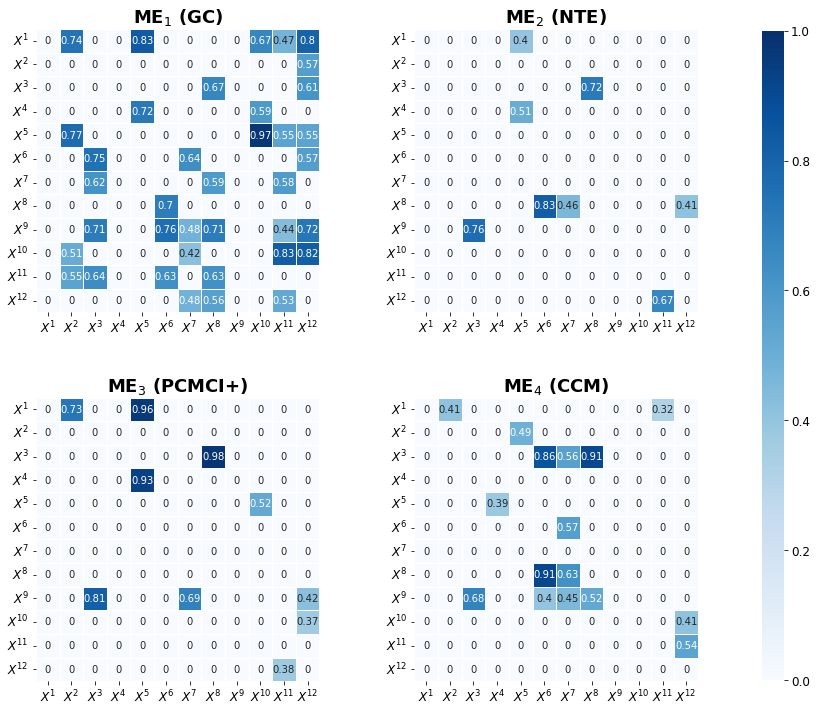

In [20]:
f, axes = plt.subplots(2, 2, figsize=(12,12))

f_1 = sns.heatmap(m_04, 
                  ax=axes[0][0], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names,
                  annot_kws={'size':10},
                  square=True,
                  annot=True)
f_1.set_xticklabels(f_1.get_xticklabels(), fontsize=12)
f_1.set_yticklabels(f_1.get_yticklabels(), rotation=0, fontsize=12)
f_1.set_title('$\mathbf{ME}_1$ (GC)', fontsize=18, fontweight='bold')

f_2 = sns.heatmap(m_02, 
                  ax=axes[0][1], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  annot_kws={'size':10},
                  square=True,
                  annot=True)
f_2.set_xticklabels(f_2.get_xticklabels(), fontsize=12)
f_2.set_yticklabels(f_2.get_yticklabels(), rotation=0, fontsize=12)
f_2.set_title('$\mathbf{ME}_2$ (NTE)', fontsize=18, fontweight='bold')

f_3 = sns.heatmap(m_03, 
                  ax=axes[1][0], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  annot_kws={'size':10},
                  square=True,
                  annot=True)
f_3.set_xticklabels(f_3.get_xticklabels(), fontsize=12)
f_3.set_yticklabels(f_3.get_yticklabels(), rotation=0, fontsize=12)
f_3.set_title('$\mathbf{ME}_3$ (PCMCI+)', fontsize=18, fontweight='bold')

cbar_ax = f.add_axes([.97, .126, .025, 0.752])
cax = plt.gcf().axes[-1]
cax.tick_params(labelsize=12)

f_4 = sns.heatmap(m_01, 
                  ax=axes[1][1], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar_ax=cbar_ax, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  annot_kws={'size':10},
                  square=True,
                  annot=True)
f_4.set_xticklabels(f_4.get_xticklabels(), fontsize=12)
f_4.set_yticklabels(f_4.get_yticklabels(), rotation=0, fontsize=12)
f_4.set_title('$\mathbf{ME}_4$ (CCM)', fontsize=18, fontweight='bold')

plt.subplots_adjust(wspace=0.3, hspace=0.3)

plt.savefig('C:/Users/zhipe/OneDrive/Desktop/Master thesis/codes/examples/results/Figure_4_12.jpg', 
            bbox_inches = 'tight',
            pad_inches=0.2,
            dpi=300)


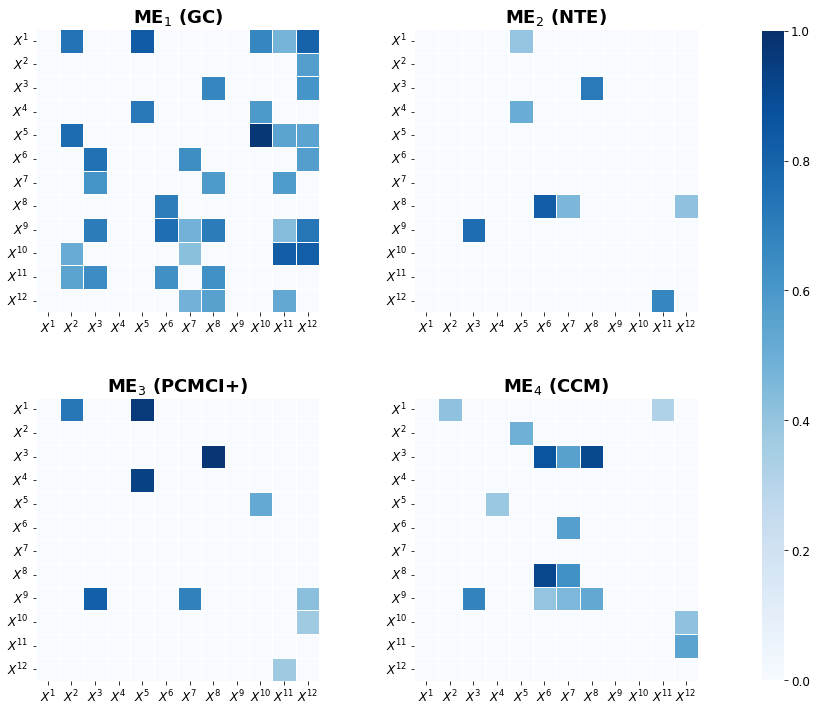

In [24]:
f, axes = plt.subplots(2, 2, figsize=(12,12))

f_1 = sns.heatmap(m_04, 
                  ax=axes[0][0], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names,
                  annot_kws={'size':10},
                  square=True,
                  annot=False)
f_1.set_xticklabels(f_1.get_xticklabels(), fontsize=12)
f_1.set_yticklabels(f_1.get_yticklabels(), rotation=0, fontsize=12)
f_1.set_title('$\mathbf{ME}_1$ (GC)', fontsize=18, fontweight='bold')

f_2 = sns.heatmap(m_02, 
                  ax=axes[0][1], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  annot_kws={'size':10},
                  square=True,
                  annot=False)
f_2.set_xticklabels(f_2.get_xticklabels(), fontsize=12)
f_2.set_yticklabels(f_2.get_yticklabels(), rotation=0, fontsize=12)
f_2.set_title('$\mathbf{ME}_2$ (NTE)', fontsize=18, fontweight='bold')

f_3 = sns.heatmap(m_03, 
                  ax=axes[1][0], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  annot_kws={'size':10},
                  square=True,
                  annot=False)
f_3.set_xticklabels(f_3.get_xticklabels(), fontsize=12)
f_3.set_yticklabels(f_3.get_yticklabels(), rotation=0, fontsize=12)
f_3.set_title('$\mathbf{ME}_3$ (PCMCI+)', fontsize=18, fontweight='bold')

cbar_ax = f.add_axes([.97, .126, .025, 0.752])
cax = plt.gcf().axes[-1]
cax.tick_params(labelsize=12)

f_4 = sns.heatmap(m_01, 
                  ax=axes[1][1], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar_ax=cbar_ax, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  annot_kws={'size':10},
                  square=True,
                  annot=False)
f_4.set_xticklabels(f_4.get_xticklabels(), fontsize=12)
f_4.set_yticklabels(f_4.get_yticklabels(), rotation=0, fontsize=12)
f_4.set_title('$\mathbf{ME}_4$ (CCM)', fontsize=18, fontweight='bold')

plt.subplots_adjust(wspace=0.3, hspace=0.3)


In [21]:
score = ce.evaluation()
print('Normalized_score:')
print(score)

Normalized_score:
0.8143939393939394


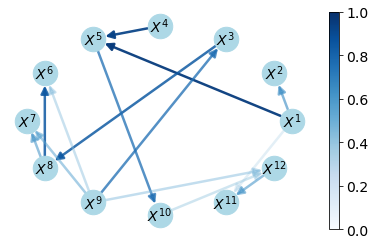

In [22]:
Graphic = causality_plotting(strength=strength_ensemble, 
                             feature_names=feature_names, 
                             #title='Example_1: Linear FakeData', 
                             name_size='short',
                             node_color="lightblue",
                             lay_out = "circular_layout",
                             node_size = 600,
                             title_size=16,
                             seed=0)
cax = plt.gcf().axes[-1]
cax.tick_params(labelsize=14)

plt.savefig('C:/Users/zhipe/OneDrive/Desktop/Master thesis/codes/examples/results/Figure_4_13.jpg', 
            bbox_inches = 'tight',
            pad_inches=0.2,
            dpi=300)


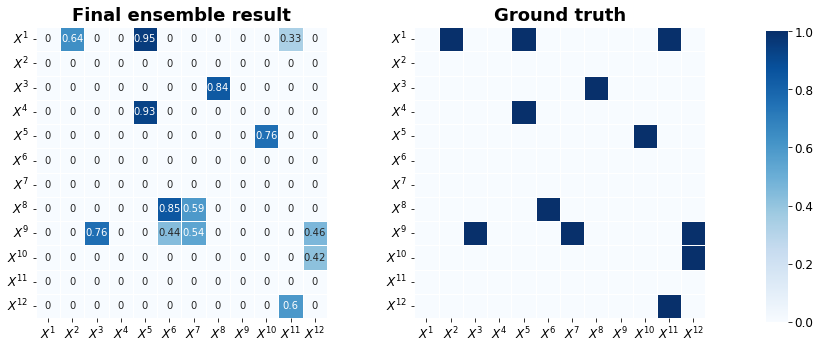

In [23]:
f_1, axes_1 = plt.subplots(1, 2, figsize=(12,12))
cbar_ax_1 = f_1.add_axes([.97, .33, .025, 0.336])

fig_0 = sns.heatmap(strength_ensemble, 
                    ax=axes_1[0], 
                    vmin=0, 
                    vmax=1, 
                    cmap='Blues', 
                    cbar=False, 
                    linewidths=.5, 
                    xticklabels=feature_names, 
                    yticklabels=feature_names, 
                    annot_kws={'size':10},
                    square=True,
                    annot=True)
fig_0.set_xticklabels(fig_0.get_xticklabels(), fontsize=12)
fig_0.set_yticklabels(fig_0.get_yticklabels(), rotation=0, fontsize=12)
fig_0.set_title('Final ensemble result', fontsize=18, fontweight='bold')

cax = plt.gcf().axes[-1]
cax.tick_params(labelsize=12)

fig_1 = sns.heatmap(result, 
                    ax=axes_1[1], 
                    vmin=0, 
                    vmax=1, 
                    cmap='Blues', 
                    cbar_ax=cbar_ax_1, 
                    linewidths=.5, 
                    xticklabels=feature_names, 
                    yticklabels=feature_names, 
                    square=True)
fig_1.set_xticklabels(fig_1.get_xticklabels(), fontsize=12)
fig_1.set_yticklabels(fig_1.get_yticklabels(), rotation=0, fontsize=12)
fig_1.set_title('Ground truth', fontsize=18, fontweight='bold')



plt.subplots_adjust(wspace=0.3)

plt.savefig('C:/Users/zhipe/OneDrive/Desktop/Master thesis/codes/examples/results/Figure_4_14.jpg', 
            bbox_inches = 'tight',
            pad_inches=0.2,
            dpi=300)

